Description This Code

- Sclaer : MinMax()

- Feature_Selection : Drop Soot , FNOX , FOXID, FSO4, ZN, V100

- XGB

(Optuna Tuning S-KFOLD
Best Trial: score 0.8292545137031471,<-m_F1
params {'max_depth': 10, 'learning_rate': 0.23720667234749193, 'n_estimators': 1100}

- LGB

hand-crafted paramter tuning
{'n_estimators':2000,'learning_rate':0.01, 'max_depth':13, 'n_jobs':-1,                 'boost_from_average':False}

- TH :0.23

-> 0.589653 (pub : 20)


#라이브러리 불러오기

In [ ]:
# 최적 파라미터를 범위내에서 찾아주는 라이브러리로써 캐글에서 인기 폭발이라고 한다.
!pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 348 kB 15.9 MB/s 
     |████████████████████████████████| 81 kB 5.2 MB/s 
     |████████████████████████████████| 209 kB 71.2 MB/s 
     |████████████████████████████████| 78 kB 4.0 MB/s 
     |████████████████████████████████| 147 kB 64.5 MB/s 
     |████████████████████████████████| 50 kB 3.2 MB/s 
     |████████████████████████████████| 112 kB 83.9 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11136 sha256=943f361faac4f72b2691049bc9a6a5558014ced12fab7784fbf2bed6ac1adaef
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [ ]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install lightgbm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install anaconda

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for anaconda: filename=anaconda-0.0.1.1-py3-none-any.whl size=1124 sha256=cbce2262eec5f0c8dcd4c1e35d3365574716f2cc117aed1a4e3797bc34bbc37d
  Stored in directory: /root/.cache/pip/wheels/70/29/df/a691ce9377d2b9b8ad2659144a1c4c51c216f2d8037b72dbc2
Successfully built anaconda


In [ ]:
pip install catboost

- profiling_tool (굳이 안해도됨.)

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import gc

plt.style.use('seaborn')
sns.set(font_scale=1)
plt.rc('font', family='NanumBarunGothic') 
plt.rcParams['font.family'] = 'NanumGothic'
#한글폰트

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
#구글드라이브연동

Mounted at /content/drive


In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf
#한글폰트 설치. 런타임재사용 필요

- 데이터불러오기. (경로설정해주기)

In [ ]:
train=pd.read_csv('/content/drive/MyDrive/DACON_Dataset/Hyundai_oil/train.csv')


In [ ]:
test=pd.read_csv('/content/drive/MyDrive/DACON_Dataset/Hyundai_oil/test.csv')

# dataframe 사이즈 줄이기.

In [ ]:
int64_col=list(train.columns[train.dtypes=='int64'])
float64_col=list(train.columns[train.dtypes=='float64'])

In [ ]:
# train_data size 줄이기. int64->int32
for i in int64_col :
  train[i]=train[i].astype('int32')
  

for i in float64_col : #float64 -> float32
  train[i]=train[i].astype('float32')
  

In [ ]:
int64_col=list(test.columns[test.dtypes=='int64'])
float64_col=list(test.columns[test.dtypes=='float64'])

In [ ]:
# test_data size 줄이기.
for i in int64_col :
  
  test[i]=test[i].astype('int32')

for i in float64_col :
  
  test[i]=test[i].astype('float32')

# 문자열 간단히 라벨링.

- 라벨인코더 사용. (ordinal_Encoder사용해도됨)

In [ ]:
cate_val = ['COMPONENT_ARBITRARY']
for i in cate_val :
  enc = LabelEncoder()
  enc=enc.fit(train[i])
  train[i]=enc.transform(train[i])
  for label in np.unique(test[i]):
        if label not in enc.classes_: 
            enc.classes_ = np.append(enc.classes_, label)
  test[i]=enc.transform(test[i]) # data leakage 주의

In [ ]:
train.COMPONENT_ARBITRARY.unique()

array(['COMPONENT3', 'COMPONENT2', 'COMPONENT1', 'COMPONENT4'],
      dtype=object)

#NAN 확인 (test셋에는 결측치가 없다.)

In [ ]:
train.isnull().sum()

ID                         0
COMPONENT_ARBITRARY        0
ANONYMOUS_1                0
YEAR                       0
SAMPLE_TRANSFER_DAY        0
ANONYMOUS_2                0
AG                         0
AL                         0
B                          0
BA                         0
BE                         0
CA                         0
CD                      1394
CO                         0
CR                         0
CU                         0
FH2O                   10205
FNOX                   10205
FOPTIMETHGLY           10205
FOXID                  10205
FSO4                   10205
FTBN                   10205
FE                         0
FUEL                   10205
H2O                        0
K                       2299
LI                         0
MG                         0
MN                         0
MO                         0
NA                         0
NI                         0
P                          0
PB                         0
PQINDEX       

# exp1) 결측치가 한컴포넌트를 제외한 모든 값인경우 특성을 제외시켜보기.

In [ ]:
exclude_col=train.columns[train.isnull().sum()> 10000]

train=train.drop(exclude_col,axis=1)


In [ ]:
train.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FE', 'H2O', 'K', 'LI', 'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB',
       'PQINDEX', 'S', 'SB', 'SI', 'SN', 'TI', 'V', 'V40', 'ZN', 'Y_LABEL'],
      dtype='object')

#exp1) 공선성제거하기.
(S FE 제거해보기.)

In [ ]:
temp1=temp.drop(['S','FE'],axis=1)

In [ ]:
temp.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FE', 'H2O', 'K', 'LI', 'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB',
       'PQINDEX', 'S', 'SB', 'SI', 'SN', 'TI', 'V', 'V40', 'ZN'],
      dtype='object')

# Component별 데이터 분리.

In [ ]:
comp0 = train[train['COMPONENT_ARBITRARY']==0]
comp1 = train[train['COMPONENT_ARBITRARY']==1]
comp2 = train[train['COMPONENT_ARBITRARY']==2]
comp3 = train[train['COMPONENT_ARBITRARY']==3]

print(comp0.shape, comp1.shape, comp2.shape,comp3.shape)

(3890, 37) (2316, 37) (7050, 37) (839, 37)


#EDA

In [ ]:
train=temp

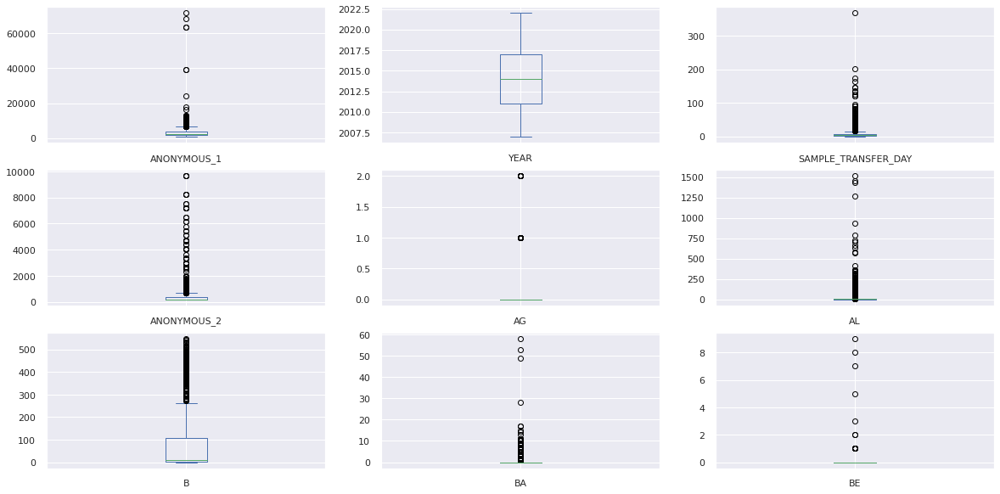

In [ ]:
comp0[['ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE']].plot(kind='box', subplots=True, layout=(3, 3), figsize=(20, 10))
plt.show()  

In [ ]:
def hist_draw(f_name,comp0):

  fig,axes=plt.subplots(1,2)
  plt.figure(figsize=(10,10))
  sns.histplot(comp0[comp0.Y_LABEL==0][f_name],ax=axes[0],bins=100,color='blue',stat='probability')
  sns.histplot(comp0[comp0.Y_LABEL==1][f_name],ax=axes[1],bins=100,color='red',stat='probability')

  #axes[0].set_xlim(0,2000)
  axes[0].set_title(f_name+'_normal')
  #axes[1].set_xlim(0,2000)
  axes[1].set_title( f_name+'_abnormal')


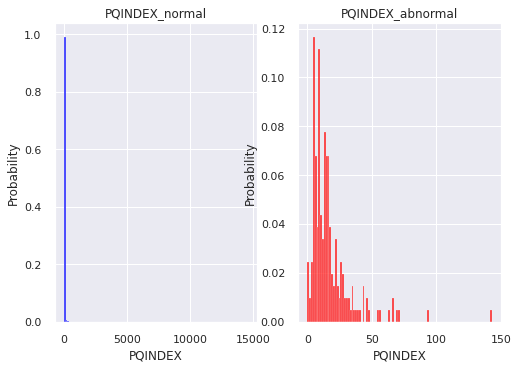

<Figure size 720x720 with 0 Axes>

In [ ]:
hist_draw('PQINDEX',comp1)

- 컴포넌트별로 분포를 띄어보자.

In [ ]:
train.COMPONENT_ARBITRARY.unique()

array([2, 1, 0, 3])

Text(0.5, 1.0, 'ANONYMOUS_1')

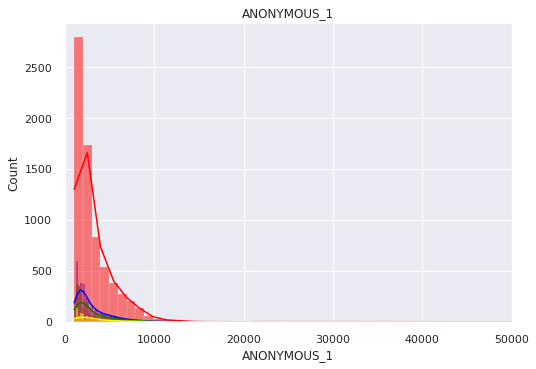

In [ ]:
fig, ax = plt.subplots()
sns.histplot(comp0.ANONYMOUS_1, ax=ax,kde=True,color='blue',bins=300) 
sns.histplot(comp1.ANONYMOUS_1, ax=ax,kde=True,color='green',bins=300)
sns.histplot(comp2.ANONYMOUS_1, ax=ax,kde=True,color='red',bins=300)
sns.histplot(comp3.ANONYMOUS_1, ax=ax,kde=True,color='yellow',bins=300)
ax.set_xlim(0,50000)
ax.set_title('ANONYMOUS_1')

Text(0.5, 1.0, 'ANONYMOUS_2')

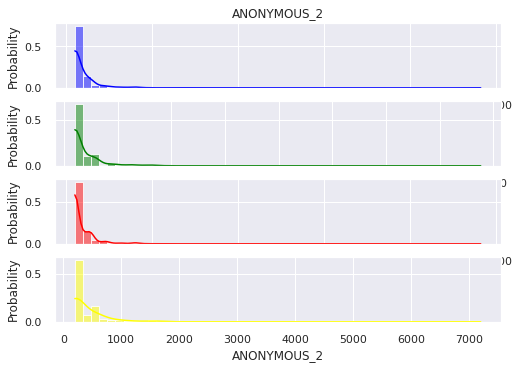

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.ANONYMOUS_2, ax=ax[0],kde=True,color='blue',bins=50,stat='probability') 
sns.histplot(comp1.ANONYMOUS_2, ax=ax[1],kde=True,color='green',bins=50,stat='probability')
sns.histplot(comp2.ANONYMOUS_2, ax=ax[2],kde=True,color='red',bins=50,stat='probability')
sns.histplot(comp3.ANONYMOUS_2, ax=ax[3],kde=True,color='yellow',bins=50,stat='probability')

ax[0].set_title('ANONYMOUS_2')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

Text(0.5, 1.0, 'AG')

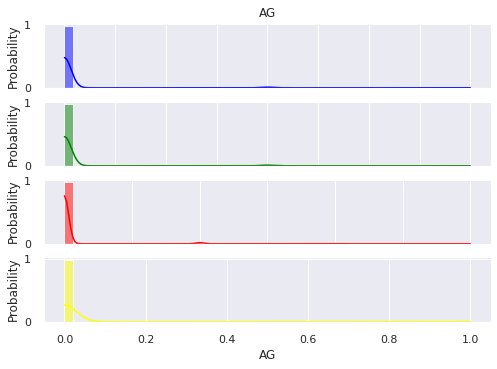

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.AG, ax=ax[0],kde=True,color='blue',bins=50,stat='probability') 
sns.histplot(comp1.AG, ax=ax[1],kde=True,color='green',bins=50,stat='probability')
sns.histplot(comp2.AG, ax=ax[2],kde=True,color='red',bins=50,stat='probability')
sns.histplot(comp3.AG, ax=ax[3],kde=True,color='yellow',bins=50,stat='probability')

ax[0].set_title('AG')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

Text(0.5, 1.0, 'CO')

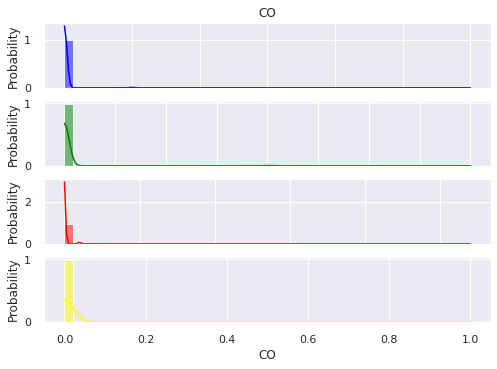

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.CO, ax=ax[0],kde=True,color='blue',bins=50,stat='probability') 
sns.histplot(comp1.CO, ax=ax[1],kde=True,color='green',bins=50,stat='probability')
sns.histplot(comp2.CO, ax=ax[2],kde=True,color='red',bins=50,stat='probability')
sns.histplot(comp3.CO, ax=ax[3],kde=True,color='yellow',bins=50,stat='probability')

ax[0].set_title('CO')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

Text(0.5, 1.0, 'CR')

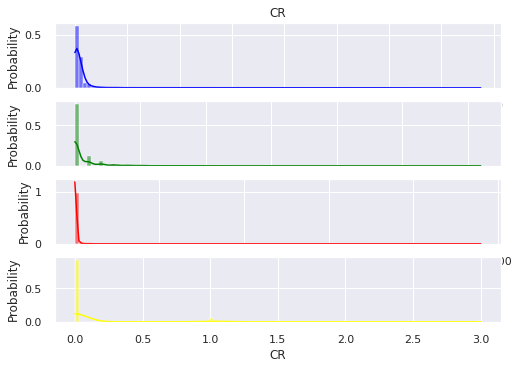

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.CR, ax=ax[0],kde=True,color='blue',bins=100,stat='probability') 
sns.histplot(comp1.CR, ax=ax[1],kde=True,color='green',bins=100,stat='probability')
sns.histplot(comp2.CR, ax=ax[2],kde=True,color='red',bins=100,stat='probability')
sns.histplot(comp3.CR, ax=ax[3],kde=True,color='yellow',bins=100,stat='probability')

ax[0].set_title('CR')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

In [ ]:
comp3.CR.value_counts()



0    777
1     51
2      7
3      4
Name: CR, dtype: int64

Text(0.5, 1.0, 'CU')

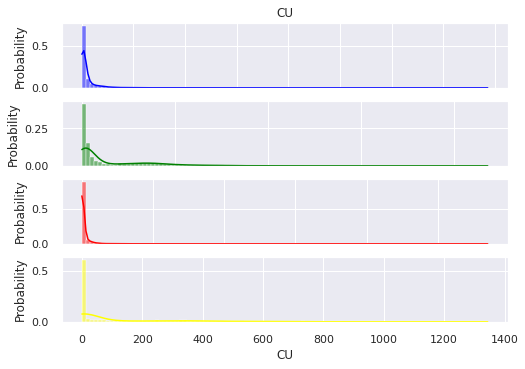

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.CU, ax=ax[0],kde=True,color='blue',bins=100,stat='probability') 
sns.histplot(comp1.CU, ax=ax[1],kde=True,color='green',bins=100,stat='probability')
sns.histplot(comp2.CU, ax=ax[2],kde=True,color='red',bins=100,stat='probability')
sns.histplot(comp3.CU, ax=ax[3],kde=True,color='yellow',bins=100,stat='probability')

ax[0].set_title('CU')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()
/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()
/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()


Text(0.5, 1.0, 'FOXID')

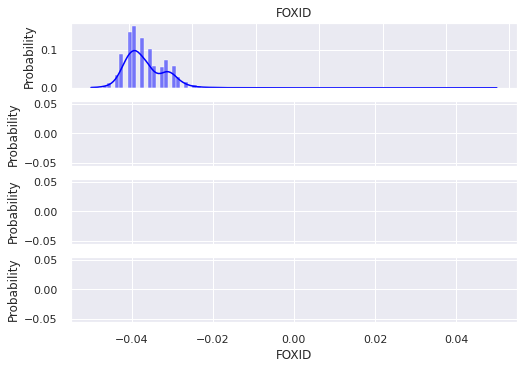

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.FOXID, ax=ax[0],kde=True,color='blue',bins=100,stat='probability') 
sns.histplot(comp1.FOXID, ax=ax[1],kde=True,color='green',bins=100,stat='probability')
sns.histplot(comp2.FOXID, ax=ax[2],kde=True,color='red',bins=100,stat='probability')
sns.histplot(comp3.FOXID, ax=ax[3],kde=True,color='yellow',bins=100,stat='probability')

ax[0].set_title('FOXID')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()
/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()
/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()


Text(0.5, 1.0, 'U100')

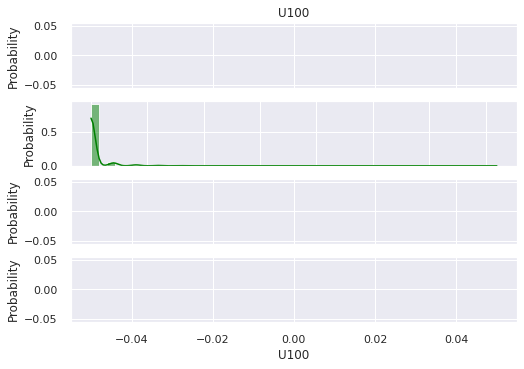

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.U100, ax=ax[0],kde=True,color='blue',bins=50,stat='probability') 
sns.histplot(comp1.U100, ax=ax[1],kde=True,color='green',bins=50,stat='probability')
sns.histplot(comp2.U100, ax=ax[2],kde=True,color='red',bins=50,stat='probability')
sns.histplot(comp3.U100, ax=ax[3],kde=True,color='yellow',bins=50,stat='probability')

ax[0].set_title('U100')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()
/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()
/usr/local/lib/python3.7/dist-packages/seaborn/_statistics.py:369: RuntimeWarning: invalid value encountered in true_divide
  hist = hist.astype(float) / hist.sum()


Text(0.5, 1.0, 'U14')

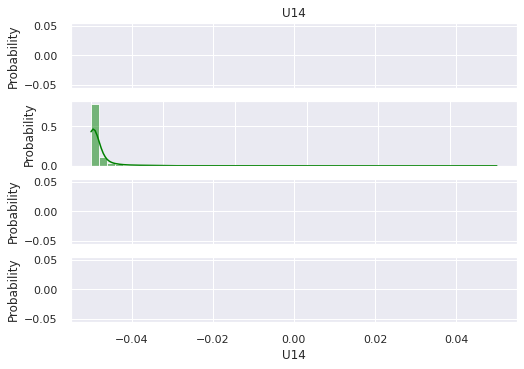

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.U14, ax=ax[0],kde=True,color='blue',bins=50,stat='probability') 
sns.histplot(comp1.U14, ax=ax[1],kde=True,color='green',bins=50,stat='probability')
sns.histplot(comp2.U14, ax=ax[2],kde=True,color='red',bins=50,stat='probability')
sns.histplot(comp3.U14, ax=ax[3],kde=True,color='yellow',bins=50,stat='probability')

ax[0].set_title('U14')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

In [ ]:
comp3.CD.isnull().sum()

79

Text(0.5, 1.0, 'CD')

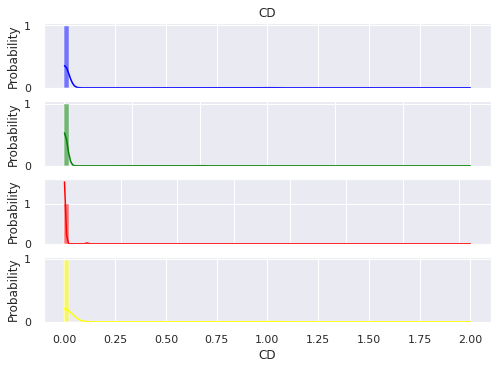

<Figure size 4320x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(60,20))
sns.histplot(comp0.CD, ax=ax[0],kde=True,color='blue',bins=100,stat='probability') 
sns.histplot(comp1.CD, ax=ax[1],kde=True,color='green',bins=100,stat='probability')
sns.histplot(comp2.CD, ax=ax[2],kde=True,color='red',bins=100,stat='probability')
sns.histplot(comp3.CD, ax=ax[3],kde=True,color='yellow',bins=100,stat='probability')

ax[0].set_title('CD')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

Text(0.5, 1.0, 'V40')

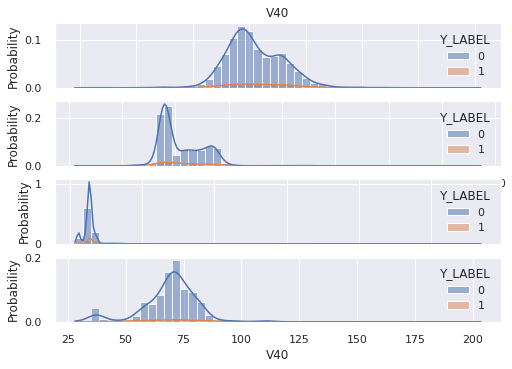

<Figure size 7200x2880 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(4,1)
plt.figure(figsize=(100,40))
sns.histplot(data=comp0,x='V40', ax=ax[0],kde=True,hue='Y_LABEL',bins=50,stat='probability')
sns.histplot(data=comp1,x='V40', ax=ax[1],kde=True,hue='Y_LABEL',bins=50,stat='probability')
sns.histplot(data=comp2,x='V40', ax=ax[2],kde=True,hue='Y_LABEL',bins=50,stat='probability')
sns.histplot(data=comp3,x='V40', ax=ax[3],kde=True,hue='Y_LABEL',bins=50,stat='probability')

ax[0].set_title('V40')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

각 컴포넌트별 사이즈 :

0(3890, 54) 1(2316, 54) 2(7050, 54) 3(839, 54)


FH2O                   10205-> 10205는 0번을 제외한 모든 컴포넌트

FNOX                   10205


FOPTIMETHGLY           10205


FOXID                  10205
FSO4                   10205


FTBN                   10205


FUEL                   10205

SOOTPERCENTAGE         10205


-> component 0을 제외한 나머지 component는 수집되지 않거나, 측정할 수 없는 지표로 추정.

0(3890, 54) 1(2316, 54) 2(7050, 54) 3(839, 54)


U100                   11779->1번 컴포넌트를 제외한 모든 컴포넌트


U75                    11779


U50                    11779


U25                    11779


U20                    11779


->11977은 컴포넌트 1에서의 결측값이다.
U14                    11977->(198개는 컴포넌트1안에서의 결측값이다.)


U6                     11977


U4                     11977



컴포넌트 0을 제외한 모든 컴포넌트가 결측이며, + 컴포넌트0에도 결측치가 미세하게 존재한다.

V100                   10371


그 외 모든 결측열 ( K, CD)는 모든 컴포넌트에 골고루 존재함.

Text(0.5, 1.0, 'U')

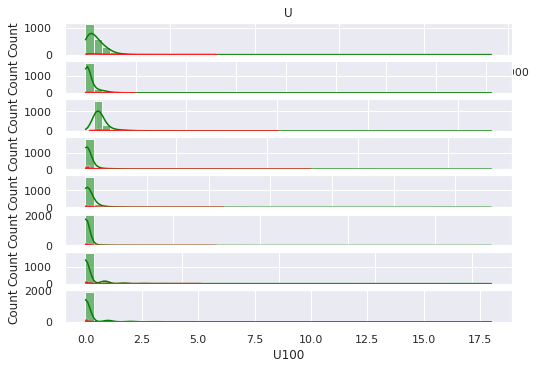

<Figure size 7200x1440 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(8,1)
plt.figure(figsize=(100,20))

sns.histplot(comp1[comp1.Y_LABEL==0].U4, ax=ax[0],kde=True,color='green',bins=50)
sns.histplot(comp1[comp1.Y_LABEL==1].U4, ax=ax[0],kde=True,color='red',bins=50)

sns.histplot(comp1[comp1.Y_LABEL==0].U6, ax=ax[1],kde=True,color='green',bins=50)
sns.histplot(comp1[comp1.Y_LABEL==1].U6, ax=ax[1],kde=True,color='red',bins=50)

sns.histplot(comp1[comp1.Y_LABEL==0].U14, ax=ax[2],kde=True,color='green',bins=50)
sns.histplot(comp1[comp1.Y_LABEL==1].U14, ax=ax[2],kde=True,color='red',bins=50)

sns.histplot(comp1[comp1.Y_LABEL==0].U20, ax=ax[3],kde=True,color='green',bins=50)
sns.histplot(comp1[comp1.Y_LABEL==1].U20, ax=ax[3],kde=True,color='red',bins=50)

sns.histplot(comp1[comp1.Y_LABEL==0].U25, ax=ax[4],kde=True,color='green',bins=50)
sns.histplot(comp1[comp1.Y_LABEL==1].U25, ax=ax[4],kde=True,color='red',bins=50)

sns.histplot(comp1[comp1.Y_LABEL==0].U50, ax=ax[5],kde=True,color='green',bins=50)
sns.histplot(comp1[comp1.Y_LABEL==1].U50, ax=ax[5],kde=True,color='red',bins=50)

sns.histplot(comp1[comp1.Y_LABEL==0].U75, ax=ax[6],kde=True,color='green',bins=50)
sns.histplot(comp1[comp1.Y_LABEL==1].U75, ax=ax[6],kde=True,color='red',bins=50)

sns.histplot(comp1[comp1.Y_LABEL==0].U100, ax=ax[7],kde=True,color='green',bins=50)
sns.histplot(comp1[comp1.Y_LABEL==1].U100, ax=ax[7],kde=True,color='red',bins=50)


ax[0].set_title('U')
#ax.set_xlim(0,10000)
#ax.set_title('ANONYMOUS_2')

# 컴포넌트별 특성별 박스플롯.

In [ ]:
def comp_boxplot(comp_list,f_name):
  fig, ax = plt.subplots(2,4)
  plt.figure(figsize=(200,300))
  for i,col in zip(range(0,4,1),['blue','green','red','yellow']):
    
    
    sns.boxplot(data=comp_list[i],y=f_name, ax=ax[0][i],color=col)

    ax[0][i].set_title('comp'+str(i)+'normal') 
  for i,col in zip(range(0,4,1),['blue','green','red','yellow']):

    
    
    sns.boxplot(data=comp_list[i],y=f_name, ax=ax[1][i],color=col)

    ax[1][i].set_title('comp'+str(i)+'abnormal') 




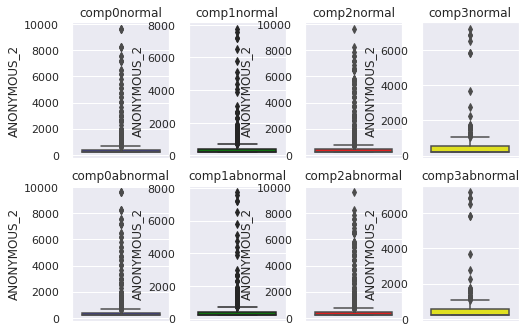

<Figure size 14400x21600 with 0 Axes>

In [ ]:
comp_list = [comp0,comp1,comp2,comp3]

comp_boxplot(comp_list,'ANONYMOUS_2')

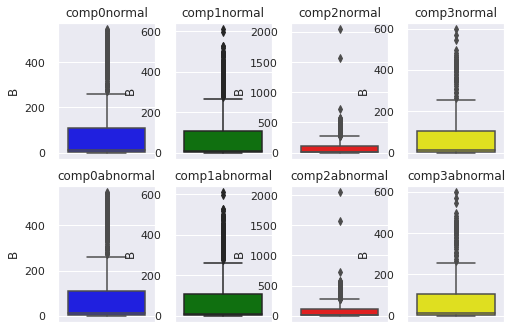

<Figure size 14400x21600 with 0 Axes>

In [ ]:
comp_boxplot(comp_list,'B')

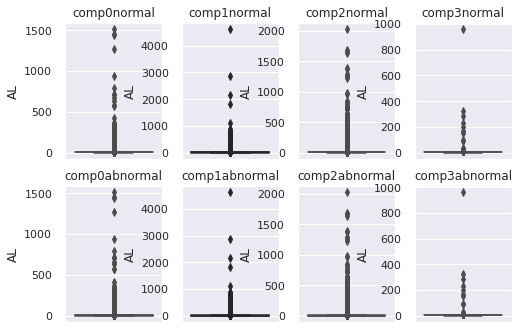

<Figure size 14400x21600 with 0 Axes>

In [ ]:
comp_boxplot(comp_list,'AL')

- 전체데이터셋에대한 eda

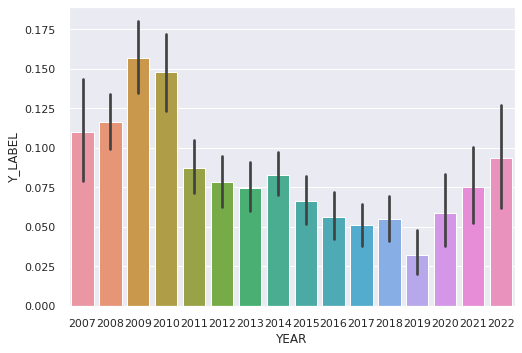

In [ ]:
sns.barplot(train.YEAR,train.Y_LABEL)

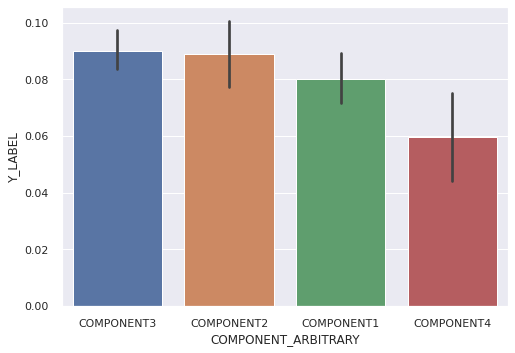

In [ ]:
sns.barplot(train.COMPONENT_ARBITRARY,train.Y_LABEL)

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:446: MatplotlibDeprecationWarning: The 'manage_xticks' parameter of boxplot() has been renamed 'manage_ticks' since Matplotlib 3.1; support for the old name will be dropped in 3.3.
  **kws)


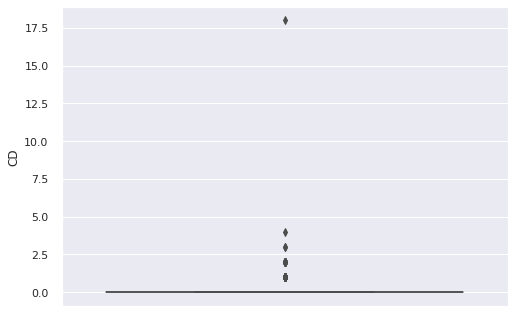

In [ ]:
sns.boxplot(y=train.CD,manage_xticks=False)

Text(0.5, 1.0, 'ANONYMOUS_1')

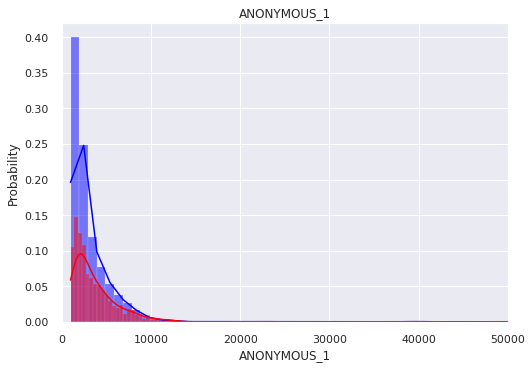

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train.ANONYMOUS_1, ax=ax,kde=True,color='blue',bins=300,stat='probability')  # distplot is deprecate and replaced by histplot
sns.histplot(train[train.Y_LABEL==1]['ANONYMOUS_1'],color='red', ax=ax,kde=True,bins=150,stat='probability')
ax.set_xlim(0,50000)
ax.set_title('ANONYMOUS_1')
#ax.set_xticks(range(1,32))

Text(0.5, 1.0, 'ANONYMOUS_2')

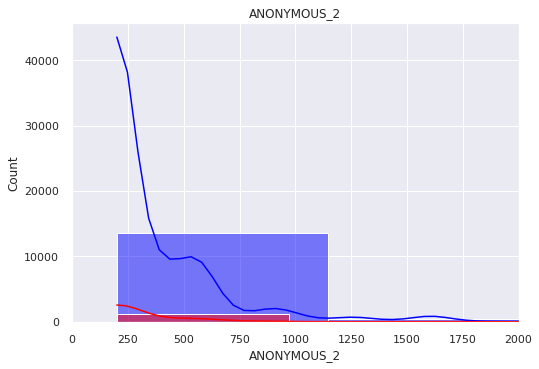

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train.ANONYMOUS_2, ax=ax,kde=True,color='blue',bins=10)  # distplot is deprecate and replaced by histplot
sns.histplot(train[train.Y_LABEL==1]['ANONYMOUS_2'],color='red', ax=ax,kde=True,bins=10)
ax.set_xlim(0,2000)
#ax.set_ylim(0,0.2)

ax.set_title('ANONYMOUS_2')
#ax.set_xticks(range(1,32))

- 비슷한 분포를 보이는 것으로 보아 별의미 없는 컬럼.

Text(0.5, 1.0, 'SAMPLE_TRANSFER_DAY')

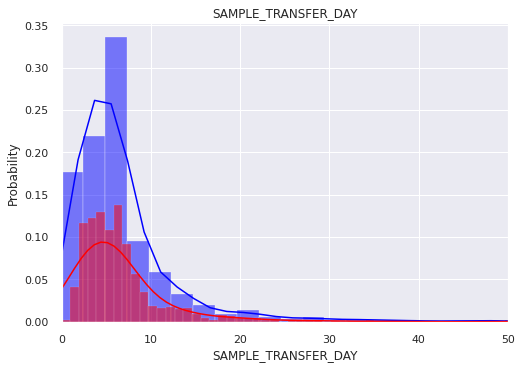

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train.SAMPLE_TRANSFER_DAY,color='blue', ax=ax,kde=True,bins=150,stat='probability')
sns.histplot(train[train.Y_LABEL==1]['SAMPLE_TRANSFER_DAY'],color='red', ax=ax,kde=True,bins=150,stat='probability')  
# distplot is deprecate and replaced by histplot
ax.set_xlim(0,50)
ax.set_title('SAMPLE_TRANSFER_DAY')

Text(0.5, 1.0, 'FH2O')

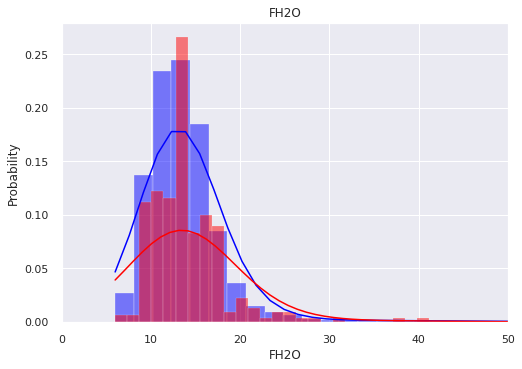

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train.FH2O,color='blue', ax=ax,kde=True,bins=150,stat='probability')
sns.histplot(train[train.Y_LABEL==1]['FH2O'],color='red', ax=ax,kde=True,bins=150,stat='probability')  
# distplot is deprecate and replaced by histplot
ax.set_xlim(0,50)
ax.set_title('FH2O')

Text(0.5, 1.0, 'FNOX')

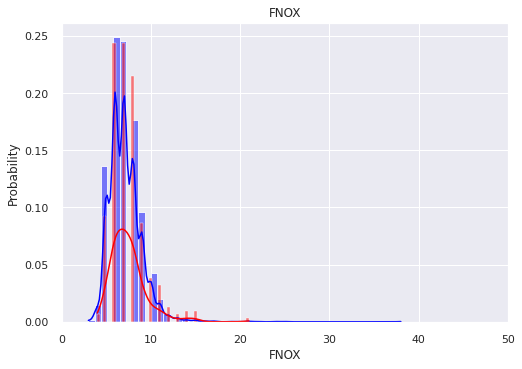

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train.FNOX,color='blue', ax=ax,kde=True,bins=50,stat='probability')
sns.histplot(train[train.Y_LABEL==1]['FNOX'],color='red', ax=ax,kde=True,bins=50,stat='probability')  
# distplot is deprecate and replaced by histplot
ax.set_xlim(0,50)
ax.set_title('FNOX')

- 최근에 점검했을수록 불량률 떨어진다.

Text(0.5, 1.0, 'YEAR')

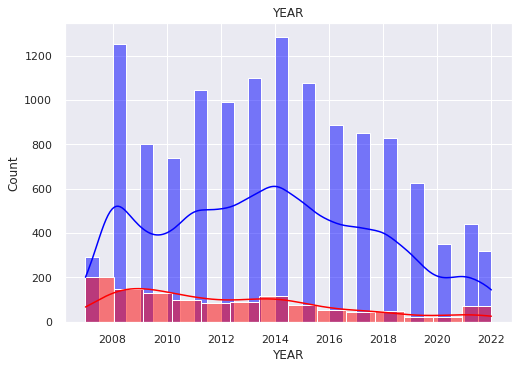

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train[train.Y_LABEL==0]['YEAR'], ax=ax,color='blue',kde=True)  
sns.histplot(train[train.Y_LABEL==1]['YEAR'],color='red', ax=ax,kde=True)  
# distplot is deprecate and replaced by histplot

ax.set_title('YEAR')

- CD는 수치가 낮으면 불량일 가능성 존재.

Text(0.5, 1.0, 'CD')

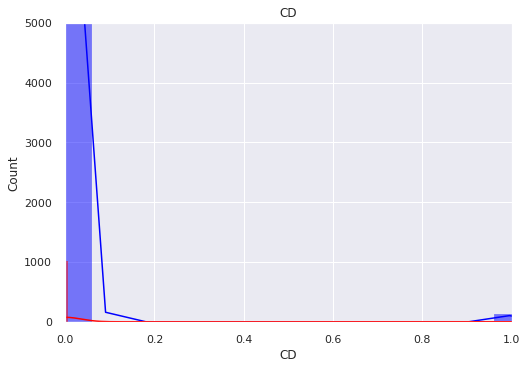

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train.CD, ax=ax,color='blue',kde=True,bins=300)  
sns.histplot(train[train.Y_LABEL==1]['CD'],color='red', ax=ax,kde=True,bins=300)  
# distplot is deprecate and replaced by histplot
ax.set_xlim(0,1.0)
ax.set_ylim(0,5000)

ax.set_title('CD')

In [ ]:
temp.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FNOX', 'FOPTIMETHGLY', 'FOXID', 'FSO4', 'FTBN', 'FE',
       'FUEL', 'H2O', 'K', 'LI', 'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB',
       'PQINDEX', 'S', 'SB', 'SI', 'SN', 'SOOTPERCENTAGE', 'TI', 'U100', 'U75',
       'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V', 'V100', 'V40', 'ZN',
       'Y_LABEL'],
      dtype='object')

Text(0.5, 1.0, 'AL')

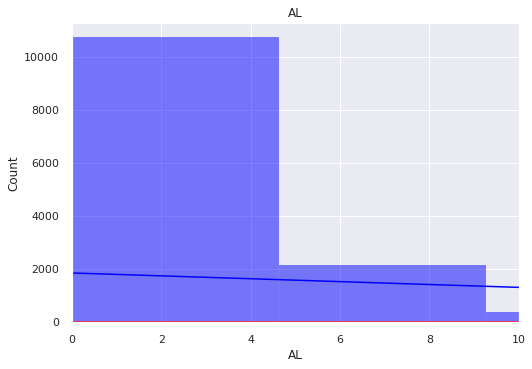

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train.AL, ax=ax,color='blue',kde=True,bins=1000)  
sns.histplot(train[train.Y_LABEL==1]['AL'],color='red', ax=ax,kde=True,bins=1000,stat='probability')  
# distplot is deprecate and replaced by histplot
ax.set_xlim(0,10)
#ax.set_ylim(0,5000)

ax.set_title('AL')

Text(0.5, 1.0, 'H2O')

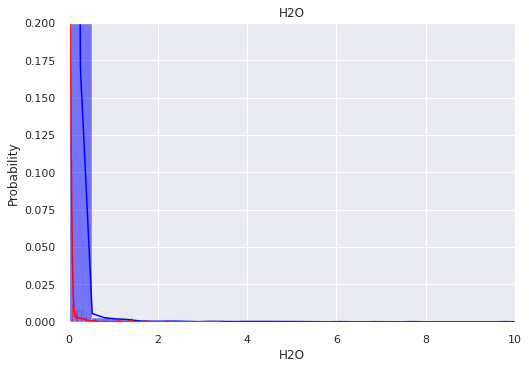

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train['H2O'], ax=ax,color='blue',kde=True,bins=100,stat='probability')  
sns.histplot(train[train.Y_LABEL==1]['H2O'],color='red', ax=ax,kde=True,bins=100,stat='probability')  
# distplot is deprecate and replaced by histplot
ax.set_xlim(0,10)
ax.set_ylim(0,0.2)

ax.set_title('H2O')

Text(0.5, 1.0, 'CR')

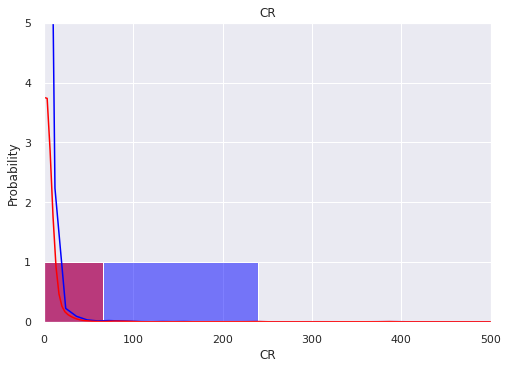

In [ ]:
fig, ax = plt.subplots()
sns.histplot(temp['CR'], ax=ax,color='blue',kde=True,bins=10,stat='probability')  
sns.histplot(temp[temp.Y_LABEL==1]['CR'],color='red', ax=ax,kde=True,bins=10,stat='probability')  
# distplot is deprecate and replaced by histplot
ax.set_xlim(0,500)
ax.set_ylim(0,5.0)

ax.set_title('CR')

Text(0.5, 1.0, 'AG')

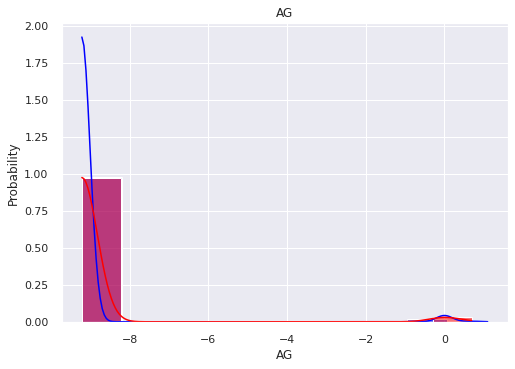

In [ ]:
fig, ax = plt.subplots()
sns.histplot(np.log(temp['AG']+0.0001), ax=ax,color='blue',kde=True,bins=10,stat='probability')  
sns.histplot(np.log(temp[temp.Y_LABEL==1]['AG']+0.0001),color='red', ax=ax,kde=True,bins=10,stat='probability')  
# distplot is deprecate and replaced by histplot
#ax.set_xlim(0,500)
#ax.set_ylim(0,5.0)

ax.set_title('AG')

Text(0.5, 1.0, 'SOOTPERCENTAGE')

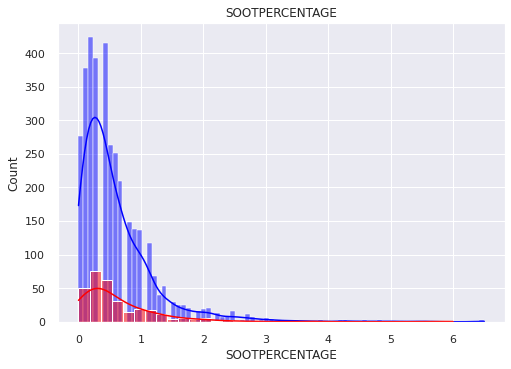

In [ ]:
fig, ax = plt.subplots()
sns.histplot(comp0[comp0.Y_LABEL==0]['SOOTPERCENTAGE'], ax=ax,color='blue',kde=True)  
sns.histplot(comp0[comp0.Y_LABEL==1]['SOOTPERCENTAGE'],color='red', ax=ax,kde=True)  
# distplot is deprecate and replaced by histplot

ax.set_title('SOOTPERCENTAGE')

Text(0.5, 1.0, 'V40')

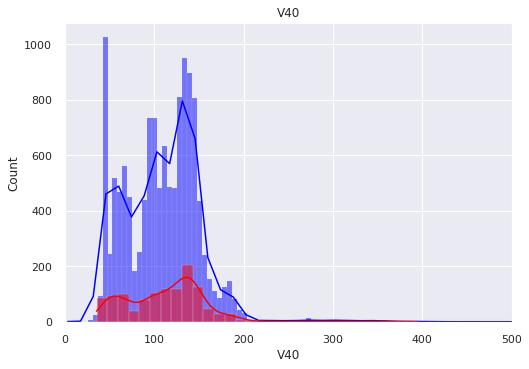

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train[train.Y_LABEL==0]['V40'], ax=ax,color='blue',kde=True)  
sns.histplot(train[train.Y_LABEL==1]['V40'],color='red', ax=ax,kde=True)  
# distplot is deprecate and replaced by histplot

ax.set_xlim(0,500)

ax.set_title('V40')

Text(0.5, 1.0, 'V100')

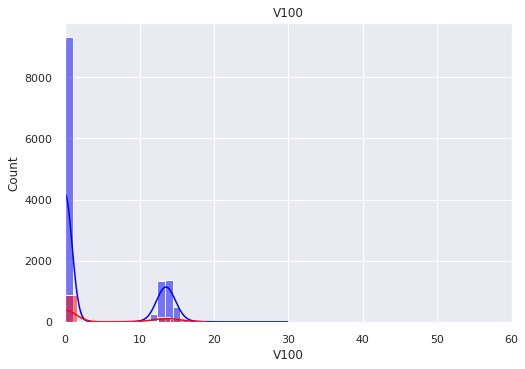

In [ ]:
fig, ax = plt.subplots()
sns.histplot(train[train.Y_LABEL==0]['V100'], ax=ax,color='blue',kde=True)  
sns.histplot(train[train.Y_LABEL==1]['V100'],color='red', ax=ax,kde=True)  
# distplot is deprecate and replaced by histplot

ax.set_xlim(0,60)

ax.set_title('V100')

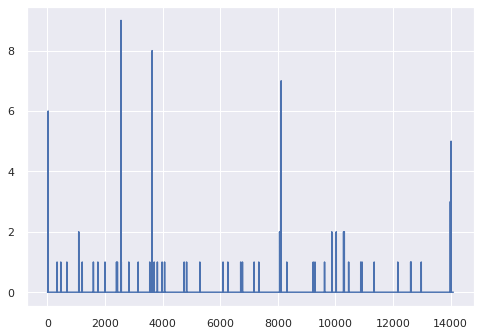

In [ ]:
train.BE.plot()

- 컬럼별 왜도확인

In [ ]:
int32_col=list(train.columns[train.dtypes=='int32'])
float32_col=list(train.columns[train.dtypes=='float32'])

In [ ]:
num_val=int32_col +float32_col

In [ ]:
tmp = ['YEAR','Y_LABEL']
num_val = [x for x in num_val if x not in tmp]

In [ ]:
test_num_col=list(test.columns[(test.columns !='YEAR') & (test.columns !='COMPONENT_ARBITRARY') ])

In [ ]:
from scipy.stats import skew, kurtosis,boxcox

skew_num_val=[]
for i in test_num_col:
  
  print(i," : ",skew((temp[i])))
  if abs(skew(temp[i]))>1:

    skew_num_val.append(i)



- 상관계수 분석 (다중공선성 제거를 위한)

In [ ]:
train.corr(method='pearson')

In [ ]:
train.corr()

,COMPONENT_ARBITRARY,ANONYMOUS_1,YEAR,SAMPLE_TRANSFER_DAY,ANONYMOUS_2,AG,AL,B,BA,BE,...,U25,U20,U14,U6,U4,V,V100,V40,ZN,Y_LABEL
COMPONENT_ARBITRARY,1.000000,0.020564,-0.001697,-0.012237,-0.000554,-0.000846,-0.000147,0.011580,0.002327,-0.023412,...,-0.043379,-0.043070,-0.049520,-0.050604,-0.066676,0.041598,-0.872231,0.225840,-0.542198,0.002703
ANONYMOUS_1,0.020564,1.000000,0.106546,-0.041395,0.072154,-0.025674,0.017924,0.013467,-0.064204,-0.010805,...,-0.009357,-0.010268,-0.013665,-0.008848,-0.007619,0.001883,-0.015025,0.019542,-0.019991,0.044197
YEAR,-0.001697,0.106546,1.000000,-0.094086,0.138199,-0.129124,-0.017525,0.011145,-0.098589,-0.063859,...,0.005424,-0.001902,-0.003238,0.008927,0.006055,-0.027624,0.005018,-0.051584,0.048572,-0.087871
SAMPLE_TRANSFER_DAY,-0.012237,-0.041395,-0.094086,1.000000,-0.000060,0.021211,-0.017493,0.004305,0.016909,0.009600,...,0.003158,0.006045,0.008503,0.002648,0.003042,-0.002412,0.007178,0.013896,-0.019428,-0.004315
ANONYMOUS_2,-0.000554,0.072154,0.138199,-0.000060,1.000000,-0.006266,-0.022788,-0.100307,-0.011871,0.011162,...,-0.001629,-0.002803,-0.004676,-0.006992,-0.005507,-0.006469,0.003786,-0.025339,0.032758,-0.033641
AG,-0.000846,-0.025674,-0.129124,0.021211,-0.006266,1.000000,0.019600,-0.028131,0.031649,0.020884,...,0.001875,0.001149,-0.004902,-0.005705,-0.004735,-0.003853,-0.001195,0.013592,0.002631,0.014671
AL,-0.000147,0.017924,-0.017525,-0.017493,-0.022788,0.019600,1.000000,0.000037,0.240863,-0.000858,...,0.003058,0.002697,0.007440,0.006249,0.002071,0.026213,-0.016567,0.013823,-0.024873,0.370512
B,0.011580,0.013467,0.011145,0.004305,-0.100307,-0.028131,0.000037,1.000000,-0.045454,-0.013252,...,-0.003540,-0.002488,0.000861,0.005503,0.000586,0.018197,-0.006290,-0.000882,-0.006463,-0.029787
BA,0.002327,-0.064204,-0.098589,0.016909,-0.011871,0.031649,0.240863,-0.045454,1.000000,0.029900,...,0.006589,0.008902,0.006651,0.001894,0.003661,0.000480,-0.009505,0.004150,-0.009574,0.104840
BE,-0.023412,-0.010805,-0.063859,0.009600,0.011162,0.020884,-0.000858,-0.013252,0.029900,1.000000,...,-0.004385,-0.004418,-0.004963,-0.004142,-0.002819,0.000482,0.023523,0.001359,0.012394,0.010685


In [ ]:
test.corr()

,COMPONENT_ARBITRARY,ANONYMOUS_1,YEAR,ANONYMOUS_2,AG,CO,CR,CU,FE,H2O,MN,MO,NI,PQINDEX,TI,V,V40,ZN
COMPONENT_ARBITRARY,1.000000,0.010591,-0.012645,0.017265,0.006482,0.056090,-0.001423,-0.054719,0.432719,0.080618,0.317968,-0.205108,0.217764,0.543296,0.151991,0.022360,0.298979,-0.492765
ANONYMOUS_1,0.010591,1.000000,0.212530,-0.154059,-0.039422,-0.021711,-0.046871,-0.030009,-0.040602,0.008918,-0.073218,-0.028336,-0.036899,-0.013931,-0.016119,-0.038432,-0.024955,0.003420
YEAR,-0.012645,0.212530,1.000000,0.168950,-0.130456,-0.108328,-0.234413,-0.186774,-0.164040,-0.009610,-0.220784,-0.167643,-0.193206,-0.117655,-0.045596,-0.087415,-0.089380,0.024167
ANONYMOUS_2,0.017265,-0.154059,0.168950,1.000000,0.037371,0.010489,-0.022638,0.029928,-0.009006,0.012345,0.011512,0.002440,0.010206,0.000677,-0.011613,0.015674,-0.023029,0.056394
AG,0.006482,-0.039422,-0.130456,0.037371,1.000000,0.018429,0.048075,0.037226,0.044344,0.010145,0.052496,0.035650,0.051165,0.032442,-0.008661,0.010198,0.034380,0.008332
CO,0.056090,-0.021711,-0.108328,0.010489,0.018429,1.000000,0.119869,0.073523,0.145276,0.087273,0.126478,0.070784,0.185326,0.125546,0.172310,0.339374,0.100381,-0.036903
CR,-0.001423,-0.046871,-0.234413,-0.022638,0.048075,0.119869,1.000000,0.179602,0.587784,0.149911,0.599980,0.185334,0.467292,0.422892,0.350247,0.162860,0.313450,-0.063765
CU,-0.054719,-0.030009,-0.186774,0.029928,0.037226,0.073523,0.179602,1.000000,0.091823,0.070841,0.230079,0.133143,0.251075,-0.032194,0.077908,0.090412,-0.238515,0.263239
FE,0.432719,-0.040602,-0.164040,-0.009006,0.044344,0.145276,0.587784,0.091823,1.000000,0.217846,0.728612,0.116363,0.537555,0.742570,0.428927,0.195662,0.542593,-0.306485
H2O,0.080618,0.008918,-0.009610,0.012345,0.010145,0.087273,0.149911,0.070841,0.217846,1.000000,0.151750,-0.007693,0.196920,0.163164,0.235247,0.120507,0.122962,-0.079077


In [ ]:
temp1=train.copy()

In [ ]:
temp1.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FOPTIMETHGLY', 'FTBN', 'FE', 'FUEL', 'H2O', 'K', 'LI',
       'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB', 'PQINDEX', 'S', 'SB', 'SI',
       'SN', 'TI', 'U100', 'U75', 'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V',
       'V40', 'Y_LABEL'],
      dtype='object')

In [ ]:
train.columns

num_val = [x for x in train.columns if x not in temp1.columns]

In [ ]:
num_val

['FNOX', 'FOXID', 'FSO4', 'SOOTPERCENTAGE', 'V100', 'ZN']

# Corr

In [ ]:
temp

,COMPONENT_ARBITRARY,ANONYMOUS_1,YEAR,SAMPLE_TRANSFER_DAY,ANONYMOUS_2,AG,AL,B,BA,BE,...,PQINDEX,S,SB,SI,SN,TI,V,V40,ZN,Y_LABEL
0,0.0,0.019588,2015.0,6.0,0.000000,0.0,0.000216,0.000488,0.000000,0.0,...,0.000088,0.059664,0.000000,0.000550,0.006920,0.0,0.0,0.033831,0.478424,0.0
1,0.0,0.003268,2008.0,5.0,0.000000,0.0,0.000216,0.002925,0.009259,0.0,...,0.000440,0.074607,0.019417,0.002198,0.013841,0.0,0.0,0.033373,0.549250,0.0
2,0.0,0.003680,2010.0,5.0,0.000000,0.0,0.000000,0.014627,0.000000,0.0,...,0.000176,0.057406,0.000000,0.001099,0.006920,0.0,0.0,0.038272,0.470450,0.0
3,0.0,0.003377,2008.0,7.0,0.000000,0.0,0.005616,0.015602,0.013889,0.0,...,0.000300,0.062032,0.009709,0.001649,0.006920,0.0,0.0,0.037461,0.586304,1.0
4,0.0,0.003554,2011.0,8.0,0.110370,0.0,0.000000,0.002925,0.000000,0.0,...,0.000229,0.057202,0.019417,0.001465,0.010381,0.0,0.0,0.028299,0.498593,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
834,3.0,0.001994,2009.0,24.0,0.000000,0.0,0.001512,0.096538,0.000000,0.0,...,0.000141,0.122072,0.000000,0.000916,0.000000,0.0,0.0,0.023541,0.522514,0.0
835,3.0,0.001264,2010.0,13.0,0.018201,0.0,0.000864,0.007314,0.000000,0.0,...,0.000247,0.109857,0.000000,0.001282,0.000000,0.0,0.0,0.026431,0.557223,0.0
836,3.0,0.002351,2009.0,9.0,0.000000,0.0,0.001296,0.070697,0.000000,0.0,...,0.000176,0.053360,0.000000,0.001099,0.000000,0.0,0.0,0.028228,0.507036,0.0
837,3.0,0.022535,2017.0,3.0,0.703704,0.0,0.000648,0.000975,0.000000,0.0,...,0.000229,0.059727,0.000000,0.000733,0.000000,0.0,0.0,0.023788,0.500000,0.0


In [ ]:
temp1 =temp.copy()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


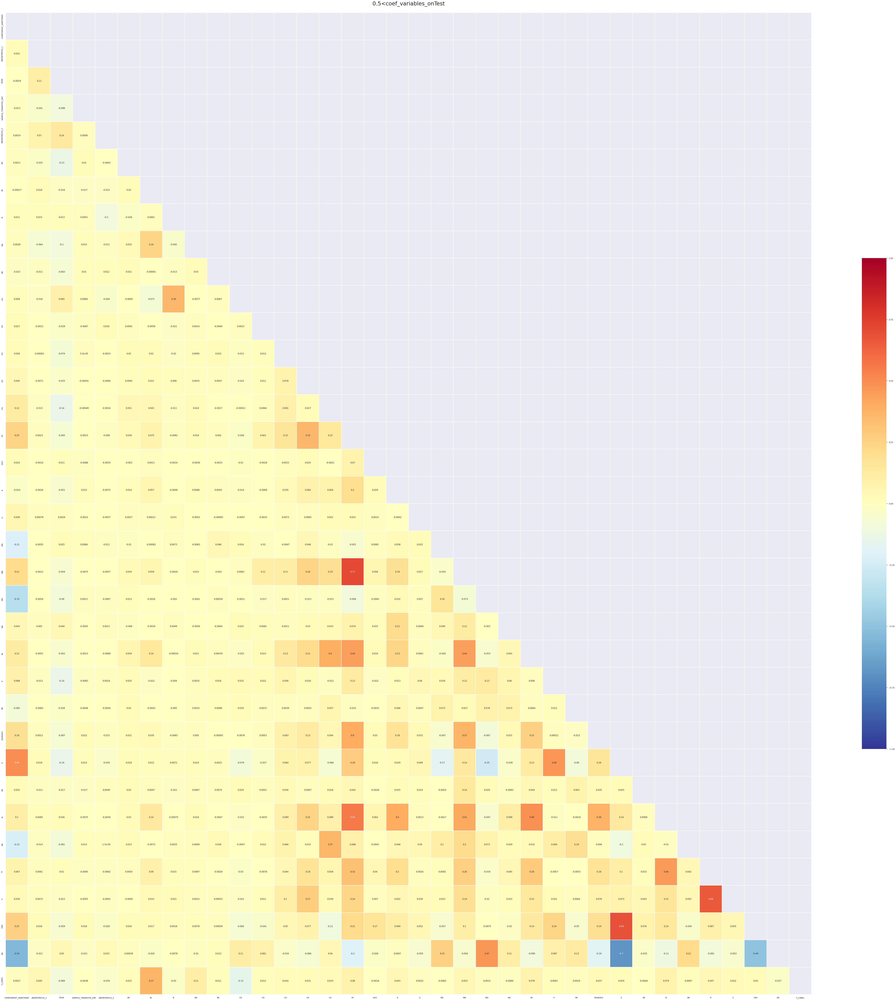

In [ ]:
data = temp.corr()
# 그림 사이즈 지정
fig, ax = plt.subplots( figsize=(100,100) )

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(data, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# 히트맵을 그린다
sns.heatmap(data, 
            cmap = 'RdYlBu_r', 
            annot = True,   # 실제 값을 표시한다
            mask=mask,      # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,  # 경계면 실선으로 구분하기
            cbar_kws={"shrink": .5},# 컬러바 크기 절반으로 줄이기
            vmin = -1,vmax = 1   # 컬러바 범위 -1 ~ 1
           )
plt.title('0.5<coef_variables_onTest\n',fontsize=30)  
plt.show()

In [ ]:
temp.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FOPTIMETHGLY', 'FTBN', 'FE', 'FUEL', 'H2O', 'K', 'LI',
       'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB', 'PQINDEX', 'S', 'SB', 'SI',
       'SN', 'TI', 'U100', 'U75', 'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V',
       'V40', 'Y_LABEL'],
      dtype='object')

In [ ]:
temp.drop(['V100','ZN'],axis=1,inplace=True)

In [ ]:
temp.drop('S',axis=1,inplace=True)

In [ ]:
temp.drop('V',axis=1,inplace=True) #,'S'

In [ ]:
test.drop(['ZN'],axis=1,inplace=True)

In [ ]:
test.drop(['V'],axis=1,inplace=True)

In [ ]:
temp.drop('MN',axis=1,inplace=True)

In [ ]:
test.drop(['MN'],axis=1,inplace=True)

In [ ]:
temp.drop(['SOOTPERCENTAGE'],axis=1,inplace=True)

In [ ]:
temp.drop('FNOX',axis=1,inplace=True)

In [ ]:
temp.drop('FOXID',axis=1,inplace=True)

In [ ]:
temp.drop('FSO4',axis=1,inplace=True)

결측치가 없는 Test셋에서는.

 - MN & FE ( 0.72)
 - NI & FE ( 0.59)
 - NI & CU ( 0.69)
 - NI & MN ( 0.54)
 - TI & MN ( 0.58)
 - V  & TI (0.73) 
 - FE & CO ( 0.59)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


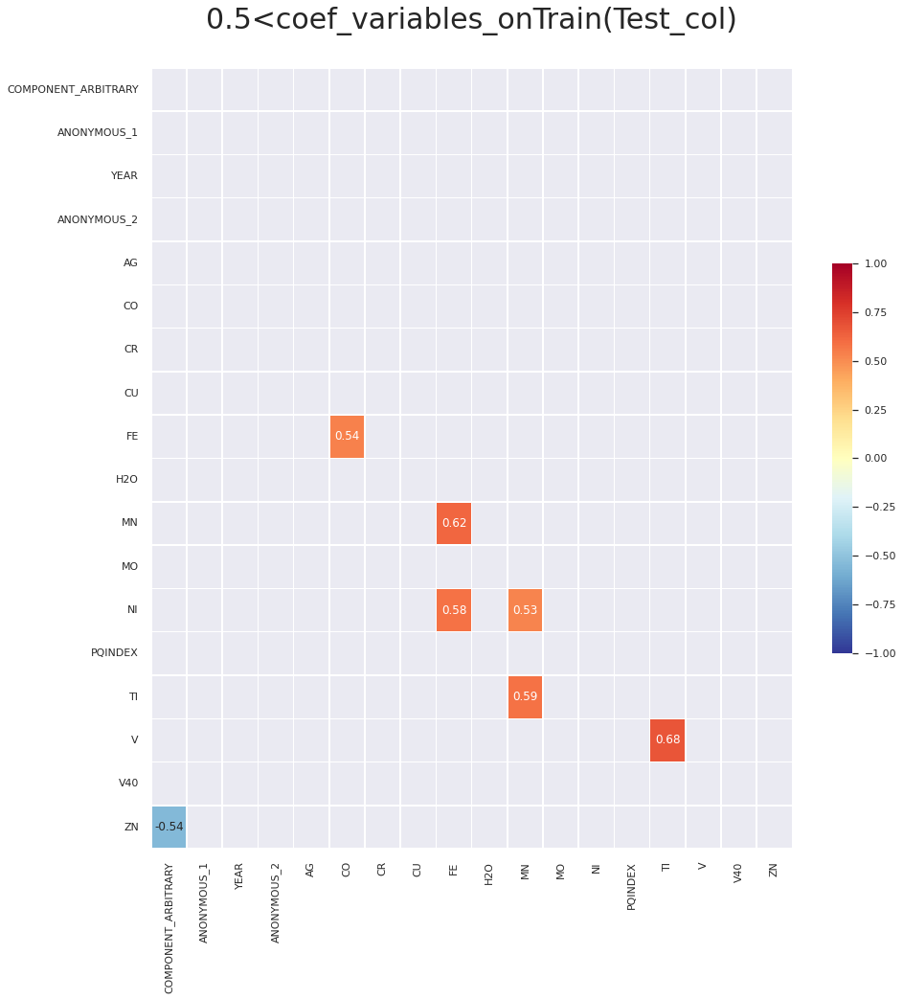

In [ ]:
data = train[test.columns].corr()
# 그림 사이즈 지정
fig, ax = plt.subplots( figsize=(15,15) )

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(data, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# 히트맵을 그린다
sns.heatmap(data[abs(data)>0.5], 
            cmap = 'RdYlBu_r', 
            annot = True,   # 실제 값을 표시한다
            mask=mask,      # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,  # 경계면 실선으로 구분하기
            cbar_kws={"shrink": .5},# 컬러바 크기 절반으로 줄이기
            vmin = -1,vmax = 1   # 컬러바 범위 -1 ~ 1
           )
plt.title('0.5<coef_variables_onTrain(Test_col)\n',fontsize=30)  
plt.show()

결측치가 있는 Train셋에서는.

 - MN & FE ( 0.62)
 - NI & FE ( 0.58)

 - NI & MN ( 0.53)
 - TI & MN ( 0.59)
 - V  & TI (0.68) 
 - FE & CO ( 0.54)

 

---
NI & CU 높은 상관관계가 사라짐.

-> 결측치를 제거 (iterative or knn) 한 후에
test분포와 비교해봄으로써, 합리적인 대체인지 확인한다. 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


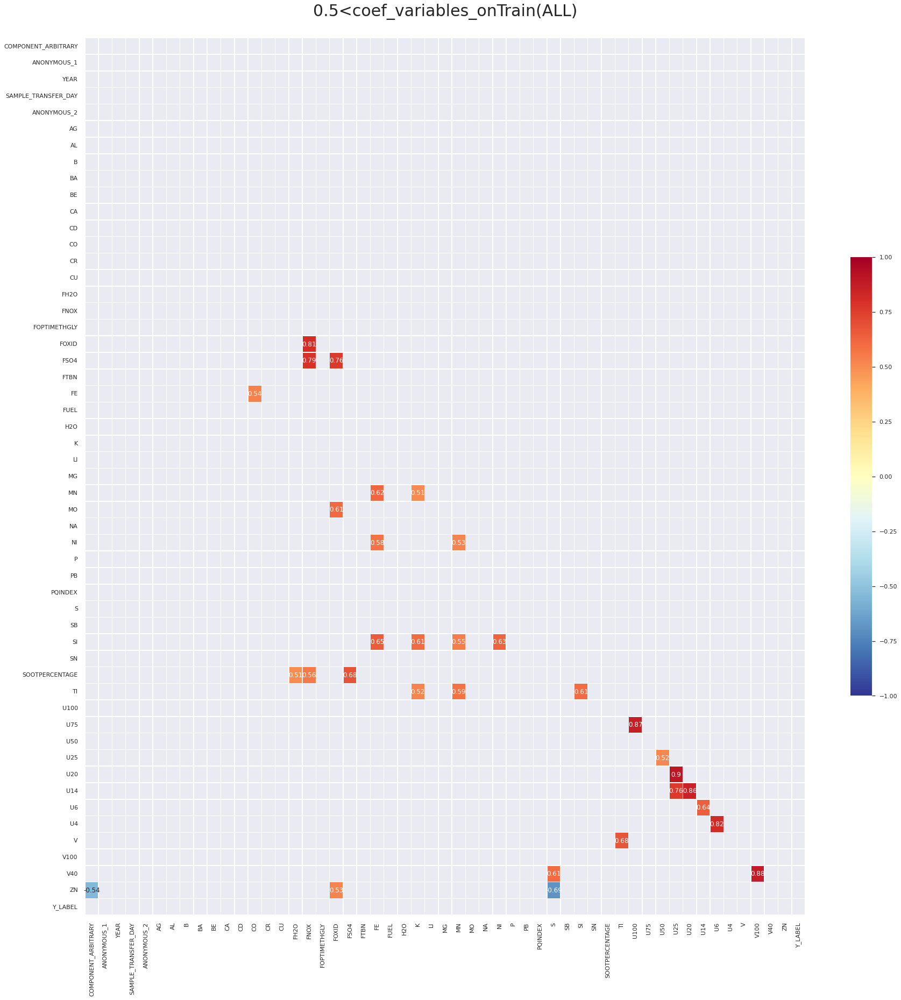

In [ ]:
data = train.corr()
# 그림 사이즈 지정
fig, ax = plt.subplots( figsize=(30,30) )

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(data, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# 히트맵을 그린다
sns.heatmap(data[abs(data)>0.5], 
            cmap = 'RdYlBu_r', 
            annot = True,   # 실제 값을 표시한다
            
            mask=mask,      # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,  # 경계면 실선으로 구분하기
            cbar_kws={"shrink": .5},# 컬러바 크기 절반으로 줄이기
            vmin = -1,vmax = 1   # 컬러바 범위 -1 ~ 1
           )
plt.title('0.5<coef_variables_onTrain(ALL)\n',fontsize=30)  
plt.show()

In [ ]:
print(train[train['COMPONENT_ARBITRARY']==3].isnull().sum())
train_c0=train[train['COMPONENT_ARBITRARY']==3]
print(train_c0.shape)

ID                       0
COMPONENT_ARBITRARY      0
ANONYMOUS_1              0
YEAR                     0
SAMPLE_TRANSFER_DAY      0
ANONYMOUS_2              0
AG                       0
AL                       0
B                        0
BA                       0
BE                       0
CA                       0
CD                      79
CO                       0
CR                       0
CU                       0
FH2O                   839
FNOX                   839
FOPTIMETHGLY           839
FOXID                  839
FSO4                   839
FTBN                   839
FE                       0
FUEL                   839
H2O                      0
K                      123
LI                       0
MG                       0
MN                       0
MO                       0
NA                       0
NI                       0
P                        0
PB                       0
PQINDEX                  0
S                        0
SB                       0
S

In [ ]:
train_c0[train_c0['Y_LABEL']==1].isnull().sum()

ID                       0
COMPONENT_ARBITRARY      0
ANONYMOUS_1              0
YEAR                     0
SAMPLE_TRANSFER_DAY      0
ANONYMOUS_2              0
AG                       0
AL                       0
B                        0
BA                       0
BE                       0
CA                       0
CD                      37
CO                       0
CR                       0
CU                       0
FH2O                   206
FNOX                   206
FOPTIMETHGLY           206
FOXID                  206
FSO4                   206
FTBN                   206
FE                       0
FUEL                   206
H2O                      0
K                       10
LI                       0
MG                       0
MN                       0
MO                       0
NA                       0
NI                       0
P                        0
PB                       0
PQINDEX                  0
S                        0
SB                       0
S

In [ ]:
train_c0.FH2O

1       NaN
2       NaN
15      NaN
16      NaN
27      NaN
         ..
14079   NaN
14085   NaN
14089   NaN
14093   NaN
14094   NaN
Name: FH2O, Length: 2316, dtype: float32

- Isolation_Forest를 통한 이상치 탐지.

In [ ]:
comp2

,COMPONENT_ARBITRARY,ANONYMOUS_1,YEAR,SAMPLE_TRANSFER_DAY,ANONYMOUS_2,AG,AL,B,BA,BE,...,U25,U20,U14,U6,U4,V,V100,V40,ZN,Y_LABEL
0,2.0,1486.0,2011.0,7.0,200.0,0.0,3.0,93.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,154.000000,75.0,0.0
1,2.0,7389.0,2010.0,2.0,200.0,0.0,8.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,133.300003,7.0,0.0
2,2.0,3954.0,2015.0,4.0,200.0,0.0,1.0,157.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,133.100006,128.0,0.0
3,2.0,2061.0,2008.0,4.0,550.0,0.0,3.0,8.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,69.699997,1015.0,0.0
4,2.0,1416.0,2015.0,7.0,616.0,0.0,0.0,21.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,148.500000,24.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7045,2.0,3060.0,2010.0,2.0,200.0,0.0,2.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,140.000000,35.0,1.0
7046,2.0,1637.0,2008.0,16.0,487.0,0.0,11.0,99.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,152.600006,21.0,1.0
7047,2.0,1311.0,2010.0,6.0,511.0,0.0,0.0,20.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,128.899994,20.0,0.0
7048,2.0,1616.0,2014.0,8.0,200.0,0.0,2.0,201.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,135.399994,16.0,0.0


In [ ]:
comp2

,COMPONENT_ARBITRARY,ANONYMOUS_1,YEAR,SAMPLE_TRANSFER_DAY,ANONYMOUS_2,AG,AL,B,BA,BE,...,U25,U20,U14,U6,U4,V,V100,V40,ZN,Y_LABEL
0,2.0,1486.0,2011.0,7.0,200.0,0.0,3.0,93.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,154.000000,75.0,0.0
1,2.0,7389.0,2010.0,2.0,200.0,0.0,8.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,133.300003,7.0,0.0
2,2.0,3954.0,2015.0,4.0,200.0,0.0,1.0,157.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,133.100006,128.0,0.0
3,2.0,2061.0,2008.0,4.0,550.0,0.0,3.0,8.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,69.699997,1015.0,0.0
4,2.0,1416.0,2015.0,7.0,616.0,0.0,0.0,21.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,148.500000,24.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7045,2.0,3060.0,2010.0,2.0,200.0,0.0,2.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,140.000000,35.0,1.0
7046,2.0,1637.0,2008.0,16.0,487.0,0.0,11.0,99.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,152.600006,21.0,1.0
7047,2.0,1311.0,2010.0,6.0,511.0,0.0,0.0,20.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,128.899994,20.0,0.0
7048,2.0,1616.0,2014.0,8.0,200.0,0.0,2.0,201.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,135.399994,16.0,0.0


# 결측치 처리하기.

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [ ]:
train.describe()

,COMPONENT_ARBITRARY,ANONYMOUS_1,YEAR,SAMPLE_TRANSFER_DAY,ANONYMOUS_2,AG,AL,B,BA,BE,...,U25,U20,U14,U6,U4,V,V100,V40,ZN,Y_LABEL
count,14095.000000,14095.000000,14095.000000,14095.000000,14095.000000,14095.000000,14095.000000,14095.000000,14095.000000,14095.000000,...,2316.000000,2316.000000,2118.000000,2118.000000,2118.000000,14095.000000,3724.000000,14095.000000,14095.000000,14095.000000
mean,1.343242,3146.082937,2013.652501,7.600568,387.416885,0.025825,12.707698,64.026179,0.692799,0.006314,...,29.870897,56.063473,239.938156,5488.692871,19415.595703,0.050656,13.576231,109.355820,588.646825,0.085349
std,0.946841,4216.089809,3.964758,11.681628,550.016073,0.171926,86.968000,102.876871,2.905491,0.152189,...,97.459625,184.332672,685.053467,15474.146484,40145.312500,0.475438,1.073718,49.612381,531.743393,0.279411
min,0.000000,1000.000000,2007.000000,0.000000,200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,15.000000,154.000000,0.000000,5.200000,2.900000,0.000000,0.000000
25%,0.000000,1655.000000,2010.000000,3.000000,200.000000,0.000000,1.000000,3.000000,0.000000,0.000000,...,3.000000,5.000000,22.000000,636.750000,5409.250000,0.000000,12.900000,71.800003,37.000000,0.000000
50%,2.000000,2227.000000,2014.000000,5.000000,200.000000,0.000000,2.000000,11.000000,0.000000,0.000000,...,7.000000,13.000000,57.000000,1753.000000,12691.500000,0.000000,13.500000,111.300003,520.000000,0.000000
75%,2.000000,3797.000000,2017.000000,8.000000,410.000000,0.000000,4.000000,110.000000,0.000000,0.000000,...,23.000000,39.250000,189.000000,5517.750000,24535.750000,0.000000,14.200000,137.199997,1119.000000,0.000000
max,3.000000,294451.000000,2022.000000,368.000000,9650.000000,3.000000,4630.000000,2051.000000,216.000000,9.000000,...,1651.000000,2932.000000,11296.000000,412627.000000,844421.000000,17.000000,29.900000,2840.500000,2132.000000,1.000000


- 간단한 샘플 결과제출을 위한 knn_imputer적용 

In [ ]:
train=train.drop('ID',axis=1) # 필요없는 ID제거.
test=test.drop('ID',axis=1)

- 좀더 합리적인 결측치처리가 필요함. 

In [ ]:
comp0=comp0.drop('ID',axis=1)
comp1=comp1.drop('ID',axis=1)
comp2=comp2.drop('ID',axis=1)
comp3=comp3.drop('ID',axis=1)

- knn_imputer

In [ ]:
zero_fill = ['FH2O','FNOX','FOXID','FSO4','FOPTIMETHGLY','FTBN','FUEL','SOOTPERCENTAGE','U100','U75','U50','U25','U20']
for i in zero_fill:
  
  comp0[i]=comp0[i].fillna(0)
  comp1[i]=comp1[i].fillna(0)
  comp2[i]=comp2[i].fillna(0)
  comp3[i]=comp3[i].fillna(0)


In [ ]:
zero_fill1=['U14','U6','U4']

for i in zero_fill1:
   comp0[i]=comp0[i].fillna(0)
   comp2[i]=comp2[i].fillna(0)
   comp3[i]=comp3[i].fillna(0)

  

In [ ]:
comp1['V100']=comp1['V100'].fillna(0)
comp2['V100']=comp2['V100'].fillna(0)
comp3['V100']=comp3['V100'].fillna(0)

In [ ]:
train.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FNOX', 'FOPTIMETHGLY', 'FOXID', 'FSO4', 'FTBN', 'FE',
       'FUEL', 'H2O', 'K', 'LI', 'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB',
       'PQINDEX', 'S', 'SB', 'SI', 'SN', 'SOOTPERCENTAGE', 'TI', 'U100', 'U75',
       'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V', 'V100', 'V40', 'ZN',
       'Y_LABEL'],
      dtype='object')

In [ ]:


imputer = KNNImputer(n_neighbors=2)
data_imputed=imputer.fit_transform(comp0)
comp0=pd.DataFrame(data_imputed)
comp0.columns=train.columns

imputer = KNNImputer(n_neighbors=2)
data_imputed=imputer.fit_transform(comp1)
comp1=pd.DataFrame(data_imputed)
comp1.columns=train.columns

imputer = KNNImputer(n_neighbors=2)
data_imputed=imputer.fit_transform(comp2)
comp2=pd.DataFrame(data_imputed)
comp2.columns=train.columns

imputer = KNNImputer(n_neighbors=2)
data_imputed=imputer.fit_transform(comp3)
comp3=pd.DataFrame(data_imputed)
comp3.columns=train.columns


temp=pd.concat([comp0,comp1,comp2,comp3])
temp

,COMPONENT_ARBITRARY,ANONYMOUS_1,YEAR,SAMPLE_TRANSFER_DAY,ANONYMOUS_2,AG,AL,B,BA,BE,...,PQINDEX,S,SB,SI,SN,TI,V,V40,ZN,Y_LABEL
0,0.0,6748.0,2015.0,6.0,200.0,0.0,1.0,1.0,0.0,0.0,...,5.0,4191.0,0.0,3.0,2.0,0.0,0.0,98.900002,1020.0,0.0
1,0.0,1959.0,2008.0,5.0,200.0,0.0,1.0,6.0,2.0,0.0,...,25.0,5144.0,2.0,12.0,4.0,0.0,0.0,97.599998,1171.0,0.0
2,0.0,2080.0,2010.0,5.0,200.0,0.0,0.0,30.0,0.0,0.0,...,10.0,4047.0,0.0,6.0,2.0,0.0,0.0,111.500000,1003.0,0.0
3,0.0,1991.0,2008.0,7.0,200.0,0.0,26.0,32.0,3.0,0.0,...,17.0,4342.0,1.0,9.0,2.0,0.0,0.0,109.199997,1250.0,1.0
4,0.0,2043.0,2011.0,8.0,1243.0,0.0,0.0,6.0,0.0,0.0,...,13.0,4034.0,2.0,8.0,3.0,0.0,0.0,83.199997,1063.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
834,3.0,1585.0,2009.0,24.0,200.0,0.0,7.0,198.0,0.0,0.0,...,8.0,8171.0,0.0,5.0,0.0,0.0,0.0,69.699997,1114.0,0.0
835,3.0,1371.0,2010.0,13.0,372.0,0.0,4.0,15.0,0.0,0.0,...,14.0,7392.0,0.0,7.0,0.0,0.0,0.0,77.900002,1188.0,0.0
836,3.0,1690.0,2009.0,9.0,200.0,0.0,6.0,145.0,0.0,0.0,...,10.0,3789.0,0.0,6.0,0.0,0.0,0.0,83.000000,1081.0,0.0
837,3.0,7613.0,2017.0,3.0,6850.0,0.0,3.0,2.0,0.0,0.0,...,13.0,4195.0,0.0,4.0,0.0,0.0,0.0,70.400002,1066.0,0.0


In [ ]:
temp.isnull().sum()

COMPONENT_ARBITRARY    0
ANONYMOUS_1            0
YEAR                   0
SAMPLE_TRANSFER_DAY    0
ANONYMOUS_2            0
AG                     0
AL                     0
B                      0
BA                     0
BE                     0
CA                     0
CD                     0
CO                     0
CR                     0
CU                     0
FH2O                   0
FNOX                   0
FOPTIMETHGLY           0
FOXID                  0
FSO4                   0
FTBN                   0
FE                     0
FUEL                   0
H2O                    0
K                      0
LI                     0
MG                     0
MN                     0
MO                     0
NA                     0
NI                     0
P                      0
PB                     0
PQINDEX                0
S                      0
SB                     0
SI                     0
SN                     0
SOOTPERCENTAGE         0
TI                     0


- YEAR , COMPONENT_ARBITRARY, Y_LABEL 
INT형으로 변환

In [ ]:
temp[['YEAR','COMPONENT_ARBITRARY','Y_LABEL']]=temp[['YEAR','COMPONENT_ARBITRARY','Y_LABEL']].astype('int')

In [ ]:
test[['YEAR','COMPONENT_ARBITRARY']]=test[['YEAR','COMPONENT_ARBITRARY']].astype('int')

- simple_imputer (중앙값 대치)

In [ ]:
from sklearn.impute import SimpleImputer

# 중간값으로 Imputer 선언
imputer_mid = SimpleImputer(strategy='median')
imputer_mid.fit(train)
data_imputed=imputer_mid.transform(train)
temp=pd.DataFrame(data_imputed)

- iterative_imputer

In [ ]:
imputer_it = IterativeImputer(max_iter = 30, random_state = 0)
data_imputed=imputer_it.fit_transform(train)
temp=pd.DataFrame(data_imputed)

/usr/local/lib/python3.7/dist-packages/sklearn/impute/_iterative.py:701: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  ConvergenceWarning,


# Isolation Forest

In [ ]:
from sklearn.ensemble import IsolationForest

In [ ]:
comp_list= [ comp0,comp1,comp2,comp3]
c_n0=comp0[comp0.Y_LABEL==0]
c_n1=comp1[comp1.Y_LABEL==0]
c_n2=comp2[comp2.Y_LABEL==0]
c_n3=comp3[comp3.Y_LABEL==0]

c_an0=comp0[comp0.Y_LABEL==1]
c_an1=comp1[comp1.Y_LABEL==1]
c_an2=comp2[comp2.Y_LABEL==1]
c_an3=comp3[comp3.Y_LABEL==1]

comp_normal =[c_n0,c_n1,c_n2,c_n3]
comp_abnormal =[c_an0,c_an1,c_an2,c_an3]


- 정상데이터 이상치 제거.

In [ ]:
for com in comp_normal:
  model=IsolationForest(n_estimators=400, max_samples='auto', n_jobs=-1,
                      max_features=2, contamination=0.01,random_state=6)
  model.fit(com.to_numpy())
  score = model.decision_function(com.to_numpy())
  anomaly = model.predict(com.to_numpy())
  
  com['anomaly']= anomaly
  anomaly_data = com.loc[com['anomaly']==-1] # 이상값은 -1으로 나타낸다.
  anomaly_data

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

In [ ]:
c_n0.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FNOX', 'FOPTIMETHGLY', 'FOXID', 'FSO4', 'FTBN', 'FE',
       'FUEL', 'H2O', 'K', 'LI', 'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB',
       'PQINDEX', 'S', 'SB', 'SI', 'SN', 'SOOTPERCENTAGE', 'TI', 'U100', 'U75',
       'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V', 'V100', 'V40', 'ZN',
       'Y_LABEL', 'anomaly'],
      dtype='object')

In [ ]:
c_n0=c_n0.drop(index=c_n0[c_n0['anomaly']==-1].index,axis=0)
c_n1=c_n1.drop(index=c_n1[c_n1['anomaly']==-1].index,axis=0)
c_n2=c_n2.drop(index=c_n2[c_n2['anomaly']==-1].index,axis=0)
c_n3=c_n3.drop(index=c_n3[c_n3['anomaly']==-1].index,axis=0)

In [ ]:
c_n0=c_n0.drop('anomaly',axis=1)
c_n1=c_n1.drop('anomaly',axis=1)
c_n2=c_n2.drop('anomaly',axis=1)
c_n3=c_n3.drop('anomaly',axis=1)

- 비정상데이터 이상치제거.

In [ ]:
for com in comp_abnormal:


  model=IsolationForest(n_estimators=400, max_samples='auto', n_jobs=-1,
                      max_features=2, contamination=0.01,random_state=3)
  model.fit(com.to_numpy())
  score = model.decision_function(com.to_numpy())
  anomaly = model.predict(com.to_numpy())
  
  com['anomaly']= anomaly
  anomaly_data = com.loc[com['anomaly']==-1] # 이상값은 -1으로 나타낸다.
  anomaly_data

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

In [ ]:
c_an0=c_an0.drop(index=c_an0[c_an0['anomaly']==-1].index,axis=0)
c_an1=c_an1.drop(index=c_an1[c_an1['anomaly']==-1].index,axis=0)
c_an2=c_an2.drop(index=c_an2[c_an2['anomaly']==-1].index,axis=0)
c_an3=c_an3.drop(index=c_an3[c_an3['anomaly']==-1].index,axis=0)

In [ ]:
c_an0=c_an0.drop('anomaly',axis=1)
c_an1=c_an1.drop('anomaly',axis=1)
c_an2=c_an2.drop('anomaly',axis=1)
c_an3=c_an3.drop('anomaly',axis=1)

In [ ]:
temp=pd.concat([c_n0,c_an0,c_n1,c_an1,c_n2,c_an2,c_n3,c_an3],axis=0)

In [ ]:
temp.isnull().sum()

COMPONENT_ARBITRARY    0
ANONYMOUS_1            0
YEAR                   0
SAMPLE_TRANSFER_DAY    0
ANONYMOUS_2            0
AG                     0
AL                     0
B                      0
BA                     0
BE                     0
CA                     0
CD                     0
CO                     0
CR                     0
CU                     0
FE                     0
H2O                    0
K                      0
LI                     0
MG                     0
MN                     0
MO                     0
NA                     0
NI                     0
P                      0
PB                     0
PQINDEX                0
S                      0
SB                     0
SI                     0
SN                     0
TI                     0
V                      0
V40                    0
ZN                     0
Y_LABEL                0
dtype: int64

In [ ]:
temp.shape

(13964, 36)

# Simple_profile ( x)

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(train)

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file(output_file="train_profiling.html") # html

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# U(입자크기관련 컬럼들 범위조정을 통한 공선성 없애기.)

In [ ]:
comp1.U4=comp1.U4-comp1.U6
comp1.U6=comp1.U6-comp1.U14
comp1.U14=comp1.U14-comp1.U20
comp1.U20=comp1.U20-comp1.U25
comp1.U25=comp1.U25-comp1.U50
comp1.U50=comp1.U50-comp1.U75
comp1.U75=comp1.U75-comp1.U100

#Scaling ( MinMax Scaler | Quantile| Power(BOXCOX)

- test데이터의 18개 컬럼에대한 스케일링을 먼저 진행

  - YEAR , COMPONENT_ARBITRARY는 스케일링 컬럼에서 제외시켜주기.

In [ ]:
temp.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FOPTIMETHGLY', 'FTBN', 'FE', 'FUEL', 'H2O', 'K', 'LI',
       'MG', 'MO', 'NA', 'NI', 'P', 'PB', 'PQINDEX', 'SB', 'SI', 'SN', 'TI',
       'U100', 'U75', 'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V40',
       'Y_LABEL'],
      dtype='object')

In [ ]:
test_num_col=list(test.columns[(test.columns !='YEAR') & (test.columns !='COMPONENT_ARBITRARY') ])

- train데이터의 51개 컬럼중 num컬럼만 가져오기. ( Y_LABEL , YEAR 제외시켜주기.)

In [ ]:
int32_col=list(train.columns[train.dtypes=='int32'])
float32_col=list(train.columns[train.dtypes=='float32'])

In [ ]:
num_val=int32_col +float32_col

In [ ]:
train_num_col = [x for x in num_val if x not in test_num_col]


In [ ]:
tmp = ['YEAR','Y_LABEL','SAMPLE_TRANSFER_DAY']
train_num_col = [x for x in num_val if x not in tmp]

-student test셋에 해당하는 num컬럼에 대해서 먼저 스케일링진행하기.

In [ ]:
#int64_col float64_col
# test에 해당하는 num열 스케일링.
#here
from sklearn.preprocessing import MinMaxScaler, PowerTransformer,StandardScaler

min_max=test_num_col
train_num = temp[min_max].copy()

test_num = test[min_max].copy()


scaler=MinMaxScaler()

scaler.fit(train_num)

train_num[min_max]=scaler.transform(train_num[min_max])



test_num[min_max]=scaler.transform(test_num[min_max]) # leakage 주의


temp[min_max] = train_num[min_max]
test[min_max] = test_num[min_max]  

In [ ]:
for i in test_num_col:
  print(i," : ",skew(temp[i]))
  print("test"," : ",skew(test[i]))

- Qunantile_transformer ( MinMax or Quanitle 중 고르는 것.)

In [ ]:
#int64_col float64_col
# test에 해당하는 num열 스케일링.

from sklearn.preprocessing import MinMaxScaler, StandardScaler,QuantileTransformer

min_max=test_num_col
train_num = temp[min_max].copy()

test_num = test[min_max].copy()


scaler=QuantileTransformer(n_quantiles=1000)

scaler.fit(train_num)

train_num[min_max]=scaler.transform(train_num[min_max])



test_num[min_max]=scaler.transform(test_num[min_max]) # leakage 주의


temp[min_max] = train_num[min_max]
test[min_max] = test_num[min_max]  

-teacher train셋에 해당하는 num컬럼에 대해서 스케일링진행하기.

In [ ]:
from sklearn.preprocessing import RobustScaler,QuantileTransformer, StandardScaler
#here
min_max=train_num_col
train_num = temp[min_max].copy()

scaler=MinMaxScaler()

scaler.fit(train_num)

train_num[min_max]=scaler.transform(train_num[min_max])


temp[min_max] = train_num[min_max]


- Qunantile_transformer

In [ ]:
#int64_col float64_col
# teacher_train에 해당하는 num열 스케일링.

from sklearn.preprocessing import MinMaxScaler, StandardScaler,QuantileTransformer

min_max=train_num_col
train_num = temp[min_max].copy()

scaler=QuantileTransformer(n_quantiles=1000) # 분위수는 조절가능.

scaler.fit(train_num)


train_num[min_max]=scaler.transform(train_num[min_max])


temp[min_max] = train_num[min_max]

In [ ]:
for i in train_num_col:
  print(i," : ",skew(temp[i]))
 

In [ ]:
temp.SAMPLE_TRANSFER_DAY = np.log(temp.SAMPLE_TRANSFER_DAY)

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


#Feature_Selection (model_based)

- 랜덤포레스트를 통한 특성중요도를 뽑아 넘파이 행렬 형태로 저장. (성능향상 x)

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
select = SelectFromModel(
    RandomForestClassifier(n_estimators=700,random_state=42),threshold='mean')


In [ ]:
y=temp['Y_LABEL']
temp=temp.drop('Y_LABEL',axis=1)
select.fit(temp,y)
f_temp=select.transform(temp)

f_temp.shape

(14095, 15)

#Feature_Selection (Based Corr)

In [ ]:
temp.drop(['V100','ZN'],axis=1,inplace=True)

In [ ]:
test.drop(['ZN'],axis=1,inplace=True)

In [ ]:
temp.drop(['SOOTPERCENTAGE'],axis=1,inplace=True)

In [ ]:
temp.drop('FNOX',axis=1,inplace=True)

In [ ]:
temp.drop('FOXID',axis=1,inplace=True)

In [ ]:
temp.drop('FSO4',axis=1,inplace=True)

In [ ]:
temp['U25low']= temp.U4 + temp.U6 + temp.U14+ temp.U25
temp['U25high']= temp.U25 + temp.U50 + temp.U75+ temp.U100

temp.drop(['U100', 'U75', 'U50', 'U25', 'U20', 'U14', 'U6', 'U4'],axis=1,inplace=True)

In [ ]:
temp.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FOPTIMETHGLY', 'FTBN', 'FE', 'FUEL', 'H2O', 'K', 'LI',
       'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB', 'PQINDEX', 'S', 'SB', 'SI',
       'SN', 'TI', 'U100', 'U75', 'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V',
       'V40'],
      dtype='object')

# LGBM Classifier or XGBOOST ( choose one!)

In [ ]:
temp.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FOPTIMETHGLY', 'FTBN', 'FE', 'FUEL', 'H2O', 'K', 'LI',
       'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB', 'PQINDEX', 'S', 'SB', 'SI',
       'SN', 'TI', 'U100', 'U75', 'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V',
       'V40', 'Y_LABEL'],
      dtype='object')

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score,f1_score,roc_auc_score,roc_curve

In [ ]:
import lightgbm as lgb
import xgboost as xgb
#import catboost as cb

- train 인덱스 재정의

In [ ]:
temp=temp1

In [ ]:
temp=temp.reset_index(drop=True)

In [ ]:
temp1.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'H2O', 'K', 'LI', 'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB',
       'PQINDEX', 'SB', 'SI', 'SN', 'TI', 'V', 'V40', 'ZN'],
      dtype='object')

- valid_set .2로 설정. (Hold_Out으로 일단 확인)
- K-Fold를 통해 평균을 냄으로써, 과적합 및 일반화 성능을 올려야함.

In [ ]:
test.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'ANONYMOUS_2', 'AG', 'CO',
       'CR', 'CU', 'FE', 'H2O', 'MN', 'MO', 'NI', 'PQINDEX', 'TI', 'V', 'V40',
       'ZN'],
      dtype='object')

In [ ]:
temp=temp.drop('SAMPLE_TRANSFER_DAY',axis=1)

- LGBM

- 카테고리컬 컬럼에 대해서 전처리.
(LGBM은 category 타입으로 지정해주면 categorical하게 처리한다.)

In [ ]:
temp[['YEAR','COMPONENT_ARBITRARY']]=temp[['YEAR','COMPONENT_ARBITRARY']].astype('category')

In [ ]:
test[['YEAR','COMPONENT_ARBITRARY']]=test[['YEAR','COMPONENT_ARBITRARY']].astype('category')

In [ ]:
temp.dtypes

- 아래쪽에 Optuna를 활용하여 파라미터튜닝을 간단히 할 수 있다. 

-> Optuna_Tuning(first_classification)

- xgboost와 lgbm마다 파라미터 튜닝이 다르기 때문에 params를 구글링을 통해 바꾸어서 실행할것.

- xgboost ( xgboost는 카테고리컬하게 처리하기 위해선, 원핫 인코딩이나 라벨링(int형변수)이여야함.

In [ ]:
temp[['COMPONENT_ARBITRARY', 'YEAR']] = temp[['COMPONENT_ARBITRARY', 'YEAR']].astype('int')
test[['COMPONENT_ARBITRARY', 'YEAR']] = test[['COMPONENT_ARBITRARY', 'YEAR']].astype('int')

In [ ]:
temp.Y_LABEL = temp.Y_LABEL.astype('int')

In [ ]:
y=temp['Y_LABEL']
temp=temp.drop('Y_LABEL',axis=1)
# train .8 valid .2
#x_train , x_valid , y_train, y_valid=train_test_split(temp,y,test_size=.2,stratify=y,random_state=5)

- 혼동행렬, 정확도(AC), 정밀도(PR), 재현율(RR), F1(MACRO), AUC 출력. 

In [ ]:
def get_clf_eval(y_test, y_pred=None, pred_proba=None):
    confusion = confusion_matrix(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    F1 = f1_score(y_test, y_pred)
    m_F1 = f1_score(y_test, y_pred,average='macro')
    AUC = roc_auc_score(y_test, pred_proba)

    print('오차행렬:\n', confusion)
    print('\n정확도: {:.4f}'.format(accuracy))
    print('정밀도: {:.4f}'.format(precision))
    print('재현율: {:.4f}'.format(recall))
    print('F1: {:.4f}'.format(F1))
    print('MACRO_F1: {:.4f}'.format(m_F1))
    print('AUC: {:.4f}'.format(AUC))

- stratified_kfold 적용하기. (o)
1. fold 별 optuna를 최적 파라미터를 찾고 val-set의 평균을 낸다. 
2. fold별 최적파라미터를 이용해 train셋을 예측하고 평균을 구한다.





'COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'SAMPLE_TRANSFER_DAY',
       'ANONYMOUS_2', 'AG', 'AL', 'B', 'BA', 'BE', 'CA', 'CD', 'CO', 'CR',
       'CU', 'FH2O', 'FOPTIMETHGLY', 'FTBN', 'FE', 'FUEL', 'H2O', 'K', 'LI',
       'MG', 'MN', 'MO', 'NA', 'NI', 'P', 'PB', 'PQINDEX', 'S', 'SB', 'SI',
       'SN', 'TI', 'U100', 'U75', 'U50', 'U25', 'U20', 'U14', 'U6', 'U4', 'V',
       'V40' 
       
       Drop) 'FNOX', 'FOXID', 'FSO4', 'ZN', 'V100' 'SOOTPERCENTAGE'

In [ ]:
from sklearn.model_selection import StratifiedKFold

# split 개수, 셔플 여부 및 seed 설정
model_history=[]
str_kf = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 50)
f_score=[]
train_proba=[]
train_pred=[]
# split 개수 스텝 만큼 train, test 데이터셋을 매번 분할
for train_index, test_index in str_kf.split(temp,y):
    x_train, x_valid = temp.iloc[train_index], temp.iloc[test_index]
    y_train, y_valid = y.iloc[train_index], y.iloc[test_index]
    optuna_cbrm = optuna.create_study(direction='maximize', sampler=sampler)
    optuna_cbrm.optimize(objective, n_trials=20)
    cbrm_trial = optuna_cbrm.best_trial
    cbrm_trial_params = cbrm_trial.params

    clf = xgb.XGBClassifier(**cbrm_trial.params,use_missing=False,boost_from_average=False)
    clf.fit(x_train,y_train,eval_set=[(x_valid,y_valid)],early_stopping_rounds=200,verbose=True)

    # valid_set 성능 및 student_set 예측하기.
    val_pred=clf.predict(x_valid)
    val_proba=clf.predict_proba(x_valid)[:,1]
    f_score.append(f1_score(y_valid, val_pred))
    train_proba.append(clf.predict_proba(temp)[:,1])
    train_pred.append(clf.predict(temp))
    get_clf_eval(y_valid,val_pred,val_proba)

print('S-KFold f1score mean : ' ,np.mean(f_score))
train_p=pd.DataFrame(np.mean(train_proba,axis=0))
train_p


[I 2022-11-28 17:13:04,468] A new study created in memory with name: no-name-aa0044f1-31a6-4942-b5b9-e8c27ba9e52c


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05655
[2]	validation_0-error:0.055834
[3]	validation_0-error:0.055118
[4]	validation_0-error:0.055118
[5]	validation_0-error:0.055118
[6]	validation_0-error:0.055118
[7]	validation_0-error:0.055118
[8]	validation_0-error:0.055834
[9]	validation_0-error:0.055118
[10]	validation_0-error:0.055834
[11]	validation_0-error:0.055834
[12]	validation_0-error:0.055118
[13]	validation_0-error:0.055834
[14]	validation_0-error:0.05655
[15]	validation_0-error:0.057266
[16]	validation_0-error:0.05655
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.055834
[19]	validation_0-error:0.05655
[20]	validation_0-error:0.05655
[21]	validation_0-error:0.05655
[22]	validation_0-error:0.05655
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.055118
[25]	validation_0-error:0.055834
[26]	validation_0-error:0.055118
[27]	validation_0-error:0.053686
[28]	validation_0-error:0.

[I 2022-11-28 17:13:06,568] Trial 0 finished with value: 0.5875706214689266 and parameters: {'max_depth': 6, 'learning_rate': 0.16072834926321483, 'n_estimators': 700}. Best is trial 0 with value: 0.5875706214689266.


[0]	validation_0-error:0.062992
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05655
[2]	validation_0-error:0.057981
[3]	validation_0-error:0.05655
[4]	validation_0-error:0.05655
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.057981
[7]	validation_0-error:0.057981
[8]	validation_0-error:0.057266
[9]	validation_0-error:0.057266
[10]	validation_0-error:0.057266
[11]	validation_0-error:0.057981
[12]	validation_0-error:0.057981
[13]	validation_0-error:0.057981
[14]	validation_0-error:0.057266
[15]	validation_0-error:0.057981
[16]	validation_0-error:0.05655
[17]	validation_0-error:0.05655
[18]	validation_0-error:0.057266
[19]	validation_0-error:0.05655
[20]	validation_0-error:0.05655
[21]	validation_0-error:0.05655
[22]	validation_0-error:0.055118
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.055834
[25]	validation_0-error:0.05655
[26]	validation_0-error:0.05655
[27]	validation_0-error:0.05655
[28]	validation_0-error:0.0565

[I 2022-11-28 17:13:08,831] Trial 1 finished with value: 0.5921787709497207 and parameters: {'max_depth': 7, 'learning_rate': 0.14674078351053954, 'n_estimators': 700}. Best is trial 1 with value: 0.5921787709497207.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05655
[2]	validation_0-error:0.055118
[3]	validation_0-error:0.055834
[4]	validation_0-error:0.055834
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.05655
[7]	validation_0-error:0.05655
[8]	validation_0-error:0.05655
[9]	validation_0-error:0.057266
[10]	validation_0-error:0.057266
[11]	validation_0-error:0.057266
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.055834
[14]	validation_0-error:0.055118
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.055118
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.055834
[19]	validation_0-error:0.055118
[20]	validation_0-error:0.055118
[21]	validation_0-error:0.055118
[22]	validation_0-error:0.05655
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.055834
[25]	validation_0-error:0.054402
[26]	validation_0-error:0.054402
[27]	validation_0-error:0.054402
[28]	validation_0-error:0

[I 2022-11-28 17:13:10,831] Trial 2 finished with value: 0.6054054054054054 and parameters: {'max_depth': 6, 'learning_rate': 0.2780648161255287, 'n_estimators': 2000}. Best is trial 2 with value: 0.6054054054054054.


[0]	validation_0-error:0.067287
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.062992
[2]	validation_0-error:0.059413
[3]	validation_0-error:0.05655
[4]	validation_0-error:0.055834
[5]	validation_0-error:0.055118
[6]	validation_0-error:0.055834
[7]	validation_0-error:0.055118
[8]	validation_0-error:0.054402
[9]	validation_0-error:0.054402
[10]	validation_0-error:0.054402
[11]	validation_0-error:0.054402
[12]	validation_0-error:0.054402
[13]	validation_0-error:0.054402
[14]	validation_0-error:0.054402
[15]	validation_0-error:0.054402
[16]	validation_0-error:0.053686
[17]	validation_0-error:0.053686
[18]	validation_0-error:0.053686
[19]	validation_0-error:0.054402
[20]	validation_0-error:0.053686
[21]	validation_0-error:0.052971
[22]	validation_0-error:0.052971
[23]	validation_0-error:0.052971
[24]	validation_0-error:0.052971
[25]	validation_0-error:0.053686
[26]	validation_0-error:0.053686
[27]	validation_0-error:0.053686
[28]	validation_0-er

[I 2022-11-28 17:13:13,728] Trial 3 finished with value: 0.6033519553072626 and parameters: {'max_depth': 12, 'learning_rate': 0.1621205835552658, 'n_estimators': 1300}. Best is trial 2 with value: 0.6054054054054054.


[0]	validation_0-error:0.062992
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.055834
[2]	validation_0-error:0.05655
[3]	validation_0-error:0.05655
[4]	validation_0-error:0.057266
[5]	validation_0-error:0.057981
[6]	validation_0-error:0.057981
[7]	validation_0-error:0.057266
[8]	validation_0-error:0.057266
[9]	validation_0-error:0.057266
[10]	validation_0-error:0.057266
[11]	validation_0-error:0.057266
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.05655
[14]	validation_0-error:0.055834
[15]	validation_0-error:0.05655
[16]	validation_0-error:0.05655
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.05655
[19]	validation_0-error:0.05655
[20]	validation_0-error:0.055834
[21]	validation_0-error:0.054402
[22]	validation_0-error:0.053686
[23]	validation_0-error:0.053686
[24]	validation_0-error:0.053686
[25]	validation_0-error:0.054402
[26]	validation_0-error:0.05655
[27]	validation_0-error:0.055834
[28]	validation_0-error:0.05

[I 2022-11-28 17:13:16,819] Trial 4 finished with value: 0.5966850828729281 and parameters: {'max_depth': 7, 'learning_rate': 0.25819386242277464, 'n_estimators': 1700}. Best is trial 2 with value: 0.6054054054054054.


[0]	validation_0-error:0.063708
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.057981
[2]	validation_0-error:0.057266
[3]	validation_0-error:0.055834
[4]	validation_0-error:0.05655
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.05655
[7]	validation_0-error:0.055834
[8]	validation_0-error:0.055834
[9]	validation_0-error:0.055118
[10]	validation_0-error:0.054402
[11]	validation_0-error:0.055118
[12]	validation_0-error:0.055118
[13]	validation_0-error:0.055118
[14]	validation_0-error:0.055118
[15]	validation_0-error:0.054402
[16]	validation_0-error:0.054402
[17]	validation_0-error:0.054402
[18]	validation_0-error:0.053686
[19]	validation_0-error:0.054402
[20]	validation_0-error:0.054402
[21]	validation_0-error:0.054402
[22]	validation_0-error:0.054402
[23]	validation_0-error:0.054402
[24]	validation_0-error:0.054402
[25]	validation_0-error:0.054402
[26]	validation_0-error:0.055118
[27]	validation_0-error:0.055118
[28]	validation_0-err

[I 2022-11-28 17:13:20,228] Trial 5 finished with value: 0.5921787709497207 and parameters: {'max_depth': 11, 'learning_rate': 0.10451573802289926, 'n_estimators': 1700}. Best is trial 2 with value: 0.6054054054054054.


[0]	validation_0-error:0.063708
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.058697
[2]	validation_0-error:0.054402
[3]	validation_0-error:0.055834
[4]	validation_0-error:0.055834
[5]	validation_0-error:0.055118
[6]	validation_0-error:0.05655
[7]	validation_0-error:0.057266
[8]	validation_0-error:0.055834
[9]	validation_0-error:0.055834
[10]	validation_0-error:0.055834
[11]	validation_0-error:0.055834
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.055834
[14]	validation_0-error:0.055834
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.055118
[17]	validation_0-error:0.055118
[18]	validation_0-error:0.055118
[19]	validation_0-error:0.055118
[20]	validation_0-error:0.055118
[21]	validation_0-error:0.055834
[22]	validation_0-error:0.05655
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.055834
[25]	validation_0-error:0.055834
[26]	validation_0-error:0.05655
[27]	validation_0-error:0.05655
[28]	validation_0-error:

[I 2022-11-28 17:13:22,634] Trial 6 finished with value: 0.5842696629213484 and parameters: {'max_depth': 11, 'learning_rate': 0.2747176341214806, 'n_estimators': 700}. Best is trial 2 with value: 0.6054054054054054.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.057266
[2]	validation_0-error:0.05655
[3]	validation_0-error:0.055118
[4]	validation_0-error:0.055834
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.055118
[7]	validation_0-error:0.05655
[8]	validation_0-error:0.055834
[9]	validation_0-error:0.05655
[10]	validation_0-error:0.055834
[11]	validation_0-error:0.055834
[12]	validation_0-error:0.055834
[13]	validation_0-error:0.055834
[14]	validation_0-error:0.055834
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.055834
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.055834
[19]	validation_0-error:0.055834
[20]	validation_0-error:0.055834
[21]	validation_0-error:0.055118
[22]	validation_0-error:0.055118
[23]	validation_0-error:0.055118
[24]	validation_0-error:0.055834
[25]	validation_0-error:0.055834
[26]	validation_0-error:0.055834
[27]	validation_0-error:0.055834
[28]	validation_0-erro

[I 2022-11-28 17:13:25,460] Trial 7 finished with value: 0.6153846153846154 and parameters: {'max_depth': 5, 'learning_rate': 0.11547494659897757, 'n_estimators': 1400}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.063708
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.059413
[2]	validation_0-error:0.058697
[3]	validation_0-error:0.05655
[4]	validation_0-error:0.05655
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.057266
[7]	validation_0-error:0.054402
[8]	validation_0-error:0.055834
[9]	validation_0-error:0.054402
[10]	validation_0-error:0.055118
[11]	validation_0-error:0.055118
[12]	validation_0-error:0.055118
[13]	validation_0-error:0.054402
[14]	validation_0-error:0.054402
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.055118
[17]	validation_0-error:0.053686
[18]	validation_0-error:0.054402
[19]	validation_0-error:0.054402
[20]	validation_0-error:0.053686
[21]	validation_0-error:0.054402
[22]	validation_0-error:0.055118
[23]	validation_0-error:0.054402
[24]	validation_0-error:0.054402
[25]	validation_0-error:0.054402
[26]	validation_0-error:0.055118
[27]	validation_0-error:0.055118
[28]	validation_0-err

[I 2022-11-28 17:13:28,878] Trial 8 finished with value: 0.5921787709497207 and parameters: {'max_depth': 11, 'learning_rate': 0.13219152465572087, 'n_estimators': 1700}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.068003
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05655
[2]	validation_0-error:0.055834
[3]	validation_0-error:0.057266
[4]	validation_0-error:0.057266
[5]	validation_0-error:0.05655
[6]	validation_0-error:0.055834
[7]	validation_0-error:0.055834
[8]	validation_0-error:0.055118
[9]	validation_0-error:0.055834
[10]	validation_0-error:0.05655
[11]	validation_0-error:0.05655
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.05655
[14]	validation_0-error:0.053686
[15]	validation_0-error:0.055118
[16]	validation_0-error:0.055118
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.05655
[19]	validation_0-error:0.05655
[20]	validation_0-error:0.057981
[21]	validation_0-error:0.05655
[22]	validation_0-error:0.055834
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.055834
[25]	validation_0-error:0.05655
[26]	validation_0-error:0.055834
[27]	validation_0-error:0.05655
[28]	validation_0-error:0.0565

[I 2022-11-28 17:13:31,121] Trial 9 finished with value: 0.5810055865921787 and parameters: {'max_depth': 13, 'learning_rate': 0.2966168061681367, 'n_estimators': 2000}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.057266
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.054402
[2]	validation_0-error:0.055118
[3]	validation_0-error:0.055118
[4]	validation_0-error:0.05655
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.055834
[7]	validation_0-error:0.055118
[8]	validation_0-error:0.055118
[9]	validation_0-error:0.055118
[10]	validation_0-error:0.055834
[11]	validation_0-error:0.055118
[12]	validation_0-error:0.055118
[13]	validation_0-error:0.055118
[14]	validation_0-error:0.055118
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.05655
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.055834
[19]	validation_0-error:0.055834
[20]	validation_0-error:0.055834
[21]	validation_0-error:0.055834
[22]	validation_0-error:0.055834
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.05655
[25]	validation_0-error:0.055834
[26]	validation_0-error:0.055118
[27]	validation_0-error:0.055118
[28]	validation_0-erro

[I 2022-11-28 17:13:31,879] Trial 10 finished with value: 0.5875706214689266 and parameters: {'max_depth': 4, 'learning_rate': 0.21849789654934124, 'n_estimators': 100}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.057266
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.054402
[2]	validation_0-error:0.055118
[3]	validation_0-error:0.055118
[4]	validation_0-error:0.05655
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.055834
[7]	validation_0-error:0.055118
[8]	validation_0-error:0.055118
[9]	validation_0-error:0.055118
[10]	validation_0-error:0.055834
[11]	validation_0-error:0.055118
[12]	validation_0-error:0.055118
[13]	validation_0-error:0.055118
[14]	validation_0-error:0.055118
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.055834
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.055834
[19]	validation_0-error:0.055834
[20]	validation_0-error:0.055118
[21]	validation_0-error:0.055834
[22]	validation_0-error:0.05655
[23]	validation_0-error:0.05655
[24]	validation_0-error:0.05655
[25]	validation_0-error:0.05655
[26]	validation_0-error:0.05655
[27]	validation_0-error:0.05655
[28]	validation_0-error:0.

[I 2022-11-28 17:13:34,106] Trial 11 finished with value: 0.5842696629213484 and parameters: {'max_depth': 4, 'learning_rate': 0.21773454838217116, 'n_estimators': 1300}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05655
[2]	validation_0-error:0.05655
[3]	validation_0-error:0.055834
[4]	validation_0-error:0.054402
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.055118
[7]	validation_0-error:0.055118
[8]	validation_0-error:0.055834
[9]	validation_0-error:0.05655
[10]	validation_0-error:0.055834
[11]	validation_0-error:0.055834
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.055834
[14]	validation_0-error:0.055834
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.055834
[17]	validation_0-error:0.05655
[18]	validation_0-error:0.05655
[19]	validation_0-error:0.05655
[20]	validation_0-error:0.05655
[21]	validation_0-error:0.05655
[22]	validation_0-error:0.05655
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.05655
[25]	validation_0-error:0.055834
[26]	validation_0-error:0.055834
[27]	validation_0-error:0.055834
[28]	validation_0-error:0.0558

[I 2022-11-28 17:13:36,734] Trial 12 finished with value: 0.6 and parameters: {'max_depth': 6, 'learning_rate': 0.08577162175348375, 'n_estimators': 2000}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.063708
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.058697
[2]	validation_0-error:0.054402
[3]	validation_0-error:0.055834
[4]	validation_0-error:0.055118
[5]	validation_0-error:0.057266
[6]	validation_0-error:0.057981
[7]	validation_0-error:0.05655
[8]	validation_0-error:0.055834
[9]	validation_0-error:0.055118
[10]	validation_0-error:0.055118
[11]	validation_0-error:0.055834
[12]	validation_0-error:0.055118
[13]	validation_0-error:0.055118
[14]	validation_0-error:0.053686
[15]	validation_0-error:0.053686
[16]	validation_0-error:0.054402
[17]	validation_0-error:0.054402
[18]	validation_0-error:0.054402
[19]	validation_0-error:0.053686
[20]	validation_0-error:0.052971
[21]	validation_0-error:0.053686
[22]	validation_0-error:0.053686
[23]	validation_0-error:0.053686
[24]	validation_0-error:0.054402
[25]	validation_0-error:0.055118
[26]	validation_0-error:0.055118
[27]	validation_0-error:0.054402
[28]	validation_0-er

[I 2022-11-28 17:13:38,896] Trial 13 finished with value: 0.5842696629213484 and parameters: {'max_depth': 9, 'learning_rate': 0.22477735626606565, 'n_estimators': 1200}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.055118
[2]	validation_0-error:0.055118
[3]	validation_0-error:0.054402
[4]	validation_0-error:0.05655
[5]	validation_0-error:0.05655
[6]	validation_0-error:0.05655
[7]	validation_0-error:0.05655
[8]	validation_0-error:0.05655
[9]	validation_0-error:0.05655
[10]	validation_0-error:0.055834
[11]	validation_0-error:0.055834
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.05655
[14]	validation_0-error:0.05655
[15]	validation_0-error:0.05655
[16]	validation_0-error:0.055834
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.055118
[19]	validation_0-error:0.055834
[20]	validation_0-error:0.055834
[21]	validation_0-error:0.05655
[22]	validation_0-error:0.055834
[23]	validation_0-error:0.05655
[24]	validation_0-error:0.055118
[25]	validation_0-error:0.055118
[26]	validation_0-error:0.055834
[27]	validation_0-error:0.055118
[28]	validation_0-error:0.05583

[I 2022-11-28 17:13:40,785] Trial 14 finished with value: 0.5955056179775281 and parameters: {'max_depth': 5, 'learning_rate': 0.19437836243573484, 'n_estimators': 1500}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.062992
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.057266
[2]	validation_0-error:0.057266
[3]	validation_0-error:0.053686
[4]	validation_0-error:0.055118
[5]	validation_0-error:0.055118
[6]	validation_0-error:0.055118
[7]	validation_0-error:0.057266
[8]	validation_0-error:0.055834
[9]	validation_0-error:0.057266
[10]	validation_0-error:0.057266
[11]	validation_0-error:0.057266
[12]	validation_0-error:0.057266
[13]	validation_0-error:0.057266
[14]	validation_0-error:0.057266
[15]	validation_0-error:0.057266
[16]	validation_0-error:0.05655
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.055118
[19]	validation_0-error:0.055834
[20]	validation_0-error:0.055834
[21]	validation_0-error:0.055834
[22]	validation_0-error:0.055834
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.055834
[25]	validation_0-error:0.055834
[26]	validation_0-error:0.055834
[27]	validation_0-error:0.055834
[28]	validation_0-er

[I 2022-11-28 17:13:42,774] Trial 15 finished with value: 0.576271186440678 and parameters: {'max_depth': 8, 'learning_rate': 0.1144730557727267, 'n_estimators': 2000}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.063708
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.058697
[2]	validation_0-error:0.055118
[3]	validation_0-error:0.054402
[4]	validation_0-error:0.055834
[5]	validation_0-error:0.055118
[6]	validation_0-error:0.055834
[7]	validation_0-error:0.055118
[8]	validation_0-error:0.054402
[9]	validation_0-error:0.055118
[10]	validation_0-error:0.055834
[11]	validation_0-error:0.055118
[12]	validation_0-error:0.055118
[13]	validation_0-error:0.055118
[14]	validation_0-error:0.055834
[15]	validation_0-error:0.055118
[16]	validation_0-error:0.053686
[17]	validation_0-error:0.053686
[18]	validation_0-error:0.052971
[19]	validation_0-error:0.055118
[20]	validation_0-error:0.055118
[21]	validation_0-error:0.055118
[22]	validation_0-error:0.055118
[23]	validation_0-error:0.055118
[24]	validation_0-error:0.054402
[25]	validation_0-error:0.055118
[26]	validation_0-error:0.055118
[27]	validation_0-error:0.055118
[28]	validation_0-e

[I 2022-11-28 17:13:44,910] Trial 16 finished with value: 0.5842696629213484 and parameters: {'max_depth': 9, 'learning_rate': 0.2529276089901526, 'n_estimators': 1000}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.057266
[2]	validation_0-error:0.054402
[3]	validation_0-error:0.055834
[4]	validation_0-error:0.055834
[5]	validation_0-error:0.05655
[6]	validation_0-error:0.057266
[7]	validation_0-error:0.057266
[8]	validation_0-error:0.05655
[9]	validation_0-error:0.05655
[10]	validation_0-error:0.05655
[11]	validation_0-error:0.05655
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.05655
[14]	validation_0-error:0.05655
[15]	validation_0-error:0.05655
[16]	validation_0-error:0.05655
[17]	validation_0-error:0.05655
[18]	validation_0-error:0.05655
[19]	validation_0-error:0.055834
[20]	validation_0-error:0.055834
[21]	validation_0-error:0.055834
[22]	validation_0-error:0.055834
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.055118
[25]	validation_0-error:0.055834
[26]	validation_0-error:0.055834
[27]	validation_0-error:0.055118
[28]	validation_0-error:0.05511

[I 2022-11-28 17:13:46,937] Trial 17 finished with value: 0.6 and parameters: {'max_depth': 5, 'learning_rate': 0.17777015941293614, 'n_estimators': 1000}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.057981
[2]	validation_0-error:0.055118
[3]	validation_0-error:0.05655
[4]	validation_0-error:0.057266
[5]	validation_0-error:0.055834
[6]	validation_0-error:0.055834
[7]	validation_0-error:0.055118
[8]	validation_0-error:0.05655
[9]	validation_0-error:0.057266
[10]	validation_0-error:0.05655
[11]	validation_0-error:0.05655
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.05655
[14]	validation_0-error:0.055834
[15]	validation_0-error:0.055118
[16]	validation_0-error:0.055118
[17]	validation_0-error:0.055118
[18]	validation_0-error:0.055118
[19]	validation_0-error:0.05655
[20]	validation_0-error:0.05655
[21]	validation_0-error:0.055834
[22]	validation_0-error:0.055834
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.055834
[25]	validation_0-error:0.055834
[26]	validation_0-error:0.055834
[27]	validation_0-error:0.055834
[28]	validation_0-error:0.0

[I 2022-11-28 17:13:48,816] Trial 18 finished with value: 0.5810055865921787 and parameters: {'max_depth': 6, 'learning_rate': 0.2992958977059484, 'n_estimators': 1500}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.062992
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05655
[2]	validation_0-error:0.055118
[3]	validation_0-error:0.055834
[4]	validation_0-error:0.055834
[5]	validation_0-error:0.057266
[6]	validation_0-error:0.057266
[7]	validation_0-error:0.05655
[8]	validation_0-error:0.05655
[9]	validation_0-error:0.05655
[10]	validation_0-error:0.05655
[11]	validation_0-error:0.057266
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.057266
[14]	validation_0-error:0.05655
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.054402
[17]	validation_0-error:0.055118
[18]	validation_0-error:0.055118
[19]	validation_0-error:0.055118
[20]	validation_0-error:0.053686
[21]	validation_0-error:0.053686
[22]	validation_0-error:0.052255
[23]	validation_0-error:0.054402
[24]	validation_0-error:0.053686
[25]	validation_0-error:0.052971
[26]	validation_0-error:0.052971
[27]	validation_0-error:0.052971
[28]	validation_0-error:0.

[I 2022-11-28 17:13:50,985] Trial 19 finished with value: 0.6 and parameters: {'max_depth': 8, 'learning_rate': 0.1969730080971882, 'n_estimators': 1800}. Best is trial 7 with value: 0.6153846153846154.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.057981
[2]	validation_0-error:0.05655
[3]	validation_0-error:0.055834
[4]	validation_0-error:0.055834
[5]	validation_0-error:0.055118
[6]	validation_0-error:0.05655
[7]	validation_0-error:0.05655
[8]	validation_0-error:0.057266
[9]	validation_0-error:0.057266
[10]	validation_0-error:0.057266
[11]	validation_0-error:0.05655
[12]	validation_0-error:0.05655
[13]	validation_0-error:0.055834
[14]	validation_0-error:0.055834
[15]	validation_0-error:0.055834
[16]	validation_0-error:0.055834
[17]	validation_0-error:0.055834
[18]	validation_0-error:0.055834
[19]	validation_0-error:0.055834
[20]	validation_0-error:0.055834
[21]	validation_0-error:0.055834
[22]	validation_0-error:0.05655
[23]	validation_0-error:0.055834
[24]	validation_0-error:0.05655
[25]	validation_0-error:0.05655
[26]	validation_0-error:0.05655
[27]	validation_0-error:0.05655
[28]	validation_0-error:0.056

[I 2022-11-28 17:13:57,371] A new study created in memory with name: no-name-87b395d6-03e2-4c57-aa2e-611ed796532d


오차행렬:
 [[1272    5]
 [  68   52]]

정확도: 0.9477
정밀도: 0.9123
재현율: 0.4333
F1: 0.5876
MACRO_F1: 0.7798
AUC: 0.8965
[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049392
[2]	validation_0-error:0.047244
[3]	validation_0-error:0.048676
[4]	validation_0-error:0.047244
[5]	validation_0-error:0.046528
[6]	validation_0-error:0.046528
[7]	validation_0-error:0.046528
[8]	validation_0-error:0.045812
[9]	validation_0-error:0.045097
[10]	validation_0-error:0.046528
[11]	validation_0-error:0.045812
[12]	validation_0-error:0.044381
[13]	validation_0-error:0.045097
[14]	validation_0-error:0.046528
[15]	validation_0-error:0.046528
[16]	validation_0-error:0.046528
[17]	validation_0-error:0.046528
[18]	validation_0-error:0.046528
[19]	validation_0-error:0.046528
[20]	validation_0-error:0.045097
[21]	validation_0-error:0.046528
[22]	validation_0-error:0.045812
[23]	validation_0-error:0.045812
[24]	validation_0-error:0.045812
[25]	va

[I 2022-11-28 17:13:59,030] Trial 0 finished with value: 0.6737967914438503 and parameters: {'max_depth': 9, 'learning_rate': 0.23401854789578053, 'n_estimators': 200}. Best is trial 0 with value: 0.6737967914438503.


[0]	validation_0-error:0.05655
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050107
[2]	validation_0-error:0.047244
[3]	validation_0-error:0.04796
[4]	validation_0-error:0.045097
[5]	validation_0-error:0.046528
[6]	validation_0-error:0.044381
[7]	validation_0-error:0.045097
[8]	validation_0-error:0.044381
[9]	validation_0-error:0.045812
[10]	validation_0-error:0.045097
[11]	validation_0-error:0.044381
[12]	validation_0-error:0.045097
[13]	validation_0-error:0.045812
[14]	validation_0-error:0.045812
[15]	validation_0-error:0.045812
[16]	validation_0-error:0.045812
[17]	validation_0-error:0.046528
[18]	validation_0-error:0.045812
[19]	validation_0-error:0.045812
[20]	validation_0-error:0.047244
[21]	validation_0-error:0.045812
[22]	validation_0-error:0.045812
[23]	validation_0-error:0.045812
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.045812
[27]	validation_0-error:0.046528
[28]	validation_0-err

[I 2022-11-28 17:14:00,866] Trial 1 finished with value: 0.6736842105263158 and parameters: {'max_depth': 13, 'learning_rate': 0.2589881823645779, 'n_estimators': 800}. Best is trial 0 with value: 0.6737967914438503.


[0]	validation_0-error:0.05655
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.04796
[2]	validation_0-error:0.048676
[3]	validation_0-error:0.048676
[4]	validation_0-error:0.04796
[5]	validation_0-error:0.047244
[6]	validation_0-error:0.047244
[7]	validation_0-error:0.04796
[8]	validation_0-error:0.04796
[9]	validation_0-error:0.048676
[10]	validation_0-error:0.049392
[11]	validation_0-error:0.047244
[12]	validation_0-error:0.047244
[13]	validation_0-error:0.046528
[14]	validation_0-error:0.047244
[15]	validation_0-error:0.046528
[16]	validation_0-error:0.04796
[17]	validation_0-error:0.04796
[18]	validation_0-error:0.04796
[19]	validation_0-error:0.04796
[20]	validation_0-error:0.047244
[21]	validation_0-error:0.047244
[22]	validation_0-error:0.047244
[23]	validation_0-error:0.047244
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.04796
[27]	validation_0-error:0.04796
[28]	validation_0-error:0.0479

[I 2022-11-28 17:14:02,199] Trial 2 finished with value: 0.6596858638743456 and parameters: {'max_depth': 13, 'learning_rate': 0.16491694133916301, 'n_estimators': 100}. Best is trial 0 with value: 0.6737967914438503.


[0]	validation_0-error:0.049392
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.047244
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.047244
[4]	validation_0-error:0.04796
[5]	validation_0-error:0.047244
[6]	validation_0-error:0.04796
[7]	validation_0-error:0.04796
[8]	validation_0-error:0.047244
[9]	validation_0-error:0.047244
[10]	validation_0-error:0.047244
[11]	validation_0-error:0.047244
[12]	validation_0-error:0.047244
[13]	validation_0-error:0.047244
[14]	validation_0-error:0.047244
[15]	validation_0-error:0.047244
[16]	validation_0-error:0.047244
[17]	validation_0-error:0.047244
[18]	validation_0-error:0.047244
[19]	validation_0-error:0.047244
[20]	validation_0-error:0.047244
[21]	validation_0-error:0.047244
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.047244
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.047244
[28]	validation_0-error

[I 2022-11-28 17:14:04,342] Trial 3 finished with value: 0.6736842105263158 and parameters: {'max_depth': 4, 'learning_rate': 0.1997106995396741, 'n_estimators': 900}. Best is trial 0 with value: 0.6737967914438503.


[0]	validation_0-error:0.049392
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.047244
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.047244
[4]	validation_0-error:0.046528
[5]	validation_0-error:0.046528
[6]	validation_0-error:0.047244
[7]	validation_0-error:0.046528
[8]	validation_0-error:0.047244
[9]	validation_0-error:0.047244
[10]	validation_0-error:0.046528
[11]	validation_0-error:0.046528
[12]	validation_0-error:0.046528
[13]	validation_0-error:0.046528
[14]	validation_0-error:0.046528
[15]	validation_0-error:0.046528
[16]	validation_0-error:0.046528
[17]	validation_0-error:0.046528
[18]	validation_0-error:0.046528
[19]	validation_0-error:0.046528
[20]	validation_0-error:0.046528
[21]	validation_0-error:0.046528
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.046528
[24]	validation_0-error:0.046528
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.047244
[28]	validation_0-er

[I 2022-11-28 17:14:05,395] Trial 4 finished with value: 0.6486486486486486 and parameters: {'max_depth': 4, 'learning_rate': 0.16102699320292235, 'n_estimators': 900}. Best is trial 0 with value: 0.6737967914438503.


[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.04796
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.04796
[4]	validation_0-error:0.045812
[5]	validation_0-error:0.045812
[6]	validation_0-error:0.045812
[7]	validation_0-error:0.045097
[8]	validation_0-error:0.045097
[9]	validation_0-error:0.045812
[10]	validation_0-error:0.044381
[11]	validation_0-error:0.045097
[12]	validation_0-error:0.045097
[13]	validation_0-error:0.044381
[14]	validation_0-error:0.044381
[15]	validation_0-error:0.044381
[16]	validation_0-error:0.044381
[17]	validation_0-error:0.045097
[18]	validation_0-error:0.043665
[19]	validation_0-error:0.045097
[20]	validation_0-error:0.046528
[21]	validation_0-error:0.045097
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.04796
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.045812
[27]	validation_0-error:0.045812
[28]	validation_0-error

[I 2022-11-28 17:14:06,908] Trial 5 finished with value: 0.680628272251309 and parameters: {'max_depth': 8, 'learning_rate': 0.2995770862227123, 'n_estimators': 400}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046528
[2]	validation_0-error:0.048676
[3]	validation_0-error:0.04796
[4]	validation_0-error:0.047244
[5]	validation_0-error:0.047244
[6]	validation_0-error:0.046528
[7]	validation_0-error:0.046528
[8]	validation_0-error:0.047244
[9]	validation_0-error:0.047244
[10]	validation_0-error:0.046528
[11]	validation_0-error:0.047244
[12]	validation_0-error:0.046528
[13]	validation_0-error:0.045812
[14]	validation_0-error:0.046528
[15]	validation_0-error:0.045812
[16]	validation_0-error:0.045812
[17]	validation_0-error:0.045812
[18]	validation_0-error:0.045812
[19]	validation_0-error:0.045097
[20]	validation_0-error:0.045812
[21]	validation_0-error:0.045812
[22]	validation_0-error:0.045097
[23]	validation_0-error:0.047244
[24]	validation_0-error:0.046528
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.045097
[28]	validation_0-er

[I 2022-11-28 17:14:08,618] Trial 6 finished with value: 0.6702127659574468 and parameters: {'max_depth': 8, 'learning_rate': 0.13945118394816136, 'n_estimators': 2000}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049392
[2]	validation_0-error:0.047244
[3]	validation_0-error:0.048676
[4]	validation_0-error:0.04796
[5]	validation_0-error:0.046528
[6]	validation_0-error:0.047244
[7]	validation_0-error:0.046528
[8]	validation_0-error:0.046528
[9]	validation_0-error:0.045812
[10]	validation_0-error:0.045812
[11]	validation_0-error:0.046528
[12]	validation_0-error:0.045097
[13]	validation_0-error:0.047244
[14]	validation_0-error:0.046528
[15]	validation_0-error:0.04796
[16]	validation_0-error:0.046528
[17]	validation_0-error:0.047244
[18]	validation_0-error:0.047244
[19]	validation_0-error:0.045812
[20]	validation_0-error:0.045097
[21]	validation_0-error:0.045812
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.046528
[24]	validation_0-error:0.046528
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.04796
[28]	validation_0-erro

[I 2022-11-28 17:14:10,257] Trial 7 finished with value: 0.6631016042780749 and parameters: {'max_depth': 9, 'learning_rate': 0.23492101331098342, 'n_estimators': 1300}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.053686
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050823
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.04796
[4]	validation_0-error:0.048676
[5]	validation_0-error:0.046528
[6]	validation_0-error:0.04796
[7]	validation_0-error:0.04796
[8]	validation_0-error:0.04796
[9]	validation_0-error:0.046528
[10]	validation_0-error:0.04796
[11]	validation_0-error:0.047244
[12]	validation_0-error:0.04796
[13]	validation_0-error:0.04796
[14]	validation_0-error:0.050107
[15]	validation_0-error:0.047244
[16]	validation_0-error:0.048676
[17]	validation_0-error:0.048676
[18]	validation_0-error:0.04796
[19]	validation_0-error:0.048676
[20]	validation_0-error:0.049392
[21]	validation_0-error:0.049392
[22]	validation_0-error:0.049392
[23]	validation_0-error:0.049392
[24]	validation_0-error:0.050107
[25]	validation_0-error:0.048676
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.050107
[28]	validation_0-error:0.04

[I 2022-11-28 17:14:11,954] Trial 8 finished with value: 0.6596858638743456 and parameters: {'max_depth': 11, 'learning_rate': 0.2747691396260879, 'n_estimators': 600}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.048676
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.048676
[2]	validation_0-error:0.048676
[3]	validation_0-error:0.048676
[4]	validation_0-error:0.048676
[5]	validation_0-error:0.048676
[6]	validation_0-error:0.048676
[7]	validation_0-error:0.047244
[8]	validation_0-error:0.04796
[9]	validation_0-error:0.047244
[10]	validation_0-error:0.047244
[11]	validation_0-error:0.047244
[12]	validation_0-error:0.047244
[13]	validation_0-error:0.047244
[14]	validation_0-error:0.047244
[15]	validation_0-error:0.047244
[16]	validation_0-error:0.047244
[17]	validation_0-error:0.047244
[18]	validation_0-error:0.047244
[19]	validation_0-error:0.045812
[20]	validation_0-error:0.046528
[21]	validation_0-error:0.04796
[22]	validation_0-error:0.04796
[23]	validation_0-error:0.04796
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.046528
[28]	validation_0-error

[I 2022-11-28 17:14:13,254] Trial 9 finished with value: 0.6595744680851062 and parameters: {'max_depth': 6, 'learning_rate': 0.21258117582108088, 'n_estimators': 500}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.048676
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.047244
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.048676
[4]	validation_0-error:0.04796
[5]	validation_0-error:0.04796
[6]	validation_0-error:0.048676
[7]	validation_0-error:0.04796
[8]	validation_0-error:0.04796
[9]	validation_0-error:0.04796
[10]	validation_0-error:0.04796
[11]	validation_0-error:0.047244
[12]	validation_0-error:0.047244
[13]	validation_0-error:0.046528
[14]	validation_0-error:0.046528
[15]	validation_0-error:0.046528
[16]	validation_0-error:0.046528
[17]	validation_0-error:0.046528
[18]	validation_0-error:0.046528
[19]	validation_0-error:0.046528
[20]	validation_0-error:0.046528
[21]	validation_0-error:0.046528
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.046528
[24]	validation_0-error:0.046528
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.046528
[28]	validation_0-error:0.

[I 2022-11-28 17:14:14,684] Trial 10 finished with value: 0.6559139784946236 and parameters: {'max_depth': 6, 'learning_rate': 0.09591136451254191, 'n_estimators': 1400}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049392
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.046528
[4]	validation_0-error:0.044381
[5]	validation_0-error:0.044381
[6]	validation_0-error:0.046528
[7]	validation_0-error:0.045812
[8]	validation_0-error:0.045812
[9]	validation_0-error:0.047244
[10]	validation_0-error:0.045812
[11]	validation_0-error:0.047244
[12]	validation_0-error:0.046528
[13]	validation_0-error:0.046528
[14]	validation_0-error:0.046528
[15]	validation_0-error:0.046528
[16]	validation_0-error:0.046528
[17]	validation_0-error:0.046528
[18]	validation_0-error:0.046528
[19]	validation_0-error:0.046528
[20]	validation_0-error:0.047244
[21]	validation_0-error:0.047244
[22]	validation_0-error:0.047244
[23]	validation_0-error:0.047244
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.046528
[28]	validation_0-er

[I 2022-11-28 17:14:15,598] Trial 11 finished with value: 0.6702127659574468 and parameters: {'max_depth': 9, 'learning_rate': 0.29977188384964093, 'n_estimators': 100}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.049392
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050107
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.04796
[4]	validation_0-error:0.04796
[5]	validation_0-error:0.04796
[6]	validation_0-error:0.047244
[7]	validation_0-error:0.047244
[8]	validation_0-error:0.047244
[9]	validation_0-error:0.047244
[10]	validation_0-error:0.04796
[11]	validation_0-error:0.04796
[12]	validation_0-error:0.047244
[13]	validation_0-error:0.04796
[14]	validation_0-error:0.048676
[15]	validation_0-error:0.048676
[16]	validation_0-error:0.048676
[17]	validation_0-error:0.049392
[18]	validation_0-error:0.049392
[19]	validation_0-error:0.04796
[20]	validation_0-error:0.04796
[21]	validation_0-error:0.047244
[22]	validation_0-error:0.047244
[23]	validation_0-error:0.047244
[24]	validation_0-error:0.046528
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.046528
[28]	validation_0-error:0.04

[I 2022-11-28 17:14:17,767] Trial 12 finished with value: 0.6701030927835051 and parameters: {'max_depth': 7, 'learning_rate': 0.29718246005384785, 'n_estimators': 400}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.053686
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050823
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.049392
[4]	validation_0-error:0.048676
[5]	validation_0-error:0.046528
[6]	validation_0-error:0.045097
[7]	validation_0-error:0.045097
[8]	validation_0-error:0.045097
[9]	validation_0-error:0.046528
[10]	validation_0-error:0.044381
[11]	validation_0-error:0.046528
[12]	validation_0-error:0.046528
[13]	validation_0-error:0.046528
[14]	validation_0-error:0.04796
[15]	validation_0-error:0.045812
[16]	validation_0-error:0.04796
[17]	validation_0-error:0.047244
[18]	validation_0-error:0.046528
[19]	validation_0-error:0.04796
[20]	validation_0-error:0.045812
[21]	validation_0-error:0.045812
[22]	validation_0-error:0.047244
[23]	validation_0-error:0.047244
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.047244
[27]	validation_0-error:0.047244
[28]	validation_0-error

[I 2022-11-28 17:14:19,619] Trial 13 finished with value: 0.6736842105263158 and parameters: {'max_depth': 11, 'learning_rate': 0.23993915617600062, 'n_estimators': 300}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.054402
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050823
[2]	validation_0-error:0.049392
[3]	validation_0-error:0.046528
[4]	validation_0-error:0.04796
[5]	validation_0-error:0.049392
[6]	validation_0-error:0.048676
[7]	validation_0-error:0.048676
[8]	validation_0-error:0.049392
[9]	validation_0-error:0.04796
[10]	validation_0-error:0.048676
[11]	validation_0-error:0.048676
[12]	validation_0-error:0.048676
[13]	validation_0-error:0.048676
[14]	validation_0-error:0.049392
[15]	validation_0-error:0.048676
[16]	validation_0-error:0.047244
[17]	validation_0-error:0.04796
[18]	validation_0-error:0.048676
[19]	validation_0-error:0.04796
[20]	validation_0-error:0.048676
[21]	validation_0-error:0.047244
[22]	validation_0-error:0.047244
[23]	validation_0-error:0.047244
[24]	validation_0-error:0.04796
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.048676
[27]	validation_0-error:0.049392
[28]	validation_0-error:

[I 2022-11-28 17:14:21,314] Trial 14 finished with value: 0.6486486486486486 and parameters: {'max_depth': 10, 'learning_rate': 0.26290190069809316, 'n_estimators': 1300}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.049392
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049392
[2]	validation_0-error:0.046528
[3]	validation_0-error:0.045812
[4]	validation_0-error:0.046528
[5]	validation_0-error:0.045097
[6]	validation_0-error:0.043665
[7]	validation_0-error:0.044381
[8]	validation_0-error:0.043665
[9]	validation_0-error:0.044381
[10]	validation_0-error:0.044381
[11]	validation_0-error:0.044381
[12]	validation_0-error:0.044381
[13]	validation_0-error:0.045097
[14]	validation_0-error:0.045812
[15]	validation_0-error:0.045812
[16]	validation_0-error:0.045812
[17]	validation_0-error:0.045812
[18]	validation_0-error:0.045812
[19]	validation_0-error:0.045812
[20]	validation_0-error:0.045097
[21]	validation_0-error:0.045097
[22]	validation_0-error:0.045097
[23]	validation_0-error:0.046528
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.04796
[26]	validation_0-error:0.04796
[27]	validation_0-error:0.04796
[28]	validation_0-erro

[I 2022-11-28 17:14:22,734] Trial 15 finished with value: 0.6772486772486772 and parameters: {'max_depth': 7, 'learning_rate': 0.22505634996683552, 'n_estimators': 700}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.048676
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.048676
[2]	validation_0-error:0.04796
[3]	validation_0-error:0.049392
[4]	validation_0-error:0.048676
[5]	validation_0-error:0.048676
[6]	validation_0-error:0.04796
[7]	validation_0-error:0.04796
[8]	validation_0-error:0.047244
[9]	validation_0-error:0.04796
[10]	validation_0-error:0.04796
[11]	validation_0-error:0.046528
[12]	validation_0-error:0.047244
[13]	validation_0-error:0.047244
[14]	validation_0-error:0.04796
[15]	validation_0-error:0.047244
[16]	validation_0-error:0.047244
[17]	validation_0-error:0.047244
[18]	validation_0-error:0.046528
[19]	validation_0-error:0.046528
[20]	validation_0-error:0.046528
[21]	validation_0-error:0.046528
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.046528
[24]	validation_0-error:0.046528
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.046528
[28]	validation_0-error:0

[I 2022-11-28 17:14:24,939] Trial 16 finished with value: 0.6631578947368422 and parameters: {'max_depth': 6, 'learning_rate': 0.11469881748824547, 'n_estimators': 700}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.049392
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.048676
[2]	validation_0-error:0.046528
[3]	validation_0-error:0.048676
[4]	validation_0-error:0.048676
[5]	validation_0-error:0.047244
[6]	validation_0-error:0.047244
[7]	validation_0-error:0.046528
[8]	validation_0-error:0.047244
[9]	validation_0-error:0.045812
[10]	validation_0-error:0.046528
[11]	validation_0-error:0.045812
[12]	validation_0-error:0.045097
[13]	validation_0-error:0.045097
[14]	validation_0-error:0.045097
[15]	validation_0-error:0.045097
[16]	validation_0-error:0.045812
[17]	validation_0-error:0.046528
[18]	validation_0-error:0.045812
[19]	validation_0-error:0.046528
[20]	validation_0-error:0.046528
[21]	validation_0-error:0.046528
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.046528
[24]	validation_0-error:0.046528
[25]	validation_0-error:0.046528
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.047244
[28]	validation_0-e

[I 2022-11-28 17:14:26,689] Trial 17 finished with value: 0.6631016042780749 and parameters: {'max_depth': 7, 'learning_rate': 0.18025189758341856, 'n_estimators': 1600}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.047244
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.04796
[2]	validation_0-error:0.048676
[3]	validation_0-error:0.04796
[4]	validation_0-error:0.04796
[5]	validation_0-error:0.04796
[6]	validation_0-error:0.04796
[7]	validation_0-error:0.04796
[8]	validation_0-error:0.04796
[9]	validation_0-error:0.04796
[10]	validation_0-error:0.04796
[11]	validation_0-error:0.047244
[12]	validation_0-error:0.047244
[13]	validation_0-error:0.04796
[14]	validation_0-error:0.047244
[15]	validation_0-error:0.047244
[16]	validation_0-error:0.047244
[17]	validation_0-error:0.046528
[18]	validation_0-error:0.047244
[19]	validation_0-error:0.046528
[20]	validation_0-error:0.04796
[21]	validation_0-error:0.048676
[22]	validation_0-error:0.048676
[23]	validation_0-error:0.04796
[24]	validation_0-error:0.04796
[25]	validation_0-error:0.048676
[26]	validation_0-error:0.047244
[27]	validation_0-error:0.04796
[28]	validation_0-error:0.047244


[I 2022-11-28 17:14:28,722] Trial 18 finished with value: 0.6701570680628273 and parameters: {'max_depth': 5, 'learning_rate': 0.21150133396772303, 'n_estimators': 1100}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.04796
[2]	validation_0-error:0.046528
[3]	validation_0-error:0.047244
[4]	validation_0-error:0.046528
[5]	validation_0-error:0.046528
[6]	validation_0-error:0.046528
[7]	validation_0-error:0.046528
[8]	validation_0-error:0.044381
[9]	validation_0-error:0.043665
[10]	validation_0-error:0.043665
[11]	validation_0-error:0.044381
[12]	validation_0-error:0.044381
[13]	validation_0-error:0.046528
[14]	validation_0-error:0.047244
[15]	validation_0-error:0.046528
[16]	validation_0-error:0.047244
[17]	validation_0-error:0.047244
[18]	validation_0-error:0.04796
[19]	validation_0-error:0.047244
[20]	validation_0-error:0.046528
[21]	validation_0-error:0.047244
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.046528
[24]	validation_0-error:0.046528
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.046528
[27]	validation_0-error:0.046528
[28]	validation_0-err

[I 2022-11-28 17:14:30,236] Trial 19 finished with value: 0.6772486772486772 and parameters: {'max_depth': 8, 'learning_rate': 0.2793964139421253, 'n_estimators': 500}. Best is trial 5 with value: 0.680628272251309.


[0]	validation_0-error:0.050107
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046528
[2]	validation_0-error:0.045097
[3]	validation_0-error:0.045097
[4]	validation_0-error:0.045812
[5]	validation_0-error:0.045097
[6]	validation_0-error:0.046528
[7]	validation_0-error:0.045812
[8]	validation_0-error:0.046528
[9]	validation_0-error:0.046528
[10]	validation_0-error:0.045097
[11]	validation_0-error:0.045097
[12]	validation_0-error:0.047244
[13]	validation_0-error:0.047244
[14]	validation_0-error:0.047244
[15]	validation_0-error:0.047244
[16]	validation_0-error:0.047244
[17]	validation_0-error:0.048676
[18]	validation_0-error:0.047244
[19]	validation_0-error:0.04796
[20]	validation_0-error:0.048676
[21]	validation_0-error:0.048676
[22]	validation_0-error:0.047244
[23]	validation_0-error:0.04796
[24]	validation_0-error:0.04796
[25]	validation_0-error:0.04796
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.050107
[28]	validation_0-error

[I 2022-11-28 17:14:37,050] A new study created in memory with name: no-name-c6c9b830-d5f5-4961-acab-c19c27a43e97


오차행렬:
 [[1272    4]
 [  59   62]]

정확도: 0.9549
정밀도: 0.9394
재현율: 0.5124
F1: 0.6631
MACRO_F1: 0.8195
AUC: 0.8587
[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.043665
[2]	validation_0-error:0.042949
[3]	validation_0-error:0.043665
[4]	validation_0-error:0.042233
[5]	validation_0-error:0.042949
[6]	validation_0-error:0.042949
[7]	validation_0-error:0.042233
[8]	validation_0-error:0.042949
[9]	validation_0-error:0.042233
[10]	validation_0-error:0.042233
[11]	validation_0-error:0.041518
[12]	validation_0-error:0.040802
[13]	validation_0-error:0.040802
[14]	validation_0-error:0.03937
[15]	validation_0-error:0.03937
[16]	validation_0-error:0.040086
[17]	validation_0-error:0.040086
[18]	validation_0-error:0.040086
[19]	validation_0-error:0.03937
[20]	validation_0-error:0.03937
[21]	validation_0-error:0.03937
[22]	validation_0-error:0.03937
[23]	validation_0-error:0.03937
[24]	validation_0-error:0.040086
[25]	validatio

[I 2022-11-28 17:14:39,223] Trial 0 finished with value: 0.7216494845360824 and parameters: {'max_depth': 11, 'learning_rate': 0.2260797618704093, 'n_estimators': 500}. Best is trial 0 with value: 0.7216494845360824.


[0]	validation_0-error:0.043665
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040802
[2]	validation_0-error:0.040086
[3]	validation_0-error:0.040802
[4]	validation_0-error:0.041518
[5]	validation_0-error:0.042233
[6]	validation_0-error:0.042233
[7]	validation_0-error:0.042233
[8]	validation_0-error:0.042233
[9]	validation_0-error:0.042233
[10]	validation_0-error:0.042233
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.042233
[13]	validation_0-error:0.042233
[14]	validation_0-error:0.041518
[15]	validation_0-error:0.041518
[16]	validation_0-error:0.041518
[17]	validation_0-error:0.041518
[18]	validation_0-error:0.041518
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.041518
[21]	validation_0-error:0.041518
[22]	validation_0-error:0.041518
[23]	validation_0-error:0.041518
[24]	validation_0-error:0.042233
[25]	validation_0-error:0.042233
[26]	validation_0-error:0.042233
[27]	validation_0-error:0.041518
[28]	validation_0-e

[I 2022-11-28 17:14:40,339] Trial 1 finished with value: 0.7083333333333333 and parameters: {'max_depth': 5, 'learning_rate': 0.14881065752958234, 'n_estimators': 800}. Best is trial 0 with value: 0.7216494845360824.


[0]	validation_0-error:0.04796
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.041518
[2]	validation_0-error:0.043665
[3]	validation_0-error:0.042233
[4]	validation_0-error:0.041518
[5]	validation_0-error:0.042233
[6]	validation_0-error:0.042949
[7]	validation_0-error:0.042949
[8]	validation_0-error:0.041518
[9]	validation_0-error:0.041518
[10]	validation_0-error:0.041518
[11]	validation_0-error:0.041518
[12]	validation_0-error:0.040086
[13]	validation_0-error:0.040802
[14]	validation_0-error:0.040802
[15]	validation_0-error:0.03937
[16]	validation_0-error:0.03937
[17]	validation_0-error:0.040086
[18]	validation_0-error:0.040802
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.040802
[21]	validation_0-error:0.040802
[22]	validation_0-error:0.040086
[23]	validation_0-error:0.040086
[24]	validation_0-error:0.040086
[25]	validation_0-error:0.040086
[26]	validation_0-error:0.040086
[27]	validation_0-error:0.040086
[28]	validation_0-erro

[I 2022-11-28 17:14:42,375] Trial 2 finished with value: 0.7187499999999999 and parameters: {'max_depth': 9, 'learning_rate': 0.2470325667807266, 'n_estimators': 700}. Best is trial 0 with value: 0.7216494845360824.


[0]	validation_0-error:0.04796
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.041518
[2]	validation_0-error:0.042949
[3]	validation_0-error:0.041518
[4]	validation_0-error:0.041518
[5]	validation_0-error:0.041518
[6]	validation_0-error:0.042233
[7]	validation_0-error:0.042949
[8]	validation_0-error:0.041518
[9]	validation_0-error:0.042233
[10]	validation_0-error:0.043665
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.042949
[13]	validation_0-error:0.041518
[14]	validation_0-error:0.042949
[15]	validation_0-error:0.042233
[16]	validation_0-error:0.042233
[17]	validation_0-error:0.041518
[18]	validation_0-error:0.042233
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.040802
[21]	validation_0-error:0.040086
[22]	validation_0-error:0.040086
[23]	validation_0-error:0.040802
[24]	validation_0-error:0.040086
[25]	validation_0-error:0.040086
[26]	validation_0-error:0.040086
[27]	validation_0-error:0.040086
[28]	validation_0-er

[I 2022-11-28 17:14:44,486] Trial 3 finished with value: 0.717948717948718 and parameters: {'max_depth': 9, 'learning_rate': 0.20844283436547645, 'n_estimators': 600}. Best is trial 0 with value: 0.7216494845360824.


[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.043665
[2]	validation_0-error:0.042233
[3]	validation_0-error:0.042233
[4]	validation_0-error:0.042233
[5]	validation_0-error:0.042949
[6]	validation_0-error:0.041518
[7]	validation_0-error:0.042949
[8]	validation_0-error:0.042949
[9]	validation_0-error:0.042949
[10]	validation_0-error:0.043665
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.041518
[13]	validation_0-error:0.042233
[14]	validation_0-error:0.041518
[15]	validation_0-error:0.041518
[16]	validation_0-error:0.041518
[17]	validation_0-error:0.041518
[18]	validation_0-error:0.040802
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.040802
[21]	validation_0-error:0.041518
[22]	validation_0-error:0.040086
[23]	validation_0-error:0.040086
[24]	validation_0-error:0.040086
[25]	validation_0-error:0.040086
[26]	validation_0-error:0.03937
[27]	validation_0-error:0.040086
[28]	validation_0-er

[I 2022-11-28 17:14:46,810] Trial 4 finished with value: 0.717948717948718 and parameters: {'max_depth': 11, 'learning_rate': 0.180599643550706, 'n_estimators': 1400}. Best is trial 0 with value: 0.7216494845360824.


[0]	validation_0-error:0.04796
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.041518
[2]	validation_0-error:0.040802
[3]	validation_0-error:0.040086
[4]	validation_0-error:0.040086
[5]	validation_0-error:0.040086
[6]	validation_0-error:0.040802
[7]	validation_0-error:0.043665
[8]	validation_0-error:0.042949
[9]	validation_0-error:0.044381
[10]	validation_0-error:0.043665
[11]	validation_0-error:0.043665
[12]	validation_0-error:0.044381
[13]	validation_0-error:0.043665
[14]	validation_0-error:0.043665
[15]	validation_0-error:0.044381
[16]	validation_0-error:0.044381
[17]	validation_0-error:0.044381
[18]	validation_0-error:0.042949
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.041518
[21]	validation_0-error:0.040802
[22]	validation_0-error:0.040802
[23]	validation_0-error:0.040802
[24]	validation_0-error:0.041518
[25]	validation_0-error:0.041518
[26]	validation_0-error:0.041518
[27]	validation_0-error:0.041518
[28]	validation_0-er

[I 2022-11-28 17:14:49,413] Trial 5 finished with value: 0.7244897959183674 and parameters: {'max_depth': 9, 'learning_rate': 0.17490658439177298, 'n_estimators': 1500}. Best is trial 5 with value: 0.7244897959183674.


[0]	validation_0-error:0.042233
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.03937
[2]	validation_0-error:0.040086
[3]	validation_0-error:0.040086
[4]	validation_0-error:0.040086
[5]	validation_0-error:0.040802
[6]	validation_0-error:0.041518
[7]	validation_0-error:0.040086
[8]	validation_0-error:0.040802
[9]	validation_0-error:0.040802
[10]	validation_0-error:0.040802
[11]	validation_0-error:0.040802
[12]	validation_0-error:0.041518
[13]	validation_0-error:0.040802
[14]	validation_0-error:0.040802
[15]	validation_0-error:0.040802
[16]	validation_0-error:0.040802
[17]	validation_0-error:0.040802
[18]	validation_0-error:0.040802
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.041518
[21]	validation_0-error:0.041518
[22]	validation_0-error:0.041518
[23]	validation_0-error:0.041518
[24]	validation_0-error:0.041518
[25]	validation_0-error:0.041518
[26]	validation_0-error:0.041518
[27]	validation_0-error:0.041518
[28]	validation_0-er

[I 2022-11-28 17:14:50,426] Trial 6 finished with value: 0.712041884816754 and parameters: {'max_depth': 4, 'learning_rate': 0.09766476251217204, 'n_estimators': 1200}. Best is trial 5 with value: 0.7244897959183674.


[0]	validation_0-error:0.052971
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045097
[2]	validation_0-error:0.045097
[3]	validation_0-error:0.042949
[4]	validation_0-error:0.042949
[5]	validation_0-error:0.044381
[6]	validation_0-error:0.045097
[7]	validation_0-error:0.043665
[8]	validation_0-error:0.042949
[9]	validation_0-error:0.044381
[10]	validation_0-error:0.043665
[11]	validation_0-error:0.043665
[12]	validation_0-error:0.043665
[13]	validation_0-error:0.042233
[14]	validation_0-error:0.042949
[15]	validation_0-error:0.042233
[16]	validation_0-error:0.042949
[17]	validation_0-error:0.042949
[18]	validation_0-error:0.042949
[19]	validation_0-error:0.043665
[20]	validation_0-error:0.043665
[21]	validation_0-error:0.042949
[22]	validation_0-error:0.041518
[23]	validation_0-error:0.041518
[24]	validation_0-error:0.041518
[25]	validation_0-error:0.040802
[26]	validation_0-error:0.041518
[27]	validation_0-error:0.040086
[28]	validation_0-e

[I 2022-11-28 17:14:54,229] Trial 7 finished with value: 0.7282051282051282 and parameters: {'max_depth': 12, 'learning_rate': 0.2035379714026447, 'n_estimators': 1300}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.044381
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.042233
[2]	validation_0-error:0.042233
[3]	validation_0-error:0.041518
[4]	validation_0-error:0.042233
[5]	validation_0-error:0.041518
[6]	validation_0-error:0.041518
[7]	validation_0-error:0.040802
[8]	validation_0-error:0.040802
[9]	validation_0-error:0.040802
[10]	validation_0-error:0.041518
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.042233
[13]	validation_0-error:0.041518
[14]	validation_0-error:0.042233
[15]	validation_0-error:0.042233
[16]	validation_0-error:0.041518
[17]	validation_0-error:0.041518
[18]	validation_0-error:0.041518
[19]	validation_0-error:0.042949
[20]	validation_0-error:0.042949
[21]	validation_0-error:0.042949
[22]	validation_0-error:0.042949
[23]	validation_0-error:0.042949
[24]	validation_0-error:0.042949
[25]	validation_0-error:0.042949
[26]	validation_0-error:0.041518
[27]	validation_0-error:0.042949
[28]	validation_0-e

[I 2022-11-28 17:14:56,154] Trial 8 finished with value: 0.717948717948718 and parameters: {'max_depth': 6, 'learning_rate': 0.28229902937510487, 'n_estimators': 500}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.050823
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.042949
[2]	validation_0-error:0.041518
[3]	validation_0-error:0.040086
[4]	validation_0-error:0.040802
[5]	validation_0-error:0.042233
[6]	validation_0-error:0.040802
[7]	validation_0-error:0.040802
[8]	validation_0-error:0.042233
[9]	validation_0-error:0.041518
[10]	validation_0-error:0.042949
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.042949
[13]	validation_0-error:0.042233
[14]	validation_0-error:0.042233
[15]	validation_0-error:0.041518
[16]	validation_0-error:0.042233
[17]	validation_0-error:0.042233
[18]	validation_0-error:0.042233
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.041518
[21]	validation_0-error:0.040802
[22]	validation_0-error:0.040802
[23]	validation_0-error:0.040086
[24]	validation_0-error:0.040802
[25]	validation_0-error:0.040086
[26]	validation_0-error:0.040086
[27]	validation_0-error:0.040086
[28]	validation_0-e

[I 2022-11-28 17:14:59,678] Trial 9 finished with value: 0.7282051282051282 and parameters: {'max_depth': 10, 'learning_rate': 0.16254616077685552, 'n_estimators': 500}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.053686
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045097
[2]	validation_0-error:0.042949
[3]	validation_0-error:0.041518
[4]	validation_0-error:0.041518
[5]	validation_0-error:0.041518
[6]	validation_0-error:0.042233
[7]	validation_0-error:0.045097
[8]	validation_0-error:0.043665
[9]	validation_0-error:0.042949
[10]	validation_0-error:0.041518
[11]	validation_0-error:0.042949
[12]	validation_0-error:0.042233
[13]	validation_0-error:0.042949
[14]	validation_0-error:0.042233
[15]	validation_0-error:0.042233
[16]	validation_0-error:0.042233
[17]	validation_0-error:0.042233
[18]	validation_0-error:0.042233
[19]	validation_0-error:0.042233
[20]	validation_0-error:0.042233
[21]	validation_0-error:0.042949
[22]	validation_0-error:0.042233
[23]	validation_0-error:0.042233
[24]	validation_0-error:0.042949
[25]	validation_0-error:0.042233
[26]	validation_0-error:0.041518
[27]	validation_0-error:0.041518
[28]	validation_0-e

[I 2022-11-28 17:15:03,379] Trial 10 finished with value: 0.7253886010362693 and parameters: {'max_depth': 13, 'learning_rate': 0.10867802864155938, 'n_estimators': 2000}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.053686
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.044381
[2]	validation_0-error:0.041518
[3]	validation_0-error:0.042233
[4]	validation_0-error:0.041518
[5]	validation_0-error:0.040802
[6]	validation_0-error:0.041518
[7]	validation_0-error:0.041518
[8]	validation_0-error:0.042233
[9]	validation_0-error:0.042233
[10]	validation_0-error:0.042233
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.042949
[13]	validation_0-error:0.043665
[14]	validation_0-error:0.042233
[15]	validation_0-error:0.041518
[16]	validation_0-error:0.041518
[17]	validation_0-error:0.041518
[18]	validation_0-error:0.042233
[19]	validation_0-error:0.042233
[20]	validation_0-error:0.041518
[21]	validation_0-error:0.042233
[22]	validation_0-error:0.042233
[23]	validation_0-error:0.042233
[24]	validation_0-error:0.042233
[25]	validation_0-error:0.042233
[26]	validation_0-error:0.042233
[27]	validation_0-error:0.042233
[28]	validation_0-e

[I 2022-11-28 17:15:04,937] Trial 11 finished with value: 0.7150259067357513 and parameters: {'max_depth': 13, 'learning_rate': 0.1480054465069344, 'n_estimators': 100}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.051539
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.042949
[2]	validation_0-error:0.041518
[3]	validation_0-error:0.040802
[4]	validation_0-error:0.041518
[5]	validation_0-error:0.040802
[6]	validation_0-error:0.043665
[7]	validation_0-error:0.042949
[8]	validation_0-error:0.041518
[9]	validation_0-error:0.041518
[10]	validation_0-error:0.041518
[11]	validation_0-error:0.041518
[12]	validation_0-error:0.042233
[13]	validation_0-error:0.042233
[14]	validation_0-error:0.042233
[15]	validation_0-error:0.042949
[16]	validation_0-error:0.042949
[17]	validation_0-error:0.042949
[18]	validation_0-error:0.042949
[19]	validation_0-error:0.042949
[20]	validation_0-error:0.042233
[21]	validation_0-error:0.041518
[22]	validation_0-error:0.041518
[23]	validation_0-error:0.041518
[24]	validation_0-error:0.041518
[25]	validation_0-error:0.040802
[26]	validation_0-error:0.040802
[27]	validation_0-error:0.041518
[28]	validation_0-e

[I 2022-11-28 17:15:06,180] Trial 12 finished with value: 0.717948717948718 and parameters: {'max_depth': 11, 'learning_rate': 0.142335175875077, 'n_estimators': 100}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.045812
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040802
[2]	validation_0-error:0.042233
[3]	validation_0-error:0.040802
[4]	validation_0-error:0.040802
[5]	validation_0-error:0.040802
[6]	validation_0-error:0.041518
[7]	validation_0-error:0.041518
[8]	validation_0-error:0.042233
[9]	validation_0-error:0.041518
[10]	validation_0-error:0.040802
[11]	validation_0-error:0.040802
[12]	validation_0-error:0.040802
[13]	validation_0-error:0.040802
[14]	validation_0-error:0.040802
[15]	validation_0-error:0.040802
[16]	validation_0-error:0.041518
[17]	validation_0-error:0.040802
[18]	validation_0-error:0.040086
[19]	validation_0-error:0.040802
[20]	validation_0-error:0.040802
[21]	validation_0-error:0.040802
[22]	validation_0-error:0.041518
[23]	validation_0-error:0.041518
[24]	validation_0-error:0.041518
[25]	validation_0-error:0.041518
[26]	validation_0-error:0.041518
[27]	validation_0-error:0.041518
[28]	validation_0-e

[I 2022-11-28 17:15:07,627] Trial 13 finished with value: 0.711340206185567 and parameters: {'max_depth': 7, 'learning_rate': 0.2559787501523662, 'n_estimators': 1000}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.052971
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045097
[2]	validation_0-error:0.043665
[3]	validation_0-error:0.041518
[4]	validation_0-error:0.043665
[5]	validation_0-error:0.044381
[6]	validation_0-error:0.042949
[7]	validation_0-error:0.042949
[8]	validation_0-error:0.042949
[9]	validation_0-error:0.042949
[10]	validation_0-error:0.041518
[11]	validation_0-error:0.041518
[12]	validation_0-error:0.042233
[13]	validation_0-error:0.042233
[14]	validation_0-error:0.042233
[15]	validation_0-error:0.042233
[16]	validation_0-error:0.040802
[17]	validation_0-error:0.040802
[18]	validation_0-error:0.041518
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.040086
[21]	validation_0-error:0.03937
[22]	validation_0-error:0.03937
[23]	validation_0-error:0.03937
[24]	validation_0-error:0.03937
[25]	validation_0-error:0.03937
[26]	validation_0-error:0.03937
[27]	validation_0-error:0.040086
[28]	validation_0-error:0

[I 2022-11-28 17:15:09,668] Trial 14 finished with value: 0.7150259067357513 and parameters: {'max_depth': 12, 'learning_rate': 0.2093681446376642, 'n_estimators': 1800}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.050823
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.043665
[2]	validation_0-error:0.041518
[3]	validation_0-error:0.041518
[4]	validation_0-error:0.041518
[5]	validation_0-error:0.042949
[6]	validation_0-error:0.042233
[7]	validation_0-error:0.042233
[8]	validation_0-error:0.041518
[9]	validation_0-error:0.041518
[10]	validation_0-error:0.042233
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.042949
[13]	validation_0-error:0.042949
[14]	validation_0-error:0.041518
[15]	validation_0-error:0.042233
[16]	validation_0-error:0.042233
[17]	validation_0-error:0.042233
[18]	validation_0-error:0.042233
[19]	validation_0-error:0.042233
[20]	validation_0-error:0.042949
[21]	validation_0-error:0.042949
[22]	validation_0-error:0.042949
[23]	validation_0-error:0.042233
[24]	validation_0-error:0.041518
[25]	validation_0-error:0.041518
[26]	validation_0-error:0.041518
[27]	validation_0-error:0.041518
[28]	validation_0-e

[I 2022-11-28 17:15:12,834] Trial 15 finished with value: 0.717948717948718 and parameters: {'max_depth': 10, 'learning_rate': 0.12277367970217354, 'n_estimators': 1000}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.045812
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.041518
[2]	validation_0-error:0.042233
[3]	validation_0-error:0.042233
[4]	validation_0-error:0.042233
[5]	validation_0-error:0.041518
[6]	validation_0-error:0.040802
[7]	validation_0-error:0.040086
[8]	validation_0-error:0.040802
[9]	validation_0-error:0.041518
[10]	validation_0-error:0.042233
[11]	validation_0-error:0.041518
[12]	validation_0-error:0.041518
[13]	validation_0-error:0.041518
[14]	validation_0-error:0.041518
[15]	validation_0-error:0.040802
[16]	validation_0-error:0.041518
[17]	validation_0-error:0.040802
[18]	validation_0-error:0.040802
[19]	validation_0-error:0.040802
[20]	validation_0-error:0.041518
[21]	validation_0-error:0.041518
[22]	validation_0-error:0.040802
[23]	validation_0-error:0.040086
[24]	validation_0-error:0.040086
[25]	validation_0-error:0.040086
[26]	validation_0-error:0.040802
[27]	validation_0-error:0.040086
[28]	validation_0-e

[I 2022-11-28 17:15:14,383] Trial 16 finished with value: 0.717948717948718 and parameters: {'max_depth': 7, 'learning_rate': 0.17230163867640363, 'n_estimators': 1500}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.052971
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045097
[2]	validation_0-error:0.044381
[3]	validation_0-error:0.042233
[4]	validation_0-error:0.044381
[5]	validation_0-error:0.042233
[6]	validation_0-error:0.042233
[7]	validation_0-error:0.042233
[8]	validation_0-error:0.042233
[9]	validation_0-error:0.042233
[10]	validation_0-error:0.043665
[11]	validation_0-error:0.040802
[12]	validation_0-error:0.040802
[13]	validation_0-error:0.040086
[14]	validation_0-error:0.040802
[15]	validation_0-error:0.040802
[16]	validation_0-error:0.040802
[17]	validation_0-error:0.041518
[18]	validation_0-error:0.042233
[19]	validation_0-error:0.041518
[20]	validation_0-error:0.041518
[21]	validation_0-error:0.041518
[22]	validation_0-error:0.041518
[23]	validation_0-error:0.041518
[24]	validation_0-error:0.041518
[25]	validation_0-error:0.041518
[26]	validation_0-error:0.042233
[27]	validation_0-error:0.042233
[28]	validation_0-e

[I 2022-11-28 17:15:16,934] Trial 17 finished with value: 0.7244897959183674 and parameters: {'max_depth': 12, 'learning_rate': 0.19806227590746572, 'n_estimators': 300}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.050823
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.043665
[2]	validation_0-error:0.040802
[3]	validation_0-error:0.042233
[4]	validation_0-error:0.042949
[5]	validation_0-error:0.042949
[6]	validation_0-error:0.042949
[7]	validation_0-error:0.041518
[8]	validation_0-error:0.041518
[9]	validation_0-error:0.040802
[10]	validation_0-error:0.041518
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.040802
[13]	validation_0-error:0.041518
[14]	validation_0-error:0.040086
[15]	validation_0-error:0.040086
[16]	validation_0-error:0.042233
[17]	validation_0-error:0.041518
[18]	validation_0-error:0.040802
[19]	validation_0-error:0.040802
[20]	validation_0-error:0.041518
[21]	validation_0-error:0.040802
[22]	validation_0-error:0.042233
[23]	validation_0-error:0.041518
[24]	validation_0-error:0.040802
[25]	validation_0-error:0.040802
[26]	validation_0-error:0.040802
[27]	validation_0-error:0.041518
[28]	validation_0-e

[I 2022-11-28 17:15:18,639] Trial 18 finished with value: 0.711340206185567 and parameters: {'max_depth': 10, 'learning_rate': 0.2948242500522697, 'n_estimators': 1200}. Best is trial 7 with value: 0.7282051282051282.


[0]	validation_0-error:0.045097
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.042233
[2]	validation_0-error:0.042233
[3]	validation_0-error:0.041518
[4]	validation_0-error:0.040802
[5]	validation_0-error:0.041518
[6]	validation_0-error:0.041518
[7]	validation_0-error:0.042233
[8]	validation_0-error:0.041518
[9]	validation_0-error:0.042233
[10]	validation_0-error:0.041518
[11]	validation_0-error:0.041518
[12]	validation_0-error:0.042233
[13]	validation_0-error:0.041518
[14]	validation_0-error:0.041518
[15]	validation_0-error:0.042233
[16]	validation_0-error:0.040802
[17]	validation_0-error:0.040802
[18]	validation_0-error:0.040802
[19]	validation_0-error:0.040086
[20]	validation_0-error:0.040086
[21]	validation_0-error:0.040802
[22]	validation_0-error:0.040802
[23]	validation_0-error:0.040802
[24]	validation_0-error:0.040802
[25]	validation_0-error:0.040802
[26]	validation_0-error:0.040802
[27]	validation_0-error:0.040086
[28]	validation_0-e

[I 2022-11-28 17:15:21,726] Trial 19 finished with value: 0.730964467005076 and parameters: {'max_depth': 8, 'learning_rate': 0.23015646220387806, 'n_estimators': 1700}. Best is trial 19 with value: 0.730964467005076.


[0]	validation_0-error:0.043665
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.041518
[2]	validation_0-error:0.041518
[3]	validation_0-error:0.042233
[4]	validation_0-error:0.040802
[5]	validation_0-error:0.040802
[6]	validation_0-error:0.040802
[7]	validation_0-error:0.042233
[8]	validation_0-error:0.042233
[9]	validation_0-error:0.042949
[10]	validation_0-error:0.043665
[11]	validation_0-error:0.042233
[12]	validation_0-error:0.042233
[13]	validation_0-error:0.041518
[14]	validation_0-error:0.042233
[15]	validation_0-error:0.042233
[16]	validation_0-error:0.042949
[17]	validation_0-error:0.042233
[18]	validation_0-error:0.040802
[19]	validation_0-error:0.042233
[20]	validation_0-error:0.040086
[21]	validation_0-error:0.040802
[22]	validation_0-error:0.040086
[23]	validation_0-error:0.040086
[24]	validation_0-error:0.040086
[25]	validation_0-error:0.040086
[26]	validation_0-error:0.040086
[27]	validation_0-error:0.040086
[28]	validation_0-e

[I 2022-11-28 17:15:30,328] A new study created in memory with name: no-name-7d69581c-7667-4030-ab26-4f72550c5c1f



재현율: 0.5702
F1: 0.7150
MACRO_F1: 0.8469
AUC: 0.9117
[0]	validation_0-error:0.062276
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.054402
[2]	validation_0-error:0.055834
[3]	validation_0-error:0.055118
[4]	validation_0-error:0.052255
[5]	validation_0-error:0.052255
[6]	validation_0-error:0.051539
[7]	validation_0-error:0.050107
[8]	validation_0-error:0.050107
[9]	validation_0-error:0.050823
[10]	validation_0-error:0.050823
[11]	validation_0-error:0.049392
[12]	validation_0-error:0.050107
[13]	validation_0-error:0.050823
[14]	validation_0-error:0.050107
[15]	validation_0-error:0.050107
[16]	validation_0-error:0.049392
[17]	validation_0-error:0.049392
[18]	validation_0-error:0.049392
[19]	validation_0-error:0.048676
[20]	validation_0-error:0.049392
[21]	validation_0-error:0.049392
[22]	validation_0-error:0.049392
[23]	validation_0-error:0.049392
[24]	validation_0-error:0.049392
[25]	validation_0-error:0.048676
[26]	validation_0-error:0.049392

[I 2022-11-28 17:15:33,496] Trial 0 finished with value: 0.6417112299465241 and parameters: {'max_depth': 12, 'learning_rate': 0.10520637637883384, 'n_estimators': 1600}. Best is trial 0 with value: 0.6417112299465241.


[0]	validation_0-error:0.057266
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050823
[2]	validation_0-error:0.052971
[3]	validation_0-error:0.049392
[4]	validation_0-error:0.050823
[5]	validation_0-error:0.050823
[6]	validation_0-error:0.051539
[7]	validation_0-error:0.050107
[8]	validation_0-error:0.050823
[9]	validation_0-error:0.051539
[10]	validation_0-error:0.051539
[11]	validation_0-error:0.051539
[12]	validation_0-error:0.050823
[13]	validation_0-error:0.050107
[14]	validation_0-error:0.050107
[15]	validation_0-error:0.050107
[16]	validation_0-error:0.050107
[17]	validation_0-error:0.050107
[18]	validation_0-error:0.050107
[19]	validation_0-error:0.050107
[20]	validation_0-error:0.050107
[21]	validation_0-error:0.04796
[22]	validation_0-error:0.046528
[23]	validation_0-error:0.04796
[24]	validation_0-error:0.049392
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.04796
[27]	validation_0-error:0.04796
[28]	validation_0-error

[I 2022-11-28 17:15:35,574] Trial 1 finished with value: 0.6666666666666667 and parameters: {'max_depth': 8, 'learning_rate': 0.2889361463890877, 'n_estimators': 1100}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.057981
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050107
[2]	validation_0-error:0.052255
[3]	validation_0-error:0.052255
[4]	validation_0-error:0.051539
[5]	validation_0-error:0.051539
[6]	validation_0-error:0.050107
[7]	validation_0-error:0.049392
[8]	validation_0-error:0.049392
[9]	validation_0-error:0.049392
[10]	validation_0-error:0.050823
[11]	validation_0-error:0.049392
[12]	validation_0-error:0.050107
[13]	validation_0-error:0.049392
[14]	validation_0-error:0.049392
[15]	validation_0-error:0.04796
[16]	validation_0-error:0.04796
[17]	validation_0-error:0.047244
[18]	validation_0-error:0.046528
[19]	validation_0-error:0.046528
[20]	validation_0-error:0.047244
[21]	validation_0-error:0.048676
[22]	validation_0-error:0.047244
[23]	validation_0-error:0.04796
[24]	validation_0-error:0.04796
[25]	validation_0-error:0.04796
[26]	validation_0-error:0.048676
[27]	validation_0-error:0.049392
[28]	validation_0-error:

[I 2022-11-28 17:15:37,746] Trial 2 finished with value: 0.6524064171122994 and parameters: {'max_depth': 9, 'learning_rate': 0.2721886582971591, 'n_estimators': 1300}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.055834
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.055834
[2]	validation_0-error:0.055834
[3]	validation_0-error:0.053686
[4]	validation_0-error:0.051539
[5]	validation_0-error:0.052255
[6]	validation_0-error:0.052255
[7]	validation_0-error:0.052255
[8]	validation_0-error:0.051539
[9]	validation_0-error:0.051539
[10]	validation_0-error:0.052255
[11]	validation_0-error:0.051539
[12]	validation_0-error:0.050823
[13]	validation_0-error:0.050823
[14]	validation_0-error:0.050823
[15]	validation_0-error:0.050823
[16]	validation_0-error:0.050823
[17]	validation_0-error:0.050823
[18]	validation_0-error:0.050823
[19]	validation_0-error:0.050823
[20]	validation_0-error:0.051539
[21]	validation_0-error:0.051539
[22]	validation_0-error:0.050823
[23]	validation_0-error:0.051539
[24]	validation_0-error:0.051539
[25]	validation_0-error:0.051539
[26]	validation_0-error:0.050823
[27]	validation_0-error:0.050823
[28]	validation_0-e

[I 2022-11-28 17:15:40,449] Trial 3 finished with value: 0.6524064171122994 and parameters: {'max_depth': 7, 'learning_rate': 0.0822988503403993, 'n_estimators': 300}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052255
[2]	validation_0-error:0.050107
[3]	validation_0-error:0.052255
[4]	validation_0-error:0.052255
[5]	validation_0-error:0.052255
[6]	validation_0-error:0.052971
[7]	validation_0-error:0.052971
[8]	validation_0-error:0.052971
[9]	validation_0-error:0.052971
[10]	validation_0-error:0.052255
[11]	validation_0-error:0.050823
[12]	validation_0-error:0.051539
[13]	validation_0-error:0.050823
[14]	validation_0-error:0.050823
[15]	validation_0-error:0.050823
[16]	validation_0-error:0.050823
[17]	validation_0-error:0.050823
[18]	validation_0-error:0.051539
[19]	validation_0-error:0.051539
[20]	validation_0-error:0.051539
[21]	validation_0-error:0.052255
[22]	validation_0-error:0.052971
[23]	validation_0-error:0.051539
[24]	validation_0-error:0.051539
[25]	validation_0-error:0.051539
[26]	validation_0-error:0.051539
[27]	validation_0-error:0.051539
[28]	validation_0-e

[I 2022-11-28 17:15:43,038] Trial 4 finished with value: 0.6310160427807486 and parameters: {'max_depth': 11, 'learning_rate': 0.2632746556751929, 'n_estimators': 1400}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.057981
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050107
[2]	validation_0-error:0.052255
[3]	validation_0-error:0.050823
[4]	validation_0-error:0.051539
[5]	validation_0-error:0.050823
[6]	validation_0-error:0.051539
[7]	validation_0-error:0.050107
[8]	validation_0-error:0.049392
[9]	validation_0-error:0.050107
[10]	validation_0-error:0.048676
[11]	validation_0-error:0.049392
[12]	validation_0-error:0.048676
[13]	validation_0-error:0.04796
[14]	validation_0-error:0.048676
[15]	validation_0-error:0.049392
[16]	validation_0-error:0.050107
[17]	validation_0-error:0.049392
[18]	validation_0-error:0.050107
[19]	validation_0-error:0.051539
[20]	validation_0-error:0.050823
[21]	validation_0-error:0.050107
[22]	validation_0-error:0.050107
[23]	validation_0-error:0.049392
[24]	validation_0-error:0.049392
[25]	validation_0-error:0.049392
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.049392
[28]	validation_0-er

[I 2022-11-28 17:15:45,165] Trial 5 finished with value: 0.6455026455026455 and parameters: {'max_depth': 9, 'learning_rate': 0.27985858317737305, 'n_estimators': 1500}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.057266
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052255
[2]	validation_0-error:0.052255
[3]	validation_0-error:0.050823
[4]	validation_0-error:0.051539
[5]	validation_0-error:0.050107
[6]	validation_0-error:0.051539
[7]	validation_0-error:0.051539
[8]	validation_0-error:0.050823
[9]	validation_0-error:0.050823
[10]	validation_0-error:0.050823
[11]	validation_0-error:0.050823
[12]	validation_0-error:0.049392
[13]	validation_0-error:0.047244
[14]	validation_0-error:0.048676
[15]	validation_0-error:0.048676
[16]	validation_0-error:0.04796
[17]	validation_0-error:0.04796
[18]	validation_0-error:0.04796
[19]	validation_0-error:0.04796
[20]	validation_0-error:0.04796
[21]	validation_0-error:0.050107
[22]	validation_0-error:0.049392
[23]	validation_0-error:0.048676
[24]	validation_0-error:0.04796
[25]	validation_0-error:0.050107
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.04796
[28]	validation_0-error:0.

[I 2022-11-28 17:15:47,243] Trial 6 finished with value: 0.6526315789473683 and parameters: {'max_depth': 8, 'learning_rate': 0.235625775780181, 'n_estimators': 1300}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.050107
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052255
[2]	validation_0-error:0.051539
[3]	validation_0-error:0.050107
[4]	validation_0-error:0.050107
[5]	validation_0-error:0.049392
[6]	validation_0-error:0.050107
[7]	validation_0-error:0.050107
[8]	validation_0-error:0.048676
[9]	validation_0-error:0.049392
[10]	validation_0-error:0.050823
[11]	validation_0-error:0.050823
[12]	validation_0-error:0.051539
[13]	validation_0-error:0.050823
[14]	validation_0-error:0.050107
[15]	validation_0-error:0.050823
[16]	validation_0-error:0.04796
[17]	validation_0-error:0.04796
[18]	validation_0-error:0.04796
[19]	validation_0-error:0.04796
[20]	validation_0-error:0.04796
[21]	validation_0-error:0.04796
[22]	validation_0-error:0.048676
[23]	validation_0-error:0.048676
[24]	validation_0-error:0.04796
[25]	validation_0-error:0.04796
[26]	validation_0-error:0.04796
[27]	validation_0-error:0.04796
[28]	validation_0-error:0.047

[I 2022-11-28 17:15:48,845] Trial 7 finished with value: 0.633879781420765 and parameters: {'max_depth': 4, 'learning_rate': 0.25667629589386615, 'n_estimators': 1500}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.055834
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.054402
[2]	validation_0-error:0.054402
[3]	validation_0-error:0.052971
[4]	validation_0-error:0.052255
[5]	validation_0-error:0.052255
[6]	validation_0-error:0.051539
[7]	validation_0-error:0.050823
[8]	validation_0-error:0.050823
[9]	validation_0-error:0.050107
[10]	validation_0-error:0.050107
[11]	validation_0-error:0.049392
[12]	validation_0-error:0.049392
[13]	validation_0-error:0.049392
[14]	validation_0-error:0.049392
[15]	validation_0-error:0.050107
[16]	validation_0-error:0.049392
[17]	validation_0-error:0.049392
[18]	validation_0-error:0.049392
[19]	validation_0-error:0.049392
[20]	validation_0-error:0.050107
[21]	validation_0-error:0.050823
[22]	validation_0-error:0.049392
[23]	validation_0-error:0.049392
[24]	validation_0-error:0.049392
[25]	validation_0-error:0.049392
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.049392
[28]	validation_0-e

[I 2022-11-28 17:15:50,993] Trial 8 finished with value: 0.6304347826086957 and parameters: {'max_depth': 7, 'learning_rate': 0.20899061604361024, 'n_estimators': 500}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.063708
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.055834
[2]	validation_0-error:0.053686
[3]	validation_0-error:0.051539
[4]	validation_0-error:0.051539
[5]	validation_0-error:0.050107
[6]	validation_0-error:0.04796
[7]	validation_0-error:0.049392
[8]	validation_0-error:0.04796
[9]	validation_0-error:0.047244
[10]	validation_0-error:0.048676
[11]	validation_0-error:0.049392
[12]	validation_0-error:0.049392
[13]	validation_0-error:0.049392
[14]	validation_0-error:0.049392
[15]	validation_0-error:0.049392
[16]	validation_0-error:0.048676
[17]	validation_0-error:0.04796
[18]	validation_0-error:0.048676
[19]	validation_0-error:0.048676
[20]	validation_0-error:0.04796
[21]	validation_0-error:0.04796
[22]	validation_0-error:0.048676
[23]	validation_0-error:0.04796
[24]	validation_0-error:0.048676
[25]	validation_0-error:0.04796
[26]	validation_0-error:0.048676
[27]	validation_0-error:0.04796
[28]	validation_0-error:0.0

[I 2022-11-28 17:15:53,861] Trial 9 finished with value: 0.6526315789473683 and parameters: {'max_depth': 13, 'learning_rate': 0.2095321127024345, 'n_estimators': 400}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.050107
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.053686
[2]	validation_0-error:0.051539
[3]	validation_0-error:0.051539
[4]	validation_0-error:0.051539
[5]	validation_0-error:0.052255
[6]	validation_0-error:0.050823
[7]	validation_0-error:0.050107
[8]	validation_0-error:0.050107
[9]	validation_0-error:0.049392
[10]	validation_0-error:0.050107
[11]	validation_0-error:0.050107
[12]	validation_0-error:0.050107
[13]	validation_0-error:0.050107
[14]	validation_0-error:0.050823
[15]	validation_0-error:0.050823
[16]	validation_0-error:0.050823
[17]	validation_0-error:0.051539
[18]	validation_0-error:0.051539
[19]	validation_0-error:0.050823
[20]	validation_0-error:0.050823
[21]	validation_0-error:0.050107
[22]	validation_0-error:0.049392
[23]	validation_0-error:0.049392
[24]	validation_0-error:0.048676
[25]	validation_0-error:0.048676
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.049392
[28]	validation_0-e

[I 2022-11-28 17:15:55,951] Trial 10 finished with value: 0.641304347826087 and parameters: {'max_depth': 4, 'learning_rate': 0.15957422807495597, 'n_estimators': 2000}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.055834
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052255
[2]	validation_0-error:0.051539
[3]	validation_0-error:0.050823
[4]	validation_0-error:0.050107
[5]	validation_0-error:0.048676
[6]	validation_0-error:0.04796
[7]	validation_0-error:0.04796
[8]	validation_0-error:0.04796
[9]	validation_0-error:0.04796
[10]	validation_0-error:0.048676
[11]	validation_0-error:0.048676
[12]	validation_0-error:0.049392
[13]	validation_0-error:0.048676
[14]	validation_0-error:0.049392
[15]	validation_0-error:0.049392
[16]	validation_0-error:0.050107
[17]	validation_0-error:0.050107
[18]	validation_0-error:0.049392
[19]	validation_0-error:0.049392
[20]	validation_0-error:0.048676
[21]	validation_0-error:0.04796
[22]	validation_0-error:0.047244
[23]	validation_0-error:0.047244
[24]	validation_0-error:0.049392
[25]	validation_0-error:0.049392
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.048676
[28]	validation_0-error:

[I 2022-11-28 17:15:57,965] Trial 11 finished with value: 0.6526315789473683 and parameters: {'max_depth': 7, 'learning_rate': 0.22565433529992543, 'n_estimators': 900}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.060129
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050107
[2]	validation_0-error:0.053686
[3]	validation_0-error:0.051539
[4]	validation_0-error:0.052255
[5]	validation_0-error:0.052255
[6]	validation_0-error:0.048676
[7]	validation_0-error:0.047244
[8]	validation_0-error:0.047244
[9]	validation_0-error:0.047244
[10]	validation_0-error:0.048676
[11]	validation_0-error:0.048676
[12]	validation_0-error:0.048676
[13]	validation_0-error:0.047244
[14]	validation_0-error:0.047244
[15]	validation_0-error:0.048676
[16]	validation_0-error:0.048676
[17]	validation_0-error:0.049392
[18]	validation_0-error:0.048676
[19]	validation_0-error:0.049392
[20]	validation_0-error:0.048676
[21]	validation_0-error:0.04796
[22]	validation_0-error:0.04796
[23]	validation_0-error:0.046528
[24]	validation_0-error:0.047244
[25]	validation_0-error:0.047244
[26]	validation_0-error:0.04796
[27]	validation_0-error:0.047244
[28]	validation_0-erro

[I 2022-11-28 17:16:00,313] Trial 12 finished with value: 0.6595744680851062 and parameters: {'max_depth': 10, 'learning_rate': 0.29803544109374963, 'n_estimators': 900}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.060129
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050107
[2]	validation_0-error:0.053686
[3]	validation_0-error:0.051539
[4]	validation_0-error:0.052255
[5]	validation_0-error:0.050823
[6]	validation_0-error:0.051539
[7]	validation_0-error:0.04796
[8]	validation_0-error:0.048676
[9]	validation_0-error:0.049392
[10]	validation_0-error:0.048676
[11]	validation_0-error:0.048676
[12]	validation_0-error:0.048676
[13]	validation_0-error:0.048676
[14]	validation_0-error:0.04796
[15]	validation_0-error:0.048676
[16]	validation_0-error:0.050107
[17]	validation_0-error:0.047244
[18]	validation_0-error:0.048676
[19]	validation_0-error:0.049392
[20]	validation_0-error:0.049392
[21]	validation_0-error:0.049392
[22]	validation_0-error:0.049392
[23]	validation_0-error:0.050107
[24]	validation_0-error:0.050107
[25]	validation_0-error:0.050823
[26]	validation_0-error:0.050823
[27]	validation_0-error:0.050823
[28]	validation_0-err

[I 2022-11-28 17:16:02,537] Trial 13 finished with value: 0.6562500000000001 and parameters: {'max_depth': 10, 'learning_rate': 0.29460639908351655, 'n_estimators': 900}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.059413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.057266
[2]	validation_0-error:0.05655
[3]	validation_0-error:0.050823
[4]	validation_0-error:0.050107
[5]	validation_0-error:0.050823
[6]	validation_0-error:0.052255
[7]	validation_0-error:0.050823
[8]	validation_0-error:0.050107
[9]	validation_0-error:0.049392
[10]	validation_0-error:0.050107
[11]	validation_0-error:0.050107
[12]	validation_0-error:0.050107
[13]	validation_0-error:0.050107
[14]	validation_0-error:0.050107
[15]	validation_0-error:0.050107
[16]	validation_0-error:0.050107
[17]	validation_0-error:0.050107
[18]	validation_0-error:0.050107
[19]	validation_0-error:0.049392
[20]	validation_0-error:0.050107
[21]	validation_0-error:0.050823
[22]	validation_0-error:0.050823
[23]	validation_0-error:0.050823
[24]	validation_0-error:0.050107
[25]	validation_0-error:0.051539
[26]	validation_0-error:0.051539
[27]	validation_0-error:0.051539
[28]	validation_0-er

[I 2022-11-28 17:16:05,023] Trial 14 finished with value: 0.6270270270270271 and parameters: {'max_depth': 11, 'learning_rate': 0.16442137943900498, 'n_estimators': 700}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.053686
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.051539
[2]	validation_0-error:0.050823
[3]	validation_0-error:0.048676
[4]	validation_0-error:0.049392
[5]	validation_0-error:0.048676
[6]	validation_0-error:0.049392
[7]	validation_0-error:0.048676
[8]	validation_0-error:0.048676
[9]	validation_0-error:0.048676
[10]	validation_0-error:0.048676
[11]	validation_0-error:0.048676
[12]	validation_0-error:0.049392
[13]	validation_0-error:0.049392
[14]	validation_0-error:0.049392
[15]	validation_0-error:0.048676
[16]	validation_0-error:0.048676
[17]	validation_0-error:0.049392
[18]	validation_0-error:0.048676
[19]	validation_0-error:0.049392
[20]	validation_0-error:0.049392
[21]	validation_0-error:0.049392
[22]	validation_0-error:0.050107
[23]	validation_0-error:0.050107
[24]	validation_0-error:0.049392
[25]	validation_0-error:0.049392
[26]	validation_0-error:0.050107
[27]	validation_0-error:0.050107
[28]	validation_0-e

[I 2022-11-28 17:16:07,644] Trial 15 finished with value: 0.6451612903225807 and parameters: {'max_depth': 6, 'learning_rate': 0.29868777600496776, 'n_estimators': 1000}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.060129
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050107
[2]	validation_0-error:0.050107
[3]	validation_0-error:0.052971
[4]	validation_0-error:0.053686
[5]	validation_0-error:0.052971
[6]	validation_0-error:0.052255
[7]	validation_0-error:0.052255
[8]	validation_0-error:0.051539
[9]	validation_0-error:0.050823
[10]	validation_0-error:0.051539
[11]	validation_0-error:0.051539
[12]	validation_0-error:0.050107
[13]	validation_0-error:0.051539
[14]	validation_0-error:0.051539
[15]	validation_0-error:0.052255
[16]	validation_0-error:0.050823
[17]	validation_0-error:0.051539
[18]	validation_0-error:0.051539
[19]	validation_0-error:0.051539
[20]	validation_0-error:0.051539
[21]	validation_0-error:0.050823
[22]	validation_0-error:0.050107
[23]	validation_0-error:0.050107
[24]	validation_0-error:0.050107
[25]	validation_0-error:0.049392
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.050823
[28]	validation_0-e

[I 2022-11-28 17:16:08,936] Trial 16 finished with value: 0.6344086021505376 and parameters: {'max_depth': 10, 'learning_rate': 0.25174110603420297, 'n_estimators': 100}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.053686
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.053686
[2]	validation_0-error:0.053686
[3]	validation_0-error:0.051539
[4]	validation_0-error:0.052255
[5]	validation_0-error:0.052255
[6]	validation_0-error:0.052255
[7]	validation_0-error:0.052255
[8]	validation_0-error:0.052255
[9]	validation_0-error:0.052255
[10]	validation_0-error:0.051539
[11]	validation_0-error:0.050823
[12]	validation_0-error:0.051539
[13]	validation_0-error:0.051539
[14]	validation_0-error:0.052255
[15]	validation_0-error:0.050823
[16]	validation_0-error:0.050823
[17]	validation_0-error:0.050107
[18]	validation_0-error:0.050823
[19]	validation_0-error:0.050107
[20]	validation_0-error:0.049392
[21]	validation_0-error:0.049392
[22]	validation_0-error:0.050107
[23]	validation_0-error:0.050107
[24]	validation_0-error:0.050107
[25]	validation_0-error:0.050107
[26]	validation_0-error:0.049392
[27]	validation_0-error:0.049392
[28]	validation_0-e

[I 2022-11-28 17:16:12,735] Trial 17 finished with value: 0.633879781420765 and parameters: {'max_depth': 6, 'learning_rate': 0.17449939105401235, 'n_estimators': 700}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.057266
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.055834
[2]	validation_0-error:0.055834
[3]	validation_0-error:0.052971
[4]	validation_0-error:0.052255
[5]	validation_0-error:0.050107
[6]	validation_0-error:0.049392
[7]	validation_0-error:0.050107
[8]	validation_0-error:0.049392
[9]	validation_0-error:0.049392
[10]	validation_0-error:0.050823
[11]	validation_0-error:0.050823
[12]	validation_0-error:0.050107
[13]	validation_0-error:0.050107
[14]	validation_0-error:0.049392
[15]	validation_0-error:0.048676
[16]	validation_0-error:0.049392
[17]	validation_0-error:0.049392
[18]	validation_0-error:0.049392
[19]	validation_0-error:0.050107
[20]	validation_0-error:0.048676
[21]	validation_0-error:0.049392
[22]	validation_0-error:0.048676
[23]	validation_0-error:0.049392
[24]	validation_0-error:0.048676
[25]	validation_0-error:0.048676
[26]	validation_0-error:0.04796
[27]	validation_0-error:0.04796
[28]	validation_0-err

[I 2022-11-28 17:16:14,998] Trial 18 finished with value: 0.6378378378378379 and parameters: {'max_depth': 8, 'learning_rate': 0.1219925785889123, 'n_estimators': 1800}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.060129
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050107
[2]	validation_0-error:0.051539
[3]	validation_0-error:0.053686
[4]	validation_0-error:0.052255
[5]	validation_0-error:0.050823
[6]	validation_0-error:0.050823
[7]	validation_0-error:0.050823
[8]	validation_0-error:0.050823
[9]	validation_0-error:0.050107
[10]	validation_0-error:0.050107
[11]	validation_0-error:0.051539
[12]	validation_0-error:0.050823
[13]	validation_0-error:0.051539
[14]	validation_0-error:0.051539
[15]	validation_0-error:0.051539
[16]	validation_0-error:0.050823
[17]	validation_0-error:0.051539
[18]	validation_0-error:0.050823
[19]	validation_0-error:0.050823
[20]	validation_0-error:0.050107
[21]	validation_0-error:0.050107
[22]	validation_0-error:0.050823
[23]	validation_0-error:0.050107
[24]	validation_0-error:0.050823
[25]	validation_0-error:0.050823
[26]	validation_0-error:0.050823
[27]	validation_0-error:0.050823
[28]	validation_0-e

[I 2022-11-28 17:16:17,159] Trial 19 finished with value: 0.6276595744680851 and parameters: {'max_depth': 10, 'learning_rate': 0.2411251686543865, 'n_estimators': 1100}. Best is trial 1 with value: 0.6666666666666667.


[0]	validation_0-error:0.055834
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052971
[2]	validation_0-error:0.050823
[3]	validation_0-error:0.048676
[4]	validation_0-error:0.048676
[5]	validation_0-error:0.04796
[6]	validation_0-error:0.049392
[7]	validation_0-error:0.049392
[8]	validation_0-error:0.049392
[9]	validation_0-error:0.049392
[10]	validation_0-error:0.050823
[11]	validation_0-error:0.050107
[12]	validation_0-error:0.050107
[13]	validation_0-error:0.049392
[14]	validation_0-error:0.049392
[15]	validation_0-error:0.050107
[16]	validation_0-error:0.04796
[17]	validation_0-error:0.048676
[18]	validation_0-error:0.048676
[19]	validation_0-error:0.048676
[20]	validation_0-error:0.04796
[21]	validation_0-error:0.047244
[22]	validation_0-error:0.049392
[23]	validation_0-error:0.050107
[24]	validation_0-error:0.050823
[25]	validation_0-error:0.050107
[26]	validation_0-error:0.050107
[27]	validation_0-error:0.050823
[28]	validation_0-erro

[I 2022-11-28 17:16:24,848] A new study created in memory with name: no-name-e44d5080-54fe-4006-9727-13ec83380e2e


[0]	validation_0-error:0.055874
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.047278
[7]	validation_0-error:0.046562
[8]	validation_0-error:0.047278
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.045845
[11]	validation_0-error:0.047994
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047278
[14]	validation_0-error:0.046562
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.045845
[17]	validation_0-error:0.045129
[18]	validation_0-error:0.045129
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045845
[23]	validation_0-error:0.045845
[24]	validation_0-error:0.045845
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.045845
[27]	validation_0-error:0.045845
[28]	validation_0-e

[I 2022-11-28 17:16:26,900] Trial 0 finished with value: 0.6770833333333333 and parameters: {'max_depth': 13, 'learning_rate': 0.267682306619676, 'n_estimators': 700}. Best is trial 0 with value: 0.6770833333333333.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05086
[2]	validation_0-error:0.050143
[3]	validation_0-error:0.049427
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.046562
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.044413
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.045129
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.04298
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.04298
[24]	validation_0-error:0.042264
[25]	validation_0-error:0.04298
[26]	validation_0-error:0.04298
[27]	validation_0-error:0.04298
[28]	validation_0-error:0

[I 2022-11-28 17:16:28,873] Trial 1 finished with value: 0.7021276595744681 and parameters: {'max_depth': 10, 'learning_rate': 0.28527328473357627, 'n_estimators': 1200}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.046562
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.046562
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.045845
[11]	validation_0-error:0.045845
[12]	validation_0-error:0.045845
[13]	validation_0-error:0.045845
[14]	validation_0-error:0.046562
[15]	validation_0-error:0.045845
[16]	validation_0-error:0.047278
[17]	validation_0-error:0.045845
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045129
[21]	validation_0-error:0.044413
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.045129
[25]	validation_0-error:0.045845
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.045129
[28]	validation_0-e

[I 2022-11-28 17:16:30,806] Trial 2 finished with value: 0.6702127659574468 and parameters: {'max_depth': 10, 'learning_rate': 0.18317762504450633, 'n_estimators': 2000}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055874
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052292
[2]	validation_0-error:0.051576
[3]	validation_0-error:0.051576
[4]	validation_0-error:0.048711
[5]	validation_0-error:0.048711
[6]	validation_0-error:0.050143
[7]	validation_0-error:0.049427
[8]	validation_0-error:0.048711
[9]	validation_0-error:0.047994
[10]	validation_0-error:0.048711
[11]	validation_0-error:0.047994
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.048711
[15]	validation_0-error:0.049427
[16]	validation_0-error:0.048711
[17]	validation_0-error:0.047994
[18]	validation_0-error:0.047994
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.045845
[24]	validation_0-error:0.045845
[25]	validation_0-error:0.045845
[26]	validation_0-error:0.045845
[27]	validation_0-error:0.046562
[28]	validation_0-e

[I 2022-11-28 17:16:33,644] Trial 3 finished with value: 0.6735751295336788 and parameters: {'max_depth': 13, 'learning_rate': 0.08621619072540629, 'n_estimators': 900}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.048711
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.047278
[4]	validation_0-error:0.047994
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.047278
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.045129
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.045845
[14]	validation_0-error:0.045129
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.045845
[17]	validation_0-error:0.045845
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045845
[23]	validation_0-error:0.046562
[24]	validation_0-error:0.046562
[25]	validation_0-error:0.045845
[26]	validation_0-error:0.045845
[27]	validation_0-error:0.045845
[28]	validation_0-er

[I 2022-11-28 17:16:35,821] Trial 4 finished with value: 0.673913043478261 and parameters: {'max_depth': 7, 'learning_rate': 0.1142677159507301, 'n_estimators': 600}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.046562
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.046562
[8]	validation_0-error:0.045845
[9]	validation_0-error:0.045129
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.045129
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045129
[21]	validation_0-error:0.045129
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.045129
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.044413
[28]	validation_0-e

[I 2022-11-28 17:16:38,497] Trial 5 finished with value: 0.6808510638297872 and parameters: {'max_depth': 11, 'learning_rate': 0.1871420963117567, 'n_estimators': 700}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055874
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.051576
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.047994
[5]	validation_0-error:0.049427
[6]	validation_0-error:0.047278
[7]	validation_0-error:0.046562
[8]	validation_0-error:0.046562
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.047278
[12]	validation_0-error:0.045845
[13]	validation_0-error:0.046562
[14]	validation_0-error:0.046562
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.045129
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045129
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.045129
[25]	validation_0-error:0.045129
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.045129
[28]	validation_0-e

[I 2022-11-28 17:16:41,372] Trial 6 finished with value: 0.6737967914438502 and parameters: {'max_depth': 13, 'learning_rate': 0.2330658802187956, 'n_estimators': 600}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.046562
[4]	validation_0-error:0.045129
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.047278
[8]	validation_0-error:0.045845
[9]	validation_0-error:0.045129
[10]	validation_0-error:0.045845
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.042264
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.045129
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.045129
[19]	validation_0-error:0.045129
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.045129
[25]	validation_0-error:0.045129
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.044413
[28]	validation_0-er

[I 2022-11-28 17:16:43,111] Trial 7 finished with value: 0.694300518134715 and parameters: {'max_depth': 11, 'learning_rate': 0.29970060465447595, 'n_estimators': 1500}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.051576
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.043696
[4]	validation_0-error:0.045129
[5]	validation_0-error:0.044413
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.046562
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.045845
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.045845
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.045129
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.04298
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.04298
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.04298
[25]	validation_0-error:0.043696
[26]	validation_0-error:0.04298
[27]	validation_0-error:0.04298
[28]	validation_0-error:0

[I 2022-11-28 17:16:44,890] Trial 8 finished with value: 0.6844919786096256 and parameters: {'max_depth': 8, 'learning_rate': 0.2550019369647164, 'n_estimators': 1100}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.053725
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.044413
[6]	validation_0-error:0.043696
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.045845
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.045129
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.04298
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.045129
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.044413
[28]	validation_0-er

[I 2022-11-28 17:16:46,528] Trial 9 finished with value: 0.6842105263157894 and parameters: {'max_depth': 9, 'learning_rate': 0.29257059564917753, 'n_estimators': 1900}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.045845
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045129
[2]	validation_0-error:0.045129
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.043696
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.043696
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.042264
[21]	validation_0-error:0.04298
[22]	validation_0-error:0.04298
[23]	validation_0-error:0.04298
[24]	validation_0-error:0.043696
[25]	validation_0-error:0.04298
[26]	validation_0-error:0.04298
[27]	validation_0-error:0.044413
[28]	validation_0-error:

[I 2022-11-28 17:16:47,140] Trial 10 finished with value: 0.6775956284153006 and parameters: {'max_depth': 5, 'learning_rate': 0.1437283099744692, 'n_estimators': 100}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.046562
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.045845
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.045845
[11]	validation_0-error:0.045845
[12]	validation_0-error:0.046562
[13]	validation_0-error:0.046562
[14]	validation_0-error:0.046562
[15]	validation_0-error:0.045845
[16]	validation_0-error:0.045845
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.04298
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.044413
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.044413
[28]	validation_0-er

[I 2022-11-28 17:16:48,945] Trial 11 finished with value: 0.6774193548387099 and parameters: {'max_depth': 11, 'learning_rate': 0.29695507149407424, 'n_estimators': 1500}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.049427
[3]	validation_0-error:0.046562
[4]	validation_0-error:0.046562
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.044413
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.045129
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.045129
[18]	validation_0-error:0.046562
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045129
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.04298
[25]	validation_0-error:0.04298
[26]	validation_0-error:0.043696
[27]	validation_0-error:0.044413
[28]	validation_0-err

[I 2022-11-28 17:16:52,040] Trial 12 finished with value: 0.6881720430107527 and parameters: {'max_depth': 11, 'learning_rate': 0.22768596759603238, 'n_estimators': 1400}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.053009
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.045845
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.045129
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.045845
[13]	validation_0-error:0.045129
[14]	validation_0-error:0.045845
[15]	validation_0-error:0.045845
[16]	validation_0-error:0.045845
[17]	validation_0-error:0.045845
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.046562
[21]	validation_0-error:0.046562
[22]	validation_0-error:0.047278
[23]	validation_0-error:0.046562
[24]	validation_0-error:0.046562
[25]	validation_0-error:0.046562
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.046562
[28]	validation_0-e

[I 2022-11-28 17:16:53,309] Trial 13 finished with value: 0.6629834254143646 and parameters: {'max_depth': 6, 'learning_rate': 0.26462772220633723, 'n_estimators': 1500}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.053725
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052292
[2]	validation_0-error:0.050143
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.048711
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.044413
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.045129
[28]	validation_0-err

[I 2022-11-28 17:16:55,008] Trial 14 finished with value: 0.6808510638297872 and parameters: {'max_depth': 9, 'learning_rate': 0.2215212048543033, 'n_estimators': 1100}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.046562
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045129
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.044413
[6]	validation_0-error:0.043696
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.04298
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.044413
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.04298
[24]	validation_0-error:0.04298
[25]	validation_0-error:0.04298
[26]	validation_0-error:0.04298
[27]	validation_0-error:0.04298
[28]	validation_0-error:0.043

[I 2022-11-28 17:16:56,183] Trial 15 finished with value: 0.681081081081081 and parameters: {'max_depth': 4, 'learning_rate': 0.2856678736874731, 'n_estimators': 1700}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.046562
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.048711
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.048711
[8]	validation_0-error:0.046562
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.045845
[11]	validation_0-error:0.045845
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.046562
[14]	validation_0-error:0.046562
[15]	validation_0-error:0.046562
[16]	validation_0-error:0.046562
[17]	validation_0-error:0.046562
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045845
[23]	validation_0-error:0.045845
[24]	validation_0-error:0.045845
[25]	validation_0-error:0.045845
[26]	validation_0-error:0.045845
[27]	validation_0-error:0.045845
[28]	validation_0-e

[I 2022-11-28 17:16:58,248] Trial 16 finished with value: 0.6702127659574468 and parameters: {'max_depth': 10, 'learning_rate': 0.1514849973023888, 'n_estimators': 1300}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.054441
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05086
[2]	validation_0-error:0.049427
[3]	validation_0-error:0.050143
[4]	validation_0-error:0.047994
[5]	validation_0-error:0.047994
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.046562
[8]	validation_0-error:0.046562
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.045845
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.045845
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.043696
[25]	validation_0-error:0.043696
[26]	validation_0-error:0.043696
[27]	validation_0-error:0.043696
[28]	validation_0-err

[I 2022-11-28 17:17:00,194] Trial 17 finished with value: 0.6842105263157894 and parameters: {'max_depth': 12, 'learning_rate': 0.24578591360518842, 'n_estimators': 1700}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.051576
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.046562
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.046562
[8]	validation_0-error:0.046562
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.045845
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.045845
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.045129
[17]	validation_0-error:0.045845
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045845
[23]	validation_0-error:0.047278
[24]	validation_0-error:0.046562
[25]	validation_0-error:0.045845
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.044413
[28]	validation_0-e

[I 2022-11-28 17:17:02,442] Trial 18 finished with value: 0.6844919786096256 and parameters: {'max_depth': 8, 'learning_rate': 0.20580118417537294, 'n_estimators': 1200}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05086
[2]	validation_0-error:0.050143
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.045845
[9]	validation_0-error:0.045845
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.046562
[12]	validation_0-error:0.045845
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.046562
[15]	validation_0-error:0.047278
[16]	validation_0-error:0.045845
[17]	validation_0-error:0.045845
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045129
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.045129
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.043696
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.043696
[28]	validation_0-er

[I 2022-11-28 17:17:04,203] Trial 19 finished with value: 0.6772486772486772 and parameters: {'max_depth': 10, 'learning_rate': 0.279736309505359, 'n_estimators': 900}. Best is trial 1 with value: 0.7021276595744681.


[0]	validation_0-error:0.055874
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05086
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.046562
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.045845
[9]	validation_0-error:0.045845
[10]	validation_0-error:0.045845
[11]	validation_0-error:0.046562
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.045845
[14]	validation_0-error:0.047278
[15]	validation_0-error:0.047278
[16]	validation_0-error:0.046562
[17]	validation_0-error:0.045129
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.046562
[23]	validation_0-error:0.047278
[24]	validation_0-error:0.046562
[25]	validation_0-error:0.045129
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.046562
[28]	validation_0-er

[I 2022-11-28 17:17:14,747] A new study created in memory with name: no-name-0cf234a5-8e4d-4d70-8480-7a6874925446


오차행렬:
 [[1271    5]
 [  57   63]]

정확도: 0.9556
정밀도: 0.9265
재현율: 0.5250
F1: 0.6702
MACRO_F1: 0.8232
AUC: 0.8869
[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.047278
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.045129
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.043696
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.044413
[22]	validation_0-error:0.04298
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.04298
[25]	vali

[I 2022-11-28 17:17:19,245] Trial 0 finished with value: 0.7021276595744681 and parameters: {'max_depth': 9, 'learning_rate': 0.1305028532149034, 'n_estimators': 1000}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.048711
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.047278
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.045129
[5]	validation_0-error:0.044413
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.045129
[8]	validation_0-error:0.045845
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.044413
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.044413
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.045129
[19]	validation_0-error:0.045129
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045845
[23]	validation_0-error:0.045845
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.045129
[28]	validation_0-e

[I 2022-11-28 17:17:22,489] Trial 1 finished with value: 0.6914893617021276 and parameters: {'max_depth': 8, 'learning_rate': 0.15281351443875996, 'n_estimators': 1300}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.047994
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.044413
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.044413
[4]	validation_0-error:0.043696
[5]	validation_0-error:0.043696
[6]	validation_0-error:0.043696
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.043696
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.043696
[11]	validation_0-error:0.044413
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.044413
[28]	validation_0-er

[I 2022-11-28 17:17:24,084] Trial 2 finished with value: 0.6666666666666666 and parameters: {'max_depth': 4, 'learning_rate': 0.10546666698157629, 'n_estimators': 2000}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.051576
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.045129
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.04298
[8]	validation_0-error:0.043696
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.042264
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.04298
[17]	validation_0-error:0.042264
[18]	validation_0-error:0.041547
[19]	validation_0-error:0.042264
[20]	validation_0-error:0.042264
[21]	validation_0-error:0.042264
[22]	validation_0-error:0.042264
[23]	validation_0-error:0.042264
[24]	validation_0-error:0.042264
[25]	validation_0-error:0.042264
[26]	validation_0-error:0.042264
[27]	validation_0-error:0.042264
[28]	validation_0-error:0

[I 2022-11-28 17:17:27,600] Trial 3 finished with value: 0.6918918918918919 and parameters: {'max_depth': 13, 'learning_rate': 0.16360031119647447, 'n_estimators': 2000}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.049427
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.045129
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.046562
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.045845
[10]	validation_0-error:0.046562
[11]	validation_0-error:0.045845
[12]	validation_0-error:0.045845
[13]	validation_0-error:0.045129
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.044413
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.043696
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.044413
[28]	validation_0-e

[I 2022-11-28 17:17:30,249] Trial 4 finished with value: 0.6881720430107527 and parameters: {'max_depth': 11, 'learning_rate': 0.28333097588962886, 'n_estimators': 700}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.052292
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.044413
[6]	validation_0-error:0.04298
[7]	validation_0-error:0.04298
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.042264
[11]	validation_0-error:0.042264
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.042264
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.04298
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.043696
[27]	validation_0-error:0.044413
[28]	validation_0-error:0.

[I 2022-11-28 17:17:33,313] Trial 5 finished with value: 0.6847826086956523 and parameters: {'max_depth': 12, 'learning_rate': 0.2130829292758351, 'n_estimators': 1700}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.047994
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.043696
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.043696
[4]	validation_0-error:0.043696
[5]	validation_0-error:0.043696
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.04298
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.043696
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.044413
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.043696
[25]	validation_0-error:0.043696
[26]	validation_0-error:0.043696
[27]	validation_0-error:0.043696
[28]	validation_0-erro

[I 2022-11-28 17:17:34,879] Trial 6 finished with value: 0.6666666666666666 and parameters: {'max_depth': 4, 'learning_rate': 0.15710886952521047, 'n_estimators': 900}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.052292
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.048711
[2]	validation_0-error:0.050143
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.046562
[6]	validation_0-error:0.043696
[7]	validation_0-error:0.042264
[8]	validation_0-error:0.043696
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.044413
[12]	validation_0-error:0.043696
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.04298
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.04298
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.04298
[25]	validation_0-error:0.043696
[26]	validation_0-error:0.043696
[27]	validation_0-error:0.043696
[28]	validation_0-erro

[I 2022-11-28 17:17:36,573] Trial 7 finished with value: 0.6775956284153006 and parameters: {'max_depth': 12, 'learning_rate': 0.133255346069457, 'n_estimators': 100}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.048711
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.044413
[2]	validation_0-error:0.045845
[3]	validation_0-error:0.046562
[4]	validation_0-error:0.043696
[5]	validation_0-error:0.043696
[6]	validation_0-error:0.043696
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.045129
[14]	validation_0-error:0.045129
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.045845
[17]	validation_0-error:0.046562
[18]	validation_0-error:0.046562
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045129
[21]	validation_0-error:0.046562
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.045129
[25]	validation_0-error:0.045129
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.045845
[28]	validation_0-e

[I 2022-11-28 17:17:38,488] Trial 8 finished with value: 0.6666666666666666 and parameters: {'max_depth': 7, 'learning_rate': 0.2827504890289244, 'n_estimators': 400}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.049427
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.045129
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.045129
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.044413
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.045129
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.045129
[17]	validation_0-error:0.045129
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.045129
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.043696
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.044413
[28]	validation_0-e

[I 2022-11-28 17:17:41,431] Trial 9 finished with value: 0.6910994764397906 and parameters: {'max_depth': 11, 'learning_rate': 0.2884463961913671, 'n_estimators': 600}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.047994
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.045845
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.044413
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.044413
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.043696
[25]	validation_0-error:0.04298
[26]	validation_0-error:0.04298
[27]	validation_0-error:0.04298
[28]	validation_0-erro

[I 2022-11-28 17:17:43,398] Trial 10 finished with value: 0.673913043478261 and parameters: {'max_depth': 6, 'learning_rate': 0.08121197725522078, 'n_estimators': 1300}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.047994
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.046562
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.045845
[10]	validation_0-error:0.046562
[11]	validation_0-error:0.046562
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.044413
[16]	validation_0-error:0.045129
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.045129
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.043696
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.045129
[28]	validation_0-e

[I 2022-11-28 17:17:45,894] Trial 11 finished with value: 0.6702702702702703 and parameters: {'max_depth': 10, 'learning_rate': 0.201643243885812, 'n_estimators': 1200}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.051576
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.047278
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.044413
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.043696
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.044413
[16]	validation_0-error:0.045845
[17]	validation_0-error:0.045845
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.044413
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.044413
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.043696
[26]	validation_0-error:0.043696
[27]	validation_0-error:0.04298
[28]	validation_0-error

[I 2022-11-28 17:17:49,561] Trial 12 finished with value: 0.6984126984126985 and parameters: {'max_depth': 13, 'learning_rate': 0.1823791554586963, 'n_estimators': 1600}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.045129
[3]	validation_0-error:0.047278
[4]	validation_0-error:0.047994
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.045129
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.045129
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.046562
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.046562
[23]	validation_0-error:0.046562
[24]	validation_0-error:0.047278
[25]	validation_0-error:0.046562
[26]	validation_0-error:0.045845
[27]	validation_0-error:0.045845
[28]	validation_0-e

[I 2022-11-28 17:17:51,781] Trial 13 finished with value: 0.6666666666666666 and parameters: {'max_depth': 9, 'learning_rate': 0.22925903897206218, 'n_estimators': 1600}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.047994
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.047994
[2]	validation_0-error:0.045845
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.045129
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.045845
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.045845
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.04298
[16]	validation_0-error:0.04298
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.04298
[19]	validation_0-error:0.04298
[20]	validation_0-error:0.04298
[21]	validation_0-error:0.04298
[22]	validation_0-error:0.04298
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.045129
[28]	validation_0-error:0.0451

[I 2022-11-28 17:17:53,636] Trial 14 finished with value: 0.673913043478261 and parameters: {'max_depth': 6, 'learning_rate': 0.12572123527352463, 'n_estimators': 1600}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.051576
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045129
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.045845
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.045129
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.044413
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.045129
[15]	validation_0-error:0.045845
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.045129
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.045129
[21]	validation_0-error:0.045129
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.045129
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.045845
[28]	validation_0-err

[I 2022-11-28 17:17:56,162] Trial 15 finished with value: 0.673913043478261 and parameters: {'max_depth': 13, 'learning_rate': 0.24428502296026733, 'n_estimators': 1000}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045129
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.047278
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.046562
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.045129
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.045129
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.045129
[14]	validation_0-error:0.045845
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.045129
[17]	validation_0-error:0.045129
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.044413
[21]	validation_0-error:0.04298
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.044413
[25]	validation_0-error:0.045129
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.044413
[28]	validation_0-er

[I 2022-11-28 17:17:59,458] Trial 16 finished with value: 0.6914893617021276 and parameters: {'max_depth': 9, 'learning_rate': 0.17866698909477788, 'n_estimators': 1400}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.047994
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045129
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.045129
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.045129
[15]	validation_0-error:0.045129
[16]	validation_0-error:0.045129
[17]	validation_0-error:0.045129
[18]	validation_0-error:0.045129
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.045129
[22]	validation_0-error:0.045129
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.045129
[25]	validation_0-error:0.044413
[26]	validation_0-error:0.04298
[27]	validation_0-error:0.04298
[28]	validation_0-err

[I 2022-11-28 17:18:02,233] Trial 17 finished with value: 0.6844919786096256 and parameters: {'max_depth': 10, 'learning_rate': 0.18291691933450271, 'n_estimators': 800}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.048711
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.047278
[2]	validation_0-error:0.046562
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.043696
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.043696
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.043696
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.04298
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.04298
[21]	validation_0-error:0.04298
[22]	validation_0-error:0.042264
[23]	validation_0-error:0.042264
[24]	validation_0-error:0.04298
[25]	validation_0-error:0.042264
[26]	validation_0-error:0.042264
[27]	validation_0-error:0.043696
[28]	validation_0-error

[I 2022-11-28 17:18:05,252] Trial 18 finished with value: 0.6881720430107527 and parameters: {'max_depth': 8, 'learning_rate': 0.12625336629950984, 'n_estimators': 1100}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.047994
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.045845
[3]	validation_0-error:0.045845
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.044413
[12]	validation_0-error:0.044413
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.044413
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.043696
[24]	validation_0-error:0.043696
[25]	validation_0-error:0.04298
[26]	validation_0-error:0.04298
[27]	validation_0-error:0.04298
[28]	validation_0-erro

[I 2022-11-28 17:18:07,222] Trial 19 finished with value: 0.673913043478261 and parameters: {'max_depth': 6, 'learning_rate': 0.08140946413407799, 'n_estimators': 500}. Best is trial 0 with value: 0.7021276595744681.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.046562
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.043696
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.045129
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.045129
[10]	validation_0-error:0.045129
[11]	validation_0-error:0.045129
[12]	validation_0-error:0.045129
[13]	validation_0-error:0.044413
[14]	validation_0-error:0.044413
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.044413
[18]	validation_0-error:0.044413
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.044413
[23]	validation_0-error:0.045129
[24]	validation_0-error:0.04298
[25]	validation_0-error:0.043696
[26]	validation_0-error:0.043696
[27]	validation_0-error:0.043696
[28]	validation_0-err

[I 2022-11-28 17:18:22,262] A new study created in memory with name: no-name-91447fd9-259a-4fb9-b783-b3071043bc99


오차행렬:
 [[1274    2]
 [  55   65]]

정확도: 0.9592
정밀도: 0.9701
재현율: 0.5417
F1: 0.6952
MACRO_F1: 0.8367
AUC: 0.8889
[0]	validation_0-error:0.042264
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.039398
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037966
[7]	validation_0-error:0.037966
[8]	validation_0-error:0.037966
[9]	validation_0-error:0.037966
[10]	validation_0-error:0.037966
[11]	validation_0-error:0.037966
[12]	validation_0-error:0.037966
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.037966
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037966
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.037966
[25]	va

[I 2022-11-28 17:18:24,103] Trial 0 finished with value: 0.7301587301587301 and parameters: {'max_depth': 5, 'learning_rate': 0.15547217385762296, 'n_estimators': 600}. Best is trial 0 with value: 0.7301587301587301.


[0]	validation_0-error:0.041547
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040831
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037249
[4]	validation_0-error:0.038682
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037966
[8]	validation_0-error:0.036533
[9]	validation_0-error:0.036533
[10]	validation_0-error:0.036533
[11]	validation_0-error:0.035817
[12]	validation_0-error:0.035817
[13]	validation_0-error:0.036533
[14]	validation_0-error:0.036533
[15]	validation_0-error:0.036533
[16]	validation_0-error:0.036533
[17]	validation_0-error:0.036533
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.036533
[20]	validation_0-error:0.036533
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.036533
[27]	validation_0-error:0.037966
[28]	validation_0-e

[I 2022-11-28 17:18:25,901] Trial 1 finished with value: 0.7368421052631579 and parameters: {'max_depth': 6, 'learning_rate': 0.18438727700708343, 'n_estimators': 1200}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.043696
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040115
[2]	validation_0-error:0.040115
[3]	validation_0-error:0.040115
[4]	validation_0-error:0.039398
[5]	validation_0-error:0.038682
[6]	validation_0-error:0.038682
[7]	validation_0-error:0.038682
[8]	validation_0-error:0.037966
[9]	validation_0-error:0.037966
[10]	validation_0-error:0.038682
[11]	validation_0-error:0.038682
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.038682
[18]	validation_0-error:0.038682
[19]	validation_0-error:0.039398
[20]	validation_0-error:0.039398
[21]	validation_0-error:0.040115
[22]	validation_0-error:0.040115
[23]	validation_0-error:0.038682
[24]	validation_0-error:0.038682
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.040115
[27]	validation_0-error:0.040115
[28]	validation_0-e

[I 2022-11-28 17:18:27,512] Trial 2 finished with value: 0.7234042553191489 and parameters: {'max_depth': 4, 'learning_rate': 0.2655606933631516, 'n_estimators': 300}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.048711
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.044413
[2]	validation_0-error:0.04298
[3]	validation_0-error:0.042264
[4]	validation_0-error:0.041547
[5]	validation_0-error:0.04298
[6]	validation_0-error:0.040831
[7]	validation_0-error:0.040831
[8]	validation_0-error:0.040115
[9]	validation_0-error:0.040831
[10]	validation_0-error:0.039398
[11]	validation_0-error:0.040831
[12]	validation_0-error:0.040115
[13]	validation_0-error:0.040831
[14]	validation_0-error:0.040831
[15]	validation_0-error:0.039398
[16]	validation_0-error:0.040115
[17]	validation_0-error:0.040115
[18]	validation_0-error:0.040115
[19]	validation_0-error:0.039398
[20]	validation_0-error:0.039398
[21]	validation_0-error:0.039398
[22]	validation_0-error:0.039398
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.040115
[26]	validation_0-error:0.040115
[27]	validation_0-error:0.039398
[28]	validation_0-err

[I 2022-11-28 17:18:30,571] Trial 3 finished with value: 0.7157894736842105 and parameters: {'max_depth': 11, 'learning_rate': 0.09813611903490191, 'n_estimators': 1600}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.04298
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040115
[2]	validation_0-error:0.038682
[3]	validation_0-error:0.039398
[4]	validation_0-error:0.037249
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037966
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.036533
[12]	validation_0-error:0.036533
[13]	validation_0-error:0.036533
[14]	validation_0-error:0.036533
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.036533
[17]	validation_0-error:0.036533
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.036533
[20]	validation_0-error:0.036533
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.037249
[24]	validation_0-error:0.037249
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.037249
[28]	validation_0-er

[I 2022-11-28 17:18:32,545] Trial 4 finished with value: 0.7301587301587301 and parameters: {'max_depth': 7, 'learning_rate': 0.13318408966430714, 'n_estimators': 1600}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.043696
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040831
[2]	validation_0-error:0.040831
[3]	validation_0-error:0.041547
[4]	validation_0-error:0.041547
[5]	validation_0-error:0.040831
[6]	validation_0-error:0.040831
[7]	validation_0-error:0.039398
[8]	validation_0-error:0.039398
[9]	validation_0-error:0.038682
[10]	validation_0-error:0.038682
[11]	validation_0-error:0.038682
[12]	validation_0-error:0.037966
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.037966
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037966
[21]	validation_0-error:0.037966
[22]	validation_0-error:0.037966
[23]	validation_0-error:0.037966
[24]	validation_0-error:0.037966
[25]	validation_0-error:0.037966
[26]	validation_0-error:0.037966
[27]	validation_0-error:0.038682
[28]	validation_0-e

[I 2022-11-28 17:18:34,129] Trial 5 finished with value: 0.7165775401069518 and parameters: {'max_depth': 4, 'learning_rate': 0.17873019532499024, 'n_estimators': 1900}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045129
[2]	validation_0-error:0.041547
[3]	validation_0-error:0.041547
[4]	validation_0-error:0.040831
[5]	validation_0-error:0.040115
[6]	validation_0-error:0.040115
[7]	validation_0-error:0.038682
[8]	validation_0-error:0.039398
[9]	validation_0-error:0.039398
[10]	validation_0-error:0.039398
[11]	validation_0-error:0.039398
[12]	validation_0-error:0.038682
[13]	validation_0-error:0.040115
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.038682
[17]	validation_0-error:0.038682
[18]	validation_0-error:0.038682
[19]	validation_0-error:0.038682
[20]	validation_0-error:0.038682
[21]	validation_0-error:0.037966
[22]	validation_0-error:0.037966
[23]	validation_0-error:0.037966
[24]	validation_0-error:0.037249
[25]	validation_0-error:0.037966
[26]	validation_0-error:0.037966
[27]	validation_0-error:0.037249
[28]	validation_0-er

[I 2022-11-28 17:18:36,925] Trial 6 finished with value: 0.731958762886598 and parameters: {'max_depth': 13, 'learning_rate': 0.18315388450040035, 'n_estimators': 1700}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.048711
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.04298
[2]	validation_0-error:0.040831
[3]	validation_0-error:0.040115
[4]	validation_0-error:0.039398
[5]	validation_0-error:0.040115
[6]	validation_0-error:0.039398
[7]	validation_0-error:0.039398
[8]	validation_0-error:0.040831
[9]	validation_0-error:0.040831
[10]	validation_0-error:0.040115
[11]	validation_0-error:0.040115
[12]	validation_0-error:0.039398
[13]	validation_0-error:0.038682
[14]	validation_0-error:0.039398
[15]	validation_0-error:0.038682
[16]	validation_0-error:0.038682
[17]	validation_0-error:0.039398
[18]	validation_0-error:0.038682
[19]	validation_0-error:0.040115
[20]	validation_0-error:0.040115
[21]	validation_0-error:0.040115
[22]	validation_0-error:0.040115
[23]	validation_0-error:0.040115
[24]	validation_0-error:0.040115
[25]	validation_0-error:0.040831
[26]	validation_0-error:0.040831
[27]	validation_0-error:0.040115
[28]	validation_0-er

[I 2022-11-28 17:18:39,485] Trial 7 finished with value: 0.7157894736842105 and parameters: {'max_depth': 10, 'learning_rate': 0.13757709113392436, 'n_estimators': 800}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.042264
[2]	validation_0-error:0.043696
[3]	validation_0-error:0.040115
[4]	validation_0-error:0.041547
[5]	validation_0-error:0.038682
[6]	validation_0-error:0.039398
[7]	validation_0-error:0.040115
[8]	validation_0-error:0.038682
[9]	validation_0-error:0.037966
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037966
[13]	validation_0-error:0.039398
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.038682
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.039398
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.038682
[21]	validation_0-error:0.038682
[22]	validation_0-error:0.040831
[23]	validation_0-error:0.041547
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.040115
[26]	validation_0-error:0.040831
[27]	validation_0-error:0.040831
[28]	validation_0-er

[I 2022-11-28 17:18:41,879] Trial 8 finished with value: 0.7346938775510204 and parameters: {'max_depth': 13, 'learning_rate': 0.2740622723769946, 'n_estimators': 2000}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.041547
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.041547
[2]	validation_0-error:0.039398
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037966
[7]	validation_0-error:0.037966
[8]	validation_0-error:0.037966
[9]	validation_0-error:0.037966
[10]	validation_0-error:0.037966
[11]	validation_0-error:0.037966
[12]	validation_0-error:0.037966
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037966
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037966
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.037249
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.037249
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.037249
[28]	validation_0-e

[I 2022-11-28 17:18:43,781] Trial 9 finished with value: 0.7301587301587301 and parameters: {'max_depth': 6, 'learning_rate': 0.11318857023127046, 'n_estimators': 300}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.047278
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.044413
[2]	validation_0-error:0.042264
[3]	validation_0-error:0.040115
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.039398
[6]	validation_0-error:0.040115
[7]	validation_0-error:0.038682
[8]	validation_0-error:0.039398
[9]	validation_0-error:0.038682
[10]	validation_0-error:0.037966
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037966
[21]	validation_0-error:0.039398
[22]	validation_0-error:0.039398
[23]	validation_0-error:0.038682
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.038682
[26]	validation_0-error:0.037966
[27]	validation_0-error:0.037966
[28]	validation_0-e

[I 2022-11-28 17:18:45,865] Trial 10 finished with value: 0.7263157894736841 and parameters: {'max_depth': 8, 'learning_rate': 0.22933651821054252, 'n_estimators': 1200}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.043696
[2]	validation_0-error:0.04298
[3]	validation_0-error:0.04298
[4]	validation_0-error:0.040831
[5]	validation_0-error:0.039398
[6]	validation_0-error:0.039398
[7]	validation_0-error:0.040115
[8]	validation_0-error:0.041547
[9]	validation_0-error:0.040115
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.042264
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.042264
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.042264
[19]	validation_0-error:0.042264
[20]	validation_0-error:0.042264
[21]	validation_0-error:0.042264
[22]	validation_0-error:0.042264
[23]	validation_0-error:0.042264
[24]	validation_0-error:0.042264
[25]	validation_0-error:0.042264
[26]	validation_0-error:0.042264
[27]	validation_0-error:0.041547
[28]	validation_0-error:0.0

[I 2022-11-28 17:18:48,191] Trial 11 finished with value: 0.7150259067357512 and parameters: {'max_depth': 13, 'learning_rate': 0.29916617820390334, 'n_estimators': 1200}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.048711
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.042264
[2]	validation_0-error:0.041547
[3]	validation_0-error:0.038682
[4]	validation_0-error:0.039398
[5]	validation_0-error:0.040115
[6]	validation_0-error:0.037966
[7]	validation_0-error:0.039398
[8]	validation_0-error:0.039398
[9]	validation_0-error:0.039398
[10]	validation_0-error:0.040115
[11]	validation_0-error:0.040115
[12]	validation_0-error:0.038682
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.039398
[15]	validation_0-error:0.040115
[16]	validation_0-error:0.039398
[17]	validation_0-error:0.039398
[18]	validation_0-error:0.040115
[19]	validation_0-error:0.039398
[20]	validation_0-error:0.037966
[21]	validation_0-error:0.038682
[22]	validation_0-error:0.039398
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.039398
[27]	validation_0-error:0.040115
[28]	validation_0-e

[I 2022-11-28 17:18:50,534] Trial 12 finished with value: 0.7195767195767194 and parameters: {'max_depth': 10, 'learning_rate': 0.22475830594475535, 'n_estimators': 2000}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.047278
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.044413
[2]	validation_0-error:0.042264
[3]	validation_0-error:0.039398
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.039398
[6]	validation_0-error:0.040115
[7]	validation_0-error:0.038682
[8]	validation_0-error:0.039398
[9]	validation_0-error:0.038682
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.038682
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.037966
[18]	validation_0-error:0.039398
[19]	validation_0-error:0.039398
[20]	validation_0-error:0.039398
[21]	validation_0-error:0.039398
[22]	validation_0-error:0.038682
[23]	validation_0-error:0.038682
[24]	validation_0-error:0.037249
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.037249
[28]	validation_0-e

[I 2022-11-28 17:18:52,734] Trial 13 finished with value: 0.7329842931937173 and parameters: {'max_depth': 8, 'learning_rate': 0.22420060290712135, 'n_estimators': 900}. Best is trial 1 with value: 0.7368421052631579.


[0]	validation_0-error:0.041547
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040831
[2]	validation_0-error:0.041547
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.039398
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037966
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.036533
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.036533
[17]	validation_0-error:0.036533
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.036533
[20]	validation_0-error:0.037966
[21]	validation_0-error:0.037966
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.037249
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.035817
[27]	validation_0-error:0.036533
[28]	validation_0-e

[I 2022-11-28 17:18:54,659] Trial 14 finished with value: 0.7395833333333333 and parameters: {'max_depth': 6, 'learning_rate': 0.26550722669855076, 'n_estimators': 1400}. Best is trial 14 with value: 0.7395833333333333.


[0]	validation_0-error:0.041547
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040831
[2]	validation_0-error:0.037249
[3]	validation_0-error:0.038682
[4]	validation_0-error:0.038682
[5]	validation_0-error:0.038682
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037966
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037966
[11]	validation_0-error:0.036533
[12]	validation_0-error:0.036533
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.038682
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.038682
[17]	validation_0-error:0.037966
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037966
[21]	validation_0-error:0.037966
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.038682
[24]	validation_0-error:0.038682
[25]	validation_0-error:0.037966
[26]	validation_0-error:0.038682
[27]	validation_0-error:0.037966
[28]	validation_0-e

[I 2022-11-28 17:18:56,458] Trial 15 finished with value: 0.7301587301587301 and parameters: {'max_depth': 6, 'learning_rate': 0.2050349399801265, 'n_estimators': 1300}. Best is trial 14 with value: 0.7395833333333333.


[0]	validation_0-error:0.041547
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040831
[2]	validation_0-error:0.041547
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037966
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037966
[11]	validation_0-error:0.036533
[12]	validation_0-error:0.036533
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.036533
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.038682
[23]	validation_0-error:0.038682
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.040115
[26]	validation_0-error:0.040115
[27]	validation_0-error:0.039398
[28]	validation_0-e

[I 2022-11-28 17:18:58,254] Trial 16 finished with value: 0.7329842931937173 and parameters: {'max_depth': 6, 'learning_rate': 0.25745620806334, 'n_estimators': 1400}. Best is trial 14 with value: 0.7395833333333333.


[0]	validation_0-error:0.04298
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040115
[2]	validation_0-error:0.037249
[3]	validation_0-error:0.038682
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.036533
[8]	validation_0-error:0.036533
[9]	validation_0-error:0.036533
[10]	validation_0-error:0.036533
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.036533
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.036533
[15]	validation_0-error:0.036533
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.036533
[20]	validation_0-error:0.036533
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.037249
[24]	validation_0-error:0.037966
[25]	validation_0-error:0.037249
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.037249
[28]	validation_0-er

[I 2022-11-28 17:19:00,204] Trial 17 finished with value: 0.7301587301587301 and parameters: {'max_depth': 7, 'learning_rate': 0.16424076839032695, 'n_estimators': 1000}. Best is trial 14 with value: 0.7395833333333333.


[0]	validation_0-error:0.042264
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040115
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037966
[7]	validation_0-error:0.038682
[8]	validation_0-error:0.037966
[9]	validation_0-error:0.037966
[10]	validation_0-error:0.037966
[11]	validation_0-error:0.037966
[12]	validation_0-error:0.037966
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.036533
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.037249
[24]	validation_0-error:0.037249
[25]	validation_0-error:0.037966
[26]	validation_0-error:0.039398
[27]	validation_0-error:0.038682
[28]	validation_0-e

[I 2022-11-28 17:19:01,945] Trial 18 finished with value: 0.7301587301587301 and parameters: {'max_depth': 5, 'learning_rate': 0.19803037480571967, 'n_estimators': 600}. Best is trial 14 with value: 0.7395833333333333.


[0]	validation_0-error:0.047278
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.04298
[2]	validation_0-error:0.040831
[3]	validation_0-error:0.038682
[4]	validation_0-error:0.038682
[5]	validation_0-error:0.040115
[6]	validation_0-error:0.039398
[7]	validation_0-error:0.038682
[8]	validation_0-error:0.038682
[9]	validation_0-error:0.039398
[10]	validation_0-error:0.039398
[11]	validation_0-error:0.039398
[12]	validation_0-error:0.038682
[13]	validation_0-error:0.038682
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.039398
[16]	validation_0-error:0.039398
[17]	validation_0-error:0.040115
[18]	validation_0-error:0.038682
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.038682
[21]	validation_0-error:0.038682
[22]	validation_0-error:0.037966
[23]	validation_0-error:0.037966
[24]	validation_0-error:0.038682
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.039398
[27]	validation_0-error:0.039398
[28]	validation_0-er

[I 2022-11-28 17:19:04,184] Trial 19 finished with value: 0.7346938775510204 and parameters: {'max_depth': 9, 'learning_rate': 0.2492378860157702, 'n_estimators': 1400}. Best is trial 14 with value: 0.7395833333333333.


[0]	validation_0-error:0.040115
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.038682
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.038682
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.038682
[7]	validation_0-error:0.038682
[8]	validation_0-error:0.038682
[9]	validation_0-error:0.037966
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.036533
[12]	validation_0-error:0.035817
[13]	validation_0-error:0.036533
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.038682
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.037966
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037966
[21]	validation_0-error:0.037966
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.038682
[24]	validation_0-error:0.038682
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.040831
[27]	validation_0-error:0.040115
[28]	validation_0-e

[I 2022-11-28 17:19:09,865] A new study created in memory with name: no-name-5aeedbc0-10ca-45ca-b353-547f92f5478e


오차행렬:
 [[1276    0]
 [  50   70]]

정확도: 0.9642
정밀도: 1.0000
재현율: 0.5833
F1: 0.7368
MACRO_F1: 0.8588
AUC: 0.9210
[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052292
[2]	validation_0-error:0.050143
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.048711
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.047278
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.048711
[11]	validation_0-error:0.048711
[12]	validation_0-error:0.048711
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.047994
[15]	validation_0-error:0.047994
[16]	validation_0-error:0.047994
[17]	validation_0-error:0.047994
[18]	validation_0-error:0.047994
[19]	validation_0-error:0.047994
[20]	validation_0-error:0.047994
[21]	validation_0-error:0.047278
[22]	validation_0-error:0.046562
[23]	validation_0-error:0.046562
[24]	validation_0-error:0.047994
[25]	va

[I 2022-11-28 17:19:12,053] Trial 0 finished with value: 0.6444444444444445 and parameters: {'max_depth': 8, 'learning_rate': 0.13663288455438324, 'n_estimators': 1900}. Best is trial 0 with value: 0.6444444444444445.


[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.047278
[4]	validation_0-error:0.046562
[5]	validation_0-error:0.049427
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.048711
[8]	validation_0-error:0.047994
[9]	validation_0-error:0.047278
[10]	validation_0-error:0.046562
[11]	validation_0-error:0.047278
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.048711
[14]	validation_0-error:0.048711
[15]	validation_0-error:0.048711
[16]	validation_0-error:0.048711
[17]	validation_0-error:0.048711
[18]	validation_0-error:0.047994
[19]	validation_0-error:0.047994
[20]	validation_0-error:0.047994
[21]	validation_0-error:0.047994
[22]	validation_0-error:0.047994
[23]	validation_0-error:0.047994
[24]	validation_0-error:0.047278
[25]	validation_0-error:0.047278
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.046562
[28]	validation_0-e

[I 2022-11-28 17:19:14,069] Trial 1 finished with value: 0.6368715083798883 and parameters: {'max_depth': 8, 'learning_rate': 0.23859606829524788, 'n_estimators': 2000}. Best is trial 0 with value: 0.6444444444444445.


[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.05086
[2]	validation_0-error:0.051576
[3]	validation_0-error:0.05086
[4]	validation_0-error:0.049427
[5]	validation_0-error:0.050143
[6]	validation_0-error:0.049427
[7]	validation_0-error:0.048711
[8]	validation_0-error:0.048711
[9]	validation_0-error:0.047994
[10]	validation_0-error:0.047278
[11]	validation_0-error:0.047994
[12]	validation_0-error:0.046562
[13]	validation_0-error:0.047278
[14]	validation_0-error:0.047278
[15]	validation_0-error:0.047278
[16]	validation_0-error:0.047994
[17]	validation_0-error:0.047994
[18]	validation_0-error:0.047994
[19]	validation_0-error:0.047994
[20]	validation_0-error:0.047994
[21]	validation_0-error:0.047994
[22]	validation_0-error:0.047994
[23]	validation_0-error:0.048711
[24]	validation_0-error:0.048711
[25]	validation_0-error:0.048711
[26]	validation_0-error:0.048711
[27]	validation_0-error:0.048711
[28]	validation_0-err

[I 2022-11-28 17:19:15,261] Trial 2 finished with value: 0.6368715083798883 and parameters: {'max_depth': 8, 'learning_rate': 0.08472215222180077, 'n_estimators': 100}. Best is trial 0 with value: 0.6444444444444445.


[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.049427
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.049427
[5]	validation_0-error:0.048711
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.047994
[8]	validation_0-error:0.047278
[9]	validation_0-error:0.046562
[10]	validation_0-error:0.046562
[11]	validation_0-error:0.046562
[12]	validation_0-error:0.046562
[13]	validation_0-error:0.046562
[14]	validation_0-error:0.048711
[15]	validation_0-error:0.048711
[16]	validation_0-error:0.047994
[17]	validation_0-error:0.047994
[18]	validation_0-error:0.047994
[19]	validation_0-error:0.047994
[20]	validation_0-error:0.047994
[21]	validation_0-error:0.047994
[22]	validation_0-error:0.048711
[23]	validation_0-error:0.047994
[24]	validation_0-error:0.047994
[25]	validation_0-error:0.047994
[26]	validation_0-error:0.047994
[27]	validation_0-error:0.047994
[28]	validation_0-e

[I 2022-11-28 17:19:17,337] Trial 3 finished with value: 0.6408839779005524 and parameters: {'max_depth': 8, 'learning_rate': 0.2203687207045209, 'n_estimators': 300}. Best is trial 0 with value: 0.6444444444444445.


[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.048711
[5]	validation_0-error:0.047994
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.047994
[8]	validation_0-error:0.047278
[9]	validation_0-error:0.047994
[10]	validation_0-error:0.046562
[11]	validation_0-error:0.047994
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.047278
[15]	validation_0-error:0.047994
[16]	validation_0-error:0.046562
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.047278
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.046562
[21]	validation_0-error:0.046562
[22]	validation_0-error:0.045845
[23]	validation_0-error:0.045845
[24]	validation_0-error:0.045845
[25]	validation_0-error:0.045845
[26]	validation_0-error:0.045845
[27]	validation_0-error:0.046562
[28]	validation_0-e

[I 2022-11-28 17:19:19,292] Trial 4 finished with value: 0.6519337016574585 and parameters: {'max_depth': 6, 'learning_rate': 0.2416862437504348, 'n_estimators': 1500}. Best is trial 4 with value: 0.6519337016574585.


[0]	validation_0-error:0.05659
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.053725
[2]	validation_0-error:0.055158
[3]	validation_0-error:0.053009
[4]	validation_0-error:0.053009
[5]	validation_0-error:0.053009
[6]	validation_0-error:0.053009
[7]	validation_0-error:0.052292
[8]	validation_0-error:0.05086
[9]	validation_0-error:0.048711
[10]	validation_0-error:0.049427
[11]	validation_0-error:0.049427
[12]	validation_0-error:0.049427
[13]	validation_0-error:0.050143
[14]	validation_0-error:0.050143
[15]	validation_0-error:0.049427
[16]	validation_0-error:0.048711
[17]	validation_0-error:0.049427
[18]	validation_0-error:0.049427
[19]	validation_0-error:0.049427
[20]	validation_0-error:0.050143
[21]	validation_0-error:0.049427
[22]	validation_0-error:0.049427
[23]	validation_0-error:0.049427
[24]	validation_0-error:0.048711
[25]	validation_0-error:0.049427
[26]	validation_0-error:0.047994
[27]	validation_0-error:0.047994
[28]	validation_0-err

[I 2022-11-28 17:19:22,102] Trial 5 finished with value: 0.6368715083798883 and parameters: {'max_depth': 13, 'learning_rate': 0.240893038277617, 'n_estimators': 1700}. Best is trial 4 with value: 0.6519337016574585.


[0]	validation_0-error:0.054441
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.052292
[2]	validation_0-error:0.052292
[3]	validation_0-error:0.05086
[4]	validation_0-error:0.051576
[5]	validation_0-error:0.050143
[6]	validation_0-error:0.050143
[7]	validation_0-error:0.050143
[8]	validation_0-error:0.050143
[9]	validation_0-error:0.049427
[10]	validation_0-error:0.048711
[11]	validation_0-error:0.050143
[12]	validation_0-error:0.05086
[13]	validation_0-error:0.05086
[14]	validation_0-error:0.051576
[15]	validation_0-error:0.051576
[16]	validation_0-error:0.051576
[17]	validation_0-error:0.05086
[18]	validation_0-error:0.05086
[19]	validation_0-error:0.05086
[20]	validation_0-error:0.050143
[21]	validation_0-error:0.051576
[22]	validation_0-error:0.050143
[23]	validation_0-error:0.05086
[24]	validation_0-error:0.05086
[25]	validation_0-error:0.050143
[26]	validation_0-error:0.050143
[27]	validation_0-error:0.050143
[28]	validation_0-error:0.0

[I 2022-11-28 17:19:24,510] Trial 6 finished with value: 0.6256983240223464 and parameters: {'max_depth': 9, 'learning_rate': 0.230038320200448, 'n_estimators': 1500}. Best is trial 4 with value: 0.6519337016574585.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.048711
[5]	validation_0-error:0.048711
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.047994
[8]	validation_0-error:0.047994
[9]	validation_0-error:0.047278
[10]	validation_0-error:0.047278
[11]	validation_0-error:0.047994
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.048711
[15]	validation_0-error:0.048711
[16]	validation_0-error:0.048711
[17]	validation_0-error:0.048711
[18]	validation_0-error:0.048711
[19]	validation_0-error:0.048711
[20]	validation_0-error:0.047994
[21]	validation_0-error:0.047994
[22]	validation_0-error:0.047994
[23]	validation_0-error:0.047278
[24]	validation_0-error:0.047278
[25]	validation_0-error:0.047278
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.047278
[28]	validation_0-er

[I 2022-11-28 17:19:26,455] Trial 7 finished with value: 0.6519337016574585 and parameters: {'max_depth': 5, 'learning_rate': 0.16401562981908036, 'n_estimators': 800}. Best is trial 4 with value: 0.6519337016574585.


[0]	validation_0-error:0.049427
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.049427
[4]	validation_0-error:0.050143
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.047994
[8]	validation_0-error:0.046562
[9]	validation_0-error:0.047278
[10]	validation_0-error:0.046562
[11]	validation_0-error:0.047278
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.047994
[15]	validation_0-error:0.047994
[16]	validation_0-error:0.047278
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.047278
[19]	validation_0-error:0.047994
[20]	validation_0-error:0.047994
[21]	validation_0-error:0.048711
[22]	validation_0-error:0.048711
[23]	validation_0-error:0.048711
[24]	validation_0-error:0.048711
[25]	validation_0-error:0.048711
[26]	validation_0-error:0.048711
[27]	validation_0-error:0.048711
[28]	validation_0-e

[I 2022-11-28 17:19:28,429] Trial 8 finished with value: 0.6368715083798883 and parameters: {'max_depth': 7, 'learning_rate': 0.12121041488342543, 'n_estimators': 900}. Best is trial 4 with value: 0.6519337016574585.


[0]	validation_0-error:0.055158
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.051576
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.048711
[5]	validation_0-error:0.05086
[6]	validation_0-error:0.05086
[7]	validation_0-error:0.051576
[8]	validation_0-error:0.051576
[9]	validation_0-error:0.053009
[10]	validation_0-error:0.050143
[11]	validation_0-error:0.052292
[12]	validation_0-error:0.050143
[13]	validation_0-error:0.049427
[14]	validation_0-error:0.049427
[15]	validation_0-error:0.048711
[16]	validation_0-error:0.049427
[17]	validation_0-error:0.049427
[18]	validation_0-error:0.049427
[19]	validation_0-error:0.050143
[20]	validation_0-error:0.050143
[21]	validation_0-error:0.050143
[22]	validation_0-error:0.048711
[23]	validation_0-error:0.049427
[24]	validation_0-error:0.049427
[25]	validation_0-error:0.050143
[26]	validation_0-error:0.050143
[27]	validation_0-error:0.050143
[28]	validation_0-err

[I 2022-11-28 17:19:30,624] Trial 9 finished with value: 0.6448087431693988 and parameters: {'max_depth': 11, 'learning_rate': 0.297826428275819, 'n_estimators': 200}. Best is trial 4 with value: 0.6519337016574585.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.048711
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.047994
[5]	validation_0-error:0.047994
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.047994
[8]	validation_0-error:0.047994
[9]	validation_0-error:0.049427
[10]	validation_0-error:0.049427
[11]	validation_0-error:0.048711
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.047278
[15]	validation_0-error:0.047278
[16]	validation_0-error:0.047278
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.047278
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.047278
[22]	validation_0-error:0.047278
[23]	validation_0-error:0.047278
[24]	validation_0-error:0.047278
[25]	validation_0-error:0.047278
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.047278
[28]	validation_0-er

[I 2022-11-28 17:19:33,160] Trial 10 finished with value: 0.6594594594594594 and parameters: {'max_depth': 4, 'learning_rate': 0.2815979146255853, 'n_estimators': 1300}. Best is trial 10 with value: 0.6594594594594594.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.048711
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.047994
[5]	validation_0-error:0.047994
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.047994
[8]	validation_0-error:0.047994
[9]	validation_0-error:0.047278
[10]	validation_0-error:0.047278
[11]	validation_0-error:0.047278
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.047278
[14]	validation_0-error:0.046562
[15]	validation_0-error:0.046562
[16]	validation_0-error:0.046562
[17]	validation_0-error:0.045845
[18]	validation_0-error:0.045845
[19]	validation_0-error:0.045845
[20]	validation_0-error:0.045845
[21]	validation_0-error:0.045845
[22]	validation_0-error:0.045845
[23]	validation_0-error:0.046562
[24]	validation_0-error:0.046562
[25]	validation_0-error:0.046562
[26]	validation_0-error:0.045129
[27]	validation_0-error:0.045129
[28]	validation_0-er

[I 2022-11-28 17:19:34,852] Trial 11 finished with value: 0.6519337016574585 and parameters: {'max_depth': 4, 'learning_rate': 0.29509637821029966, 'n_estimators': 1300}. Best is trial 10 with value: 0.6594594594594594.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.045845
[5]	validation_0-error:0.046562
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.046562
[8]	validation_0-error:0.047278
[9]	validation_0-error:0.047994
[10]	validation_0-error:0.047994
[11]	validation_0-error:0.047278
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.047994
[15]	validation_0-error:0.047278
[16]	validation_0-error:0.046562
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.047278
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.047994
[21]	validation_0-error:0.047994
[22]	validation_0-error:0.046562
[23]	validation_0-error:0.045845
[24]	validation_0-error:0.046562
[25]	validation_0-error:0.045845
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.047278
[28]	validation_0-er

[I 2022-11-28 17:19:36,502] Trial 12 finished with value: 0.6444444444444445 and parameters: {'max_depth': 5, 'learning_rate': 0.2632240013203067, 'n_estimators': 1200}. Best is trial 10 with value: 0.6594594594594594.


[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.047994
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.047994
[7]	validation_0-error:0.047994
[8]	validation_0-error:0.047278
[9]	validation_0-error:0.047278
[10]	validation_0-error:0.047994
[11]	validation_0-error:0.047994
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.047994
[15]	validation_0-error:0.048711
[16]	validation_0-error:0.047994
[17]	validation_0-error:0.047994
[18]	validation_0-error:0.048711
[19]	validation_0-error:0.048711
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.047994
[22]	validation_0-error:0.047278
[23]	validation_0-error:0.046562
[24]	validation_0-error:0.047994
[25]	validation_0-error:0.047278
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.047278
[28]	validation_0-e

[I 2022-11-28 17:19:38,499] Trial 13 finished with value: 0.6519337016574585 and parameters: {'max_depth': 6, 'learning_rate': 0.2043261264346352, 'n_estimators': 1400}. Best is trial 10 with value: 0.6594594594594594.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047278
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.046562
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.047994
[9]	validation_0-error:0.047994
[10]	validation_0-error:0.048711
[11]	validation_0-error:0.048711
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.047278
[14]	validation_0-error:0.047278
[15]	validation_0-error:0.046562
[16]	validation_0-error:0.045845
[17]	validation_0-error:0.046562
[18]	validation_0-error:0.046562
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.047278
[22]	validation_0-error:0.047278
[23]	validation_0-error:0.047278
[24]	validation_0-error:0.047278
[25]	validation_0-error:0.047278
[26]	validation_0-error:0.045845
[27]	validation_0-error:0.045845
[28]	validation_0-er

[I 2022-11-28 17:19:40,377] Trial 14 finished with value: 0.6702702702702703 and parameters: {'max_depth': 4, 'learning_rate': 0.26469583938815333, 'n_estimators': 600}. Best is trial 14 with value: 0.6702702702702703.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047278
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.046562
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.045845
[8]	validation_0-error:0.047994
[9]	validation_0-error:0.047994
[10]	validation_0-error:0.048711
[11]	validation_0-error:0.048711
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.047278
[14]	validation_0-error:0.046562
[15]	validation_0-error:0.046562
[16]	validation_0-error:0.047278
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.046562
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.047278
[22]	validation_0-error:0.047278
[23]	validation_0-error:0.047278
[24]	validation_0-error:0.047278
[25]	validation_0-error:0.046562
[26]	validation_0-error:0.045845
[27]	validation_0-error:0.046562
[28]	validation_0-er

[I 2022-11-28 17:19:42,739] Trial 15 finished with value: 0.6702702702702703 and parameters: {'max_depth': 4, 'learning_rate': 0.26373172294107566, 'n_estimators': 600}. Best is trial 14 with value: 0.6702702702702703.


[0]	validation_0-error:0.053725
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.053009
[2]	validation_0-error:0.051576
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.050143
[5]	validation_0-error:0.048711
[6]	validation_0-error:0.049427
[7]	validation_0-error:0.048711
[8]	validation_0-error:0.05086
[9]	validation_0-error:0.050143
[10]	validation_0-error:0.049427
[11]	validation_0-error:0.049427
[12]	validation_0-error:0.049427
[13]	validation_0-error:0.049427
[14]	validation_0-error:0.048711
[15]	validation_0-error:0.051576
[16]	validation_0-error:0.050143
[17]	validation_0-error:0.048711
[18]	validation_0-error:0.048711
[19]	validation_0-error:0.048711
[20]	validation_0-error:0.048711
[21]	validation_0-error:0.047994
[22]	validation_0-error:0.049427
[23]	validation_0-error:0.048711
[24]	validation_0-error:0.048711
[25]	validation_0-error:0.048711
[26]	validation_0-error:0.047994
[27]	validation_0-error:0.047278
[28]	validation_0-er

[I 2022-11-28 17:19:45,264] Trial 16 finished with value: 0.6333333333333334 and parameters: {'max_depth': 10, 'learning_rate': 0.18657294171124789, 'n_estimators': 600}. Best is trial 14 with value: 0.6702702702702703.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047278
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.047994
[6]	validation_0-error:0.048711
[7]	validation_0-error:0.048711
[8]	validation_0-error:0.048711
[9]	validation_0-error:0.048711
[10]	validation_0-error:0.047278
[11]	validation_0-error:0.047278
[12]	validation_0-error:0.047278
[13]	validation_0-error:0.047278
[14]	validation_0-error:0.047278
[15]	validation_0-error:0.047278
[16]	validation_0-error:0.047278
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.047278
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.047278
[22]	validation_0-error:0.047278
[23]	validation_0-error:0.047278
[24]	validation_0-error:0.047278
[25]	validation_0-error:0.047278
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.047278
[28]	validation_0-er

[I 2022-11-28 17:19:47,481] Trial 17 finished with value: 0.6593406593406593 and parameters: {'max_depth': 4, 'learning_rate': 0.26887500361088934, 'n_estimators': 500}. Best is trial 14 with value: 0.6702702702702703.


[0]	validation_0-error:0.050143
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.048711
[4]	validation_0-error:0.048711
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.048711
[7]	validation_0-error:0.048711
[8]	validation_0-error:0.047278
[9]	validation_0-error:0.048711
[10]	validation_0-error:0.048711
[11]	validation_0-error:0.048711
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.047994
[15]	validation_0-error:0.047994
[16]	validation_0-error:0.048711
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.048711
[19]	validation_0-error:0.048711
[20]	validation_0-error:0.048711
[21]	validation_0-error:0.048711
[22]	validation_0-error:0.048711
[23]	validation_0-error:0.048711
[24]	validation_0-error:0.048711
[25]	validation_0-error:0.047994
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.048711
[28]	validation_0-e

[I 2022-11-28 17:19:49,245] Trial 18 finished with value: 0.6333333333333334 and parameters: {'max_depth': 6, 'learning_rate': 0.2619712959116624, 'n_estimators': 600}. Best is trial 14 with value: 0.6702702702702703.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.048711
[3]	validation_0-error:0.047994
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.047278
[6]	validation_0-error:0.047278
[7]	validation_0-error:0.047278
[8]	validation_0-error:0.046562
[9]	validation_0-error:0.047994
[10]	validation_0-error:0.047994
[11]	validation_0-error:0.048711
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047994
[14]	validation_0-error:0.047994
[15]	validation_0-error:0.047994
[16]	validation_0-error:0.047994
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.047278
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.047278
[22]	validation_0-error:0.047994
[23]	validation_0-error:0.047994
[24]	validation_0-error:0.047278
[25]	validation_0-error:0.047278
[26]	validation_0-error:0.047278
[27]	validation_0-error:0.046562
[28]	validation_0-er

[I 2022-11-28 17:19:52,142] Trial 19 finished with value: 0.6593406593406593 and parameters: {'max_depth': 5, 'learning_rate': 0.19989932103532965, 'n_estimators': 1000}. Best is trial 14 with value: 0.6702702702702703.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.050143
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.047278
[4]	validation_0-error:0.047278
[5]	validation_0-error:0.046562
[6]	validation_0-error:0.046562
[7]	validation_0-error:0.046562
[8]	validation_0-error:0.047278
[9]	validation_0-error:0.047278
[10]	validation_0-error:0.048711
[11]	validation_0-error:0.048711
[12]	validation_0-error:0.047994
[13]	validation_0-error:0.047278
[14]	validation_0-error:0.047994
[15]	validation_0-error:0.047994
[16]	validation_0-error:0.047994
[17]	validation_0-error:0.047278
[18]	validation_0-error:0.047278
[19]	validation_0-error:0.047278
[20]	validation_0-error:0.047278
[21]	validation_0-error:0.047278
[22]	validation_0-error:0.047278
[23]	validation_0-error:0.046562
[24]	validation_0-error:0.046562
[25]	validation_0-error:0.046562
[26]	validation_0-error:0.046562
[27]	validation_0-error:0.046562
[28]	validation_0-er

[I 2022-11-28 17:19:58,428] A new study created in memory with name: no-name-f61623fb-8c59-4ffa-a930-1c76918ce177


[0]	validation_0-error:0.044413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.042264
[2]	validation_0-error:0.038682
[3]	validation_0-error:0.038682
[4]	validation_0-error:0.040115
[5]	validation_0-error:0.039398
[6]	validation_0-error:0.037966
[7]	validation_0-error:0.040831
[8]	validation_0-error:0.039398
[9]	validation_0-error:0.039398
[10]	validation_0-error:0.039398
[11]	validation_0-error:0.040115
[12]	validation_0-error:0.040831
[13]	validation_0-error:0.040115
[14]	validation_0-error:0.040831
[15]	validation_0-error:0.039398
[16]	validation_0-error:0.040115
[17]	validation_0-error:0.039398
[18]	validation_0-error:0.038682
[19]	validation_0-error:0.038682
[20]	validation_0-error:0.037966
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.037249
[24]	validation_0-error:0.037966
[25]	validation_0-error:0.037966
[26]	validation_0-error:0.037966
[27]	validation_0-error:0.039398
[28]	validation_0-e

[I 2022-11-28 17:20:00,512] Trial 0 finished with value: 0.731958762886598 and parameters: {'max_depth': 12, 'learning_rate': 0.2526449047280021, 'n_estimators': 1000}. Best is trial 0 with value: 0.731958762886598.


[0]	validation_0-error:0.041547
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.038682
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.036533
[4]	validation_0-error:0.036533
[5]	validation_0-error:0.036533
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037966
[9]	validation_0-error:0.037966
[10]	validation_0-error:0.037966
[11]	validation_0-error:0.037966
[12]	validation_0-error:0.037966
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.038682
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037966
[22]	validation_0-error:0.037966
[23]	validation_0-error:0.037966
[24]	validation_0-error:0.037966
[25]	validation_0-error:0.038682
[26]	validation_0-error:0.038682
[27]	validation_0-error:0.038682
[28]	validation_0-e

[I 2022-11-28 17:20:02,888] Trial 1 finished with value: 0.7551020408163265 and parameters: {'max_depth': 6, 'learning_rate': 0.18632457462582636, 'n_estimators': 800}. Best is trial 1 with value: 0.7551020408163265.


[0]	validation_0-error:0.044413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.044413
[2]	validation_0-error:0.04298
[3]	validation_0-error:0.041547
[4]	validation_0-error:0.040831
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.040115
[7]	validation_0-error:0.038682
[8]	validation_0-error:0.040115
[9]	validation_0-error:0.038682
[10]	validation_0-error:0.038682
[11]	validation_0-error:0.038682
[12]	validation_0-error:0.038682
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.036533
[16]	validation_0-error:0.036533
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037966
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.037966
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.037966
[27]	validation_0-error:0.037249
[28]	validation_0-er

[I 2022-11-28 17:20:05,058] Trial 2 finished with value: 0.7551020408163265 and parameters: {'max_depth': 12, 'learning_rate': 0.14160275430659447, 'n_estimators': 200}. Best is trial 1 with value: 0.7551020408163265.


[0]	validation_0-error:0.045129
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.041547
[2]	validation_0-error:0.040115
[3]	validation_0-error:0.040831
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.037966
[7]	validation_0-error:0.036533
[8]	validation_0-error:0.035817
[9]	validation_0-error:0.036533
[10]	validation_0-error:0.036533
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.036533
[16]	validation_0-error:0.036533
[17]	validation_0-error:0.036533
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.036533
[20]	validation_0-error:0.036533
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.035817
[23]	validation_0-error:0.035817
[24]	validation_0-error:0.0351
[25]	validation_0-error:0.0351
[26]	validation_0-error:0.0351
[27]	validation_0-error:0.035817
[28]	validation_0-error:0

[I 2022-11-28 17:20:08,263] Trial 3 finished with value: 0.7551020408163265 and parameters: {'max_depth': 9, 'learning_rate': 0.1191086965006592, 'n_estimators': 500}. Best is trial 1 with value: 0.7551020408163265.


[0]	validation_0-error:0.046562
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040831
[2]	validation_0-error:0.038682
[3]	validation_0-error:0.039398
[4]	validation_0-error:0.040831
[5]	validation_0-error:0.038682
[6]	validation_0-error:0.038682
[7]	validation_0-error:0.037966
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.036533
[10]	validation_0-error:0.035817
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.035817
[14]	validation_0-error:0.035817
[15]	validation_0-error:0.036533
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.037966
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.038682
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.037249
[28]	validation_0-e

[I 2022-11-28 17:20:09,994] Trial 4 finished with value: 0.7474747474747475 and parameters: {'max_depth': 10, 'learning_rate': 0.27474197282085333, 'n_estimators': 1800}. Best is trial 1 with value: 0.7551020408163265.


[0]	validation_0-error:0.044413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.042264
[2]	validation_0-error:0.038682
[3]	validation_0-error:0.038682
[4]	validation_0-error:0.040115
[5]	validation_0-error:0.039398
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.039398
[8]	validation_0-error:0.041547
[9]	validation_0-error:0.040115
[10]	validation_0-error:0.039398
[11]	validation_0-error:0.039398
[12]	validation_0-error:0.039398
[13]	validation_0-error:0.040115
[14]	validation_0-error:0.040115
[15]	validation_0-error:0.040831
[16]	validation_0-error:0.040115
[17]	validation_0-error:0.038682
[18]	validation_0-error:0.038682
[19]	validation_0-error:0.038682
[20]	validation_0-error:0.038682
[21]	validation_0-error:0.039398
[22]	validation_0-error:0.039398
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.038682
[25]	validation_0-error:0.038682
[26]	validation_0-error:0.038682
[27]	validation_0-error:0.038682
[28]	validation_0-e

[I 2022-11-28 17:20:12,505] Trial 5 finished with value: 0.7474747474747475 and parameters: {'max_depth': 12, 'learning_rate': 0.25314823379605167, 'n_estimators': 1700}. Best is trial 1 with value: 0.7551020408163265.


[0]	validation_0-error:0.04298
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.038682
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037966
[9]	validation_0-error:0.038682
[10]	validation_0-error:0.038682
[11]	validation_0-error:0.037966
[12]	validation_0-error:0.037966
[13]	validation_0-error:0.036533
[14]	validation_0-error:0.036533
[15]	validation_0-error:0.036533
[16]	validation_0-error:0.036533
[17]	validation_0-error:0.036533
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.037249
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.035817
[27]	validation_0-error:0.037249
[28]	validation_0-er

[I 2022-11-28 17:20:13,997] Trial 6 finished with value: 0.7474747474747475 and parameters: {'max_depth': 7, 'learning_rate': 0.21658391088381707, 'n_estimators': 400}. Best is trial 1 with value: 0.7551020408163265.


[0]	validation_0-error:0.044413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.041547
[2]	validation_0-error:0.042264
[3]	validation_0-error:0.039398
[4]	validation_0-error:0.040831
[5]	validation_0-error:0.040115
[6]	validation_0-error:0.040115
[7]	validation_0-error:0.040115
[8]	validation_0-error:0.039398
[9]	validation_0-error:0.039398
[10]	validation_0-error:0.039398
[11]	validation_0-error:0.040115
[12]	validation_0-error:0.039398
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.038682
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.039398
[18]	validation_0-error:0.039398
[19]	validation_0-error:0.038682
[20]	validation_0-error:0.039398
[21]	validation_0-error:0.039398
[22]	validation_0-error:0.039398
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.038682
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.037966
[27]	validation_0-error:0.037966
[28]	validation_0-e

[I 2022-11-28 17:20:15,836] Trial 7 finished with value: 0.731958762886598 and parameters: {'max_depth': 12, 'learning_rate': 0.2907241888390739, 'n_estimators': 600}. Best is trial 1 with value: 0.7551020408163265.


[0]	validation_0-error:0.037966
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037249
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.035817
[26]	validation_0-error:0.035817
[27]	validation_0-error:0.035817
[28]	validation_0-e

[I 2022-11-28 17:20:17,561] Trial 8 finished with value: 0.7676767676767675 and parameters: {'max_depth': 4, 'learning_rate': 0.24047945231672763, 'n_estimators': 1900}. Best is trial 8 with value: 0.7676767676767675.


[0]	validation_0-error:0.044413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.04298
[3]	validation_0-error:0.04298
[4]	validation_0-error:0.042264
[5]	validation_0-error:0.041547
[6]	validation_0-error:0.041547
[7]	validation_0-error:0.040115
[8]	validation_0-error:0.040115
[9]	validation_0-error:0.040115
[10]	validation_0-error:0.039398
[11]	validation_0-error:0.039398
[12]	validation_0-error:0.038682
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.038682
[15]	validation_0-error:0.038682
[16]	validation_0-error:0.039398
[17]	validation_0-error:0.038682
[18]	validation_0-error:0.037966
[19]	validation_0-error:0.037966
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.035817
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.035817
[27]	validation_0-error:0.035817
[28]	validation_0-err

[I 2022-11-28 17:20:20,351] Trial 9 finished with value: 0.7395833333333333 and parameters: {'max_depth': 12, 'learning_rate': 0.0828750949420928, 'n_estimators': 900}. Best is trial 8 with value: 0.7676767676767675.


[0]	validation_0-error:0.037966
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.035817
[26]	validation_0-error:0.035817
[27]	validation_0-error:0.036533
[28]	validation_0-e

[I 2022-11-28 17:20:21,968] Trial 10 finished with value: 0.7564766839378237 and parameters: {'max_depth': 4, 'learning_rate': 0.1992997768188094, 'n_estimators': 1400}. Best is trial 8 with value: 0.7676767676767675.


[0]	validation_0-error:0.037966
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.035817
[26]	validation_0-error:0.035817
[27]	validation_0-error:0.036533
[28]	validation_0-e

[I 2022-11-28 17:20:23,461] Trial 11 finished with value: 0.7614213197969543 and parameters: {'max_depth': 4, 'learning_rate': 0.19903087217243967, 'n_estimators': 1400}. Best is trial 8 with value: 0.7676767676767675.


[0]	validation_0-error:0.037966
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037966
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.035817
[27]	validation_0-error:0.036533
[28]	validation_0-e

[I 2022-11-28 17:20:24,827] Trial 12 finished with value: 0.7564766839378237 and parameters: {'max_depth': 4, 'learning_rate': 0.16653222991886038, 'n_estimators': 2000}. Best is trial 8 with value: 0.7676767676767675.


[0]	validation_0-error:0.041547
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.036533
[4]	validation_0-error:0.037249
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037966
[8]	validation_0-error:0.037966
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037966
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037966
[14]	validation_0-error:0.037966
[15]	validation_0-error:0.037966
[16]	validation_0-error:0.037966
[17]	validation_0-error:0.037966
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.035817
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.037966
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.036533
[28]	validation_0-e

[I 2022-11-28 17:20:26,793] Trial 13 finished with value: 0.7551020408163265 and parameters: {'max_depth': 6, 'learning_rate': 0.23348599700730335, 'n_estimators': 1400}. Best is trial 8 with value: 0.7676767676767675.


[0]	validation_0-error:0.038682
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037249
[4]	validation_0-error:0.037249
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.036533
[8]	validation_0-error:0.036533
[9]	validation_0-error:0.036533
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.036533
[17]	validation_0-error:0.036533
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.036533
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.037966
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.036533
[27]	validation_0-error:0.036533
[28]	validation_0-e

[I 2022-11-28 17:20:28,413] Trial 14 finished with value: 0.7738693467336684 and parameters: {'max_depth': 5, 'learning_rate': 0.16992105866319834, 'n_estimators': 1300}. Best is trial 14 with value: 0.7738693467336684.


[0]	validation_0-error:0.04298
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040831
[2]	validation_0-error:0.039398
[3]	validation_0-error:0.038682
[4]	validation_0-error:0.038682
[5]	validation_0-error:0.037966
[6]	validation_0-error:0.037966
[7]	validation_0-error:0.037966
[8]	validation_0-error:0.038682
[9]	validation_0-error:0.038682
[10]	validation_0-error:0.036533
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.036533
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.036533
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.035817
[20]	validation_0-error:0.035817
[21]	validation_0-error:0.0351
[22]	validation_0-error:0.035817
[23]	validation_0-error:0.035817
[24]	validation_0-error:0.035817
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.036533
[27]	validation_0-error:0.035817
[28]	validation_0-erro

[I 2022-11-28 17:20:29,928] Trial 15 finished with value: 0.743455497382199 and parameters: {'max_depth': 7, 'learning_rate': 0.15708587561718823, 'n_estimators': 1600}. Best is trial 14 with value: 0.7738693467336684.


[0]	validation_0-error:0.038682
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037966
[4]	validation_0-error:0.037249
[5]	validation_0-error:0.036533
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.037249
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.036533
[10]	validation_0-error:0.036533
[11]	validation_0-error:0.036533
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.037249
[24]	validation_0-error:0.037249
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.037249
[28]	validation_0-e

[I 2022-11-28 17:20:31,856] Trial 16 finished with value: 0.7551020408163265 and parameters: {'max_depth': 5, 'learning_rate': 0.11421684785838006, 'n_estimators': 1200}. Best is trial 14 with value: 0.7738693467336684.


[0]	validation_0-error:0.045129
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.040115
[2]	validation_0-error:0.037249
[3]	validation_0-error:0.037249
[4]	validation_0-error:0.035817
[5]	validation_0-error:0.036533
[6]	validation_0-error:0.035817
[7]	validation_0-error:0.035817
[8]	validation_0-error:0.036533
[9]	validation_0-error:0.035817
[10]	validation_0-error:0.0351
[11]	validation_0-error:0.036533
[12]	validation_0-error:0.0351
[13]	validation_0-error:0.0351
[14]	validation_0-error:0.034384
[15]	validation_0-error:0.034384
[16]	validation_0-error:0.0351
[17]	validation_0-error:0.035817
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.035817
[20]	validation_0-error:0.035817
[21]	validation_0-error:0.035817
[22]	validation_0-error:0.035817
[23]	validation_0-error:0.035817
[24]	validation_0-error:0.035817
[25]	validation_0-error:0.035817
[26]	validation_0-error:0.0351
[27]	validation_0-error:0.0351
[28]	validation_0-error:0.0351


[I 2022-11-28 17:20:33,463] Trial 17 finished with value: 0.7551020408163265 and parameters: {'max_depth': 8, 'learning_rate': 0.22357274793081916, 'n_estimators': 2000}. Best is trial 14 with value: 0.7738693467336684.


[0]	validation_0-error:0.038682
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037249
[2]	validation_0-error:0.037249
[3]	validation_0-error:0.037249
[4]	validation_0-error:0.037249
[5]	validation_0-error:0.036533
[6]	validation_0-error:0.036533
[7]	validation_0-error:0.036533
[8]	validation_0-error:0.036533
[9]	validation_0-error:0.036533
[10]	validation_0-error:0.036533
[11]	validation_0-error:0.036533
[12]	validation_0-error:0.036533
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.036533
[17]	validation_0-error:0.036533
[18]	validation_0-error:0.036533
[19]	validation_0-error:0.036533
[20]	validation_0-error:0.036533
[21]	validation_0-error:0.036533
[22]	validation_0-error:0.036533
[23]	validation_0-error:0.036533
[24]	validation_0-error:0.036533
[25]	validation_0-error:0.036533
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.037249
[28]	validation_0-e

[I 2022-11-28 17:20:35,881] Trial 18 finished with value: 0.7638190954773869 and parameters: {'max_depth': 5, 'learning_rate': 0.17659629705425714, 'n_estimators': 1100}. Best is trial 14 with value: 0.7738693467336684.


[0]	validation_0-error:0.038682
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037966
[3]	validation_0-error:0.037249
[4]	validation_0-error:0.036533
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.037249
[7]	validation_0-error:0.036533
[8]	validation_0-error:0.037249
[9]	validation_0-error:0.037249
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.036533
[12]	validation_0-error:0.035817
[13]	validation_0-error:0.036533
[14]	validation_0-error:0.036533
[15]	validation_0-error:0.036533
[16]	validation_0-error:0.0351
[17]	validation_0-error:0.0351
[18]	validation_0-error:0.0351
[19]	validation_0-error:0.0351
[20]	validation_0-error:0.0351
[21]	validation_0-error:0.0351
[22]	validation_0-error:0.0351
[23]	validation_0-error:0.035817
[24]	validation_0-error:0.035817
[25]	validation_0-error:0.0351
[26]	validation_0-error:0.034384
[27]	validation_0-error:0.0351
[28]	validation_0-error:0.035817
[29]

[I 2022-11-28 17:20:37,125] Trial 19 finished with value: 0.7525773195876289 and parameters: {'max_depth': 5, 'learning_rate': 0.25417476319071564, 'n_estimators': 1800}. Best is trial 14 with value: 0.7738693467336684.


[0]	validation_0-error:0.040831
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.037966
[2]	validation_0-error:0.037249
[3]	validation_0-error:0.037249
[4]	validation_0-error:0.037249
[5]	validation_0-error:0.037249
[6]	validation_0-error:0.036533
[7]	validation_0-error:0.036533
[8]	validation_0-error:0.036533
[9]	validation_0-error:0.036533
[10]	validation_0-error:0.037249
[11]	validation_0-error:0.037249
[12]	validation_0-error:0.037249
[13]	validation_0-error:0.037249
[14]	validation_0-error:0.037249
[15]	validation_0-error:0.037249
[16]	validation_0-error:0.037249
[17]	validation_0-error:0.037249
[18]	validation_0-error:0.037249
[19]	validation_0-error:0.037249
[20]	validation_0-error:0.037249
[21]	validation_0-error:0.037249
[22]	validation_0-error:0.037249
[23]	validation_0-error:0.037249
[24]	validation_0-error:0.037249
[25]	validation_0-error:0.037249
[26]	validation_0-error:0.037249
[27]	validation_0-error:0.037249
[28]	validation_0-e

[I 2022-11-28 17:20:44,279] A new study created in memory with name: no-name-b08caa20-0702-4a8c-a047-b58d3b290b28


오차행렬:
 [[1273    3]
 [  44   76]]

정확도: 0.9663
정밀도: 0.9620
재현율: 0.6333
F1: 0.7638
MACRO_F1: 0.8728
AUC: 0.9372
[0]	validation_0-error:0.045129
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.043696
[4]	validation_0-error:0.04298
[5]	validation_0-error:0.04298
[6]	validation_0-error:0.042264
[7]	validation_0-error:0.04298
[8]	validation_0-error:0.042264
[9]	validation_0-error:0.042264
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.042264
[15]	validation_0-error:0.041547
[16]	validation_0-error:0.041547
[17]	validation_0-error:0.042264
[18]	validation_0-error:0.042264
[19]	validation_0-error:0.042264
[20]	validation_0-error:0.042264
[21]	validation_0-error:0.042264
[22]	validation_0-error:0.042264
[23]	validation_0-error:0.041547
[24]	validation_0-error:0.041547
[25]	validatio

[I 2022-11-28 17:20:46,599] Trial 0 finished with value: 0.7052631578947369 and parameters: {'max_depth': 7, 'learning_rate': 0.17271073345837604, 'n_estimators': 300}. Best is trial 0 with value: 0.7052631578947369.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.045129
[3]	validation_0-error:0.044413
[4]	validation_0-error:0.04298
[5]	validation_0-error:0.042264
[6]	validation_0-error:0.041547
[7]	validation_0-error:0.042264
[8]	validation_0-error:0.042264
[9]	validation_0-error:0.040831
[10]	validation_0-error:0.040115
[11]	validation_0-error:0.039398
[12]	validation_0-error:0.039398
[13]	validation_0-error:0.039398
[14]	validation_0-error:0.039398
[15]	validation_0-error:0.039398
[16]	validation_0-error:0.040115
[17]	validation_0-error:0.040831
[18]	validation_0-error:0.040831
[19]	validation_0-error:0.040831
[20]	validation_0-error:0.040831
[21]	validation_0-error:0.040831
[22]	validation_0-error:0.040831
[23]	validation_0-error:0.040831
[24]	validation_0-error:0.041547
[25]	validation_0-error:0.041547
[26]	validation_0-error:0.041547
[27]	validation_0-error:0.041547
[28]	validation_0-err

[I 2022-11-28 17:20:48,993] Trial 1 finished with value: 0.7150259067357512 and parameters: {'max_depth': 11, 'learning_rate': 0.2323408256586707, 'n_estimators': 1300}. Best is trial 1 with value: 0.7150259067357512.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.044413
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.042264
[7]	validation_0-error:0.042264
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.042264
[10]	validation_0-error:0.043696
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.041547
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.041547
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.040115
[17]	validation_0-error:0.040115
[18]	validation_0-error:0.040115
[19]	validation_0-error:0.040115
[20]	validation_0-error:0.040115
[21]	validation_0-error:0.040115
[22]	validation_0-error:0.040115
[23]	validation_0-error:0.040831
[24]	validation_0-error:0.040115
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.039398
[27]	validation_0-error:0.040115
[28]	validation_0-erro

[I 2022-11-28 17:20:51,632] Trial 2 finished with value: 0.7120418848167539 and parameters: {'max_depth': 13, 'learning_rate': 0.237392044163745, 'n_estimators': 700}. Best is trial 1 with value: 0.7150259067357512.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.045129
[3]	validation_0-error:0.043696
[4]	validation_0-error:0.042264
[5]	validation_0-error:0.041547
[6]	validation_0-error:0.040831
[7]	validation_0-error:0.040831
[8]	validation_0-error:0.041547
[9]	validation_0-error:0.040831
[10]	validation_0-error:0.040831
[11]	validation_0-error:0.040115
[12]	validation_0-error:0.040831
[13]	validation_0-error:0.040831
[14]	validation_0-error:0.041547
[15]	validation_0-error:0.040831
[16]	validation_0-error:0.040115
[17]	validation_0-error:0.040115
[18]	validation_0-error:0.039398
[19]	validation_0-error:0.040115
[20]	validation_0-error:0.039398
[21]	validation_0-error:0.040115
[22]	validation_0-error:0.040831
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.040115
[26]	validation_0-error:0.039398
[27]	validation_0-error:0.039398
[28]	validation_0-er

[I 2022-11-28 17:20:54,670] Trial 3 finished with value: 0.7253886010362695 and parameters: {'max_depth': 12, 'learning_rate': 0.28834667984506146, 'n_estimators': 400}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.048711
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.043696
[4]	validation_0-error:0.043696
[5]	validation_0-error:0.042264
[6]	validation_0-error:0.041547
[7]	validation_0-error:0.041547
[8]	validation_0-error:0.041547
[9]	validation_0-error:0.041547
[10]	validation_0-error:0.040831
[11]	validation_0-error:0.040115
[12]	validation_0-error:0.041547
[13]	validation_0-error:0.041547
[14]	validation_0-error:0.042264
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.04298
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.04298
[21]	validation_0-error:0.04298
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.042264
[24]	validation_0-error:0.041547
[25]	validation_0-error:0.04298
[26]	validation_0-error:0.04298
[27]	validation_0-error:0.04298
[28]	validation_0-error:0

[I 2022-11-28 17:20:57,050] Trial 4 finished with value: 0.7157894736842105 and parameters: {'max_depth': 9, 'learning_rate': 0.25145492513135, 'n_estimators': 800}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.045129
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.043696
[5]	validation_0-error:0.041547
[6]	validation_0-error:0.04298
[7]	validation_0-error:0.04298
[8]	validation_0-error:0.044413
[9]	validation_0-error:0.04298
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.042264
[13]	validation_0-error:0.042264
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.04298
[16]	validation_0-error:0.044413
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.044413
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.042264
[22]	validation_0-error:0.042264
[23]	validation_0-error:0.042264
[24]	validation_0-error:0.04298
[25]	validation_0-error:0.042264
[26]	validation_0-error:0.042264
[27]	validation_0-error:0.042264
[28]	validation_0-error:0.0

[I 2022-11-28 17:21:00,862] Trial 5 finished with value: 0.7179487179487181 and parameters: {'max_depth': 7, 'learning_rate': 0.23425803856524324, 'n_estimators': 1200}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.049427
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.044413
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.043696
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.042264
[10]	validation_0-error:0.042264
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.042264
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.04298
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.042264
[19]	validation_0-error:0.042264
[20]	validation_0-error:0.041547
[21]	validation_0-error:0.041547
[22]	validation_0-error:0.041547
[23]	validation_0-error:0.041547
[24]	validation_0-error:0.040831
[25]	validation_0-error:0.040831
[26]	validation_0-error:0.041547
[27]	validation_0-error:0.041547
[28]	validation_0-error:0

[I 2022-11-28 17:21:03,682] Trial 6 finished with value: 0.7052631578947369 and parameters: {'max_depth': 10, 'learning_rate': 0.12516088355222746, 'n_estimators': 1300}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.045845
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.04298
[3]	validation_0-error:0.044413
[4]	validation_0-error:0.043696
[5]	validation_0-error:0.043696
[6]	validation_0-error:0.043696
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.043696
[16]	validation_0-error:0.04298
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.043696
[21]	validation_0-error:0.043696
[22]	validation_0-error:0.043696
[23]	validation_0-error:0.04298
[24]	validation_0-error:0.042264
[25]	validation_0-error:0.042264
[26]	validation_0-error:0.042264
[27]	validation_0-error:0.042264
[28]	validation_0-error:0.

[I 2022-11-28 17:21:06,279] Trial 7 finished with value: 0.7015706806282723 and parameters: {'max_depth': 8, 'learning_rate': 0.2245263261413703, 'n_estimators': 600}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.044413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045129
[2]	validation_0-error:0.043696
[3]	validation_0-error:0.04298
[4]	validation_0-error:0.04298
[5]	validation_0-error:0.042264
[6]	validation_0-error:0.042264
[7]	validation_0-error:0.04298
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.042264
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.042264
[14]	validation_0-error:0.042264
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.041547
[17]	validation_0-error:0.041547
[18]	validation_0-error:0.041547
[19]	validation_0-error:0.041547
[20]	validation_0-error:0.042264
[21]	validation_0-error:0.042264
[22]	validation_0-error:0.042264
[23]	validation_0-error:0.041547
[24]	validation_0-error:0.041547
[25]	validation_0-error:0.041547
[26]	validation_0-error:0.041547
[27]	validation_0-error:0.041547
[28]	validation_0-error:0.

[I 2022-11-28 17:21:08,589] Trial 8 finished with value: 0.711340206185567 and parameters: {'max_depth': 5, 'learning_rate': 0.26408415939104984, 'n_estimators': 300}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.044413
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045129
[2]	validation_0-error:0.045129
[3]	validation_0-error:0.044413
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.044413
[6]	validation_0-error:0.04298
[7]	validation_0-error:0.04298
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.04298
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.041547
[16]	validation_0-error:0.042264
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.042264
[19]	validation_0-error:0.042264
[20]	validation_0-error:0.042264
[21]	validation_0-error:0.04298
[22]	validation_0-error:0.042264
[23]	validation_0-error:0.042264
[24]	validation_0-error:0.04298
[25]	validation_0-error:0.04298
[26]	validation_0-error:0.043696
[27]	validation_0-error:0.04298
[28]	validation_0-error:0.043696


[I 2022-11-28 17:21:10,300] Trial 9 finished with value: 0.6914893617021276 and parameters: {'max_depth': 5, 'learning_rate': 0.18096077327633908, 'n_estimators': 900}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.043696
[2]	validation_0-error:0.042264
[3]	validation_0-error:0.042264
[4]	validation_0-error:0.039398
[5]	validation_0-error:0.040115
[6]	validation_0-error:0.039398
[7]	validation_0-error:0.040115
[8]	validation_0-error:0.040115
[9]	validation_0-error:0.040115
[10]	validation_0-error:0.038682
[11]	validation_0-error:0.039398
[12]	validation_0-error:0.038682
[13]	validation_0-error:0.038682
[14]	validation_0-error:0.038682
[15]	validation_0-error:0.039398
[16]	validation_0-error:0.039398
[17]	validation_0-error:0.039398
[18]	validation_0-error:0.039398
[19]	validation_0-error:0.039398
[20]	validation_0-error:0.040831
[21]	validation_0-error:0.040115
[22]	validation_0-error:0.040115
[23]	validation_0-error:0.041547
[24]	validation_0-error:0.040831
[25]	validation_0-error:0.040831
[26]	validation_0-error:0.040831
[27]	validation_0-error:0.040115
[28]	validation_0-er

[I 2022-11-28 17:21:12,672] Trial 10 finished with value: 0.71875 and parameters: {'max_depth': 13, 'learning_rate': 0.29499843383058466, 'n_estimators': 2000}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.043696
[2]	validation_0-error:0.042264
[3]	validation_0-error:0.042264
[4]	validation_0-error:0.039398
[5]	validation_0-error:0.040115
[6]	validation_0-error:0.039398
[7]	validation_0-error:0.039398
[8]	validation_0-error:0.040115
[9]	validation_0-error:0.039398
[10]	validation_0-error:0.040115
[11]	validation_0-error:0.039398
[12]	validation_0-error:0.040831
[13]	validation_0-error:0.039398
[14]	validation_0-error:0.040115
[15]	validation_0-error:0.041547
[16]	validation_0-error:0.040831
[17]	validation_0-error:0.040115
[18]	validation_0-error:0.039398
[19]	validation_0-error:0.038682
[20]	validation_0-error:0.038682
[21]	validation_0-error:0.038682
[22]	validation_0-error:0.038682
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.038682
[27]	validation_0-error:0.038682
[28]	validation_0-er

[I 2022-11-28 17:21:15,135] Trial 11 finished with value: 0.71875 and parameters: {'max_depth': 13, 'learning_rate': 0.2966501341639627, 'n_estimators': 2000}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.046562
[3]	validation_0-error:0.044413
[4]	validation_0-error:0.04298
[5]	validation_0-error:0.043696
[6]	validation_0-error:0.04298
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.042264
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.041547
[13]	validation_0-error:0.042264
[14]	validation_0-error:0.043696
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.041547
[17]	validation_0-error:0.040831
[18]	validation_0-error:0.040831
[19]	validation_0-error:0.040831
[20]	validation_0-error:0.040831
[21]	validation_0-error:0.040831
[22]	validation_0-error:0.040831
[23]	validation_0-error:0.041547
[24]	validation_0-error:0.040831
[25]	validation_0-error:0.041547
[26]	validation_0-error:0.040831
[27]	validation_0-error:0.040831
[28]	validation_0-error:0

[I 2022-11-28 17:21:17,760] Trial 12 finished with value: 0.7150259067357512 and parameters: {'max_depth': 12, 'learning_rate': 0.29522358590338676, 'n_estimators': 1900}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.042264
[4]	validation_0-error:0.04298
[5]	validation_0-error:0.044413
[6]	validation_0-error:0.044413
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.040831
[9]	validation_0-error:0.040831
[10]	validation_0-error:0.040831
[11]	validation_0-error:0.040831
[12]	validation_0-error:0.041547
[13]	validation_0-error:0.040831
[14]	validation_0-error:0.040831
[15]	validation_0-error:0.040831
[16]	validation_0-error:0.040115
[17]	validation_0-error:0.040115
[18]	validation_0-error:0.040831
[19]	validation_0-error:0.040831
[20]	validation_0-error:0.040831
[21]	validation_0-error:0.040831
[22]	validation_0-error:0.040831
[23]	validation_0-error:0.040831
[24]	validation_0-error:0.040831
[25]	validation_0-error:0.040831
[26]	validation_0-error:0.040831
[27]	validation_0-error:0.040831
[28]	validation_0-err

[I 2022-11-28 17:21:20,105] Trial 13 finished with value: 0.7083333333333334 and parameters: {'max_depth': 11, 'learning_rate': 0.2788617949312116, 'n_estimators': 1600}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.050143
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.046562
[5]	validation_0-error:0.045845
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.043696
[8]	validation_0-error:0.043696
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.043696
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.043696
[13]	validation_0-error:0.043696
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.04298
[16]	validation_0-error:0.042264
[17]	validation_0-error:0.042264
[18]	validation_0-error:0.040831
[19]	validation_0-error:0.041547
[20]	validation_0-error:0.041547
[21]	validation_0-error:0.040831
[22]	validation_0-error:0.040115
[23]	validation_0-error:0.040115
[24]	validation_0-error:0.040115
[25]	validation_0-error:0.040115
[26]	validation_0-error:0.039398
[27]	validation_0-error:0.039398
[28]	validation_0-error

[I 2022-11-28 17:21:22,081] Trial 14 finished with value: 0.71875 and parameters: {'max_depth': 13, 'learning_rate': 0.09898247067368195, 'n_estimators': 100}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.045845
[3]	validation_0-error:0.04298
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.04298
[6]	validation_0-error:0.042264
[7]	validation_0-error:0.042264
[8]	validation_0-error:0.04298
[9]	validation_0-error:0.042264
[10]	validation_0-error:0.041547
[11]	validation_0-error:0.042264
[12]	validation_0-error:0.042264
[13]	validation_0-error:0.040115
[14]	validation_0-error:0.040115
[15]	validation_0-error:0.040115
[16]	validation_0-error:0.040115
[17]	validation_0-error:0.040115
[18]	validation_0-error:0.039398
[19]	validation_0-error:0.039398
[20]	validation_0-error:0.039398
[21]	validation_0-error:0.039398
[22]	validation_0-error:0.039398
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.039398
[27]	validation_0-error:0.039398
[28]	validation_0-error

[I 2022-11-28 17:21:24,757] Trial 15 finished with value: 0.71875 and parameters: {'max_depth': 11, 'learning_rate': 0.20833466039800178, 'n_estimators': 1600}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.047278
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.04298
[5]	validation_0-error:0.042264
[6]	validation_0-error:0.04298
[7]	validation_0-error:0.042264
[8]	validation_0-error:0.043696
[9]	validation_0-error:0.042264
[10]	validation_0-error:0.042264
[11]	validation_0-error:0.042264
[12]	validation_0-error:0.040831
[13]	validation_0-error:0.040831
[14]	validation_0-error:0.042264
[15]	validation_0-error:0.040831
[16]	validation_0-error:0.041547
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.042264
[19]	validation_0-error:0.041547
[20]	validation_0-error:0.042264
[21]	validation_0-error:0.04298
[22]	validation_0-error:0.041547
[23]	validation_0-error:0.042264
[24]	validation_0-error:0.040831
[25]	validation_0-error:0.040831
[26]	validation_0-error:0.041547
[27]	validation_0-error:0.043696
[28]	validation_0-error:

[I 2022-11-28 17:21:28,225] Trial 16 finished with value: 0.7157894736842105 and parameters: {'max_depth': 12, 'learning_rate': 0.27111546617337035, 'n_estimators': 500}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.049427
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.046562
[3]	validation_0-error:0.043696
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.045129
[7]	validation_0-error:0.045129
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.044413
[10]	validation_0-error:0.044413
[11]	validation_0-error:0.04298
[12]	validation_0-error:0.04298
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.04298
[15]	validation_0-error:0.04298
[16]	validation_0-error:0.042264
[17]	validation_0-error:0.04298
[18]	validation_0-error:0.042264
[19]	validation_0-error:0.04298
[20]	validation_0-error:0.04298
[21]	validation_0-error:0.041547
[22]	validation_0-error:0.041547
[23]	validation_0-error:0.041547
[24]	validation_0-error:0.041547
[25]	validation_0-error:0.041547
[26]	validation_0-error:0.042264
[27]	validation_0-error:0.042264
[28]	validation_0-error:0.0

[I 2022-11-28 17:21:30,813] Trial 17 finished with value: 0.7052631578947369 and parameters: {'max_depth': 10, 'learning_rate': 0.0856753067814603, 'n_estimators': 200}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.05086
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.049427
[2]	validation_0-error:0.045129
[3]	validation_0-error:0.04298
[4]	validation_0-error:0.044413
[5]	validation_0-error:0.043696
[6]	validation_0-error:0.040831
[7]	validation_0-error:0.040831
[8]	validation_0-error:0.040831
[9]	validation_0-error:0.042264
[10]	validation_0-error:0.040115
[11]	validation_0-error:0.040831
[12]	validation_0-error:0.040115
[13]	validation_0-error:0.040831
[14]	validation_0-error:0.040831
[15]	validation_0-error:0.042264
[16]	validation_0-error:0.042264
[17]	validation_0-error:0.043696
[18]	validation_0-error:0.043696
[19]	validation_0-error:0.043696
[20]	validation_0-error:0.041547
[21]	validation_0-error:0.040831
[22]	validation_0-error:0.041547
[23]	validation_0-error:0.041547
[24]	validation_0-error:0.042264
[25]	validation_0-error:0.041547
[26]	validation_0-error:0.040831
[27]	validation_0-error:0.040831
[28]	validation_0-err

[I 2022-11-28 17:21:34,047] Trial 18 finished with value: 0.7120418848167539 and parameters: {'max_depth': 11, 'learning_rate': 0.20005073324762612, 'n_estimators': 1700}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.049427
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.046562
[2]	validation_0-error:0.044413
[3]	validation_0-error:0.043696
[4]	validation_0-error:0.043696
[5]	validation_0-error:0.04298
[6]	validation_0-error:0.043696
[7]	validation_0-error:0.042264
[8]	validation_0-error:0.042264
[9]	validation_0-error:0.04298
[10]	validation_0-error:0.041547
[11]	validation_0-error:0.042264
[12]	validation_0-error:0.042264
[13]	validation_0-error:0.042264
[14]	validation_0-error:0.041547
[15]	validation_0-error:0.041547
[16]	validation_0-error:0.041547
[17]	validation_0-error:0.041547
[18]	validation_0-error:0.041547
[19]	validation_0-error:0.040115
[20]	validation_0-error:0.040115
[21]	validation_0-error:0.040115
[22]	validation_0-error:0.039398
[23]	validation_0-error:0.039398
[24]	validation_0-error:0.039398
[25]	validation_0-error:0.039398
[26]	validation_0-error:0.039398
[27]	validation_0-error:0.040115
[28]	validation_0-err

[I 2022-11-28 17:21:37,024] Trial 19 finished with value: 0.7253886010362695 and parameters: {'max_depth': 10, 'learning_rate': 0.15381919664969312, 'n_estimators': 1600}. Best is trial 3 with value: 0.7253886010362695.


[0]	validation_0-error:0.052292
Will train until validation_0-error hasn't improved in 200 rounds.
[1]	validation_0-error:0.045845
[2]	validation_0-error:0.043696
[3]	validation_0-error:0.045129
[4]	validation_0-error:0.045129
[5]	validation_0-error:0.045129
[6]	validation_0-error:0.043696
[7]	validation_0-error:0.044413
[8]	validation_0-error:0.045129
[9]	validation_0-error:0.043696
[10]	validation_0-error:0.04298
[11]	validation_0-error:0.043696
[12]	validation_0-error:0.042264
[13]	validation_0-error:0.04298
[14]	validation_0-error:0.040831
[15]	validation_0-error:0.041547
[16]	validation_0-error:0.040831
[17]	validation_0-error:0.040831
[18]	validation_0-error:0.041547
[19]	validation_0-error:0.041547
[20]	validation_0-error:0.042264
[21]	validation_0-error:0.041547
[22]	validation_0-error:0.041547
[23]	validation_0-error:0.042264
[24]	validation_0-error:0.042264
[25]	validation_0-error:0.042264
[26]	validation_0-error:0.044413
[27]	validation_0-error:0.043696
[28]	validation_0-err

,0
0,0.043408
1,0.072191
2,0.047926
3,0.029318
4,0.064565
...,...
13959,0.381229
13960,0.639522
13961,0.736891
13962,0.431698


In [ ]:
for th in range(10,40,1):
  temp_sub = train_p.copy()
  example=pd.DataFrame(temp_sub)
  example.columns=['pred']
  example['pred'][example['pred']>(th*0.01)]=1.0
  example['pred'][example['pred']<=(th*0.01)]=0.0

  m_F1 = f1_score(y, example.pred,average='macro')
  print('th : {:.1f} MACRO_F1: {:.4f}'.format(th,m_F1))



th : 10.0 MACRO_F1: 0.8967
th : 11.0 MACRO_F1: 0.9184
th : 12.0 MACRO_F1: 0.9333
th : 13.0 MACRO_F1: 0.9455
th : 14.0 MACRO_F1: 0.9575
th : 15.0 MACRO_F1: 0.9673
th : 16.0 MACRO_F1: 0.9747
th : 17.0 MACRO_F1: 0.9800
th : 18.0 MACRO_F1: 0.9823
th : 19.0 MACRO_F1: 0.9847
th : 20.0 MACRO_F1: 0.9873
th : 21.0 MACRO_F1: 0.9886
th : 22.0 MACRO_F1: 0.9913
th : 23.0 MACRO_F1: 0.9921
th : 24.0 MACRO_F1: 0.9930
th : 25.0 MACRO_F1: 0.9932
th : 26.0 MACRO_F1: 0.9932
th : 27.0 MACRO_F1: 0.9934
th : 28.0 MACRO_F1: 0.9929
th : 29.0 MACRO_F1: 0.9915
th : 30.0 MACRO_F1: 0.9887
th : 31.0 MACRO_F1: 0.9871
th : 32.0 MACRO_F1: 0.9858
th : 33.0 MACRO_F1: 0.9834
th : 34.0 MACRO_F1: 0.9815
th : 35.0 MACRO_F1: 0.9803
th : 36.0 MACRO_F1: 0.9781
th : 37.0 MACRO_F1: 0.9741
th : 38.0 MACRO_F1: 0.9709
th : 39.0 MACRO_F1: 0.9674


In [ ]:
train_proba

[array([[0.9940336 , 0.00596641],
        [0.7881516 , 0.21184836],
        [0.9901762 , 0.00982378],
        ...,
        [0.8441188 , 0.15588121],
        [0.17381728, 0.8261827 ],
        [0.92616   , 0.07384004]], dtype=float32),
 array([[0.63910306, 0.36089694],
        [0.614501  , 0.38549903],
        [0.614501  , 0.38549903],
        ...,
        [0.5686135 , 0.43138644],
        [0.6396744 , 0.3603256 ],
        [0.6255139 , 0.37448612]], dtype=float32),
 array([[0.9144083 , 0.08559168],
        [0.8067743 , 0.19322567],
        [0.8298892 , 0.17011079],
        ...,
        [0.36224693, 0.63775307],
        [0.936479  , 0.06352101],
        [0.8773649 , 0.12263512]], dtype=float32),
 array([[0.9470842 , 0.0529158 ],
        [0.9143605 , 0.08563951],
        [0.96348   , 0.03652003],
        ...,
        [0.5377648 , 0.46223518],
        [0.78647244, 0.21352755],
        [0.89641136, 0.10358865]], dtype=float32),
 array([[9.9915624e-01, 8.4375584e-04],
        [9.9317038e-01, 

- optuna_tuning 진행 후 실행할 것.

In [ ]:
0#here
clf = xgb.XGBClassifier(**cbrm_trial.params,use_missing=False,boost_from_average=False)
clf.fit(x_train,y_train,eval_set=[(x_valid,y_valid)],early_stopping_rounds=60,verbose=True)

{'max_depth': 10, 'learning_rate': 0.23720667234749193, 'n_estimators': 1100}

- feature_importance

- 트리모델들은 특성중요도라는 항목을 제공.

In [ ]:
# 특성 중요도 뽑기.
def plot_feature_importance(importance,names,model_type):
    
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)
    
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    plt.figure(figsize=(10,8))

    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])

    plt.title(model_type + ' Feature Importance')
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature Names')

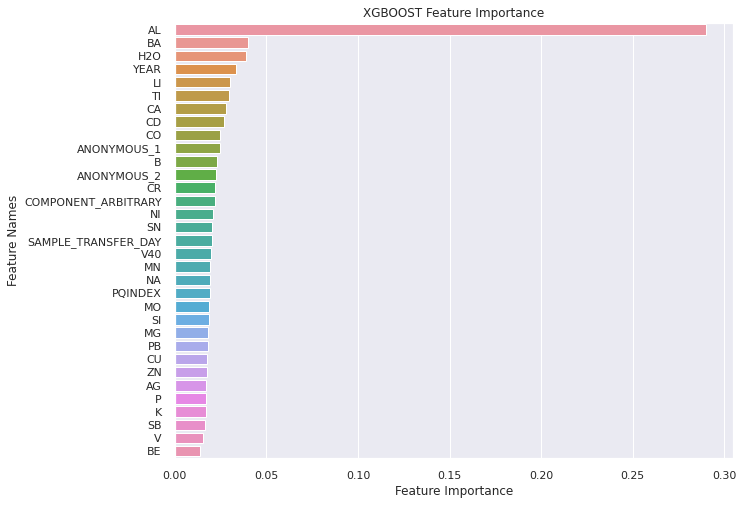

In [ ]:
plot_feature_importance(clf.feature_importances_,x_valid.columns,'XGBOOST')

- lgbm(category -> astype('categry')로 변경해주면됨.
위에 코드 존재.

- 실행x

In [ ]:

from sklearn.model_selection import StratifiedKFold

# split 개수, 셔플 여부 및 seed 설정
model_history=[]
val_history=[]
val_pred_hist=[]
str_kf = StratifiedKFold(n_splits = 5)
lgb_clf = lgb.LGBMClassifier(n_estimators=1000, boosting_type='gbdt',learning_rate=0.23,max_depth=8, n_jobs=-1,boost_from_average=False)
# split 개수 스텝 만큼 train, test 데이터셋을 매번 분할
for train_index, test_index in str_kf.split(temp,y):
    X_train, X_test = temp.loc[train_index], temp.loc[test_index]
    y_train, y_test = y.loc[train_index], y.loc[test_index]
    lgb_clf.fit(X_train,y_train)
    val_pred=lgb_clf.predict(X_test)
    val_pred_hist.append(val_pred)
    val_proba=lgb_clf.predict_proba(X_test)[:,1]
    val_history.append(val_proba)
    get_clf_eval(y_test,val_pred,val_proba)
    

In [ ]:
lgb_clf = lgb.LGBMClassifier(n_estimators=1000,eval_metric='AUC', boosting_type='gbdt',use_missing=False,learning_rate=0.04,max_depth=13, n_jobs=-1,boost_from_average=False)

In [ ]:
lgb_clf.fit(x_train,y_train,eval_set=[(x_valid,y_valid)],verbose=True,early_stopping_rounds=200,eval_metric='logloss')

- valid_set으로 예측한 macro-f1 score
(xgb)


In [ ]:
#here
val_pred=clf.predict(x_valid)
val_proba=clf.predict_proba(x_valid)[:,1]
get_clf_eval(y_valid,val_pred,val_proba)


오차행렬:
 [[2551    5]
 [ 122  113]]

정확도: 0.9545
정밀도: 0.9576
재현율: 0.4809
F1: 0.6402
MACRO_F1: 0.8080
AUC: 0.8799


오차행렬:
 [[2597   12]
 [  96  114]]

정확도: 0.9617
정밀도: 0.9048
재현율: 0.5429
F1: 0.6786
MACRO_F1: 0.8291
AUC: 0.8867

- valid_set으로 예측한 macro-f1 score
(lgb)


In [ ]:
val_pred=lgb_clf.predict(x_valid)
val_proba=lgb_clf.predict_proba(x_valid)[:,1]
get_clf_eval(y_valid,val_pred,val_proba)

오차행렬:
 [[2600    9]
 [  98  112]]

정확도: 0.9620
정밀도: 0.9256
재현율: 0.5333
F1: 0.6767
MACRO_F1: 0.8283
AUC: 0.8902


- train proba 예측 및 컬럼 생성.
    - xgb train_proba

In [ ]:
#here
val_pred=clf.predict(temp)
val_proba=clf.predict_proba(temp)[:,1]
get_clf_eval(y,val_pred,val_proba)

오차행렬:
 [[12877    15]
 [  544   659]]

정확도: 0.9603
정밀도: 0.9777
재현율: 0.5478
F1: 0.7022
MACRO_F1: 0.8405
AUC: 0.9421


In [ ]:
temp.dtypes

- lgbm train_proba

In [ ]:
val_pred=lgb_clf.predict(temp)
val_proba=lgb_clf.predict_proba(temp)[:,1]
get_clf_eval(y,val_pred,val_proba)

오차행렬:
 [[12879    13]
 [  459   744]]

정확도: 0.9665
정밀도: 0.9828
재현율: 0.6185
F1: 0.7592
MACRO_F1: 0.8706
AUC: 0.9764


In [ ]:
x_valid.dtypes

# 이젠 test_col X로 위에서 나온 확률 값을 예측하고, test set prediction 

- lgbm_regressor를 사용해서 test_col X로 proba예측


In [ ]:
test.columns

Index(['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'ANONYMOUS_2', 'AG', 'CO',
       'CR', 'CU', 'H2O', 'MN', 'MO', 'NI', 'PQINDEX', 'TI', 'V', 'V40', 'ZN'],
      dtype='object')

In [ ]:
test.drop('FE',axis=1,inplace=True)

In [ ]:
val_proba=train_p

In [ ]:
test_col=test.columns

In [ ]:
test_col=['COMPONENT_ARBITRARY', 'ANONYMOUS_1', 'YEAR', 'ANONYMOUS_2', 'AG', 'CO',
       'CR', 'CU', 'FE', 'H2O', 'MN', 'MO', 'NI', 'PQINDEX', 'TI', 'V', 'V40']

In [ ]:
temp_regress = temp[test_col]

In [ ]:
temp_regress['Y_PROBA']=val_proba

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
temp_regress.Y_PROBA

0        0.049940
1        0.084447
2        0.066525
3        0.046253
4        0.077294
           ...   
13959    0.288750
13960    0.580169
13961    0.736501
13962    0.364793
13963    0.234230
Name: Y_PROBA, Length: 13964, dtype: float32

In [ ]:
temp_regress.dtypes

COMPONENT_ARBITRARY      int64
ANONYMOUS_1            float64
YEAR                     int64
ANONYMOUS_2            float64
AG                     float64
CO                     float64
CR                     float64
CU                     float64
FE                     float64
H2O                    float64
MN                     float64
MO                     float64
NI                     float64
PQINDEX                float64
TI                     float64
V                      float64
V40                    float64
ZN                     float64
Y_PROBA                float64
dtype: object

In [ ]:
test

,COMPONENT_ARBITRARY,ANONYMOUS_1,YEAR,ANONYMOUS_2,AG,CO,CR,CU,FE,H2O,MN,MO,NI,PQINDEX,TI,V,V40,ZN
0,0,2192,2016,200,0,0,0,1,12,0.0,0,0,0,10,0,0,91.300003,1091
1,2,2794,2011,200,0,0,2,1,278,0.0,3,0,0,2732,1,0,126.900002,12
2,1,1982,2010,200,0,0,0,16,5,0.0,0,0,0,11,0,0,44.299999,714
3,2,1404,2009,200,0,0,3,4,163,0.0,4,3,0,8007,0,0,142.800003,94
4,1,8225,2013,200,0,0,0,6,13,0.0,0,0,0,16,0,0,63.400002,469
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,2,1714,2014,200,0,0,3,130,1047,0.0,65,5,2,1999,0,0,71.199997,1163
6037,2,4131,2016,200,0,0,5,2,736,0.0,5,0,0,693,0,0,137.800003,13
6038,2,4325,2014,200,0,0,0,0,53,0.0,0,0,0,69,0,0,302.200012,13
6039,1,1364,2013,200,0,0,0,62,2,0.0,0,0,0,5,0,0,51.099998,478


# Proba 예측을 위한 회귀 모형 생성.

- valid_set .2로 설정. (Hold_Out으로 일단 확인)

In [ ]:
y_regress=temp_regress['Y_PROBA']
temp_regress=temp_regress.drop('Y_PROBA',axis=1)

#Feature_Selection (model_based)

- 실행하지말것.

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier , RandomForestRegressor
select = SelectFromModel(
    RandomForestRegressor(n_estimators=1000,random_state=42),threshold='mean')


In [ ]:
#y=temp['Y_LABEL']
#temp=temp.drop('Y_LABEL',axis=1)
select.fit(temp_regress,y_regress)
f_temp=select.transform(temp_regress)
t_temp=select.transform(test)
f_temp.shape

# 회귀 모델링

In [ ]:
def best_th(y_valid, y_pred):

  m_f1=0.0
  for th in range(10,40,1):

    temp_sub = y_pred
    example=pd.DataFrame(temp_sub)
    example.columns=['pred']
    example['pred'][example['pred']>(th*0.01)]=1.0
    example['pred'][example['pred']<=(th*0.01)]=0.0

    if f1_score(y_valid, example.pred,average='macro') > m_f1:
      m_f1 =f1_score(y_valid, example.pred,average='macro')
    
  return m_f1
  


- Hold Out

In [ ]:
#.8 .2
x_r_train , x_r_valid , y_r_train, y_r_valid=train_test_split(temp_regress,y_regress,test_size=.2,random_state=5)

- kfold Optuna

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
# split 개수, 셔플 여부 및 seed 설정
model_history=[]
str_kf = KFold(n_splits = 10, shuffle = True, random_state = 50)
k_TH=[]
test_pred=[]
# split 개수 스텝 만큼 train, test 데이터셋을 매번 분할
for train_index, test_index in str_kf.split(temp_regress,y_regress):


    x_r_train, x_r_valid = temp_regress.iloc[train_index], temp_regress.iloc[test_index]
    y_r_train, y_r_valid = y_regress.iloc[train_index], y_regress.iloc[test_index]
    # 성능확인을 위한 y_train값과 y_valid값을 가져오기.
    y_train, y_valid = y.iloc[train_index], y.iloc[test_index]
    
    optuna_cbrm_reg = optuna.create_study(direction='minimize', sampler=sampler)
    optuna_cbrm_reg.optimize(objective, n_trials=15)
    cbrm_trial_reg = optuna_cbrm_reg.best_trial
    cbrm_trial_params = cbrm_trial_reg.params

    clf = xgb.XGBRegressor(**cbrm_trial.params,use_missing=False,boost_from_average=False)
    clf.fit(x_r_train,y_r_train,eval_set=[(x_r_valid,y_r_valid)],early_stopping_rounds=70,verbose=True)

    # valid_set 성능 및 student_set 예측하기.
    val_pred=clf.predict(x_r_valid)
    k_TH.append(best_th(y_valid,val_pred))
    print(mean_absolute_error(y_r_valid,val_pred))
    test_pred.append(clf.predict(test))
    


test_p=pd.DataFrame(np.mean(test_pred,axis=0))
test_p




[I 2022-11-25 06:38:22,995] A new study created in memory with name: no-name-58ecc317-1f24-4dc6-a4e9-12ef6ef29e53


[0]	validation_0-rmse:0.438786
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43457
[2]	validation_0-rmse:0.43043
[3]	validation_0-rmse:0.426325
[4]	validation_0-rmse:0.422293
[5]	validation_0-rmse:0.41829
[6]	validation_0-rmse:0.414347
[7]	validation_0-rmse:0.410485
[8]	validation_0-rmse:0.406674
[9]	validation_0-rmse:0.402897
[10]	validation_0-rmse:0.399221
[11]	validation_0-rmse:0.395573
[12]	validation_0-rmse:0.391953
[13]	validation_0-rmse:0.388407
[14]	validation_0-rmse:0.384913
[15]	validation_0-rmse:0.381451
[16]	validation_0-rmse:0.378097
[17]	validation_0-rmse:0.374788
[18]	validation_0-rmse:0.37153
[19]	validation_0-rmse:0.368266
[20]	validation_0-rmse:0.365093
[21]	validation_0-rmse:0.361931
[22]	validation_0-rmse:0.358845
[23]	validation_0-rmse:0.35579
[24]	validation_0-rmse:0.352776
[25]	validation_0-rmse:0.349873
[26]	validation_0-rmse:0.346976
[27]	validation_0-rmse:0.344109
[28]	validation_0-rmse:0.34126
[29]	validation_0-rmse

[I 2022-11-25 06:38:31,973] Trial 0 finished with value: 0.09417811781167984 and parameters: {'lambda': 1.216977567770054, 'alpha': 0.0012106198691436032, 'colsample_bytree': 0.8, 'subsample': 0.5, 'learning_rate': 0.012, 'n_estimators': 1400, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 131}. Best is trial 0 with value: 0.09417811781167984.


[0]	validation_0-rmse:0.436692
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430511
[2]	validation_0-rmse:0.424419
[3]	validation_0-rmse:0.418351
[4]	validation_0-rmse:0.412509
[5]	validation_0-rmse:0.406773
[6]	validation_0-rmse:0.401163
[7]	validation_0-rmse:0.395651
[8]	validation_0-rmse:0.390244
[9]	validation_0-rmse:0.384989
[10]	validation_0-rmse:0.379904
[11]	validation_0-rmse:0.37487
[12]	validation_0-rmse:0.369835
[13]	validation_0-rmse:0.364985
[14]	validation_0-rmse:0.360227
[15]	validation_0-rmse:0.355587
[16]	validation_0-rmse:0.351133
[17]	validation_0-rmse:0.34679
[18]	validation_0-rmse:0.342533
[19]	validation_0-rmse:0.338276
[20]	validation_0-rmse:0.334213
[21]	validation_0-rmse:0.330158
[22]	validation_0-rmse:0.326268
[23]	validation_0-rmse:0.32246
[24]	validation_0-rmse:0.318655
[25]	validation_0-rmse:0.315099
[26]	validation_0-rmse:0.311536
[27]	validation_0-rmse:0.308071
[28]	validation_0-rmse:0.304676
[29]	validation_0-r

[I 2022-11-25 06:38:34,903] Trial 1 finished with value: 0.09618048369884491 and parameters: {'lambda': 0.29584750692604167, 'alpha': 0.112863358680355, 'colsample_bytree': 0.7, 'subsample': 0.5, 'learning_rate': 0.018, 'n_estimators': 400, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 29}. Best is trial 0 with value: 0.09417811781167984.


[0]	validation_0-rmse:0.439532
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436053
[2]	validation_0-rmse:0.432588
[3]	validation_0-rmse:0.429137
[4]	validation_0-rmse:0.425768
[5]	validation_0-rmse:0.422413
[6]	validation_0-rmse:0.419116
[7]	validation_0-rmse:0.415854
[8]	validation_0-rmse:0.412633
[9]	validation_0-rmse:0.409449
[10]	validation_0-rmse:0.406307
[11]	validation_0-rmse:0.403199
[12]	validation_0-rmse:0.400114
[13]	validation_0-rmse:0.397098
[14]	validation_0-rmse:0.394118
[15]	validation_0-rmse:0.39114
[16]	validation_0-rmse:0.388249
[17]	validation_0-rmse:0.385376
[18]	validation_0-rmse:0.382532
[19]	validation_0-rmse:0.379686
[20]	validation_0-rmse:0.376937
[21]	validation_0-rmse:0.374169
[22]	validation_0-rmse:0.371442
[23]	validation_0-rmse:0.368785
[24]	validation_0-rmse:0.366089
[25]	validation_0-rmse:0.363505
[26]	validation_0-rmse:0.360927
[27]	validation_0-rmse:0.358389
[28]	validation_0-rmse:0.355827
[29]	validation_0

[I 2022-11-25 06:38:35,677] Trial 2 finished with value: 0.21774202585220337 and parameters: {'lambda': 1.9249640862099249, 'alpha': 0.004023537733427372, 'colsample_bytree': 0.5, 'subsample': 0.5, 'learning_rate': 0.01, 'n_estimators': 100, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 229}. Best is trial 0 with value: 0.09417811781167984.


[0]	validation_0-rmse:0.438834
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434624
[2]	validation_0-rmse:0.430503
[3]	validation_0-rmse:0.426384
[4]	validation_0-rmse:0.422374
[5]	validation_0-rmse:0.418407
[6]	validation_0-rmse:0.414508
[7]	validation_0-rmse:0.410656
[8]	validation_0-rmse:0.406882
[9]	validation_0-rmse:0.403148
[10]	validation_0-rmse:0.399475
[11]	validation_0-rmse:0.395849
[12]	validation_0-rmse:0.392279
[13]	validation_0-rmse:0.388761
[14]	validation_0-rmse:0.385296
[15]	validation_0-rmse:0.381884
[16]	validation_0-rmse:0.378533
[17]	validation_0-rmse:0.375227
[18]	validation_0-rmse:0.37198
[19]	validation_0-rmse:0.368764
[20]	validation_0-rmse:0.365598
[21]	validation_0-rmse:0.362487
[22]	validation_0-rmse:0.359441
[23]	validation_0-rmse:0.356442
[24]	validation_0-rmse:0.353465
[25]	validation_0-rmse:0.35052
[26]	validation_0-rmse:0.347636
[27]	validation_0-rmse:0.344804
[28]	validation_0-rmse:0.341962
[29]	validation_0-

[I 2022-11-25 06:38:45,964] Trial 3 finished with value: 0.09402304887771606 and parameters: {'lambda': 3.2537679043836842, 'alpha': 0.046777453460422384, 'colsample_bytree': 0.3, 'subsample': 1.0, 'learning_rate': 0.012, 'n_estimators': 1800, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 140}. Best is trial 3 with value: 0.09402304887771606.


[0]	validation_0-rmse:0.439497
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435943
[2]	validation_0-rmse:0.43243
[3]	validation_0-rmse:0.428976
[4]	validation_0-rmse:0.42559
[5]	validation_0-rmse:0.422193
[6]	validation_0-rmse:0.4189
[7]	validation_0-rmse:0.415616
[8]	validation_0-rmse:0.412342
[9]	validation_0-rmse:0.40913
[10]	validation_0-rmse:0.40595
[11]	validation_0-rmse:0.402795
[12]	validation_0-rmse:0.39967
[13]	validation_0-rmse:0.396594
[14]	validation_0-rmse:0.393555
[15]	validation_0-rmse:0.390549
[16]	validation_0-rmse:0.387611
[17]	validation_0-rmse:0.384707
[18]	validation_0-rmse:0.381795
[19]	validation_0-rmse:0.378932
[20]	validation_0-rmse:0.376124
[21]	validation_0-rmse:0.373335
[22]	validation_0-rmse:0.370599
[23]	validation_0-rmse:0.367861
[24]	validation_0-rmse:0.365164
[25]	validation_0-rmse:0.362558
[26]	validation_0-rmse:0.359959
[27]	validation_0-rmse:0.357349
[28]	validation_0-rmse:0.354799
[29]	validation_0-rmse:

[I 2022-11-25 06:38:49,890] Trial 4 finished with value: 0.09717883914709091 and parameters: {'lambda': 1.342135842125251, 'alpha': 0.7488782916686476, 'colsample_bytree': 0.9, 'subsample': 0.8, 'learning_rate': 0.01, 'n_estimators': 400, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 15}. Best is trial 3 with value: 0.09402304887771606.


[0]	validation_0-rmse:0.438761
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434517
[2]	validation_0-rmse:0.430374
[3]	validation_0-rmse:0.426243
[4]	validation_0-rmse:0.422172
[5]	validation_0-rmse:0.418208
[6]	validation_0-rmse:0.414301
[7]	validation_0-rmse:0.410456
[8]	validation_0-rmse:0.406627
[9]	validation_0-rmse:0.40288
[10]	validation_0-rmse:0.399203
[11]	validation_0-rmse:0.395576
[12]	validation_0-rmse:0.391927
[13]	validation_0-rmse:0.388401
[14]	validation_0-rmse:0.384932
[15]	validation_0-rmse:0.381486
[16]	validation_0-rmse:0.378126
[17]	validation_0-rmse:0.374814
[18]	validation_0-rmse:0.371484
[19]	validation_0-rmse:0.368214
[20]	validation_0-rmse:0.365047
[21]	validation_0-rmse:0.361901
[22]	validation_0-rmse:0.358847
[23]	validation_0-rmse:0.355803
[24]	validation_0-rmse:0.352778
[25]	validation_0-rmse:0.349844
[26]	validation_0-rmse:0.346938
[27]	validation_0-rmse:0.344096
[28]	validation_0-rmse:0.341245
[29]	validation_0

[I 2022-11-25 06:39:00,659] Trial 5 finished with value: 0.09461630135774612 and parameters: {'lambda': 0.009873020328180191, 'alpha': 0.14778626212662904, 'colsample_bytree': 1.0, 'subsample': 0.7, 'learning_rate': 0.012, 'n_estimators': 1700, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 241}. Best is trial 3 with value: 0.09402304887771606.


[0]	validation_0-rmse:0.439491
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435945
[2]	validation_0-rmse:0.432438
[3]	validation_0-rmse:0.428978
[4]	validation_0-rmse:0.425593
[5]	validation_0-rmse:0.422213
[6]	validation_0-rmse:0.418895
[7]	validation_0-rmse:0.4156
[8]	validation_0-rmse:0.412341
[9]	validation_0-rmse:0.409122
[10]	validation_0-rmse:0.405941
[11]	validation_0-rmse:0.402798
[12]	validation_0-rmse:0.399693
[13]	validation_0-rmse:0.396629
[14]	validation_0-rmse:0.393601
[15]	validation_0-rmse:0.390607
[16]	validation_0-rmse:0.387679
[17]	validation_0-rmse:0.384777
[18]	validation_0-rmse:0.381893
[19]	validation_0-rmse:0.379053
[20]	validation_0-rmse:0.376271
[21]	validation_0-rmse:0.373518
[22]	validation_0-rmse:0.370777
[23]	validation_0-rmse:0.368064
[24]	validation_0-rmse:0.365398
[25]	validation_0-rmse:0.362792
[26]	validation_0-rmse:0.360209
[27]	validation_0-rmse:0.35763
[28]	validation_0-rmse:0.355089
[29]	validation_0-r

[I 2022-11-25 06:39:08,339] Trial 6 finished with value: 0.09449347853660583 and parameters: {'lambda': 0.18218197917940251, 'alpha': 0.22771458441387557, 'colsample_bytree': 0.9, 'subsample': 1.0, 'learning_rate': 0.01, 'n_estimators': 1100, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 254}. Best is trial 3 with value: 0.09402304887771606.


[0]	validation_0-rmse:0.43671
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430432
[2]	validation_0-rmse:0.424346
[3]	validation_0-rmse:0.418288
[4]	validation_0-rmse:0.412455
[5]	validation_0-rmse:0.406722
[6]	validation_0-rmse:0.401147
[7]	validation_0-rmse:0.395659
[8]	validation_0-rmse:0.390326
[9]	validation_0-rmse:0.385092
[10]	validation_0-rmse:0.380001
[11]	validation_0-rmse:0.375004
[12]	validation_0-rmse:0.37014
[13]	validation_0-rmse:0.365359
[14]	validation_0-rmse:0.360714
[15]	validation_0-rmse:0.35617
[16]	validation_0-rmse:0.351738
[17]	validation_0-rmse:0.347417
[18]	validation_0-rmse:0.343197
[19]	validation_0-rmse:0.339033
[20]	validation_0-rmse:0.334991
[21]	validation_0-rmse:0.33106
[22]	validation_0-rmse:0.32723
[23]	validation_0-rmse:0.323507
[24]	validation_0-rmse:0.319801
[25]	validation_0-rmse:0.31621
[26]	validation_0-rmse:0.312708
[27]	validation_0-rmse:0.309313
[28]	validation_0-rmse:0.305904
[29]	validation_0-rmse

[I 2022-11-25 06:39:13,138] Trial 7 finished with value: 0.09474412351846695 and parameters: {'lambda': 0.005003288884344244, 'alpha': 0.0011442989525777866, 'colsample_bytree': 0.3, 'subsample': 1.0, 'learning_rate': 0.018, 'n_estimators': 600, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 221}. Best is trial 3 with value: 0.09402304887771606.


[0]	validation_0-rmse:0.438112
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433225
[2]	validation_0-rmse:0.428439
[3]	validation_0-rmse:0.423655
[4]	validation_0-rmse:0.419021
[5]	validation_0-rmse:0.414439
[6]	validation_0-rmse:0.409956
[7]	validation_0-rmse:0.405506
[8]	validation_0-rmse:0.401156
[9]	validation_0-rmse:0.396884
[10]	validation_0-rmse:0.392702
[11]	validation_0-rmse:0.388606
[12]	validation_0-rmse:0.384549
[13]	validation_0-rmse:0.380565
[14]	validation_0-rmse:0.376684
[15]	validation_0-rmse:0.372847
[16]	validation_0-rmse:0.369124
[17]	validation_0-rmse:0.365443
[18]	validation_0-rmse:0.361818
[19]	validation_0-rmse:0.358184
[20]	validation_0-rmse:0.354716
[21]	validation_0-rmse:0.351244
[22]	validation_0-rmse:0.347825
[23]	validation_0-rmse:0.344499
[24]	validation_0-rmse:0.341195
[25]	validation_0-rmse:0.338008
[26]	validation_0-rmse:0.334854
[27]	validation_0-rmse:0.331747
[28]	validation_0-rmse:0.328665
[29]	validation_

[I 2022-11-25 06:39:22,039] Trial 8 finished with value: 0.09442202001810074 and parameters: {'lambda': 0.1072515635557621, 'alpha': 0.37783871899869736, 'colsample_bytree': 0.5, 'subsample': 0.7, 'learning_rate': 0.014, 'n_estimators': 1600, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 162}. Best is trial 3 with value: 0.09402304887771606.


[0]	validation_0-rmse:0.437408
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431856
[2]	validation_0-rmse:0.4264
[3]	validation_0-rmse:0.420985
[4]	validation_0-rmse:0.415748
[5]	validation_0-rmse:0.410601
[6]	validation_0-rmse:0.405604
[7]	validation_0-rmse:0.400608
[8]	validation_0-rmse:0.395733
[9]	validation_0-rmse:0.390964
[10]	validation_0-rmse:0.386304
[11]	validation_0-rmse:0.381681
[12]	validation_0-rmse:0.37713
[13]	validation_0-rmse:0.372689
[14]	validation_0-rmse:0.368318
[15]	validation_0-rmse:0.364066
[16]	validation_0-rmse:0.359972
[17]	validation_0-rmse:0.355939
[18]	validation_0-rmse:0.351982
[19]	validation_0-rmse:0.348041
[20]	validation_0-rmse:0.344277
[21]	validation_0-rmse:0.340521
[22]	validation_0-rmse:0.336837
[23]	validation_0-rmse:0.333199
[24]	validation_0-rmse:0.329647
[25]	validation_0-rmse:0.326251
[26]	validation_0-rmse:0.322863
[27]	validation_0-rmse:0.319552
[28]	validation_0-rmse:0.316284
[29]	validation_0-r

[I 2022-11-25 06:39:33,120] Trial 9 finished with value: 0.0948154628276825 and parameters: {'lambda': 0.17232411850555238, 'alpha': 0.00309057954396011, 'colsample_bytree': 0.6, 'subsample': 0.8, 'learning_rate': 0.016, 'n_estimators': 1300, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 213}. Best is trial 3 with value: 0.09402304887771606.


[0]	validation_0-rmse:0.440248
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.437451
[2]	validation_0-rmse:0.434669
[3]	validation_0-rmse:0.43192
[4]	validation_0-rmse:0.429201
[5]	validation_0-rmse:0.426471
[6]	validation_0-rmse:0.423794
[7]	validation_0-rmse:0.421156
[8]	validation_0-rmse:0.418551
[9]	validation_0-rmse:0.415938
[10]	validation_0-rmse:0.41337
[11]	validation_0-rmse:0.410832
[12]	validation_0-rmse:0.408311
[13]	validation_0-rmse:0.405821
[14]	validation_0-rmse:0.403349
[15]	validation_0-rmse:0.400901
[16]	validation_0-rmse:0.398457
[17]	validation_0-rmse:0.396035
[18]	validation_0-rmse:0.393662
[19]	validation_0-rmse:0.39125
[20]	validation_0-rmse:0.388913
[21]	validation_0-rmse:0.386589
[22]	validation_0-rmse:0.3843
[23]	validation_0-rmse:0.382066
[24]	validation_0-rmse:0.379773
[25]	validation_0-rmse:0.377541
[26]	validation_0-rmse:0.375328
[27]	validation_0-rmse:0.373172
[28]	validation_0-rmse:0.370983
[29]	validation_0-rms

[I 2022-11-25 06:39:42,530] Trial 10 finished with value: 0.0945652574300766 and parameters: {'lambda': 6.02041102856713, 'alpha': 8.097836606986624, 'colsample_bytree': 0.4, 'subsample': 0.4, 'learning_rate': 0.008, 'n_estimators': 2000, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 92}. Best is trial 3 with value: 0.09402304887771606.


[0]	validation_0-rmse:0.438772
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434551
[2]	validation_0-rmse:0.430421
[3]	validation_0-rmse:0.426307
[4]	validation_0-rmse:0.42228
[5]	validation_0-rmse:0.418275
[6]	validation_0-rmse:0.414352
[7]	validation_0-rmse:0.41048
[8]	validation_0-rmse:0.406659
[9]	validation_0-rmse:0.402896
[10]	validation_0-rmse:0.399242
[11]	validation_0-rmse:0.395579
[12]	validation_0-rmse:0.391956
[13]	validation_0-rmse:0.388382
[14]	validation_0-rmse:0.384907
[15]	validation_0-rmse:0.381445
[16]	validation_0-rmse:0.37808
[17]	validation_0-rmse:0.374764
[18]	validation_0-rmse:0.371503
[19]	validation_0-rmse:0.368241
[20]	validation_0-rmse:0.365071
[21]	validation_0-rmse:0.361925
[22]	validation_0-rmse:0.358844
[23]	validation_0-rmse:0.355813
[24]	validation_0-rmse:0.352781
[25]	validation_0-rmse:0.349867
[26]	validation_0-rmse:0.346977
[27]	validation_0-rmse:0.344101
[28]	validation_0-rmse:0.341267
[29]	validation_0-r

[I 2022-11-25 06:39:51,289] Trial 11 finished with value: 0.093491330742836 and parameters: {'lambda': 8.5945305794035, 'alpha': 0.01636423389052095, 'colsample_bytree': 0.8, 'subsample': 0.6, 'learning_rate': 0.012, 'n_estimators': 2000, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 131}. Best is trial 11 with value: 0.093491330742836.


[0]	validation_0-rmse:0.438832
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434658
[2]	validation_0-rmse:0.430535
[3]	validation_0-rmse:0.426417
[4]	validation_0-rmse:0.422385
[5]	validation_0-rmse:0.418427
[6]	validation_0-rmse:0.414539
[7]	validation_0-rmse:0.410704
[8]	validation_0-rmse:0.406905
[9]	validation_0-rmse:0.403167
[10]	validation_0-rmse:0.3995
[11]	validation_0-rmse:0.395854
[12]	validation_0-rmse:0.392279
[13]	validation_0-rmse:0.388756
[14]	validation_0-rmse:0.385311
[15]	validation_0-rmse:0.381882
[16]	validation_0-rmse:0.378537
[17]	validation_0-rmse:0.375232
[18]	validation_0-rmse:0.371993
[19]	validation_0-rmse:0.368765
[20]	validation_0-rmse:0.365619
[21]	validation_0-rmse:0.362495
[22]	validation_0-rmse:0.359469
[23]	validation_0-rmse:0.356478
[24]	validation_0-rmse:0.3535
[25]	validation_0-rmse:0.350587
[26]	validation_0-rmse:0.347716
[27]	validation_0-rmse:0.344879
[28]	validation_0-rmse:0.342027
[29]	validation_0-rm

[I 2022-11-25 06:40:01,125] Trial 12 finished with value: 0.0944780632853508 and parameters: {'lambda': 9.958668790668385, 'alpha': 0.019720326854894298, 'colsample_bytree': 0.3, 'subsample': 0.6, 'learning_rate': 0.012, 'n_estimators': 2000, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 94}. Best is trial 11 with value: 0.093491330742836.


[0]	validation_0-rmse:0.435931
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428992
[2]	validation_0-rmse:0.422242
[3]	validation_0-rmse:0.415591
[4]	validation_0-rmse:0.409131
[5]	validation_0-rmse:0.402773
[6]	validation_0-rmse:0.396647
[7]	validation_0-rmse:0.390604
[8]	validation_0-rmse:0.384744
[9]	validation_0-rmse:0.37901
[10]	validation_0-rmse:0.373514
[11]	validation_0-rmse:0.368051
[12]	validation_0-rmse:0.362717
[13]	validation_0-rmse:0.357503
[14]	validation_0-rmse:0.352454
[15]	validation_0-rmse:0.347535
[16]	validation_0-rmse:0.342788
[17]	validation_0-rmse:0.338172
[18]	validation_0-rmse:0.333639
[19]	validation_0-rmse:0.329202
[20]	validation_0-rmse:0.324935
[21]	validation_0-rmse:0.32073
[22]	validation_0-rmse:0.316711
[23]	validation_0-rmse:0.312764
[24]	validation_0-rmse:0.308867
[25]	validation_0-rmse:0.305186
[26]	validation_0-rmse:0.301565
[27]	validation_0-rmse:0.298031
[28]	validation_0-rmse:0.294566
[29]	validation_0-

[I 2022-11-25 06:40:08,271] Trial 13 finished with value: 0.09469790011644363 and parameters: {'lambda': 3.0672286372515716, 'alpha': 0.028465473268808033, 'colsample_bytree': 0.8, 'subsample': 0.6, 'learning_rate': 0.02, 'n_estimators': 1700, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 298}. Best is trial 11 with value: 0.093491330742836.


[0]	validation_0-rmse:0.438835
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43462
[2]	validation_0-rmse:0.430498
[3]	validation_0-rmse:0.426368
[4]	validation_0-rmse:0.422358
[5]	validation_0-rmse:0.41839
[6]	validation_0-rmse:0.414492
[7]	validation_0-rmse:0.410643
[8]	validation_0-rmse:0.406866
[9]	validation_0-rmse:0.403133
[10]	validation_0-rmse:0.399461
[11]	validation_0-rmse:0.395836
[12]	validation_0-rmse:0.392274
[13]	validation_0-rmse:0.388755
[14]	validation_0-rmse:0.385294
[15]	validation_0-rmse:0.381888
[16]	validation_0-rmse:0.37854
[17]	validation_0-rmse:0.37524
[18]	validation_0-rmse:0.371994
[19]	validation_0-rmse:0.368775
[20]	validation_0-rmse:0.365611
[21]	validation_0-rmse:0.362503
[22]	validation_0-rmse:0.359463
[23]	validation_0-rmse:0.356467
[24]	validation_0-rmse:0.353487
[25]	validation_0-rmse:0.350558
[26]	validation_0-rmse:0.347672
[27]	validation_0-rmse:0.344846
[28]	validation_0-rmse:0.342
[29]	validation_0-rmse:

[I 2022-11-25 06:40:17,628] Trial 14 finished with value: 0.0942312702536583 and parameters: {'lambda': 0.023217833341756453, 'alpha': 0.01848144916948844, 'colsample_bytree': 0.3, 'subsample': 1.0, 'learning_rate': 0.012, 'n_estimators': 2000, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 162}. Best is trial 11 with value: 0.093491330742836.


[06:40:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.404732
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.37134
[2]	validation_0-rmse:0.342287
[3]	validation_0-rmse:0.317326
[4]	validation_0-rmse:0.296059
[5]	validation_0-rmse:0.277898
[6]	validation_0-rmse:0.26219
[7]	validation_0-rmse:0.249157
[8]	validation_0-rmse:0.237917
[9]	validation_0-rmse:0.228716
[10]	validation_0-rmse:0.220783
[11]	validation_0-rmse:0.214511
[12]	validation_0-rmse:0.209539
[13]	validation_0-rmse:0.205493
[14]	validation_0-rmse:0.201917
[15]	validation_0-rmse:0.198932
[16]	validation_0-rmse:0.196368
[17]	validation_0-rmse:0.194724
[18]	validation_0-rmse:0.193063
[19]	validation_0-rmse:0.192125
[20]	validation_0-rmse:0.19134
[21]	validation_0-rmse:0.19067
[22]	validation_0-rmse:0.189982
[23]	validation_0-rmse:0.18957
[24]	validation_0-rmse:0.1894
[25]	validation_0-rmse:0.

[I 2022-11-25 06:40:19,857] A new study created in memory with name: no-name-e8981b2b-4e61-49f2-b81e-165e73afaf5b


[0]	validation_0-rmse:0.43775
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430958
[2]	validation_0-rmse:0.424333
[3]	validation_0-rmse:0.417858
[4]	validation_0-rmse:0.411505
[5]	validation_0-rmse:0.405319
[6]	validation_0-rmse:0.399296
[7]	validation_0-rmse:0.393412
[8]	validation_0-rmse:0.387751
[9]	validation_0-rmse:0.382169
[10]	validation_0-rmse:0.376734
[11]	validation_0-rmse:0.371466
[12]	validation_0-rmse:0.366299
[13]	validation_0-rmse:0.361272
[14]	validation_0-rmse:0.356414
[15]	validation_0-rmse:0.351656
[16]	validation_0-rmse:0.347003
[17]	validation_0-rmse:0.342525
[18]	validation_0-rmse:0.338147
[19]	validation_0-rmse:0.333833
[20]	validation_0-rmse:0.329756
[21]	validation_0-rmse:0.325698
[22]	validation_0-rmse:0.321786
[23]	validation_0-rmse:0.318049
[24]	validation_0-rmse:0.314322
[25]	validation_0-rmse:0.310715
[26]	validation_0-rmse:0.307249
[27]	validation_0-rmse:0.303838
[28]	validation_0-rmse:0.30049
[29]	validation_0-

[I 2022-11-25 06:40:24,469] Trial 0 finished with value: 0.10115645825862885 and parameters: {'lambda': 0.01131390844054205, 'alpha': 0.0030856288359200432, 'colsample_bytree': 0.4, 'subsample': 0.4, 'learning_rate': 0.02, 'n_estimators': 1900, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 119}. Best is trial 0 with value: 0.10115645825862885.


[0]	validation_0-rmse:0.441906
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.4391
[2]	validation_0-rmse:0.436327
[3]	validation_0-rmse:0.433576
[4]	validation_0-rmse:0.430842
[5]	validation_0-rmse:0.428154
[6]	validation_0-rmse:0.425505
[7]	validation_0-rmse:0.422863
[8]	validation_0-rmse:0.420243
[9]	validation_0-rmse:0.417651
[10]	validation_0-rmse:0.415113
[11]	validation_0-rmse:0.412591
[12]	validation_0-rmse:0.410084
[13]	validation_0-rmse:0.407591
[14]	validation_0-rmse:0.405135
[15]	validation_0-rmse:0.402707
[16]	validation_0-rmse:0.400292
[17]	validation_0-rmse:0.397907
[18]	validation_0-rmse:0.395538
[19]	validation_0-rmse:0.393201
[20]	validation_0-rmse:0.390894
[21]	validation_0-rmse:0.388588
[22]	validation_0-rmse:0.386343
[23]	validation_0-rmse:0.384099
[24]	validation_0-rmse:0.381881
[25]	validation_0-rmse:0.379689
[26]	validation_0-rmse:0.377515
[27]	validation_0-rmse:0.375368
[28]	validation_0-rmse:0.373223
[29]	validation_0-

[I 2022-11-25 06:40:33,832] Trial 1 finished with value: 0.10007205605506897 and parameters: {'lambda': 3.882574333935946, 'alpha': 0.0017190538146581503, 'colsample_bytree': 1.0, 'subsample': 0.8, 'learning_rate': 0.008, 'n_estimators': 1400, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 202}. Best is trial 1 with value: 0.10007205605506897.


[0]	validation_0-rmse:0.43841
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.432251
[2]	validation_0-rmse:0.426245
[3]	validation_0-rmse:0.420319
[4]	validation_0-rmse:0.41457
[5]	validation_0-rmse:0.408933
[6]	validation_0-rmse:0.403443
[7]	validation_0-rmse:0.398012
[8]	validation_0-rmse:0.392727
[9]	validation_0-rmse:0.387601
[10]	validation_0-rmse:0.382578
[11]	validation_0-rmse:0.377667
[12]	validation_0-rmse:0.372869
[13]	validation_0-rmse:0.368171
[14]	validation_0-rmse:0.363594
[15]	validation_0-rmse:0.359123
[16]	validation_0-rmse:0.354783
[17]	validation_0-rmse:0.350527
[18]	validation_0-rmse:0.346374
[19]	validation_0-rmse:0.34226
[20]	validation_0-rmse:0.338319
[21]	validation_0-rmse:0.334474
[22]	validation_0-rmse:0.330725
[23]	validation_0-rmse:0.327079
[24]	validation_0-rmse:0.323439
[25]	validation_0-rmse:0.319947
[26]	validation_0-rmse:0.316567
[27]	validation_0-rmse:0.313236
[28]	validation_0-rmse:0.309947
[29]	validation_0-r

[I 2022-11-25 06:40:41,142] Trial 2 finished with value: 0.10022547096014023 and parameters: {'lambda': 1.4896261969041449, 'alpha': 0.001468761398649623, 'colsample_bytree': 0.4, 'subsample': 1.0, 'learning_rate': 0.018, 'n_estimators': 1700, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 56}. Best is trial 1 with value: 0.10007205605506897.


[0]	validation_0-rmse:0.439126
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43368
[2]	validation_0-rmse:0.428287
[3]	validation_0-rmse:0.422954
[4]	validation_0-rmse:0.417788
[5]	validation_0-rmse:0.412713
[6]	validation_0-rmse:0.407757
[7]	validation_0-rmse:0.402863
[8]	validation_0-rmse:0.398116
[9]	validation_0-rmse:0.39341
[10]	validation_0-rmse:0.388829
[11]	validation_0-rmse:0.38429
[12]	validation_0-rmse:0.379816
[13]	validation_0-rmse:0.375474
[14]	validation_0-rmse:0.371264
[15]	validation_0-rmse:0.36709
[16]	validation_0-rmse:0.363074
[17]	validation_0-rmse:0.359109
[18]	validation_0-rmse:0.355217
[19]	validation_0-rmse:0.351417
[20]	validation_0-rmse:0.34774
[21]	validation_0-rmse:0.344078
[22]	validation_0-rmse:0.340487
[23]	validation_0-rmse:0.337037
[24]	validation_0-rmse:0.333582
[25]	validation_0-rmse:0.330299
[26]	validation_0-rmse:0.327068
[27]	validation_0-rmse:0.323917
[28]	validation_0-rmse:0.320762
[29]	validation_0-rms

[I 2022-11-25 06:40:43,500] Trial 3 finished with value: 0.1032443717122078 and parameters: {'lambda': 0.28974000830614577, 'alpha': 3.5303710561229957, 'colsample_bytree': 0.6, 'subsample': 0.5, 'learning_rate': 0.016, 'n_estimators': 300, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 220}. Best is trial 1 with value: 0.10007205605506897.


[0]	validation_0-rmse:0.439843
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435013
[2]	validation_0-rmse:0.430299
[3]	validation_0-rmse:0.425607
[4]	validation_0-rmse:0.421046
[5]	validation_0-rmse:0.416553
[6]	validation_0-rmse:0.412158
[7]	validation_0-rmse:0.407849
[8]	validation_0-rmse:0.403577
[9]	validation_0-rmse:0.399395
[10]	validation_0-rmse:0.395325
[11]	validation_0-rmse:0.391295
[12]	validation_0-rmse:0.387306
[13]	validation_0-rmse:0.383369
[14]	validation_0-rmse:0.379551
[15]	validation_0-rmse:0.375815
[16]	validation_0-rmse:0.372139
[17]	validation_0-rmse:0.36853
[18]	validation_0-rmse:0.364987
[19]	validation_0-rmse:0.36151
[20]	validation_0-rmse:0.358097
[21]	validation_0-rmse:0.35473
[22]	validation_0-rmse:0.351494
[23]	validation_0-rmse:0.348312
[24]	validation_0-rmse:0.345133
[25]	validation_0-rmse:0.341999
[26]	validation_0-rmse:0.338959
[27]	validation_0-rmse:0.335968
[28]	validation_0-rmse:0.332962
[29]	validation_0-r

[I 2022-11-25 06:40:44,365] Trial 4 finished with value: 0.18235325813293457 and parameters: {'lambda': 0.002231071187770103, 'alpha': 0.026906226416986003, 'colsample_bytree': 0.3, 'subsample': 0.7, 'learning_rate': 0.014, 'n_estimators': 100, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 49}. Best is trial 1 with value: 0.10007205605506897.


[0]	validation_0-rmse:0.439131
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433625
[2]	validation_0-rmse:0.42824
[3]	validation_0-rmse:0.422902
[4]	validation_0-rmse:0.417741
[5]	validation_0-rmse:0.412672
[6]	validation_0-rmse:0.407712
[7]	validation_0-rmse:0.402789
[8]	validation_0-rmse:0.398032
[9]	validation_0-rmse:0.393345
[10]	validation_0-rmse:0.388788
[11]	validation_0-rmse:0.384264
[12]	validation_0-rmse:0.379819
[13]	validation_0-rmse:0.375465
[14]	validation_0-rmse:0.37121
[15]	validation_0-rmse:0.367048
[16]	validation_0-rmse:0.363031
[17]	validation_0-rmse:0.35908
[18]	validation_0-rmse:0.355195
[19]	validation_0-rmse:0.351358
[20]	validation_0-rmse:0.347684
[21]	validation_0-rmse:0.344037
[22]	validation_0-rmse:0.340485
[23]	validation_0-rmse:0.336987
[24]	validation_0-rmse:0.33355
[25]	validation_0-rmse:0.330245
[26]	validation_0-rmse:0.326987
[27]	validation_0-rmse:0.323812
[28]	validation_0-rmse:0.320654
[29]	validation_0-rm

[I 2022-11-25 06:40:54,252] Trial 5 finished with value: 0.10125546902418137 and parameters: {'lambda': 0.011791057108112265, 'alpha': 0.008766935789968849, 'colsample_bytree': 0.6, 'subsample': 0.8, 'learning_rate': 0.016, 'n_estimators': 1600, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 236}. Best is trial 1 with value: 0.10007205605506897.


[0]	validation_0-rmse:0.43977
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434894
[2]	validation_0-rmse:0.430106
[3]	validation_0-rmse:0.425387
[4]	validation_0-rmse:0.420761
[5]	validation_0-rmse:0.416205
[6]	validation_0-rmse:0.41174
[7]	validation_0-rmse:0.407348
[8]	validation_0-rmse:0.403035
[9]	validation_0-rmse:0.398794
[10]	validation_0-rmse:0.394642
[11]	validation_0-rmse:0.390551
[12]	validation_0-rmse:0.38655
[13]	validation_0-rmse:0.382605
[14]	validation_0-rmse:0.378737
[15]	validation_0-rmse:0.374949
[16]	validation_0-rmse:0.37123
[17]	validation_0-rmse:0.367571
[18]	validation_0-rmse:0.36399
[19]	validation_0-rmse:0.360468
[20]	validation_0-rmse:0.357022
[21]	validation_0-rmse:0.353637
[22]	validation_0-rmse:0.350301
[23]	validation_0-rmse:0.347038
[24]	validation_0-rmse:0.343828
[25]	validation_0-rmse:0.34069
[26]	validation_0-rmse:0.337612
[27]	validation_0-rmse:0.33459
[28]	validation_0-rmse:0.331637
[29]	validation_0-rmse:

[I 2022-11-25 06:40:59,493] Trial 6 finished with value: 0.09877897799015045 and parameters: {'lambda': 0.052445038845643346, 'alpha': 2.26665984241279, 'colsample_bytree': 1.0, 'subsample': 1.0, 'learning_rate': 0.014, 'n_estimators': 1700, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 52}. Best is trial 6 with value: 0.09877897799015045.


[0]	validation_0-rmse:0.43838
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.432172
[2]	validation_0-rmse:0.426097
[3]	validation_0-rmse:0.420161
[4]	validation_0-rmse:0.414353
[5]	validation_0-rmse:0.408679
[6]	validation_0-rmse:0.40313
[7]	validation_0-rmse:0.397714
[8]	validation_0-rmse:0.392434
[9]	validation_0-rmse:0.387264
[10]	validation_0-rmse:0.382211
[11]	validation_0-rmse:0.377289
[12]	validation_0-rmse:0.372469
[13]	validation_0-rmse:0.367774
[14]	validation_0-rmse:0.363175
[15]	validation_0-rmse:0.3587
[16]	validation_0-rmse:0.354309
[17]	validation_0-rmse:0.35003
[18]	validation_0-rmse:0.345861
[19]	validation_0-rmse:0.341785
[20]	validation_0-rmse:0.337812
[21]	validation_0-rmse:0.33393
[22]	validation_0-rmse:0.330154
[23]	validation_0-rmse:0.326464
[24]	validation_0-rmse:0.322882
[25]	validation_0-rmse:0.319398
[26]	validation_0-rmse:0.31599
[27]	validation_0-rmse:0.312683
[28]	validation_0-rmse:0.309452
[29]	validation_0-rmse:

[I 2022-11-25 06:41:02,995] Trial 7 finished with value: 0.1008855402469635 and parameters: {'lambda': 0.002871497542287613, 'alpha': 1.5542553969891142, 'colsample_bytree': 1.0, 'subsample': 1.0, 'learning_rate': 0.018, 'n_estimators': 500, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 292}. Best is trial 6 with value: 0.09877897799015045.


[0]	validation_0-rmse:0.441902
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.439103
[2]	validation_0-rmse:0.436352
[3]	validation_0-rmse:0.433608
[4]	validation_0-rmse:0.430918
[5]	validation_0-rmse:0.428226
[6]	validation_0-rmse:0.425578
[7]	validation_0-rmse:0.422938
[8]	validation_0-rmse:0.420325
[9]	validation_0-rmse:0.417739
[10]	validation_0-rmse:0.415191
[11]	validation_0-rmse:0.412655
[12]	validation_0-rmse:0.410145
[13]	validation_0-rmse:0.40766
[14]	validation_0-rmse:0.4052
[15]	validation_0-rmse:0.402762
[16]	validation_0-rmse:0.400375
[17]	validation_0-rmse:0.398009
[18]	validation_0-rmse:0.395657
[19]	validation_0-rmse:0.393315
[20]	validation_0-rmse:0.391022
[21]	validation_0-rmse:0.388746
[22]	validation_0-rmse:0.386478
[23]	validation_0-rmse:0.384233
[24]	validation_0-rmse:0.382012
[25]	validation_0-rmse:0.379828
[26]	validation_0-rmse:0.377665
[27]	validation_0-rmse:0.37551
[28]	validation_0-rmse:0.37338
[29]	validation_0-rms

[I 2022-11-25 06:41:05,685] Trial 8 finished with value: 0.11332547664642334 and parameters: {'lambda': 0.012661306857637607, 'alpha': 5.641541191386169, 'colsample_bytree': 0.8, 'subsample': 1.0, 'learning_rate': 0.008, 'n_estimators': 400, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 223}. Best is trial 6 with value: 0.09877897799015045.


[0]	validation_0-rmse:0.439138
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433652
[2]	validation_0-rmse:0.428287
[3]	validation_0-rmse:0.42296
[4]	validation_0-rmse:0.417762
[5]	validation_0-rmse:0.412692
[6]	validation_0-rmse:0.407721
[7]	validation_0-rmse:0.402919
[8]	validation_0-rmse:0.398157
[9]	validation_0-rmse:0.393462
[10]	validation_0-rmse:0.388906
[11]	validation_0-rmse:0.384422
[12]	validation_0-rmse:0.380016
[13]	validation_0-rmse:0.375686
[14]	validation_0-rmse:0.371517
[15]	validation_0-rmse:0.367379
[16]	validation_0-rmse:0.363359
[17]	validation_0-rmse:0.359404
[18]	validation_0-rmse:0.355578
[19]	validation_0-rmse:0.351804
[20]	validation_0-rmse:0.348148
[21]	validation_0-rmse:0.344475
[22]	validation_0-rmse:0.340987
[23]	validation_0-rmse:0.337571
[24]	validation_0-rmse:0.334167
[25]	validation_0-rmse:0.330868
[26]	validation_0-rmse:0.327627
[27]	validation_0-rmse:0.324457
[28]	validation_0-rmse:0.32127
[29]	validation_0-

[I 2022-11-25 06:41:11,611] Trial 9 finished with value: 0.10072334110736847 and parameters: {'lambda': 0.0014228975013666069, 'alpha': 0.054289854271597764, 'colsample_bytree': 0.3, 'subsample': 0.5, 'learning_rate': 0.016, 'n_estimators': 1700, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 43}. Best is trial 6 with value: 0.09877897799015045.


[0]	validation_0-rmse:0.440492
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436315
[2]	validation_0-rmse:0.432189
[3]	validation_0-rmse:0.42812
[4]	validation_0-rmse:0.424141
[5]	validation_0-rmse:0.42021
[6]	validation_0-rmse:0.416371
[7]	validation_0-rmse:0.412548
[8]	validation_0-rmse:0.408783
[9]	validation_0-rmse:0.405066
[10]	validation_0-rmse:0.401432
[11]	validation_0-rmse:0.397837
[12]	validation_0-rmse:0.394252
[13]	validation_0-rmse:0.390747
[14]	validation_0-rmse:0.387343
[15]	validation_0-rmse:0.383954
[16]	validation_0-rmse:0.380639
[17]	validation_0-rmse:0.377362
[18]	validation_0-rmse:0.374136
[19]	validation_0-rmse:0.370965
[20]	validation_0-rmse:0.367876
[21]	validation_0-rmse:0.36478
[22]	validation_0-rmse:0.361752
[23]	validation_0-rmse:0.358803
[24]	validation_0-rmse:0.355868
[25]	validation_0-rmse:0.35301
[26]	validation_0-rmse:0.350189
[27]	validation_0-rmse:0.3474
[28]	validation_0-rmse:0.34463
[29]	validation_0-rmse:

[I 2022-11-25 06:41:20,314] Trial 10 finished with value: 0.10064706206321716 and parameters: {'lambda': 0.09809890538278357, 'alpha': 0.42919523411855187, 'colsample_bytree': 0.9, 'subsample': 0.6, 'learning_rate': 0.012, 'n_estimators': 1000, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 119}. Best is trial 6 with value: 0.09877897799015045.


[0]	validation_0-rmse:0.441215
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.437737
[2]	validation_0-rmse:0.434305
[3]	validation_0-rmse:0.430879
[4]	validation_0-rmse:0.427524
[5]	validation_0-rmse:0.424186
[6]	validation_0-rmse:0.420939
[7]	validation_0-rmse:0.417718
[8]	validation_0-rmse:0.414526
[9]	validation_0-rmse:0.411348
[10]	validation_0-rmse:0.40825
[11]	validation_0-rmse:0.405192
[12]	validation_0-rmse:0.40216
[13]	validation_0-rmse:0.399176
[14]	validation_0-rmse:0.39624
[15]	validation_0-rmse:0.393328
[16]	validation_0-rmse:0.390417
[17]	validation_0-rmse:0.387588
[18]	validation_0-rmse:0.384782
[19]	validation_0-rmse:0.382011
[20]	validation_0-rmse:0.379286
[21]	validation_0-rmse:0.37655
[22]	validation_0-rmse:0.373889
[23]	validation_0-rmse:0.371258
[24]	validation_0-rmse:0.368661
[25]	validation_0-rmse:0.366105
[26]	validation_0-rmse:0.363578
[27]	validation_0-rmse:0.361088
[28]	validation_0-rmse:0.358586
[29]	validation_0-rm

[I 2022-11-25 06:41:28,279] Trial 11 finished with value: 0.09961933642625809 and parameters: {'lambda': 9.106491354785868, 'alpha': 0.2705733442999481, 'colsample_bytree': 1.0, 'subsample': 0.8, 'learning_rate': 0.01, 'n_estimators': 1200, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 171}. Best is trial 6 with value: 0.09877897799015045.


[0]	validation_0-rmse:0.441196
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.437679
[2]	validation_0-rmse:0.434195
[3]	validation_0-rmse:0.430769
[4]	validation_0-rmse:0.427375
[5]	validation_0-rmse:0.424015
[6]	validation_0-rmse:0.420741
[7]	validation_0-rmse:0.4175
[8]	validation_0-rmse:0.414278
[9]	validation_0-rmse:0.411086
[10]	validation_0-rmse:0.407941
[11]	validation_0-rmse:0.404837
[12]	validation_0-rmse:0.401773
[13]	validation_0-rmse:0.398709
[14]	validation_0-rmse:0.395745
[15]	validation_0-rmse:0.392801
[16]	validation_0-rmse:0.389888
[17]	validation_0-rmse:0.387043
[18]	validation_0-rmse:0.384216
[19]	validation_0-rmse:0.381424
[20]	validation_0-rmse:0.378678
[21]	validation_0-rmse:0.375899
[22]	validation_0-rmse:0.373205
[23]	validation_0-rmse:0.370536
[24]	validation_0-rmse:0.3679
[25]	validation_0-rmse:0.365312
[26]	validation_0-rmse:0.36274
[27]	validation_0-rmse:0.3602
[28]	validation_0-rmse:0.357686
[29]	validation_0-rmse:

[I 2022-11-25 06:41:33,429] Trial 12 finished with value: 0.09780211001634598 and parameters: {'lambda': 0.15336382694412262, 'alpha': 0.40835015261985247, 'colsample_bytree': 1.0, 'subsample': 0.8, 'learning_rate': 0.01, 'n_estimators': 1100, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 1}. Best is trial 12 with value: 0.09780211001634598.


[0]	validation_0-rmse:0.43976
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434897
[2]	validation_0-rmse:0.430161
[3]	validation_0-rmse:0.425396
[4]	validation_0-rmse:0.420823
[5]	validation_0-rmse:0.416276
[6]	validation_0-rmse:0.411856
[7]	validation_0-rmse:0.407493
[8]	validation_0-rmse:0.403182
[9]	validation_0-rmse:0.398932
[10]	validation_0-rmse:0.394809
[11]	validation_0-rmse:0.390738
[12]	validation_0-rmse:0.38666
[13]	validation_0-rmse:0.38265
[14]	validation_0-rmse:0.378762
[15]	validation_0-rmse:0.374889
[16]	validation_0-rmse:0.37114
[17]	validation_0-rmse:0.367504
[18]	validation_0-rmse:0.36385
[19]	validation_0-rmse:0.360336
[20]	validation_0-rmse:0.356907
[21]	validation_0-rmse:0.353469
[22]	validation_0-rmse:0.350106
[23]	validation_0-rmse:0.34684
[24]	validation_0-rmse:0.343584
[25]	validation_0-rmse:0.340446
[26]	validation_0-rmse:0.337334
[27]	validation_0-rmse:0.334265
[28]	validation_0-rmse:0.331245
[29]	validation_0-rmse

[I 2022-11-25 06:41:37,136] Trial 13 finished with value: 0.10179159790277481 and parameters: {'lambda': 0.14307160566884192, 'alpha': 0.7411188829702338, 'colsample_bytree': 0.7, 'subsample': 0.7, 'learning_rate': 0.014, 'n_estimators': 900, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 5}. Best is trial 12 with value: 0.09780211001634598.


[0]	validation_0-rmse:0.441189
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.437731
[2]	validation_0-rmse:0.434345
[3]	validation_0-rmse:0.430921
[4]	validation_0-rmse:0.427606
[5]	validation_0-rmse:0.42429
[6]	validation_0-rmse:0.421029
[7]	validation_0-rmse:0.417791
[8]	validation_0-rmse:0.414602
[9]	validation_0-rmse:0.411455
[10]	validation_0-rmse:0.408392
[11]	validation_0-rmse:0.40533
[12]	validation_0-rmse:0.402288
[13]	validation_0-rmse:0.399287
[14]	validation_0-rmse:0.396326
[15]	validation_0-rmse:0.393414
[16]	validation_0-rmse:0.390539
[17]	validation_0-rmse:0.387732
[18]	validation_0-rmse:0.38492
[19]	validation_0-rmse:0.382102
[20]	validation_0-rmse:0.379421
[21]	validation_0-rmse:0.376669
[22]	validation_0-rmse:0.373979
[23]	validation_0-rmse:0.371378
[24]	validation_0-rmse:0.368756
[25]	validation_0-rmse:0.366197
[26]	validation_0-rmse:0.363667
[27]	validation_0-rmse:0.361119
[28]	validation_0-rmse:0.358594
[29]	validation_0-r

[I 2022-11-25 06:41:46,514] Trial 14 finished with value: 0.10131235420703888 and parameters: {'lambda': 0.05270599364235841, 'alpha': 9.295822443529708, 'colsample_bytree': 0.5, 'subsample': 0.4, 'learning_rate': 0.01, 'n_estimators': 700, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 5}. Best is trial 12 with value: 0.09780211001634598.


[06:41:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.406858
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.374074
[2]	validation_0-rmse:0.345483
[3]	validation_0-rmse:0.321275
[4]	validation_0-rmse:0.300332
[5]	validation_0-rmse:0.282849
[6]	validation_0-rmse:0.267863
[7]	validation_0-rmse:0.25532
[8]	validation_0-rmse:0.245196
[9]	validation_0-rmse:0.2367
[10]	validation_0-rmse:0.230012
[11]	validation_0-rmse:0.224167
[12]	validation_0-rmse:0.219337
[13]	validation_0-rmse:0.215594
[14]	validation_0-rmse:0.212632
[15]	validation_0-rmse:0.210411
[16]	validation_0-rmse:0.208769
[17]	validation_0-rmse:0.207359
[18]	validation_0-rmse:0.206223
[19]	validation_0-rmse:0.205396
[20]	validation_0-rmse:0.204678
[21]	validation_0-rmse:0.204122
[22]	validation_0-rmse:0.20377
[23]	validation_0-rmse:0.203554
[24]	validation_0-rmse:0.203389
[25]	validation_0-rmse

[I 2022-11-25 06:41:49,352] A new study created in memory with name: no-name-6920bc64-f609-48d1-8b05-d25a7ea4e7f6


[0]	validation_0-rmse:0.436511
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431634
[2]	validation_0-rmse:0.426865
[3]	validation_0-rmse:0.422088
[4]	validation_0-rmse:0.417477
[5]	validation_0-rmse:0.412923
[6]	validation_0-rmse:0.408465
[7]	validation_0-rmse:0.404067
[8]	validation_0-rmse:0.399733
[9]	validation_0-rmse:0.39548
[10]	validation_0-rmse:0.391336
[11]	validation_0-rmse:0.387235
[12]	validation_0-rmse:0.383214
[13]	validation_0-rmse:0.379236
[14]	validation_0-rmse:0.375382
[15]	validation_0-rmse:0.371581
[16]	validation_0-rmse:0.367853
[17]	validation_0-rmse:0.364223
[18]	validation_0-rmse:0.360603
[19]	validation_0-rmse:0.35706
[20]	validation_0-rmse:0.353587
[21]	validation_0-rmse:0.350156
[22]	validation_0-rmse:0.34682
[23]	validation_0-rmse:0.343545
[24]	validation_0-rmse:0.340286
[25]	validation_0-rmse:0.337089
[26]	validation_0-rmse:0.333956
[27]	validation_0-rmse:0.330905
[28]	validation_0-rmse:0.327851
[29]	validation_0-r

[I 2022-11-25 06:41:55,363] Trial 0 finished with value: 0.09749051928520203 and parameters: {'lambda': 0.008222851644728076, 'alpha': 2.322693393714952, 'colsample_bytree': 0.3, 'subsample': 0.7, 'learning_rate': 0.014, 'n_estimators': 900, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 152}. Best is trial 0 with value: 0.09749051928520203.


[0]	validation_0-rmse:0.436493
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431607
[2]	validation_0-rmse:0.426831
[3]	validation_0-rmse:0.422082
[4]	validation_0-rmse:0.417465
[5]	validation_0-rmse:0.41293
[6]	validation_0-rmse:0.408465
[7]	validation_0-rmse:0.404035
[8]	validation_0-rmse:0.399704
[9]	validation_0-rmse:0.395465
[10]	validation_0-rmse:0.391271
[11]	validation_0-rmse:0.387132
[12]	validation_0-rmse:0.383057
[13]	validation_0-rmse:0.379061
[14]	validation_0-rmse:0.375134
[15]	validation_0-rmse:0.371268
[16]	validation_0-rmse:0.367536
[17]	validation_0-rmse:0.363852
[18]	validation_0-rmse:0.360243
[19]	validation_0-rmse:0.356647
[20]	validation_0-rmse:0.353167
[21]	validation_0-rmse:0.34974
[22]	validation_0-rmse:0.346334
[23]	validation_0-rmse:0.342986
[24]	validation_0-rmse:0.3397
[25]	validation_0-rmse:0.336505
[26]	validation_0-rmse:0.333365
[27]	validation_0-rmse:0.330284
[28]	validation_0-rmse:0.327231
[29]	validation_0-rm

[I 2022-11-25 06:41:56,962] Trial 1 finished with value: 0.11568416655063629 and parameters: {'lambda': 0.934034598756313, 'alpha': 0.0010499340893914849, 'colsample_bytree': 0.6, 'subsample': 1.0, 'learning_rate': 0.014, 'n_estimators': 200, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 220}. Best is trial 0 with value: 0.09749051928520203.


[0]	validation_0-rmse:0.437908
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434405
[2]	validation_0-rmse:0.43096
[3]	validation_0-rmse:0.427516
[4]	validation_0-rmse:0.424152
[5]	validation_0-rmse:0.420827
[6]	validation_0-rmse:0.417544
[7]	validation_0-rmse:0.414259
[8]	validation_0-rmse:0.411041
[9]	validation_0-rmse:0.407876
[10]	validation_0-rmse:0.404734
[11]	validation_0-rmse:0.401637
[12]	validation_0-rmse:0.398571
[13]	validation_0-rmse:0.395548
[14]	validation_0-rmse:0.39257
[15]	validation_0-rmse:0.389615
[16]	validation_0-rmse:0.386723
[17]	validation_0-rmse:0.383852
[18]	validation_0-rmse:0.38102
[19]	validation_0-rmse:0.378189
[20]	validation_0-rmse:0.375434
[21]	validation_0-rmse:0.372706
[22]	validation_0-rmse:0.369978
[23]	validation_0-rmse:0.367301
[24]	validation_0-rmse:0.364638
[25]	validation_0-rmse:0.362038
[26]	validation_0-rmse:0.359473
[27]	validation_0-rmse:0.356939
[28]	validation_0-rmse:0.35441
[29]	validation_0-rm

[I 2022-11-25 06:42:04,272] Trial 2 finished with value: 0.09740625321865082 and parameters: {'lambda': 0.39159734708163224, 'alpha': 0.010078184933335179, 'colsample_bytree': 0.5, 'subsample': 1.0, 'learning_rate': 0.01, 'n_estimators': 1100, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 234}. Best is trial 2 with value: 0.09740625321865082.


[0]	validation_0-rmse:0.435137
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428906
[2]	validation_0-rmse:0.422835
[3]	validation_0-rmse:0.416853
[4]	validation_0-rmse:0.411028
[5]	validation_0-rmse:0.405293
[6]	validation_0-rmse:0.399762
[7]	validation_0-rmse:0.394276
[8]	validation_0-rmse:0.38898
[9]	validation_0-rmse:0.383683
[10]	validation_0-rmse:0.378557
[11]	validation_0-rmse:0.373558
[12]	validation_0-rmse:0.368719
[13]	validation_0-rmse:0.363895
[14]	validation_0-rmse:0.3593
[15]	validation_0-rmse:0.35471
[16]	validation_0-rmse:0.350304
[17]	validation_0-rmse:0.345963
[18]	validation_0-rmse:0.341765
[19]	validation_0-rmse:0.337535
[20]	validation_0-rmse:0.333541
[21]	validation_0-rmse:0.329603
[22]	validation_0-rmse:0.325714
[23]	validation_0-rmse:0.321955
[24]	validation_0-rmse:0.318213
[25]	validation_0-rmse:0.314589
[26]	validation_0-rmse:0.311096
[27]	validation_0-rmse:0.307663
[28]	validation_0-rmse:0.304257
[29]	validation_0-rm

[I 2022-11-25 06:42:09,224] Trial 3 finished with value: 0.09593579918146133 and parameters: {'lambda': 0.08683995948616952, 'alpha': 0.36087896695874205, 'colsample_bytree': 0.4, 'subsample': 0.4, 'learning_rate': 0.018, 'n_estimators': 900, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 9}. Best is trial 3 with value: 0.09593579918146133.


[0]	validation_0-rmse:0.435097
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428885
[2]	validation_0-rmse:0.422817
[3]	validation_0-rmse:0.416845
[4]	validation_0-rmse:0.410992
[5]	validation_0-rmse:0.405267
[6]	validation_0-rmse:0.399694
[7]	validation_0-rmse:0.394241
[8]	validation_0-rmse:0.388923
[9]	validation_0-rmse:0.383675
[10]	validation_0-rmse:0.37855
[11]	validation_0-rmse:0.373485
[12]	validation_0-rmse:0.36855
[13]	validation_0-rmse:0.363739
[14]	validation_0-rmse:0.359031
[15]	validation_0-rmse:0.354396
[16]	validation_0-rmse:0.350021
[17]	validation_0-rmse:0.345692
[18]	validation_0-rmse:0.341477
[19]	validation_0-rmse:0.337323
[20]	validation_0-rmse:0.333323
[21]	validation_0-rmse:0.329374
[22]	validation_0-rmse:0.325485
[23]	validation_0-rmse:0.321706
[24]	validation_0-rmse:0.317974
[25]	validation_0-rmse:0.314374
[26]	validation_0-rmse:0.310854
[27]	validation_0-rmse:0.30748
[28]	validation_0-rmse:0.304111
[29]	validation_0-r

[I 2022-11-25 06:42:13,288] Trial 4 finished with value: 0.10151271522045135 and parameters: {'lambda': 9.199135048611275, 'alpha': 0.5294172640325215, 'colsample_bytree': 0.6, 'subsample': 0.5, 'learning_rate': 0.018, 'n_estimators': 700, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 34}. Best is trial 3 with value: 0.09593579918146133.


[0]	validation_0-rmse:0.438621
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435812
[2]	validation_0-rmse:0.433038
[3]	validation_0-rmse:0.430264
[4]	validation_0-rmse:0.427548
[5]	validation_0-rmse:0.42485
[6]	validation_0-rmse:0.422185
[7]	validation_0-rmse:0.41952
[8]	validation_0-rmse:0.416875
[9]	validation_0-rmse:0.414282
[10]	validation_0-rmse:0.411713
[11]	validation_0-rmse:0.409139
[12]	validation_0-rmse:0.406591
[13]	validation_0-rmse:0.404068
[14]	validation_0-rmse:0.401576
[15]	validation_0-rmse:0.399103
[16]	validation_0-rmse:0.396683
[17]	validation_0-rmse:0.394288
[18]	validation_0-rmse:0.391905
[19]	validation_0-rmse:0.389533
[20]	validation_0-rmse:0.387218
[21]	validation_0-rmse:0.384922
[22]	validation_0-rmse:0.382616
[23]	validation_0-rmse:0.380331
[24]	validation_0-rmse:0.378073
[25]	validation_0-rmse:0.375851
[26]	validation_0-rmse:0.373648
[27]	validation_0-rmse:0.371471
[28]	validation_0-rmse:0.369295
[29]	validation_0-

[I 2022-11-25 06:42:15,971] Trial 5 finished with value: 0.12510982155799866 and parameters: {'lambda': 0.0012554023915657755, 'alpha': 1.8088981537035855, 'colsample_bytree': 0.7, 'subsample': 1.0, 'learning_rate': 0.008, 'n_estimators': 300, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 234}. Best is trial 3 with value: 0.09593579918146133.


[0]	validation_0-rmse:0.437894
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434414
[2]	validation_0-rmse:0.430943
[3]	validation_0-rmse:0.427514
[4]	validation_0-rmse:0.42412
[5]	validation_0-rmse:0.420778
[6]	validation_0-rmse:0.417469
[7]	validation_0-rmse:0.41423
[8]	validation_0-rmse:0.410997
[9]	validation_0-rmse:0.407775
[10]	validation_0-rmse:0.404601
[11]	validation_0-rmse:0.401488
[12]	validation_0-rmse:0.398416
[13]	validation_0-rmse:0.395369
[14]	validation_0-rmse:0.392375
[15]	validation_0-rmse:0.389383
[16]	validation_0-rmse:0.386444
[17]	validation_0-rmse:0.38358
[18]	validation_0-rmse:0.380709
[19]	validation_0-rmse:0.377859
[20]	validation_0-rmse:0.375108
[21]	validation_0-rmse:0.372368
[22]	validation_0-rmse:0.369632
[23]	validation_0-rmse:0.366961
[24]	validation_0-rmse:0.364311
[25]	validation_0-rmse:0.361669
[26]	validation_0-rmse:0.359103
[27]	validation_0-rmse:0.356554
[28]	validation_0-rmse:0.354023
[29]	validation_0-r

[I 2022-11-25 06:42:16,757] Trial 6 finished with value: 0.21610181033611298 and parameters: {'lambda': 3.469929254325869, 'alpha': 0.019484273059238007, 'colsample_bytree': 1.0, 'subsample': 0.4, 'learning_rate': 0.01, 'n_estimators': 100, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 127}. Best is trial 3 with value: 0.09593579918146133.


[0]	validation_0-rmse:0.434402
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.427514
[2]	validation_0-rmse:0.420847
[3]	validation_0-rmse:0.414236
[4]	validation_0-rmse:0.407819
[5]	validation_0-rmse:0.401568
[6]	validation_0-rmse:0.395479
[7]	validation_0-rmse:0.389487
[8]	validation_0-rmse:0.38372
[9]	validation_0-rmse:0.378031
[10]	validation_0-rmse:0.372504
[11]	validation_0-rmse:0.367063
[12]	validation_0-rmse:0.361726
[13]	validation_0-rmse:0.356542
[14]	validation_0-rmse:0.351524
[15]	validation_0-rmse:0.346573
[16]	validation_0-rmse:0.341886
[17]	validation_0-rmse:0.337327
[18]	validation_0-rmse:0.332853
[19]	validation_0-rmse:0.328395
[20]	validation_0-rmse:0.32422
[21]	validation_0-rmse:0.320094
[22]	validation_0-rmse:0.315984
[23]	validation_0-rmse:0.312043
[24]	validation_0-rmse:0.308214
[25]	validation_0-rmse:0.304481
[26]	validation_0-rmse:0.300912
[27]	validation_0-rmse:0.297399
[28]	validation_0-rmse:0.293901
[29]	validation_0-

[I 2022-11-25 06:42:20,658] Trial 7 finished with value: 0.09723353385925293 and parameters: {'lambda': 0.041842328524527954, 'alpha': 9.824504560772768, 'colsample_bytree': 0.6, 'subsample': 0.4, 'learning_rate': 0.02, 'n_estimators': 700, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 176}. Best is trial 3 with value: 0.09593579918146133.


[0]	validation_0-rmse:0.436476
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431593
[2]	validation_0-rmse:0.42681
[3]	validation_0-rmse:0.422063
[4]	validation_0-rmse:0.417438
[5]	validation_0-rmse:0.412902
[6]	validation_0-rmse:0.408446
[7]	validation_0-rmse:0.404005
[8]	validation_0-rmse:0.399637
[9]	validation_0-rmse:0.395384
[10]	validation_0-rmse:0.391201
[11]	validation_0-rmse:0.387072
[12]	validation_0-rmse:0.383004
[13]	validation_0-rmse:0.379001
[14]	validation_0-rmse:0.375094
[15]	validation_0-rmse:0.371251
[16]	validation_0-rmse:0.367501
[17]	validation_0-rmse:0.363842
[18]	validation_0-rmse:0.360207
[19]	validation_0-rmse:0.356611
[20]	validation_0-rmse:0.353148
[21]	validation_0-rmse:0.3497
[22]	validation_0-rmse:0.346312
[23]	validation_0-rmse:0.342979
[24]	validation_0-rmse:0.339687
[25]	validation_0-rmse:0.336501
[26]	validation_0-rmse:0.333361
[27]	validation_0-rmse:0.330267
[28]	validation_0-rmse:0.327192
[29]	validation_0-r

[I 2022-11-25 06:42:24,509] Trial 8 finished with value: 0.10090507566928864 and parameters: {'lambda': 0.011652081947302965, 'alpha': 0.7167811541406863, 'colsample_bytree': 0.7, 'subsample': 0.8, 'learning_rate': 0.014, 'n_estimators': 1900, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 158}. Best is trial 3 with value: 0.09593579918146133.


[0]	validation_0-rmse:0.435743
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430136
[2]	validation_0-rmse:0.424631
[3]	validation_0-rmse:0.419245
[4]	validation_0-rmse:0.41396
[5]	validation_0-rmse:0.408778
[6]	validation_0-rmse:0.403695
[7]	validation_0-rmse:0.398716
[8]	validation_0-rmse:0.393835
[9]	validation_0-rmse:0.389054
[10]	validation_0-rmse:0.38436
[11]	validation_0-rmse:0.379757
[12]	validation_0-rmse:0.375253
[13]	validation_0-rmse:0.370842
[14]	validation_0-rmse:0.366512
[15]	validation_0-rmse:0.362283
[16]	validation_0-rmse:0.358131
[17]	validation_0-rmse:0.354079
[18]	validation_0-rmse:0.350104
[19]	validation_0-rmse:0.346204
[20]	validation_0-rmse:0.34239
[21]	validation_0-rmse:0.338687
[22]	validation_0-rmse:0.335033
[23]	validation_0-rmse:0.331466
[24]	validation_0-rmse:0.327983
[25]	validation_0-rmse:0.324532
[26]	validation_0-rmse:0.321153
[27]	validation_0-rmse:0.317862
[28]	validation_0-rmse:0.31464
[29]	validation_0-rm

[I 2022-11-25 06:42:28,374] Trial 9 finished with value: 0.10019886493682861 and parameters: {'lambda': 3.121326803551527, 'alpha': 0.3862809409415956, 'colsample_bytree': 1.0, 'subsample': 1.0, 'learning_rate': 0.016, 'n_estimators': 2000, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 104}. Best is trial 3 with value: 0.09593579918146133.


[0]	validation_0-rmse:0.437229
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433036
[2]	validation_0-rmse:0.428932
[3]	validation_0-rmse:0.424851
[4]	validation_0-rmse:0.420842
[5]	validation_0-rmse:0.416888
[6]	validation_0-rmse:0.413011
[7]	validation_0-rmse:0.409199
[8]	validation_0-rmse:0.405408
[9]	validation_0-rmse:0.401651
[10]	validation_0-rmse:0.397973
[11]	validation_0-rmse:0.394338
[12]	validation_0-rmse:0.390768
[13]	validation_0-rmse:0.387239
[14]	validation_0-rmse:0.383806
[15]	validation_0-rmse:0.380378
[16]	validation_0-rmse:0.377052
[17]	validation_0-rmse:0.373722
[18]	validation_0-rmse:0.370491
[19]	validation_0-rmse:0.367278
[20]	validation_0-rmse:0.364147
[21]	validation_0-rmse:0.361025
[22]	validation_0-rmse:0.357946
[23]	validation_0-rmse:0.354898
[24]	validation_0-rmse:0.351903
[25]	validation_0-rmse:0.348975
[26]	validation_0-rmse:0.346093
[27]	validation_0-rmse:0.343235
[28]	validation_0-rmse:0.3404
[29]	validation_0-

[I 2022-11-25 06:42:35,110] Trial 10 finished with value: 0.09562548995018005 and parameters: {'lambda': 0.1355218644412464, 'alpha': 0.06360641109132159, 'colsample_bytree': 0.4, 'subsample': 0.6, 'learning_rate': 0.012, 'n_estimators': 1400, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 11}. Best is trial 10 with value: 0.09562548995018005.


[0]	validation_0-rmse:0.437209
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433006
[2]	validation_0-rmse:0.428913
[3]	validation_0-rmse:0.424832
[4]	validation_0-rmse:0.420816
[5]	validation_0-rmse:0.416855
[6]	validation_0-rmse:0.412974
[7]	validation_0-rmse:0.40916
[8]	validation_0-rmse:0.405366
[9]	validation_0-rmse:0.401605
[10]	validation_0-rmse:0.397944
[11]	validation_0-rmse:0.394307
[12]	validation_0-rmse:0.390718
[13]	validation_0-rmse:0.387177
[14]	validation_0-rmse:0.383755
[15]	validation_0-rmse:0.380332
[16]	validation_0-rmse:0.376999
[17]	validation_0-rmse:0.373664
[18]	validation_0-rmse:0.370433
[19]	validation_0-rmse:0.367215
[20]	validation_0-rmse:0.364084
[21]	validation_0-rmse:0.36096
[22]	validation_0-rmse:0.357889
[23]	validation_0-rmse:0.354844
[24]	validation_0-rmse:0.351847
[25]	validation_0-rmse:0.348926
[26]	validation_0-rmse:0.346043
[27]	validation_0-rmse:0.343186
[28]	validation_0-rmse:0.340356
[29]	validation_0-

[I 2022-11-25 06:42:40,290] Trial 11 finished with value: 0.09628155827522278 and parameters: {'lambda': 0.1206598344911283, 'alpha': 0.06680797359053363, 'colsample_bytree': 0.4, 'subsample': 0.6, 'learning_rate': 0.012, 'n_estimators': 1400, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 2}. Best is trial 10 with value: 0.09562548995018005.


[0]	validation_0-rmse:0.437206
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433031
[2]	validation_0-rmse:0.428927
[3]	validation_0-rmse:0.424818
[4]	validation_0-rmse:0.420817
[5]	validation_0-rmse:0.416879
[6]	validation_0-rmse:0.412986
[7]	validation_0-rmse:0.409142
[8]	validation_0-rmse:0.405343
[9]	validation_0-rmse:0.401621
[10]	validation_0-rmse:0.397956
[11]	validation_0-rmse:0.394328
[12]	validation_0-rmse:0.390767
[13]	validation_0-rmse:0.387248
[14]	validation_0-rmse:0.383814
[15]	validation_0-rmse:0.38037
[16]	validation_0-rmse:0.377059
[17]	validation_0-rmse:0.373764
[18]	validation_0-rmse:0.370537
[19]	validation_0-rmse:0.367297
[20]	validation_0-rmse:0.364188
[21]	validation_0-rmse:0.36106
[22]	validation_0-rmse:0.357961
[23]	validation_0-rmse:0.354932
[24]	validation_0-rmse:0.351917
[25]	validation_0-rmse:0.348998
[26]	validation_0-rmse:0.346127
[27]	validation_0-rmse:0.343285
[28]	validation_0-rmse:0.340439
[29]	validation_0-

[I 2022-11-25 06:42:45,651] Trial 12 finished with value: 0.09710456430912018 and parameters: {'lambda': 0.08618086179979645, 'alpha': 0.07072259106717659, 'colsample_bytree': 0.4, 'subsample': 0.6, 'learning_rate': 0.012, 'n_estimators': 1500, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 66}. Best is trial 10 with value: 0.09562548995018005.


[0]	validation_0-rmse:0.435077
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428862
[2]	validation_0-rmse:0.422813
[3]	validation_0-rmse:0.416782
[4]	validation_0-rmse:0.41095
[5]	validation_0-rmse:0.405269
[6]	validation_0-rmse:0.399681
[7]	validation_0-rmse:0.394212
[8]	validation_0-rmse:0.388859
[9]	validation_0-rmse:0.383639
[10]	validation_0-rmse:0.378543
[11]	validation_0-rmse:0.373539
[12]	validation_0-rmse:0.368668
[13]	validation_0-rmse:0.363863
[14]	validation_0-rmse:0.35923
[15]	validation_0-rmse:0.35463
[16]	validation_0-rmse:0.350253
[17]	validation_0-rmse:0.345931
[18]	validation_0-rmse:0.341732
[19]	validation_0-rmse:0.337545
[20]	validation_0-rmse:0.33357
[21]	validation_0-rmse:0.32959
[22]	validation_0-rmse:0.325698
[23]	validation_0-rmse:0.321938
[24]	validation_0-rmse:0.318203
[25]	validation_0-rmse:0.314632
[26]	validation_0-rmse:0.311152
[27]	validation_0-rmse:0.307728
[28]	validation_0-rmse:0.304316
[29]	validation_0-rms

[I 2022-11-25 06:42:50,128] Trial 13 finished with value: 0.09684443473815918 and parameters: {'lambda': 0.304894373753624, 'alpha': 0.015164629566877478, 'colsample_bytree': 0.4, 'subsample': 0.6, 'learning_rate': 0.018, 'n_estimators': 1400, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 75}. Best is trial 10 with value: 0.09562548995018005.


[0]	validation_0-rmse:0.437176
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.432969
[2]	validation_0-rmse:0.428871
[3]	validation_0-rmse:0.42479
[4]	validation_0-rmse:0.420785
[5]	validation_0-rmse:0.416793
[6]	validation_0-rmse:0.412904
[7]	validation_0-rmse:0.409069
[8]	validation_0-rmse:0.405254
[9]	validation_0-rmse:0.401485
[10]	validation_0-rmse:0.397785
[11]	validation_0-rmse:0.394132
[12]	validation_0-rmse:0.390541
[13]	validation_0-rmse:0.387
[14]	validation_0-rmse:0.383502
[15]	validation_0-rmse:0.380036
[16]	validation_0-rmse:0.376695
[17]	validation_0-rmse:0.373415
[18]	validation_0-rmse:0.370165
[19]	validation_0-rmse:0.366923
[20]	validation_0-rmse:0.363783
[21]	validation_0-rmse:0.360681
[22]	validation_0-rmse:0.357586
[23]	validation_0-rmse:0.354567
[24]	validation_0-rmse:0.351582
[25]	validation_0-rmse:0.348645
[26]	validation_0-rmse:0.3458
[27]	validation_0-rmse:0.342939
[28]	validation_0-rmse:0.340101
[29]	validation_0-rmse

[I 2022-11-25 06:42:55,445] Trial 14 finished with value: 0.09738731384277344 and parameters: {'lambda': 0.02182378096299109, 'alpha': 0.19690306170589003, 'colsample_bytree': 0.8, 'subsample': 0.4, 'learning_rate': 0.012, 'n_estimators': 1100, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 298}. Best is trial 10 with value: 0.09562548995018005.


[06:42:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.403491
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.370683
[2]	validation_0-rmse:0.342134
[3]	validation_0-rmse:0.31752
[4]	validation_0-rmse:0.296703
[5]	validation_0-rmse:0.278653
[6]	validation_0-rmse:0.263601
[7]	validation_0-rmse:0.251134
[8]	validation_0-rmse:0.240505
[9]	validation_0-rmse:0.231755
[10]	validation_0-rmse:0.224644
[11]	validation_0-rmse:0.218696
[12]	validation_0-rmse:0.21394
[13]	validation_0-rmse:0.209822
[14]	validation_0-rmse:0.206541
[15]	validation_0-rmse:0.203964
[16]	validation_0-rmse:0.201848
[17]	validation_0-rmse:0.20005
[18]	validation_0-rmse:0.198722
[19]	validation_0-rmse:0.19754
[20]	validation_0-rmse:0.196741
[21]	validation_0-rmse:0.196174
[22]	validation_0-rmse:0.195769
[23]	validation_0-rmse:0.195389
[24]	validation_0-rmse:0.195203
[25]	validation_0-rmse

[I 2022-11-25 06:42:57,801] A new study created in memory with name: no-name-bb521551-0bf0-4f23-81bf-38f85cf2954a


[0]	validation_0-rmse:0.436459
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431642
[2]	validation_0-rmse:0.426916
[3]	validation_0-rmse:0.422198
[4]	validation_0-rmse:0.417634
[5]	validation_0-rmse:0.413126
[6]	validation_0-rmse:0.408711
[7]	validation_0-rmse:0.404307
[8]	validation_0-rmse:0.400032
[9]	validation_0-rmse:0.395823
[10]	validation_0-rmse:0.3917
[11]	validation_0-rmse:0.387598
[12]	validation_0-rmse:0.383564
[13]	validation_0-rmse:0.379615
[14]	validation_0-rmse:0.375717
[15]	validation_0-rmse:0.371891
[16]	validation_0-rmse:0.368212
[17]	validation_0-rmse:0.364577
[18]	validation_0-rmse:0.361015
[19]	validation_0-rmse:0.357461
[20]	validation_0-rmse:0.354032
[21]	validation_0-rmse:0.350655
[22]	validation_0-rmse:0.347292
[23]	validation_0-rmse:0.34398
[24]	validation_0-rmse:0.340732
[25]	validation_0-rmse:0.337596
[26]	validation_0-rmse:0.334508
[27]	validation_0-rmse:0.331478
[28]	validation_0-rmse:0.328467
[29]	validation_0-r

[I 2022-11-25 06:43:05,988] Trial 0 finished with value: 0.09915121644735336 and parameters: {'lambda': 0.4247800909281155, 'alpha': 5.398107644129001, 'colsample_bytree': 0.6, 'subsample': 1.0, 'learning_rate': 0.014, 'n_estimators': 1100, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 290}. Best is trial 0 with value: 0.09915121644735336.


[0]	validation_0-rmse:0.438517
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435735
[2]	validation_0-rmse:0.432987
[3]	validation_0-rmse:0.430258
[4]	validation_0-rmse:0.427539
[5]	validation_0-rmse:0.424859
[6]	validation_0-rmse:0.422162
[7]	validation_0-rmse:0.419539
[8]	validation_0-rmse:0.416948
[9]	validation_0-rmse:0.414324
[10]	validation_0-rmse:0.411776
[11]	validation_0-rmse:0.409259
[12]	validation_0-rmse:0.406723
[13]	validation_0-rmse:0.404202
[14]	validation_0-rmse:0.401769
[15]	validation_0-rmse:0.399302
[16]	validation_0-rmse:0.39687
[17]	validation_0-rmse:0.394462
[18]	validation_0-rmse:0.392078
[19]	validation_0-rmse:0.389758
[20]	validation_0-rmse:0.38746
[21]	validation_0-rmse:0.385144
[22]	validation_0-rmse:0.382887
[23]	validation_0-rmse:0.380647
[24]	validation_0-rmse:0.3784
[25]	validation_0-rmse:0.376212
[26]	validation_0-rmse:0.374029
[27]	validation_0-rmse:0.371852
[28]	validation_0-rmse:0.369693
[29]	validation_0-rm

[I 2022-11-25 06:43:09,320] Trial 1 finished with value: 0.10481099784374237 and parameters: {'lambda': 5.898613245632599, 'alpha': 0.22754178354997542, 'colsample_bytree': 1.0, 'subsample': 0.6, 'learning_rate': 0.008, 'n_estimators': 500, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 117}. Best is trial 0 with value: 0.09915121644735336.


[0]	validation_0-rmse:0.434327
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.427513
[2]	validation_0-rmse:0.420901
[3]	validation_0-rmse:0.414331
[4]	validation_0-rmse:0.408033
[5]	validation_0-rmse:0.401832
[6]	validation_0-rmse:0.395809
[7]	validation_0-rmse:0.389848
[8]	validation_0-rmse:0.384115
[9]	validation_0-rmse:0.378448
[10]	validation_0-rmse:0.373034
[11]	validation_0-rmse:0.367715
[12]	validation_0-rmse:0.362527
[13]	validation_0-rmse:0.357484
[14]	validation_0-rmse:0.352602
[15]	validation_0-rmse:0.347782
[16]	validation_0-rmse:0.34318
[17]	validation_0-rmse:0.338664
[18]	validation_0-rmse:0.334283
[19]	validation_0-rmse:0.329934
[20]	validation_0-rmse:0.325832
[21]	validation_0-rmse:0.32177
[22]	validation_0-rmse:0.317842
[23]	validation_0-rmse:0.31399
[24]	validation_0-rmse:0.310172
[25]	validation_0-rmse:0.306571
[26]	validation_0-rmse:0.303058
[27]	validation_0-rmse:0.299589
[28]	validation_0-rmse:0.296179
[29]	validation_0-r

[I 2022-11-25 06:43:14,528] Trial 2 finished with value: 0.09945735335350037 and parameters: {'lambda': 4.857049480386579, 'alpha': 0.004078453388399145, 'colsample_bytree': 0.4, 'subsample': 0.6, 'learning_rate': 0.02, 'n_estimators': 1900, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 250}. Best is trial 0 with value: 0.09915121644735336.


[0]	validation_0-rmse:0.434324
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.427507
[2]	validation_0-rmse:0.420872
[3]	validation_0-rmse:0.414268
[4]	validation_0-rmse:0.407961
[5]	validation_0-rmse:0.40178
[6]	validation_0-rmse:0.395784
[7]	validation_0-rmse:0.38986
[8]	validation_0-rmse:0.384122
[9]	validation_0-rmse:0.378504
[10]	validation_0-rmse:0.373084
[11]	validation_0-rmse:0.367711
[12]	validation_0-rmse:0.362427
[13]	validation_0-rmse:0.35727
[14]	validation_0-rmse:0.352317
[15]	validation_0-rmse:0.347493
[16]	validation_0-rmse:0.342878
[17]	validation_0-rmse:0.338392
[18]	validation_0-rmse:0.334005
[19]	validation_0-rmse:0.329655
[20]	validation_0-rmse:0.325556
[21]	validation_0-rmse:0.321468
[22]	validation_0-rmse:0.317469
[23]	validation_0-rmse:0.31356
[24]	validation_0-rmse:0.309778
[25]	validation_0-rmse:0.306189
[26]	validation_0-rmse:0.302619
[27]	validation_0-rmse:0.299172
[28]	validation_0-rmse:0.295775
[29]	validation_0-rm

[I 2022-11-25 06:43:19,407] Trial 3 finished with value: 0.09855176508426666 and parameters: {'lambda': 0.46942447303694573, 'alpha': 0.011139256449154944, 'colsample_bytree': 0.6, 'subsample': 0.8, 'learning_rate': 0.02, 'n_estimators': 1500, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 220}. Best is trial 3 with value: 0.09855176508426666.


[0]	validation_0-rmse:0.436467
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431675
[2]	validation_0-rmse:0.426964
[3]	validation_0-rmse:0.422263
[4]	validation_0-rmse:0.417701
[5]	validation_0-rmse:0.413163
[6]	validation_0-rmse:0.408732
[7]	validation_0-rmse:0.40439
[8]	validation_0-rmse:0.400112
[9]	validation_0-rmse:0.395869
[10]	validation_0-rmse:0.391747
[11]	validation_0-rmse:0.387668
[12]	validation_0-rmse:0.383682
[13]	validation_0-rmse:0.379772
[14]	validation_0-rmse:0.375949
[15]	validation_0-rmse:0.372154
[16]	validation_0-rmse:0.368476
[17]	validation_0-rmse:0.364844
[18]	validation_0-rmse:0.361278
[19]	validation_0-rmse:0.357734
[20]	validation_0-rmse:0.354345
[21]	validation_0-rmse:0.350944
[22]	validation_0-rmse:0.347631
[23]	validation_0-rmse:0.344386
[24]	validation_0-rmse:0.341161
[25]	validation_0-rmse:0.338062
[26]	validation_0-rmse:0.334955
[27]	validation_0-rmse:0.331908
[28]	validation_0-rmse:0.328895
[29]	validation_0

[I 2022-11-25 06:43:22,209] Trial 4 finished with value: 0.10118018835783005 and parameters: {'lambda': 2.291847310184154, 'alpha': 0.23824680626630063, 'colsample_bytree': 0.4, 'subsample': 0.5, 'learning_rate': 0.014, 'n_estimators': 400, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 210}. Best is trial 3 with value: 0.09855176508426666.


[0]	validation_0-rmse:0.43569
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430144
[2]	validation_0-rmse:0.424694
[3]	validation_0-rmse:0.41933
[4]	validation_0-rmse:0.414112
[5]	validation_0-rmse:0.408983
[6]	validation_0-rmse:0.403959
[7]	validation_0-rmse:0.399051
[8]	validation_0-rmse:0.394207
[9]	validation_0-rmse:0.389474
[10]	validation_0-rmse:0.384856
[11]	validation_0-rmse:0.380336
[12]	validation_0-rmse:0.375837
[13]	validation_0-rmse:0.37146
[14]	validation_0-rmse:0.367189
[15]	validation_0-rmse:0.363007
[16]	validation_0-rmse:0.358914
[17]	validation_0-rmse:0.354912
[18]	validation_0-rmse:0.350979
[19]	validation_0-rmse:0.347161
[20]	validation_0-rmse:0.343415
[21]	validation_0-rmse:0.339695
[22]	validation_0-rmse:0.336129
[23]	validation_0-rmse:0.33259
[24]	validation_0-rmse:0.329123
[25]	validation_0-rmse:0.325753
[26]	validation_0-rmse:0.322419
[27]	validation_0-rmse:0.319194
[28]	validation_0-rmse:0.316031
[29]	validation_0-rm

[I 2022-11-25 06:43:26,126] Trial 5 finished with value: 0.10295990854501724 and parameters: {'lambda': 3.4734667202551326, 'alpha': 3.8518560837318057, 'colsample_bytree': 1.0, 'subsample': 0.7, 'learning_rate': 0.016, 'n_estimators': 1900, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 97}. Best is trial 3 with value: 0.09855176508426666.


[0]	validation_0-rmse:0.435037
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428892
[2]	validation_0-rmse:0.4229
[3]	validation_0-rmse:0.416892
[4]	validation_0-rmse:0.411167
[5]	validation_0-rmse:0.405523
[6]	validation_0-rmse:0.400036
[7]	validation_0-rmse:0.394606
[8]	validation_0-rmse:0.389346
[9]	validation_0-rmse:0.384163
[10]	validation_0-rmse:0.379151
[11]	validation_0-rmse:0.374259
[12]	validation_0-rmse:0.369417
[13]	validation_0-rmse:0.364718
[14]	validation_0-rmse:0.360157
[15]	validation_0-rmse:0.355678
[16]	validation_0-rmse:0.351339
[17]	validation_0-rmse:0.3471
[18]	validation_0-rmse:0.342929
[19]	validation_0-rmse:0.338789
[20]	validation_0-rmse:0.33487
[21]	validation_0-rmse:0.330965
[22]	validation_0-rmse:0.327138
[23]	validation_0-rmse:0.323469
[24]	validation_0-rmse:0.319802
[25]	validation_0-rmse:0.316312
[26]	validation_0-rmse:0.312894
[27]	validation_0-rmse:0.309513
[28]	validation_0-rmse:0.306192
[29]	validation_0-rms

[I 2022-11-25 06:43:30,381] Trial 6 finished with value: 0.09861373901367188 and parameters: {'lambda': 1.8372949461721648, 'alpha': 6.139336695156781, 'colsample_bytree': 0.5, 'subsample': 0.7, 'learning_rate': 0.018, 'n_estimators': 700, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 75}. Best is trial 3 with value: 0.09855176508426666.


[0]	validation_0-rmse:0.434367
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.427581
[2]	validation_0-rmse:0.420923
[3]	validation_0-rmse:0.414383
[4]	validation_0-rmse:0.408088
[5]	validation_0-rmse:0.40186
[6]	validation_0-rmse:0.395812
[7]	validation_0-rmse:0.389883
[8]	validation_0-rmse:0.384058
[9]	validation_0-rmse:0.378409
[10]	validation_0-rmse:0.372939
[11]	validation_0-rmse:0.367537
[12]	validation_0-rmse:0.362214
[13]	validation_0-rmse:0.35709
[14]	validation_0-rmse:0.35212
[15]	validation_0-rmse:0.347247
[16]	validation_0-rmse:0.342497
[17]	validation_0-rmse:0.337997
[18]	validation_0-rmse:0.333585
[19]	validation_0-rmse:0.329234
[20]	validation_0-rmse:0.32514
[21]	validation_0-rmse:0.321067
[22]	validation_0-rmse:0.317104
[23]	validation_0-rmse:0.313264
[24]	validation_0-rmse:0.309513
[25]	validation_0-rmse:0.305897
[26]	validation_0-rmse:0.302354
[27]	validation_0-rmse:0.298916
[28]	validation_0-rmse:0.295497
[29]	validation_0-rm

[I 2022-11-25 06:43:37,920] Trial 7 finished with value: 0.09911569952964783 and parameters: {'lambda': 0.9030327779148019, 'alpha': 0.0013067132001364293, 'colsample_bytree': 0.7, 'subsample': 0.4, 'learning_rate': 0.02, 'n_estimators': 1200, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 208}. Best is trial 3 with value: 0.09855176508426666.


[0]	validation_0-rmse:0.434233
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.427329
[2]	validation_0-rmse:0.420681
[3]	validation_0-rmse:0.41407
[4]	validation_0-rmse:0.407738
[5]	validation_0-rmse:0.401438
[6]	validation_0-rmse:0.395373
[7]	validation_0-rmse:0.389449
[8]	validation_0-rmse:0.383609
[9]	validation_0-rmse:0.377938
[10]	validation_0-rmse:0.372497
[11]	validation_0-rmse:0.367155
[12]	validation_0-rmse:0.361894
[13]	validation_0-rmse:0.356748
[14]	validation_0-rmse:0.3518
[15]	validation_0-rmse:0.346972
[16]	validation_0-rmse:0.342326
[17]	validation_0-rmse:0.33784
[18]	validation_0-rmse:0.333433
[19]	validation_0-rmse:0.329099
[20]	validation_0-rmse:0.324968
[21]	validation_0-rmse:0.320882
[22]	validation_0-rmse:0.316941
[23]	validation_0-rmse:0.313056
[24]	validation_0-rmse:0.309305
[25]	validation_0-rmse:0.305704
[26]	validation_0-rmse:0.302182
[27]	validation_0-rmse:0.29869
[28]	validation_0-rmse:0.295305
[29]	validation_0-rms

[I 2022-11-25 06:43:42,929] Trial 8 finished with value: 0.09911253303289413 and parameters: {'lambda': 0.003394617358319426, 'alpha': 0.004379947191958496, 'colsample_bytree': 0.8, 'subsample': 0.7, 'learning_rate': 0.02, 'n_estimators': 1200, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 265}. Best is trial 3 with value: 0.09855176508426666.


[0]	validation_0-rmse:0.435785
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430346
[2]	validation_0-rmse:0.424974
[3]	validation_0-rmse:0.419615
[4]	validation_0-rmse:0.414482
[5]	validation_0-rmse:0.409348
[6]	validation_0-rmse:0.404367
[7]	validation_0-rmse:0.39952
[8]	validation_0-rmse:0.394736
[9]	validation_0-rmse:0.389974
[10]	validation_0-rmse:0.385374
[11]	validation_0-rmse:0.380849
[12]	validation_0-rmse:0.376434
[13]	validation_0-rmse:0.372155
[14]	validation_0-rmse:0.367926
[15]	validation_0-rmse:0.363793
[16]	validation_0-rmse:0.359729
[17]	validation_0-rmse:0.355756
[18]	validation_0-rmse:0.351893
[19]	validation_0-rmse:0.348051
[20]	validation_0-rmse:0.34441
[21]	validation_0-rmse:0.340746
[22]	validation_0-rmse:0.337116
[23]	validation_0-rmse:0.333652
[24]	validation_0-rmse:0.330168
[25]	validation_0-rmse:0.326811
[26]	validation_0-rmse:0.323535
[27]	validation_0-rmse:0.3203
[28]	validation_0-rmse:0.317085
[29]	validation_0-rm

[I 2022-11-25 06:43:49,365] Trial 9 finished with value: 0.09931331127882004 and parameters: {'lambda': 0.0011159727306261841, 'alpha': 0.8336290470282096, 'colsample_bytree': 0.5, 'subsample': 0.4, 'learning_rate': 0.016, 'n_estimators': 1900, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 148}. Best is trial 3 with value: 0.09855176508426666.


[0]	validation_0-rmse:0.437861
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434419
[2]	validation_0-rmse:0.431024
[3]	validation_0-rmse:0.427617
[4]	validation_0-rmse:0.424312
[5]	validation_0-rmse:0.421029
[6]	validation_0-rmse:0.417779
[7]	validation_0-rmse:0.414556
[8]	validation_0-rmse:0.411399
[9]	validation_0-rmse:0.40822
[10]	validation_0-rmse:0.405149
[11]	validation_0-rmse:0.402065
[12]	validation_0-rmse:0.399005
[13]	validation_0-rmse:0.395972
[14]	validation_0-rmse:0.393
[15]	validation_0-rmse:0.390099
[16]	validation_0-rmse:0.387255
[17]	validation_0-rmse:0.384451
[18]	validation_0-rmse:0.381652
[19]	validation_0-rmse:0.378843
[20]	validation_0-rmse:0.376115
[21]	validation_0-rmse:0.373407
[22]	validation_0-rmse:0.370724
[23]	validation_0-rmse:0.368076
[24]	validation_0-rmse:0.365461
[25]	validation_0-rmse:0.362922
[26]	validation_0-rmse:0.360378
[27]	validation_0-rmse:0.357857
[28]	validation_0-rmse:0.355353
[29]	validation_0-rm

[I 2022-11-25 06:43:56,853] Trial 10 finished with value: 0.10123871266841888 and parameters: {'lambda': 0.05305672631705199, 'alpha': 0.02744481959916565, 'colsample_bytree': 0.6, 'subsample': 0.8, 'learning_rate': 0.01, 'n_estimators': 1500, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 31}. Best is trial 3 with value: 0.09855176508426666.


[0]	validation_0-rmse:0.435041
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428895
[2]	validation_0-rmse:0.422887
[3]	validation_0-rmse:0.416889
[4]	validation_0-rmse:0.41117
[5]	validation_0-rmse:0.405544
[6]	validation_0-rmse:0.400063
[7]	validation_0-rmse:0.394622
[8]	validation_0-rmse:0.389327
[9]	validation_0-rmse:0.384134
[10]	validation_0-rmse:0.379151
[11]	validation_0-rmse:0.374244
[12]	validation_0-rmse:0.369409
[13]	validation_0-rmse:0.364743
[14]	validation_0-rmse:0.360172
[15]	validation_0-rmse:0.355731
[16]	validation_0-rmse:0.351372
[17]	validation_0-rmse:0.347128
[18]	validation_0-rmse:0.342962
[19]	validation_0-rmse:0.338844
[20]	validation_0-rmse:0.334934
[21]	validation_0-rmse:0.331028
[22]	validation_0-rmse:0.327169
[23]	validation_0-rmse:0.323499
[24]	validation_0-rmse:0.319871
[25]	validation_0-rmse:0.3164
[26]	validation_0-rmse:0.312977
[27]	validation_0-rmse:0.309612
[28]	validation_0-rmse:0.306289
[29]	validation_0-r

[I 2022-11-25 06:44:02,191] Trial 11 finished with value: 0.09819337725639343 and parameters: {'lambda': 0.10584015389807737, 'alpha': 0.03704371921406777, 'colsample_bytree': 0.5, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 700, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 40}. Best is trial 11 with value: 0.09819337725639343.


[0]	validation_0-rmse:0.434943
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428684
[2]	validation_0-rmse:0.422656
[3]	validation_0-rmse:0.416701
[4]	validation_0-rmse:0.41096
[5]	validation_0-rmse:0.405263
[6]	validation_0-rmse:0.39971
[7]	validation_0-rmse:0.394216
[8]	validation_0-rmse:0.388862
[9]	validation_0-rmse:0.383619
[10]	validation_0-rmse:0.378527
[11]	validation_0-rmse:0.373539
[12]	validation_0-rmse:0.368683
[13]	validation_0-rmse:0.363881
[14]	validation_0-rmse:0.359212
[15]	validation_0-rmse:0.354724
[16]	validation_0-rmse:0.350274
[17]	validation_0-rmse:0.345994
[18]	validation_0-rmse:0.341712
[19]	validation_0-rmse:0.337644
[20]	validation_0-rmse:0.333654
[21]	validation_0-rmse:0.329728
[22]	validation_0-rmse:0.325895
[23]	validation_0-rmse:0.322146
[24]	validation_0-rmse:0.318534
[25]	validation_0-rmse:0.315032
[26]	validation_0-rmse:0.311533
[27]	validation_0-rmse:0.308153
[28]	validation_0-rmse:0.304846
[29]	validation_0-

[I 2022-11-25 06:44:06,019] Trial 12 finished with value: 0.10003771632909775 and parameters: {'lambda': 0.08301673085457402, 'alpha': 0.02451026315578927, 'colsample_bytree': 0.9, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 800, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 4}. Best is trial 11 with value: 0.09819337725639343.


[0]	validation_0-rmse:0.437204
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433082
[2]	validation_0-rmse:0.429026
[3]	validation_0-rmse:0.424964
[4]	validation_0-rmse:0.421016
[5]	validation_0-rmse:0.417067
[6]	validation_0-rmse:0.413228
[7]	validation_0-rmse:0.409467
[8]	validation_0-rmse:0.405712
[9]	validation_0-rmse:0.401984
[10]	validation_0-rmse:0.398393
[11]	validation_0-rmse:0.394805
[12]	validation_0-rmse:0.391273
[13]	validation_0-rmse:0.387803
[14]	validation_0-rmse:0.384396
[15]	validation_0-rmse:0.381039
[16]	validation_0-rmse:0.377742
[17]	validation_0-rmse:0.374494
[18]	validation_0-rmse:0.371283
[19]	validation_0-rmse:0.368116
[20]	validation_0-rmse:0.365065
[21]	validation_0-rmse:0.361987
[22]	validation_0-rmse:0.359
[23]	validation_0-rmse:0.356064
[24]	validation_0-rmse:0.353119
[25]	validation_0-rmse:0.35026
[26]	validation_0-rmse:0.347434
[27]	validation_0-rmse:0.344683
[28]	validation_0-rmse:0.341864
[29]	validation_0-rm

[I 2022-11-25 06:44:06,830] Trial 13 finished with value: 0.1974976807832718 and parameters: {'lambda': 0.01681122265967454, 'alpha': 0.028623660091949953, 'colsample_bytree': 0.3, 'subsample': 0.5, 'learning_rate': 0.012, 'n_estimators': 100, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 187}. Best is trial 11 with value: 0.09819337725639343.


[0]	validation_0-rmse:0.435039
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428907
[2]	validation_0-rmse:0.422927
[3]	validation_0-rmse:0.416953
[4]	validation_0-rmse:0.411233
[5]	validation_0-rmse:0.405596
[6]	validation_0-rmse:0.40012
[7]	validation_0-rmse:0.394675
[8]	validation_0-rmse:0.389417
[9]	validation_0-rmse:0.384243
[10]	validation_0-rmse:0.379259
[11]	validation_0-rmse:0.374302
[12]	validation_0-rmse:0.369414
[13]	validation_0-rmse:0.364597
[14]	validation_0-rmse:0.359963
[15]	validation_0-rmse:0.35547
[16]	validation_0-rmse:0.351109
[17]	validation_0-rmse:0.346869
[18]	validation_0-rmse:0.342708
[19]	validation_0-rmse:0.338574
[20]	validation_0-rmse:0.33466
[21]	validation_0-rmse:0.330775
[22]	validation_0-rmse:0.326932
[23]	validation_0-rmse:0.323158
[24]	validation_0-rmse:0.319492
[25]	validation_0-rmse:0.316017
[26]	validation_0-rmse:0.312545
[27]	validation_0-rmse:0.309178
[28]	validation_0-rmse:0.305875
[29]	validation_0-r

[I 2022-11-25 06:44:10,578] Trial 14 finished with value: 0.10002464056015015 and parameters: {'lambda': 0.42235632099155934, 'alpha': 0.008571353777658044, 'colsample_bytree': 0.6, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 1500, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 55}. Best is trial 11 with value: 0.09819337725639343.


[06:44:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.403621
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.371023
[2]	validation_0-rmse:0.34314
[3]	validation_0-rmse:0.318711
[4]	validation_0-rmse:0.297994
[5]	validation_0-rmse:0.280318
[6]	validation_0-rmse:0.265543
[7]	validation_0-rmse:0.253118
[8]	validation_0-rmse:0.242633
[9]	validation_0-rmse:0.234241
[10]	validation_0-rmse:0.227114
[11]	validation_0-rmse:0.221557
[12]	validation_0-rmse:0.216644
[13]	validation_0-rmse:0.212913
[14]	validation_0-rmse:0.209854
[15]	validation_0-rmse:0.207522
[16]	validation_0-rmse:0.205635
[17]	validation_0-rmse:0.203973
[18]	validation_0-rmse:0.202833
[19]	validation_0-rmse:0.201874
[20]	validation_0-rmse:0.201174
[21]	validation_0-rmse:0.200854
[22]	validation_0-rmse:0.200751
[23]	validation_0-rmse:0.20034
[24]	validation_0-rmse:0.200127
[25]	validation_0-rm

[I 2022-11-25 06:44:13,100] A new study created in memory with name: no-name-f089b4ae-8bc7-4007-9530-8408412d9dc7


[0]	validation_0-rmse:0.436235
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.429949
[2]	validation_0-rmse:0.423813
[3]	validation_0-rmse:0.417797
[4]	validation_0-rmse:0.411928
[5]	validation_0-rmse:0.406164
[6]	validation_0-rmse:0.400547
[7]	validation_0-rmse:0.395037
[8]	validation_0-rmse:0.389669
[9]	validation_0-rmse:0.384418
[10]	validation_0-rmse:0.379285
[11]	validation_0-rmse:0.374273
[12]	validation_0-rmse:0.369369
[13]	validation_0-rmse:0.364579
[14]	validation_0-rmse:0.359899
[15]	validation_0-rmse:0.355329
[16]	validation_0-rmse:0.350867
[17]	validation_0-rmse:0.346513
[18]	validation_0-rmse:0.342256
[19]	validation_0-rmse:0.338103
[20]	validation_0-rmse:0.334054
[21]	validation_0-rmse:0.330098
[22]	validation_0-rmse:0.326234
[23]	validation_0-rmse:0.322472
[24]	validation_0-rmse:0.318799
[25]	validation_0-rmse:0.315207
[26]	validation_0-rmse:0.31172
[27]	validation_0-rmse:0.308328
[28]	validation_0-rmse:0.305001
[29]	validation_0

[I 2022-11-25 06:44:17,119] Trial 0 finished with value: 0.09710866957902908 and parameters: {'lambda': 0.42677066928051327, 'alpha': 0.12294350993644851, 'colsample_bytree': 1.0, 'subsample': 1.0, 'learning_rate': 0.018, 'n_estimators': 600, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 262}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.439117
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435637
[2]	validation_0-rmse:0.432188
[3]	validation_0-rmse:0.428742
[4]	validation_0-rmse:0.425394
[5]	validation_0-rmse:0.422076
[6]	validation_0-rmse:0.418805
[7]	validation_0-rmse:0.415531
[8]	validation_0-rmse:0.412338
[9]	validation_0-rmse:0.409163
[10]	validation_0-rmse:0.406044
[11]	validation_0-rmse:0.402923
[12]	validation_0-rmse:0.399839
[13]	validation_0-rmse:0.396784
[14]	validation_0-rmse:0.393795
[15]	validation_0-rmse:0.39083
[16]	validation_0-rmse:0.387947
[17]	validation_0-rmse:0.385088
[18]	validation_0-rmse:0.382251
[19]	validation_0-rmse:0.379424
[20]	validation_0-rmse:0.376688
[21]	validation_0-rmse:0.373943
[22]	validation_0-rmse:0.371227
[23]	validation_0-rmse:0.368537
[24]	validation_0-rmse:0.365885
[25]	validation_0-rmse:0.363315
[26]	validation_0-rmse:0.360751
[27]	validation_0-rmse:0.358225
[28]	validation_0-rmse:0.355711
[29]	validation_0

[I 2022-11-25 06:44:21,927] Trial 1 finished with value: 0.09866328537464142 and parameters: {'lambda': 9.33528654893302, 'alpha': 0.0031602710329754623, 'colsample_bytree': 0.6, 'subsample': 0.8, 'learning_rate': 0.01, 'n_estimators': 700, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 269}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.436981
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431453
[2]	validation_0-rmse:0.42606
[3]	validation_0-rmse:0.420671
[4]	validation_0-rmse:0.41546
[5]	validation_0-rmse:0.410325
[6]	validation_0-rmse:0.405312
[7]	validation_0-rmse:0.400336
[8]	validation_0-rmse:0.395561
[9]	validation_0-rmse:0.390796
[10]	validation_0-rmse:0.386181
[11]	validation_0-rmse:0.381617
[12]	validation_0-rmse:0.377158
[13]	validation_0-rmse:0.372721
[14]	validation_0-rmse:0.368479
[15]	validation_0-rmse:0.364309
[16]	validation_0-rmse:0.36024
[17]	validation_0-rmse:0.356204
[18]	validation_0-rmse:0.352277
[19]	validation_0-rmse:0.348329
[20]	validation_0-rmse:0.344627
[21]	validation_0-rmse:0.340916
[22]	validation_0-rmse:0.337323
[23]	validation_0-rmse:0.333809
[24]	validation_0-rmse:0.330261
[25]	validation_0-rmse:0.326888
[26]	validation_0-rmse:0.323588
[27]	validation_0-rmse:0.320287
[28]	validation_0-rmse:0.317049
[29]	validation_0-r

[I 2022-11-25 06:44:28,288] Trial 2 finished with value: 0.09749966114759445 and parameters: {'lambda': 0.003284416122681131, 'alpha': 0.11650116790148211, 'colsample_bytree': 0.4, 'subsample': 0.6, 'learning_rate': 0.016, 'n_estimators': 500, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 6}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.437687
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.432853
[2]	validation_0-rmse:0.428063
[3]	validation_0-rmse:0.423319
[4]	validation_0-rmse:0.418726
[5]	validation_0-rmse:0.414169
[6]	validation_0-rmse:0.409723
[7]	validation_0-rmse:0.405313
[8]	validation_0-rmse:0.401043
[9]	validation_0-rmse:0.396749
[10]	validation_0-rmse:0.392607
[11]	validation_0-rmse:0.388509
[12]	validation_0-rmse:0.38447
[13]	validation_0-rmse:0.38051
[14]	validation_0-rmse:0.376606
[15]	validation_0-rmse:0.372808
[16]	validation_0-rmse:0.369091
[17]	validation_0-rmse:0.365379
[18]	validation_0-rmse:0.361797
[19]	validation_0-rmse:0.35821
[20]	validation_0-rmse:0.354788
[21]	validation_0-rmse:0.351315
[22]	validation_0-rmse:0.347901
[23]	validation_0-rmse:0.344665
[24]	validation_0-rmse:0.341376
[25]	validation_0-rmse:0.338243
[26]	validation_0-rmse:0.335159
[27]	validation_0-rmse:0.332103
[28]	validation_0-rmse:0.329058
[29]	validation_0-r

[I 2022-11-25 06:44:33,998] Trial 3 finished with value: 0.09821104258298874 and parameters: {'lambda': 0.003742795667410551, 'alpha': 0.02822848584789653, 'colsample_bytree': 0.5, 'subsample': 0.5, 'learning_rate': 0.014, 'n_estimators': 1900, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 10}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.435494
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.42856
[2]	validation_0-rmse:0.421788
[3]	validation_0-rmse:0.415164
[4]	validation_0-rmse:0.40873
[5]	validation_0-rmse:0.402401
[6]	validation_0-rmse:0.39624
[7]	validation_0-rmse:0.390341
[8]	validation_0-rmse:0.3846
[9]	validation_0-rmse:0.378887
[10]	validation_0-rmse:0.37338
[11]	validation_0-rmse:0.367922
[12]	validation_0-rmse:0.362597
[13]	validation_0-rmse:0.357451
[14]	validation_0-rmse:0.352466
[15]	validation_0-rmse:0.34755
[16]	validation_0-rmse:0.342862
[17]	validation_0-rmse:0.338279
[18]	validation_0-rmse:0.333768
[19]	validation_0-rmse:0.329402
[20]	validation_0-rmse:0.325207
[21]	validation_0-rmse:0.321044
[22]	validation_0-rmse:0.317037
[23]	validation_0-rmse:0.313185
[24]	validation_0-rmse:0.309416
[25]	validation_0-rmse:0.305675
[26]	validation_0-rmse:0.302111
[27]	validation_0-rmse:0.2986
[28]	validation_0-rmse:0.295192
[29]	validation_0-rmse:0.

[I 2022-11-25 06:44:37,051] Trial 4 finished with value: 0.10105880349874496 and parameters: {'lambda': 3.7359363864839357, 'alpha': 0.0011333320752674866, 'colsample_bytree': 1.0, 'subsample': 0.4, 'learning_rate': 0.02, 'n_estimators': 2000, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 263}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.438406
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434243
[2]	validation_0-rmse:0.430141
[3]	validation_0-rmse:0.426035
[4]	validation_0-rmse:0.422036
[5]	validation_0-rmse:0.418103
[6]	validation_0-rmse:0.41425
[7]	validation_0-rmse:0.410374
[8]	validation_0-rmse:0.406622
[9]	validation_0-rmse:0.402885
[10]	validation_0-rmse:0.399238
[11]	validation_0-rmse:0.395654
[12]	validation_0-rmse:0.392083
[13]	validation_0-rmse:0.388576
[14]	validation_0-rmse:0.385144
[15]	validation_0-rmse:0.381751
[16]	validation_0-rmse:0.378422
[17]	validation_0-rmse:0.375138
[18]	validation_0-rmse:0.371899
[19]	validation_0-rmse:0.368646
[20]	validation_0-rmse:0.365544
[21]	validation_0-rmse:0.362414
[22]	validation_0-rmse:0.359355
[23]	validation_0-rmse:0.356358
[24]	validation_0-rmse:0.353362
[25]	validation_0-rmse:0.350454
[26]	validation_0-rmse:0.347601
[27]	validation_0-rmse:0.344765
[28]	validation_0-rmse:0.341948
[29]	validation_0

[I 2022-11-25 06:44:43,573] Trial 5 finished with value: 0.09810380637645721 and parameters: {'lambda': 0.006294407734659596, 'alpha': 0.002219680333087677, 'colsample_bytree': 0.5, 'subsample': 0.8, 'learning_rate': 0.012, 'n_estimators': 1800, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 81}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.437
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431463
[2]	validation_0-rmse:0.426044
[3]	validation_0-rmse:0.420642
[4]	validation_0-rmse:0.415426
[5]	validation_0-rmse:0.410307
[6]	validation_0-rmse:0.405281
[7]	validation_0-rmse:0.400285
[8]	validation_0-rmse:0.395381
[9]	validation_0-rmse:0.390662
[10]	validation_0-rmse:0.386022
[11]	validation_0-rmse:0.381423
[12]	validation_0-rmse:0.376918
[13]	validation_0-rmse:0.372507
[14]	validation_0-rmse:0.368163
[15]	validation_0-rmse:0.363942
[16]	validation_0-rmse:0.35984
[17]	validation_0-rmse:0.355827
[18]	validation_0-rmse:0.351905
[19]	validation_0-rmse:0.347992
[20]	validation_0-rmse:0.344248
[21]	validation_0-rmse:0.34057
[22]	validation_0-rmse:0.336911
[23]	validation_0-rmse:0.333327
[24]	validation_0-rmse:0.329802
[25]	validation_0-rmse:0.326432
[26]	validation_0-rmse:0.323107
[27]	validation_0-rmse:0.319852
[28]	validation_0-rmse:0.316645
[29]	validation_0-rms

[I 2022-11-25 06:44:48,362] Trial 6 finished with value: 0.0977952852845192 and parameters: {'lambda': 1.0488428705928514, 'alpha': 7.071305022854359, 'colsample_bytree': 0.7, 'subsample': 1.0, 'learning_rate': 0.016, 'n_estimators': 600, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 88}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.439785
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436966
[2]	validation_0-rmse:0.434209
[3]	validation_0-rmse:0.431441
[4]	validation_0-rmse:0.428737
[5]	validation_0-rmse:0.426017
[6]	validation_0-rmse:0.423331
[7]	validation_0-rmse:0.420702
[8]	validation_0-rmse:0.4181
[9]	validation_0-rmse:0.415495
[10]	validation_0-rmse:0.412951
[11]	validation_0-rmse:0.410386
[12]	validation_0-rmse:0.407835
[13]	validation_0-rmse:0.405314
[14]	validation_0-rmse:0.402833
[15]	validation_0-rmse:0.400362
[16]	validation_0-rmse:0.397933
[17]	validation_0-rmse:0.395552
[18]	validation_0-rmse:0.393172
[19]	validation_0-rmse:0.390805
[20]	validation_0-rmse:0.388497
[21]	validation_0-rmse:0.386181
[22]	validation_0-rmse:0.383882
[23]	validation_0-rmse:0.381645
[24]	validation_0-rmse:0.379401
[25]	validation_0-rmse:0.377193
[26]	validation_0-rmse:0.375003
[27]	validation_0-rmse:0.372817
[28]	validation_0-rmse:0.370666
[29]	validation_0-

[I 2022-11-25 06:44:54,242] Trial 7 finished with value: 0.10110160708427429 and parameters: {'lambda': 0.08277090583176001, 'alpha': 0.0010495745558230496, 'colsample_bytree': 0.8, 'subsample': 0.4, 'learning_rate': 0.008, 'n_estimators': 1600, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 137}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.437017
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431491
[2]	validation_0-rmse:0.426085
[3]	validation_0-rmse:0.420669
[4]	validation_0-rmse:0.41545
[5]	validation_0-rmse:0.410338
[6]	validation_0-rmse:0.405355
[7]	validation_0-rmse:0.400462
[8]	validation_0-rmse:0.39566
[9]	validation_0-rmse:0.390906
[10]	validation_0-rmse:0.386309
[11]	validation_0-rmse:0.381786
[12]	validation_0-rmse:0.377343
[13]	validation_0-rmse:0.372967
[14]	validation_0-rmse:0.368727
[15]	validation_0-rmse:0.364557
[16]	validation_0-rmse:0.360498
[17]	validation_0-rmse:0.356523
[18]	validation_0-rmse:0.352629
[19]	validation_0-rmse:0.348768
[20]	validation_0-rmse:0.345057
[21]	validation_0-rmse:0.341347
[22]	validation_0-rmse:0.337806
[23]	validation_0-rmse:0.33429
[24]	validation_0-rmse:0.33082
[25]	validation_0-rmse:0.327454
[26]	validation_0-rmse:0.324157
[27]	validation_0-rmse:0.320932
[28]	validation_0-rmse:0.317682
[29]	validation_0-rm

[I 2022-11-25 06:45:00,082] Trial 8 finished with value: 0.09882938116788864 and parameters: {'lambda': 0.0025416478811160414, 'alpha': 0.07525102531411446, 'colsample_bytree': 0.3, 'subsample': 0.8, 'learning_rate': 0.016, 'n_estimators': 1600, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 138}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.435571
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.428726
[2]	validation_0-rmse:0.422016
[3]	validation_0-rmse:0.415366
[4]	validation_0-rmse:0.408983
[5]	validation_0-rmse:0.402746
[6]	validation_0-rmse:0.396674
[7]	validation_0-rmse:0.390745
[8]	validation_0-rmse:0.385012
[9]	validation_0-rmse:0.37934
[10]	validation_0-rmse:0.373873
[11]	validation_0-rmse:0.368499
[12]	validation_0-rmse:0.36324
[13]	validation_0-rmse:0.358114
[14]	validation_0-rmse:0.353182
[15]	validation_0-rmse:0.348347
[16]	validation_0-rmse:0.3437
[17]	validation_0-rmse:0.339108
[18]	validation_0-rmse:0.334628
[19]	validation_0-rmse:0.330213
[20]	validation_0-rmse:0.326054
[21]	validation_0-rmse:0.321912
[22]	validation_0-rmse:0.317897
[23]	validation_0-rmse:0.314032
[24]	validation_0-rmse:0.310185
[25]	validation_0-rmse:0.30654
[26]	validation_0-rmse:0.302971
[27]	validation_0-rmse:0.299451
[28]	validation_0-rmse:0.296023
[29]	validation_0-rms

[I 2022-11-25 06:45:04,005] Trial 9 finished with value: 0.09973027557134628 and parameters: {'lambda': 0.42342861589612196, 'alpha': 1.2181489009364657, 'colsample_bytree': 0.5, 'subsample': 0.6, 'learning_rate': 0.02, 'n_estimators': 1000, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 116}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.436242
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.429963
[2]	validation_0-rmse:0.423827
[3]	validation_0-rmse:0.417818
[4]	validation_0-rmse:0.411947
[5]	validation_0-rmse:0.406195
[6]	validation_0-rmse:0.400582
[7]	validation_0-rmse:0.395082
[8]	validation_0-rmse:0.389717
[9]	validation_0-rmse:0.384475
[10]	validation_0-rmse:0.379353
[11]	validation_0-rmse:0.374341
[12]	validation_0-rmse:0.369466
[13]	validation_0-rmse:0.364675
[14]	validation_0-rmse:0.36002
[15]	validation_0-rmse:0.355456
[16]	validation_0-rmse:0.351
[17]	validation_0-rmse:0.346655
[18]	validation_0-rmse:0.342411
[19]	validation_0-rmse:0.338263
[20]	validation_0-rmse:0.334233
[21]	validation_0-rmse:0.330286
[22]	validation_0-rmse:0.326449
[23]	validation_0-rmse:0.322686
[24]	validation_0-rmse:0.319015
[25]	validation_0-rmse:0.315439
[26]	validation_0-rmse:0.311969
[27]	validation_0-rmse:0.308567
[28]	validation_0-rmse:0.30525
[29]	validation_0-rms

[I 2022-11-25 06:45:04,714] Trial 10 finished with value: 0.15040144324302673 and parameters: {'lambda': 0.06306628100651888, 'alpha': 0.5495061619197616, 'colsample_bytree': 1.0, 'subsample': 1.0, 'learning_rate': 0.018, 'n_estimators': 100, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 221}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.436278
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430056
[2]	validation_0-rmse:0.424026
[3]	validation_0-rmse:0.417989
[4]	validation_0-rmse:0.412178
[5]	validation_0-rmse:0.406485
[6]	validation_0-rmse:0.400968
[7]	validation_0-rmse:0.395512
[8]	validation_0-rmse:0.390213
[9]	validation_0-rmse:0.38499
[10]	validation_0-rmse:0.379957
[11]	validation_0-rmse:0.375007
[12]	validation_0-rmse:0.370152
[13]	validation_0-rmse:0.365381
[14]	validation_0-rmse:0.360782
[15]	validation_0-rmse:0.356287
[16]	validation_0-rmse:0.351917
[17]	validation_0-rmse:0.347637
[18]	validation_0-rmse:0.343434
[19]	validation_0-rmse:0.33929
[20]	validation_0-rmse:0.335315
[21]	validation_0-rmse:0.331369
[22]	validation_0-rmse:0.327572
[23]	validation_0-rmse:0.323891
[24]	validation_0-rmse:0.320159
[25]	validation_0-rmse:0.316633
[26]	validation_0-rmse:0.313173
[27]	validation_0-rmse:0.309757
[28]	validation_0-rmse:0.306393
[29]	validation_0-

[I 2022-11-25 06:45:06,263] Trial 11 finished with value: 0.10730820149183273 and parameters: {'lambda': 0.016871107715527862, 'alpha': 0.02143421493651102, 'colsample_bytree': 0.4, 'subsample': 0.7, 'learning_rate': 0.018, 'n_estimators': 200, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 199}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.436284
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430084
[2]	validation_0-rmse:0.42404
[3]	validation_0-rmse:0.417985
[4]	validation_0-rmse:0.41218
[5]	validation_0-rmse:0.40651
[6]	validation_0-rmse:0.400997
[7]	validation_0-rmse:0.39555
[8]	validation_0-rmse:0.390278
[9]	validation_0-rmse:0.38506
[10]	validation_0-rmse:0.379991
[11]	validation_0-rmse:0.375017
[12]	validation_0-rmse:0.370135
[13]	validation_0-rmse:0.365361
[14]	validation_0-rmse:0.360725
[15]	validation_0-rmse:0.356198
[16]	validation_0-rmse:0.351792
[17]	validation_0-rmse:0.347436
[18]	validation_0-rmse:0.34325
[19]	validation_0-rmse:0.339075
[20]	validation_0-rmse:0.335082
[21]	validation_0-rmse:0.331149
[22]	validation_0-rmse:0.327316
[23]	validation_0-rmse:0.323592
[24]	validation_0-rmse:0.319887
[25]	validation_0-rmse:0.31636
[26]	validation_0-rmse:0.312894
[27]	validation_0-rmse:0.309456
[28]	validation_0-rmse:0.306101
[29]	validation_0-rmse:

[I 2022-11-25 06:45:11,441] Trial 12 finished with value: 0.10244372487068176 and parameters: {'lambda': 0.4349468655600635, 'alpha': 0.2804947161671767, 'colsample_bytree': 0.4, 'subsample': 0.6, 'learning_rate': 0.018, 'n_estimators': 500, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 17}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.436952
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431359
[2]	validation_0-rmse:0.425875
[3]	validation_0-rmse:0.42049
[4]	validation_0-rmse:0.41527
[5]	validation_0-rmse:0.410109
[6]	validation_0-rmse:0.405072
[7]	validation_0-rmse:0.400092
[8]	validation_0-rmse:0.395221
[9]	validation_0-rmse:0.390447
[10]	validation_0-rmse:0.385759
[11]	validation_0-rmse:0.381166
[12]	validation_0-rmse:0.376687
[13]	validation_0-rmse:0.372276
[14]	validation_0-rmse:0.367967
[15]	validation_0-rmse:0.363747
[16]	validation_0-rmse:0.359634
[17]	validation_0-rmse:0.355606
[18]	validation_0-rmse:0.351642
[19]	validation_0-rmse:0.347757
[20]	validation_0-rmse:0.343996
[21]	validation_0-rmse:0.3403
[22]	validation_0-rmse:0.336661
[23]	validation_0-rmse:0.333084
[24]	validation_0-rmse:0.329603
[25]	validation_0-rmse:0.326224
[26]	validation_0-rmse:0.322907
[27]	validation_0-rmse:0.319638
[28]	validation_0-rmse:0.316451
[29]	validation_0-rm

[I 2022-11-25 06:45:15,137] Trial 13 finished with value: 0.09819088876247406 and parameters: {'lambda': 0.0011960368747218747, 'alpha': 0.1120934447372048, 'colsample_bytree': 0.9, 'subsample': 1.0, 'learning_rate': 0.016, 'n_estimators': 1100, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 299}. Best is trial 0 with value: 0.09710866957902908.


[0]	validation_0-rmse:0.438356
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434154
[2]	validation_0-rmse:0.430009
[3]	validation_0-rmse:0.425893
[4]	validation_0-rmse:0.42188
[5]	validation_0-rmse:0.41792
[6]	validation_0-rmse:0.414023
[7]	validation_0-rmse:0.410204
[8]	validation_0-rmse:0.406441
[9]	validation_0-rmse:0.402694
[10]	validation_0-rmse:0.399009
[11]	validation_0-rmse:0.395355
[12]	validation_0-rmse:0.391743
[13]	validation_0-rmse:0.388176
[14]	validation_0-rmse:0.384753
[15]	validation_0-rmse:0.381308
[16]	validation_0-rmse:0.377936
[17]	validation_0-rmse:0.374646
[18]	validation_0-rmse:0.371375
[19]	validation_0-rmse:0.368178
[20]	validation_0-rmse:0.36502
[21]	validation_0-rmse:0.361856
[22]	validation_0-rmse:0.358783
[23]	validation_0-rmse:0.355797
[24]	validation_0-rmse:0.352808
[25]	validation_0-rmse:0.349877
[26]	validation_0-rmse:0.346993
[27]	validation_0-rmse:0.344141
[28]	validation_0-rmse:0.34136
[29]	validation_0-rm

[I 2022-11-25 06:45:19,348] Trial 14 finished with value: 0.10035398602485657 and parameters: {'lambda': 0.018970526899179604, 'alpha': 0.011466069110825611, 'colsample_bytree': 1.0, 'subsample': 0.6, 'learning_rate': 0.012, 'n_estimators': 1000, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 188}. Best is trial 0 with value: 0.09710866957902908.


[06:45:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.404667
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.371699
[2]	validation_0-rmse:0.34306
[3]	validation_0-rmse:0.318473
[4]	validation_0-rmse:0.297633
[5]	validation_0-rmse:0.279751
[6]	validation_0-rmse:0.264713
[7]	validation_0-rmse:0.252124
[8]	validation_0-rmse:0.241753
[9]	validation_0-rmse:0.233351
[10]	validation_0-rmse:0.226309
[11]	validation_0-rmse:0.220678
[12]	validation_0-rmse:0.215875
[13]	validation_0-rmse:0.212211
[14]	validation_0-rmse:0.208938
[15]	validation_0-rmse:0.206601
[16]	validation_0-rmse:0.20439
[17]	validation_0-rmse:0.203146
[18]	validation_0-rmse:0.202112
[19]	validation_0-rmse:0.201133
[20]	validation_0-rmse:0.200414
[21]	validation_0-rmse:0.199649
[22]	validation_0-rmse:0.199139
[23]	validation_0-rmse:0.198766
[24]	validation_0-rmse:0.19864
[25]	validation_0-rms

[I 2022-11-25 06:45:21,592] A new study created in memory with name: no-name-5396ab01-e6db-4d6c-82f7-c808fa1bc29b


[0]	validation_0-rmse:0.440377
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436835
[2]	validation_0-rmse:0.433331
[3]	validation_0-rmse:0.429813
[4]	validation_0-rmse:0.426392
[5]	validation_0-rmse:0.423
[6]	validation_0-rmse:0.419651
[7]	validation_0-rmse:0.41631
[8]	validation_0-rmse:0.413022
[9]	validation_0-rmse:0.409786
[10]	validation_0-rmse:0.406603
[11]	validation_0-rmse:0.403401
[12]	validation_0-rmse:0.400245
[13]	validation_0-rmse:0.397121
[14]	validation_0-rmse:0.394044
[15]	validation_0-rmse:0.391013
[16]	validation_0-rmse:0.388071
[17]	validation_0-rmse:0.385143
[18]	validation_0-rmse:0.382241
[19]	validation_0-rmse:0.379327
[20]	validation_0-rmse:0.376506
[21]	validation_0-rmse:0.3737
[22]	validation_0-rmse:0.370898
[23]	validation_0-rmse:0.368138
[24]	validation_0-rmse:0.365411
[25]	validation_0-rmse:0.362758
[26]	validation_0-rmse:0.360111
[27]	validation_0-rmse:0.357489
[28]	validation_0-rmse:0.354912
[29]	validation_0-rmse

[I 2022-11-25 06:45:27,624] Trial 0 finished with value: 0.09052198380231857 and parameters: {'lambda': 0.0016311834925206489, 'alpha': 0.014610159160526557, 'colsample_bytree': 0.6, 'subsample': 1.0, 'learning_rate': 0.01, 'n_estimators': 700, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 1}. Best is trial 0 with value: 0.09052198380231857.


[0]	validation_0-rmse:0.43822
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.432529
[2]	validation_0-rmse:0.427034
[3]	validation_0-rmse:0.421552
[4]	validation_0-rmse:0.41625
[5]	validation_0-rmse:0.410974
[6]	validation_0-rmse:0.405868
[7]	validation_0-rmse:0.400828
[8]	validation_0-rmse:0.395881
[9]	validation_0-rmse:0.390995
[10]	validation_0-rmse:0.386276
[11]	validation_0-rmse:0.381616
[12]	validation_0-rmse:0.377033
[13]	validation_0-rmse:0.372505
[14]	validation_0-rmse:0.368086
[15]	validation_0-rmse:0.363781
[16]	validation_0-rmse:0.359576
[17]	validation_0-rmse:0.355482
[18]	validation_0-rmse:0.351427
[19]	validation_0-rmse:0.347456
[20]	validation_0-rmse:0.34362
[21]	validation_0-rmse:0.339787
[22]	validation_0-rmse:0.336079
[23]	validation_0-rmse:0.332441
[24]	validation_0-rmse:0.328836
[25]	validation_0-rmse:0.325371
[26]	validation_0-rmse:0.322001
[27]	validation_0-rmse:0.318643
[28]	validation_0-rmse:0.315345
[29]	validation_0-r

[I 2022-11-25 06:45:28,484] Trial 1 finished with value: 0.15885525941848755 and parameters: {'lambda': 0.0011559890097991865, 'alpha': 0.010760451154221957, 'colsample_bytree': 0.8, 'subsample': 0.7, 'learning_rate': 0.016, 'n_estimators': 100, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 273}. Best is trial 0 with value: 0.09052198380231857.


[0]	validation_0-rmse:0.438301
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.432698
[2]	validation_0-rmse:0.427216
[3]	validation_0-rmse:0.421742
[4]	validation_0-rmse:0.416456
[5]	validation_0-rmse:0.41125
[6]	validation_0-rmse:0.406148
[7]	validation_0-rmse:0.401195
[8]	validation_0-rmse:0.396284
[9]	validation_0-rmse:0.39144
[10]	validation_0-rmse:0.386778
[11]	validation_0-rmse:0.382167
[12]	validation_0-rmse:0.377637
[13]	validation_0-rmse:0.37318
[14]	validation_0-rmse:0.368854
[15]	validation_0-rmse:0.3646
[16]	validation_0-rmse:0.360412
[17]	validation_0-rmse:0.356334
[18]	validation_0-rmse:0.352305
[19]	validation_0-rmse:0.348385
[20]	validation_0-rmse:0.344544
[21]	validation_0-rmse:0.34075
[22]	validation_0-rmse:0.337104
[23]	validation_0-rmse:0.333514
[24]	validation_0-rmse:0.329944
[25]	validation_0-rmse:0.326465
[26]	validation_0-rmse:0.323084
[27]	validation_0-rmse:0.319758
[28]	validation_0-rmse:0.316434
[29]	validation_0-rmse

[I 2022-11-25 06:45:30,176] Trial 2 finished with value: 0.10568135976791382 and parameters: {'lambda': 0.003196435677007976, 'alpha': 0.010319119673834221, 'colsample_bytree': 0.3, 'subsample': 0.7, 'learning_rate': 0.016, 'n_estimators': 200, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 153}. Best is trial 0 with value: 0.09052198380231857.


[0]	validation_0-rmse:0.43684
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.429872
[2]	validation_0-rmse:0.423074
[3]	validation_0-rmse:0.416345
[4]	validation_0-rmse:0.409831
[5]	validation_0-rmse:0.403483
[6]	validation_0-rmse:0.397258
[7]	validation_0-rmse:0.391212
[8]	validation_0-rmse:0.385333
[9]	validation_0-rmse:0.379539
[10]	validation_0-rmse:0.373919
[11]	validation_0-rmse:0.368399
[12]	validation_0-rmse:0.363006
[13]	validation_0-rmse:0.357698
[14]	validation_0-rmse:0.352556
[15]	validation_0-rmse:0.347551
[16]	validation_0-rmse:0.342742
[17]	validation_0-rmse:0.338022
[18]	validation_0-rmse:0.333421
[19]	validation_0-rmse:0.328906
[20]	validation_0-rmse:0.324617
[21]	validation_0-rmse:0.320351
[22]	validation_0-rmse:0.316206
[23]	validation_0-rmse:0.312203
[24]	validation_0-rmse:0.308221
[25]	validation_0-rmse:0.304458
[26]	validation_0-rmse:0.300812
[27]	validation_0-rmse:0.297235
[28]	validation_0-rmse:0.293692
[29]	validation_0

[I 2022-11-25 06:45:35,202] Trial 3 finished with value: 0.08996102958917618 and parameters: {'lambda': 3.3254315057453963, 'alpha': 7.6761602573553835, 'colsample_bytree': 0.6, 'subsample': 0.5, 'learning_rate': 0.02, 'n_estimators': 600, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 122}. Best is trial 3 with value: 0.08996102958917618.


[0]	validation_0-rmse:0.437497
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43112
[2]	validation_0-rmse:0.42493
[3]	validation_0-rmse:0.418834
[4]	validation_0-rmse:0.412935
[5]	validation_0-rmse:0.407077
[6]	validation_0-rmse:0.401392
[7]	validation_0-rmse:0.39579
[8]	validation_0-rmse:0.39034
[9]	validation_0-rmse:0.384973
[10]	validation_0-rmse:0.379787
[11]	validation_0-rmse:0.374682
[12]	validation_0-rmse:0.369671
[13]	validation_0-rmse:0.364753
[14]	validation_0-rmse:0.359971
[15]	validation_0-rmse:0.355279
[16]	validation_0-rmse:0.350778
[17]	validation_0-rmse:0.346382
[18]	validation_0-rmse:0.342028
[19]	validation_0-rmse:0.337745
[20]	validation_0-rmse:0.333633
[21]	validation_0-rmse:0.329544
[22]	validation_0-rmse:0.325602
[23]	validation_0-rmse:0.321735
[24]	validation_0-rmse:0.317929
[25]	validation_0-rmse:0.314252
[26]	validation_0-rmse:0.310677
[27]	validation_0-rmse:0.307137
[28]	validation_0-rmse:0.303662
[29]	validation_0-rm

[I 2022-11-25 06:45:40,636] Trial 4 finished with value: 0.08918949961662292 and parameters: {'lambda': 0.010539888526408138, 'alpha': 0.36462020033064146, 'colsample_bytree': 0.8, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 1000, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 115}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.439008
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434091
[2]	validation_0-rmse:0.429242
[3]	validation_0-rmse:0.424422
[4]	validation_0-rmse:0.419738
[5]	validation_0-rmse:0.415142
[6]	validation_0-rmse:0.410624
[7]	validation_0-rmse:0.406125
[8]	validation_0-rmse:0.401765
[9]	validation_0-rmse:0.397432
[10]	validation_0-rmse:0.393218
[11]	validation_0-rmse:0.388995
[12]	validation_0-rmse:0.384852
[13]	validation_0-rmse:0.380733
[14]	validation_0-rmse:0.376729
[15]	validation_0-rmse:0.37279
[16]	validation_0-rmse:0.368966
[17]	validation_0-rmse:0.365216
[18]	validation_0-rmse:0.361502
[19]	validation_0-rmse:0.357825
[20]	validation_0-rmse:0.354311
[21]	validation_0-rmse:0.350777
[22]	validation_0-rmse:0.347329
[23]	validation_0-rmse:0.343935
[24]	validation_0-rmse:0.340584
[25]	validation_0-rmse:0.337365
[26]	validation_0-rmse:0.334175
[27]	validation_0-rmse:0.331035
[28]	validation_0-rmse:0.327933
[29]	validation_0

[I 2022-11-25 06:45:48,045] Trial 5 finished with value: 0.09061958640813828 and parameters: {'lambda': 0.3508108148581168, 'alpha': 3.037014398009492, 'colsample_bytree': 0.6, 'subsample': 0.6, 'learning_rate': 0.014, 'n_estimators': 1300, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 291}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.441119
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.438271
[2]	validation_0-rmse:0.435459
[3]	validation_0-rmse:0.432647
[4]	validation_0-rmse:0.429894
[5]	validation_0-rmse:0.42716
[6]	validation_0-rmse:0.424462
[7]	validation_0-rmse:0.421752
[8]	validation_0-rmse:0.419071
[9]	validation_0-rmse:0.416433
[10]	validation_0-rmse:0.413832
[11]	validation_0-rmse:0.411227
[12]	validation_0-rmse:0.408643
[13]	validation_0-rmse:0.406076
[14]	validation_0-rmse:0.403537
[15]	validation_0-rmse:0.401028
[16]	validation_0-rmse:0.398561
[17]	validation_0-rmse:0.396144
[18]	validation_0-rmse:0.39372
[19]	validation_0-rmse:0.391299
[20]	validation_0-rmse:0.388952
[21]	validation_0-rmse:0.386582
[22]	validation_0-rmse:0.38425
[23]	validation_0-rmse:0.381932
[24]	validation_0-rmse:0.37963
[25]	validation_0-rmse:0.377381
[26]	validation_0-rmse:0.375137
[27]	validation_0-rmse:0.372907
[28]	validation_0-rmse:0.370694
[29]	validation_0-rm

[I 2022-11-25 06:46:00,269] Trial 6 finished with value: 0.08950819820165634 and parameters: {'lambda': 0.0094104501646332, 'alpha': 1.4060545583300539, 'colsample_bytree': 0.7, 'subsample': 0.8, 'learning_rate': 0.008, 'n_estimators': 1400, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 94}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.436852
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.429891
[2]	validation_0-rmse:0.423123
[3]	validation_0-rmse:0.416408
[4]	validation_0-rmse:0.409927
[5]	validation_0-rmse:0.403566
[6]	validation_0-rmse:0.397337
[7]	validation_0-rmse:0.391316
[8]	validation_0-rmse:0.385486
[9]	validation_0-rmse:0.379723
[10]	validation_0-rmse:0.374119
[11]	validation_0-rmse:0.368651
[12]	validation_0-rmse:0.363325
[13]	validation_0-rmse:0.358103
[14]	validation_0-rmse:0.353023
[15]	validation_0-rmse:0.348078
[16]	validation_0-rmse:0.343217
[17]	validation_0-rmse:0.338536
[18]	validation_0-rmse:0.333952
[19]	validation_0-rmse:0.32938
[20]	validation_0-rmse:0.32513
[21]	validation_0-rmse:0.320919
[22]	validation_0-rmse:0.316816
[23]	validation_0-rmse:0.312863
[24]	validation_0-rmse:0.308919
[25]	validation_0-rmse:0.305127
[26]	validation_0-rmse:0.30148
[27]	validation_0-rmse:0.297884
[28]	validation_0-rmse:0.29436
[29]	validation_0-rm

[I 2022-11-25 06:46:05,418] Trial 7 finished with value: 0.0912410244345665 and parameters: {'lambda': 0.013416888666958964, 'alpha': 0.00541469315401626, 'colsample_bytree': 0.4, 'subsample': 0.4, 'learning_rate': 0.02, 'n_estimators': 1000, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 194}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.440426
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436906
[2]	validation_0-rmse:0.433419
[3]	validation_0-rmse:0.429934
[4]	validation_0-rmse:0.426543
[5]	validation_0-rmse:0.423151
[6]	validation_0-rmse:0.419793
[7]	validation_0-rmse:0.41651
[8]	validation_0-rmse:0.413263
[9]	validation_0-rmse:0.410037
[10]	validation_0-rmse:0.406864
[11]	validation_0-rmse:0.403672
[12]	validation_0-rmse:0.400535
[13]	validation_0-rmse:0.397418
[14]	validation_0-rmse:0.394353
[15]	validation_0-rmse:0.391333
[16]	validation_0-rmse:0.388342
[17]	validation_0-rmse:0.385424
[18]	validation_0-rmse:0.382511
[19]	validation_0-rmse:0.379602
[20]	validation_0-rmse:0.376834
[21]	validation_0-rmse:0.374069
[22]	validation_0-rmse:0.371285
[23]	validation_0-rmse:0.368565
[24]	validation_0-rmse:0.365886
[25]	validation_0-rmse:0.36324
[26]	validation_0-rmse:0.360661
[27]	validation_0-rmse:0.358087
[28]	validation_0-rmse:0.355496
[29]	validation_0-

[I 2022-11-25 06:46:12,016] Trial 8 finished with value: 0.09086228162050247 and parameters: {'lambda': 0.0017155176898347615, 'alpha': 0.008904885189474238, 'colsample_bytree': 0.7, 'subsample': 0.4, 'learning_rate': 0.01, 'n_estimators': 900, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 182}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.437507
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431128
[2]	validation_0-rmse:0.424918
[3]	validation_0-rmse:0.418841
[4]	validation_0-rmse:0.412871
[5]	validation_0-rmse:0.40703
[6]	validation_0-rmse:0.401311
[7]	validation_0-rmse:0.395733
[8]	validation_0-rmse:0.390283
[9]	validation_0-rmse:0.384884
[10]	validation_0-rmse:0.379669
[11]	validation_0-rmse:0.374562
[12]	validation_0-rmse:0.369537
[13]	validation_0-rmse:0.364616
[14]	validation_0-rmse:0.359878
[15]	validation_0-rmse:0.355161
[16]	validation_0-rmse:0.350595
[17]	validation_0-rmse:0.346118
[18]	validation_0-rmse:0.341747
[19]	validation_0-rmse:0.337489
[20]	validation_0-rmse:0.333345
[21]	validation_0-rmse:0.329238
[22]	validation_0-rmse:0.325292
[23]	validation_0-rmse:0.321416
[24]	validation_0-rmse:0.317617
[25]	validation_0-rmse:0.313948
[26]	validation_0-rmse:0.310388
[27]	validation_0-rmse:0.306855
[28]	validation_0-rmse:0.303441
[29]	validation_0

[I 2022-11-25 06:46:16,441] Trial 9 finished with value: 0.0897151306271553 and parameters: {'lambda': 3.4545641582217077, 'alpha': 0.11885735131504924, 'colsample_bytree': 1.0, 'subsample': 0.6, 'learning_rate': 0.018, 'n_estimators': 600, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 135}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.439682
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435444
[2]	validation_0-rmse:0.431281
[3]	validation_0-rmse:0.427143
[4]	validation_0-rmse:0.42309
[5]	validation_0-rmse:0.419088
[6]	validation_0-rmse:0.415159
[7]	validation_0-rmse:0.411258
[8]	validation_0-rmse:0.407418
[9]	validation_0-rmse:0.403601
[10]	validation_0-rmse:0.399883
[11]	validation_0-rmse:0.396216
[12]	validation_0-rmse:0.392582
[13]	validation_0-rmse:0.388984
[14]	validation_0-rmse:0.385493
[15]	validation_0-rmse:0.38205
[16]	validation_0-rmse:0.378632
[17]	validation_0-rmse:0.375283
[18]	validation_0-rmse:0.371964
[19]	validation_0-rmse:0.36869
[20]	validation_0-rmse:0.36551
[21]	validation_0-rmse:0.362318
[22]	validation_0-rmse:0.359191
[23]	validation_0-rmse:0.356116
[24]	validation_0-rmse:0.353073
[25]	validation_0-rmse:0.350103
[26]	validation_0-rmse:0.347178
[27]	validation_0-rmse:0.344268
[28]	validation_0-rmse:0.34141
[29]	validation_0-rms

[I 2022-11-25 06:46:24,225] Trial 10 finished with value: 0.08929619938135147 and parameters: {'lambda': 0.09991951359512749, 'alpha': 0.30753359955949383, 'colsample_bytree': 0.5, 'subsample': 0.8, 'learning_rate': 0.012, 'n_estimators': 1600, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 55}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.439679
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435441
[2]	validation_0-rmse:0.431274
[3]	validation_0-rmse:0.427136
[4]	validation_0-rmse:0.423083
[5]	validation_0-rmse:0.419081
[6]	validation_0-rmse:0.415153
[7]	validation_0-rmse:0.411253
[8]	validation_0-rmse:0.40741
[9]	validation_0-rmse:0.403594
[10]	validation_0-rmse:0.399877
[11]	validation_0-rmse:0.39621
[12]	validation_0-rmse:0.392576
[13]	validation_0-rmse:0.388977
[14]	validation_0-rmse:0.385482
[15]	validation_0-rmse:0.382039
[16]	validation_0-rmse:0.378621
[17]	validation_0-rmse:0.375272
[18]	validation_0-rmse:0.371954
[19]	validation_0-rmse:0.368679
[20]	validation_0-rmse:0.365499
[21]	validation_0-rmse:0.362307
[22]	validation_0-rmse:0.35918
[23]	validation_0-rmse:0.356104
[24]	validation_0-rmse:0.353061
[25]	validation_0-rmse:0.350091
[26]	validation_0-rmse:0.347165
[27]	validation_0-rmse:0.344255
[28]	validation_0-rmse:0.341396
[29]	validation_0-r

[I 2022-11-25 06:46:31,981] Trial 11 finished with value: 0.08931764960289001 and parameters: {'lambda': 0.08572584260982756, 'alpha': 0.28116697958168596, 'colsample_bytree': 0.5, 'subsample': 0.8, 'learning_rate': 0.012, 'n_estimators': 2000, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 48}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.437519
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431213
[2]	validation_0-rmse:0.425058
[3]	validation_0-rmse:0.418983
[4]	validation_0-rmse:0.413089
[5]	validation_0-rmse:0.407308
[6]	validation_0-rmse:0.401673
[7]	validation_0-rmse:0.39612
[8]	validation_0-rmse:0.390701
[9]	validation_0-rmse:0.38535
[10]	validation_0-rmse:0.380173
[11]	validation_0-rmse:0.375105
[12]	validation_0-rmse:0.370123
[13]	validation_0-rmse:0.365257
[14]	validation_0-rmse:0.360529
[15]	validation_0-rmse:0.35593
[16]	validation_0-rmse:0.351392
[17]	validation_0-rmse:0.346983
[18]	validation_0-rmse:0.342648
[19]	validation_0-rmse:0.338406
[20]	validation_0-rmse:0.334332
[21]	validation_0-rmse:0.330264
[22]	validation_0-rmse:0.326308
[23]	validation_0-rmse:0.322456
[24]	validation_0-rmse:0.318676
[25]	validation_0-rmse:0.315028
[26]	validation_0-rmse:0.311461
[27]	validation_0-rmse:0.307939
[28]	validation_0-rmse:0.304512
[29]	validation_0-r

[I 2022-11-25 06:46:39,661] Trial 12 finished with value: 0.08966301381587982 and parameters: {'lambda': 0.06879004434967302, 'alpha': 0.5984198521284854, 'colsample_bytree': 0.5, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 1800, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 65}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.439631
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435369
[2]	validation_0-rmse:0.431195
[3]	validation_0-rmse:0.427026
[4]	validation_0-rmse:0.422969
[5]	validation_0-rmse:0.418892
[6]	validation_0-rmse:0.414925
[7]	validation_0-rmse:0.410993
[8]	validation_0-rmse:0.407103
[9]	validation_0-rmse:0.403246
[10]	validation_0-rmse:0.399508
[11]	validation_0-rmse:0.395798
[12]	validation_0-rmse:0.392154
[13]	validation_0-rmse:0.388507
[14]	validation_0-rmse:0.384932
[15]	validation_0-rmse:0.38142
[16]	validation_0-rmse:0.377973
[17]	validation_0-rmse:0.374601
[18]	validation_0-rmse:0.371261
[19]	validation_0-rmse:0.367939
[20]	validation_0-rmse:0.364734
[21]	validation_0-rmse:0.361503
[22]	validation_0-rmse:0.358376
[23]	validation_0-rmse:0.355274
[24]	validation_0-rmse:0.352183
[25]	validation_0-rmse:0.349199
[26]	validation_0-rmse:0.346241
[27]	validation_0-rmse:0.343302
[28]	validation_0-rmse:0.340422
[29]	validation_0

[I 2022-11-25 06:46:45,169] Trial 13 finished with value: 0.0900135338306427 and parameters: {'lambda': 0.5008321192465659, 'alpha': 0.059361927495759206, 'colsample_bytree': 0.8, 'subsample': 0.8, 'learning_rate': 0.012, 'n_estimators': 1500, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 3}. Best is trial 4 with value: 0.08918949961662292.


[0]	validation_0-rmse:0.439695
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43545
[2]	validation_0-rmse:0.431224
[3]	validation_0-rmse:0.427064
[4]	validation_0-rmse:0.422998
[5]	validation_0-rmse:0.41898
[6]	validation_0-rmse:0.41502
[7]	validation_0-rmse:0.411123
[8]	validation_0-rmse:0.407278
[9]	validation_0-rmse:0.403458
[10]	validation_0-rmse:0.399729
[11]	validation_0-rmse:0.396049
[12]	validation_0-rmse:0.392397
[13]	validation_0-rmse:0.38878
[14]	validation_0-rmse:0.385251
[15]	validation_0-rmse:0.381753
[16]	validation_0-rmse:0.378316
[17]	validation_0-rmse:0.374935
[18]	validation_0-rmse:0.371596
[19]	validation_0-rmse:0.368319
[20]	validation_0-rmse:0.36512
[21]	validation_0-rmse:0.361909
[22]	validation_0-rmse:0.358788
[23]	validation_0-rmse:0.355711
[24]	validation_0-rmse:0.352652
[25]	validation_0-rmse:0.349677
[26]	validation_0-rmse:0.346721
[27]	validation_0-rmse:0.343814
[28]	validation_0-rmse:0.340941
[29]	validation_0-rms

[I 2022-11-25 06:46:53,438] Trial 14 finished with value: 0.08884762227535248 and parameters: {'lambda': 0.016209761478410373, 'alpha': 0.0011240033319731306, 'colsample_bytree': 0.9, 'subsample': 0.8, 'learning_rate': 0.012, 'n_estimators': 1700, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 62}. Best is trial 14 with value: 0.08884762227535248.


[06:46:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.405468
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.37195
[2]	validation_0-rmse:0.342788
[3]	validation_0-rmse:0.317689
[4]	validation_0-rmse:0.296351
[5]	validation_0-rmse:0.278025
[6]	validation_0-rmse:0.262291
[7]	validation_0-rmse:0.248698
[8]	validation_0-rmse:0.23745
[9]	validation_0-rmse:0.228148
[10]	validation_0-rmse:0.22044
[11]	validation_0-rmse:0.21433
[12]	validation_0-rmse:0.209039
[13]	validation_0-rmse:0.204957
[14]	validation_0-rmse:0.201297
[15]	validation_0-rmse:0.198563
[16]	validation_0-rmse:0.196405
[17]	validation_0-rmse:0.194723
[18]	validation_0-rmse:0.193246
[19]	validation_0-rmse:0.192129
[20]	validation_0-rmse:0.191392
[21]	validation_0-rmse:0.190582
[22]	validation_0-rmse:0.189818
[23]	validation_0-rmse:0.189187
[24]	validation_0-rmse:0.188878
[25]	validation_0-rmse

[I 2022-11-25 06:46:55,965] A new study created in memory with name: no-name-ffd26a27-0dcd-4035-ae8b-0e80c299d508


0.382279
[0]	validation_0-rmse:0.438658
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435884
[2]	validation_0-rmse:0.433163
[3]	validation_0-rmse:0.430471
[4]	validation_0-rmse:0.427799
[5]	validation_0-rmse:0.42515
[6]	validation_0-rmse:0.42254
[7]	validation_0-rmse:0.419951
[8]	validation_0-rmse:0.417374
[9]	validation_0-rmse:0.41482
[10]	validation_0-rmse:0.412322
[11]	validation_0-rmse:0.409842
[12]	validation_0-rmse:0.407373
[13]	validation_0-rmse:0.404924
[14]	validation_0-rmse:0.402507
[15]	validation_0-rmse:0.400116
[16]	validation_0-rmse:0.39776
[17]	validation_0-rmse:0.395428
[18]	validation_0-rmse:0.393108
[19]	validation_0-rmse:0.390811
[20]	validation_0-rmse:0.388545
[21]	validation_0-rmse:0.386273
[22]	validation_0-rmse:0.384049
[23]	validation_0-rmse:0.381854
[24]	validation_0-rmse:0.379658
[25]	validation_0-rmse:0.377515
[26]	validation_0-rmse:0.375377
[27]	validation_0-rmse:0.373257
[28]	validation_0-rmse:0.371165
[29]	valida

[I 2022-11-25 06:47:06,966] Trial 0 finished with value: 0.10101217776536942 and parameters: {'lambda': 0.21424264667714008, 'alpha': 0.05333127896792349, 'colsample_bytree': 0.5, 'subsample': 0.8, 'learning_rate': 0.008, 'n_estimators': 1400, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 19}. Best is trial 0 with value: 0.10101217776536942.


[0]	validation_0-rmse:0.438657
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435911
[2]	validation_0-rmse:0.433186
[3]	validation_0-rmse:0.430505
[4]	validation_0-rmse:0.427844
[5]	validation_0-rmse:0.425179
[6]	validation_0-rmse:0.422555
[7]	validation_0-rmse:0.419996
[8]	validation_0-rmse:0.417461
[9]	validation_0-rmse:0.414916
[10]	validation_0-rmse:0.412411
[11]	validation_0-rmse:0.409937
[12]	validation_0-rmse:0.407489
[13]	validation_0-rmse:0.405052
[14]	validation_0-rmse:0.402643
[15]	validation_0-rmse:0.40024
[16]	validation_0-rmse:0.39787
[17]	validation_0-rmse:0.395531
[18]	validation_0-rmse:0.393225
[19]	validation_0-rmse:0.390936
[20]	validation_0-rmse:0.388684
[21]	validation_0-rmse:0.386432
[22]	validation_0-rmse:0.38422
[23]	validation_0-rmse:0.382056
[24]	validation_0-rmse:0.379881
[25]	validation_0-rmse:0.377716
[26]	validation_0-rmse:0.375582
[27]	validation_0-rmse:0.373483
[28]	validation_0-rmse:0.371395
[29]	validation_0-r

[I 2022-11-25 06:47:21,391] Trial 1 finished with value: 0.1043238490819931 and parameters: {'lambda': 0.6774369188149734, 'alpha': 1.0221661244492701, 'colsample_bytree': 0.3, 'subsample': 0.4, 'learning_rate': 0.008, 'n_estimators': 1600, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 59}. Best is trial 0 with value: 0.10101217776536942.


[0]	validation_0-rmse:0.43658
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.4318
[2]	validation_0-rmse:0.427118
[3]	validation_0-rmse:0.422484
[4]	validation_0-rmse:0.417946
[5]	validation_0-rmse:0.41351
[6]	validation_0-rmse:0.409141
[7]	validation_0-rmse:0.404856
[8]	validation_0-rmse:0.400643
[9]	validation_0-rmse:0.396519
[10]	validation_0-rmse:0.392501
[11]	validation_0-rmse:0.388524
[12]	validation_0-rmse:0.384593
[13]	validation_0-rmse:0.38074
[14]	validation_0-rmse:0.376958
[15]	validation_0-rmse:0.37326
[16]	validation_0-rmse:0.369618
[17]	validation_0-rmse:0.366075
[18]	validation_0-rmse:0.362558
[19]	validation_0-rmse:0.359127
[20]	validation_0-rmse:0.355771
[21]	validation_0-rmse:0.352446
[22]	validation_0-rmse:0.349212
[23]	validation_0-rmse:0.346038
[24]	validation_0-rmse:0.342894
[25]	validation_0-rmse:0.339848
[26]	validation_0-rmse:0.336842
[27]	validation_0-rmse:0.333886
[28]	validation_0-rmse:0.330975
[29]	validation_0-rmse

[I 2022-11-25 06:47:29,841] Trial 2 finished with value: 0.10232146829366684 and parameters: {'lambda': 0.008600268398265708, 'alpha': 0.03933067397558372, 'colsample_bytree': 0.4, 'subsample': 0.7, 'learning_rate': 0.014, 'n_estimators': 1700, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 29}. Best is trial 0 with value: 0.10101217776536942.


[0]	validation_0-rmse:0.438658
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435913
[2]	validation_0-rmse:0.433197
[3]	validation_0-rmse:0.430502
[4]	validation_0-rmse:0.427826
[5]	validation_0-rmse:0.425186
[6]	validation_0-rmse:0.422555
[7]	validation_0-rmse:0.419965
[8]	validation_0-rmse:0.417395
[9]	validation_0-rmse:0.414862
[10]	validation_0-rmse:0.412349
[11]	validation_0-rmse:0.409866
[12]	validation_0-rmse:0.407412
[13]	validation_0-rmse:0.404963
[14]	validation_0-rmse:0.402538
[15]	validation_0-rmse:0.400137
[16]	validation_0-rmse:0.397765
[17]	validation_0-rmse:0.395412
[18]	validation_0-rmse:0.393091
[19]	validation_0-rmse:0.390786
[20]	validation_0-rmse:0.388505
[21]	validation_0-rmse:0.386245
[22]	validation_0-rmse:0.384017
[23]	validation_0-rmse:0.381802
[24]	validation_0-rmse:0.379619
[25]	validation_0-rmse:0.377459
[26]	validation_0-rmse:0.375318
[27]	validation_0-rmse:0.373196
[28]	validation_0-rmse:0.371102
[29]	validation_

[I 2022-11-25 06:47:39,787] Trial 3 finished with value: 0.10095445811748505 and parameters: {'lambda': 0.012405541379652581, 'alpha': 0.10363201126916644, 'colsample_bytree': 0.8, 'subsample': 1.0, 'learning_rate': 0.008, 'n_estimators': 1500, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 31}. Best is trial 3 with value: 0.10095445811748505.


[0]	validation_0-rmse:0.438657
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43591
[2]	validation_0-rmse:0.43317
[3]	validation_0-rmse:0.43047
[4]	validation_0-rmse:0.427808
[5]	validation_0-rmse:0.425165
[6]	validation_0-rmse:0.422539
[7]	validation_0-rmse:0.419957
[8]	validation_0-rmse:0.417413
[9]	validation_0-rmse:0.414861
[10]	validation_0-rmse:0.412359
[11]	validation_0-rmse:0.409884
[12]	validation_0-rmse:0.407421
[13]	validation_0-rmse:0.404971
[14]	validation_0-rmse:0.402564
[15]	validation_0-rmse:0.400156
[16]	validation_0-rmse:0.397802
[17]	validation_0-rmse:0.395472
[18]	validation_0-rmse:0.39316
[19]	validation_0-rmse:0.390851
[20]	validation_0-rmse:0.388613
[21]	validation_0-rmse:0.386348
[22]	validation_0-rmse:0.384116
[23]	validation_0-rmse:0.381933
[24]	validation_0-rmse:0.379756
[25]	validation_0-rmse:0.377619
[26]	validation_0-rmse:0.37549
[27]	validation_0-rmse:0.373401
[28]	validation_0-rmse:0.371299
[29]	validation_0-rms

[I 2022-11-25 06:47:51,035] Trial 4 finished with value: 0.10347691923379898 and parameters: {'lambda': 0.33488005276404065, 'alpha': 0.0023806461467463856, 'colsample_bytree': 0.6, 'subsample': 0.5, 'learning_rate': 0.008, 'n_estimators': 1600, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 230}. Best is trial 3 with value: 0.10095445811748505.


[0]	validation_0-rmse:0.435212
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.429114
[2]	validation_0-rmse:0.423177
[3]	validation_0-rmse:0.417323
[4]	validation_0-rmse:0.411619
[5]	validation_0-rmse:0.40608
[6]	validation_0-rmse:0.400642
[7]	validation_0-rmse:0.395327
[8]	validation_0-rmse:0.390148
[9]	validation_0-rmse:0.385093
[10]	validation_0-rmse:0.38018
[11]	validation_0-rmse:0.375413
[12]	validation_0-rmse:0.370692
[13]	validation_0-rmse:0.366074
[14]	validation_0-rmse:0.361571
[15]	validation_0-rmse:0.357185
[16]	validation_0-rmse:0.352893
[17]	validation_0-rmse:0.34873
[18]	validation_0-rmse:0.344663
[19]	validation_0-rmse:0.340666
[20]	validation_0-rmse:0.336794
[21]	validation_0-rmse:0.333007
[22]	validation_0-rmse:0.329348
[23]	validation_0-rmse:0.325769
[24]	validation_0-rmse:0.322239
[25]	validation_0-rmse:0.31886
[26]	validation_0-rmse:0.315549
[27]	validation_0-rmse:0.312298
[28]	validation_0-rmse:0.309118
[29]	validation_0-rm

[I 2022-11-25 06:48:03,840] Trial 5 finished with value: 0.10424461215734482 and parameters: {'lambda': 2.2238263507604588, 'alpha': 0.032185435552316184, 'colsample_bytree': 0.4, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 1900, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 291}. Best is trial 3 with value: 0.10095445811748505.


[0]	validation_0-rmse:0.438665
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435913
[2]	validation_0-rmse:0.433183
[3]	validation_0-rmse:0.430485
[4]	validation_0-rmse:0.427811
[5]	validation_0-rmse:0.425161
[6]	validation_0-rmse:0.422524
[7]	validation_0-rmse:0.419933
[8]	validation_0-rmse:0.417372
[9]	validation_0-rmse:0.414829
[10]	validation_0-rmse:0.412318
[11]	validation_0-rmse:0.409832
[12]	validation_0-rmse:0.407367
[13]	validation_0-rmse:0.404908
[14]	validation_0-rmse:0.402498
[15]	validation_0-rmse:0.400094
[16]	validation_0-rmse:0.397732
[17]	validation_0-rmse:0.395374
[18]	validation_0-rmse:0.393058
[19]	validation_0-rmse:0.390779
[20]	validation_0-rmse:0.388527
[21]	validation_0-rmse:0.386261
[22]	validation_0-rmse:0.384036
[23]	validation_0-rmse:0.381841
[24]	validation_0-rmse:0.379643
[25]	validation_0-rmse:0.377518
[26]	validation_0-rmse:0.375395
[27]	validation_0-rmse:0.373299
[28]	validation_0-rmse:0.371224
[29]	validation_

[I 2022-11-25 06:48:10,998] Trial 6 finished with value: 0.10337012261152267 and parameters: {'lambda': 0.018150768844772656, 'alpha': 0.30753089442642567, 'colsample_bytree': 0.9, 'subsample': 0.6, 'learning_rate': 0.008, 'n_estimators': 900, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 68}. Best is trial 3 with value: 0.10095445811748505.


[0]	validation_0-rmse:0.434522
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.427761
[2]	validation_0-rmse:0.421176
[3]	validation_0-rmse:0.414712
[4]	validation_0-rmse:0.408448
[5]	validation_0-rmse:0.402333
[6]	validation_0-rmse:0.396405
[7]	validation_0-rmse:0.390628
[8]	validation_0-rmse:0.385
[9]	validation_0-rmse:0.379487
[10]	validation_0-rmse:0.374185
[11]	validation_0-rmse:0.369044
[12]	validation_0-rmse:0.363958
[13]	validation_0-rmse:0.359008
[14]	validation_0-rmse:0.354219
[15]	validation_0-rmse:0.349556
[16]	validation_0-rmse:0.345018
[17]	validation_0-rmse:0.340612
[18]	validation_0-rmse:0.336304
[19]	validation_0-rmse:0.332091
[20]	validation_0-rmse:0.328043
[21]	validation_0-rmse:0.32407
[22]	validation_0-rmse:0.320269
[23]	validation_0-rmse:0.316573
[24]	validation_0-rmse:0.312891
[25]	validation_0-rmse:0.309398
[26]	validation_0-rmse:0.306029
[27]	validation_0-rmse:0.30269
[28]	validation_0-rmse:0.299439
[29]	validation_0-rms

[I 2022-11-25 06:48:22,899] Trial 7 finished with value: 0.10532589256763458 and parameters: {'lambda': 0.018351769514418786, 'alpha': 0.010642194210078932, 'colsample_bytree': 0.4, 'subsample': 0.7, 'learning_rate': 0.02, 'n_estimators': 1800, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 275}. Best is trial 3 with value: 0.10095445811748505.


[0]	validation_0-rmse:0.436558
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431797
[2]	validation_0-rmse:0.42709
[3]	validation_0-rmse:0.422426
[4]	validation_0-rmse:0.417916
[5]	validation_0-rmse:0.41347
[6]	validation_0-rmse:0.409065
[7]	validation_0-rmse:0.404823
[8]	validation_0-rmse:0.400645
[9]	validation_0-rmse:0.396468
[10]	validation_0-rmse:0.392412
[11]	validation_0-rmse:0.388443
[12]	validation_0-rmse:0.384483
[13]	validation_0-rmse:0.380589
[14]	validation_0-rmse:0.376794
[15]	validation_0-rmse:0.373068
[16]	validation_0-rmse:0.369411
[17]	validation_0-rmse:0.365819
[18]	validation_0-rmse:0.362311
[19]	validation_0-rmse:0.358841
[20]	validation_0-rmse:0.355458
[21]	validation_0-rmse:0.352103
[22]	validation_0-rmse:0.348824
[23]	validation_0-rmse:0.345645
[24]	validation_0-rmse:0.342452
[25]	validation_0-rmse:0.339394
[26]	validation_0-rmse:0.336365
[27]	validation_0-rmse:0.333403
[28]	validation_0-rmse:0.330504
[29]	validation_0-

[I 2022-11-25 06:48:30,601] Trial 8 finished with value: 0.10255289822816849 and parameters: {'lambda': 0.7633424541671847, 'alpha': 0.044277597940588435, 'colsample_bytree': 0.7, 'subsample': 0.6, 'learning_rate': 0.014, 'n_estimators': 1700, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 41}. Best is trial 3 with value: 0.10095445811748505.


[0]	validation_0-rmse:0.437965
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434538
[2]	validation_0-rmse:0.431167
[3]	validation_0-rmse:0.42782
[4]	validation_0-rmse:0.424533
[5]	validation_0-rmse:0.421264
[6]	validation_0-rmse:0.418058
[7]	validation_0-rmse:0.414882
[8]	validation_0-rmse:0.411736
[9]	validation_0-rmse:0.408632
[10]	validation_0-rmse:0.405584
[11]	validation_0-rmse:0.402584
[12]	validation_0-rmse:0.399593
[13]	validation_0-rmse:0.396641
[14]	validation_0-rmse:0.393723
[15]	validation_0-rmse:0.390855
[16]	validation_0-rmse:0.388025
[17]	validation_0-rmse:0.385233
[18]	validation_0-rmse:0.382472
[19]	validation_0-rmse:0.379739
[20]	validation_0-rmse:0.377055
[21]	validation_0-rmse:0.374396
[22]	validation_0-rmse:0.371781
[23]	validation_0-rmse:0.369189
[24]	validation_0-rmse:0.366629
[25]	validation_0-rmse:0.36412
[26]	validation_0-rmse:0.361638
[27]	validation_0-rmse:0.359185
[28]	validation_0-rmse:0.356761
[29]	validation_0-

[I 2022-11-25 06:48:42,914] Trial 9 finished with value: 0.10380372405052185 and parameters: {'lambda': 0.03305157126667071, 'alpha': 0.0912114807692132, 'colsample_bytree': 0.8, 'subsample': 0.8, 'learning_rate': 0.01, 'n_estimators': 1700, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 291}. Best is trial 3 with value: 0.10095445811748505.


[0]	validation_0-rmse:0.435886
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430444
[2]	validation_0-rmse:0.425129
[3]	validation_0-rmse:0.419909
[4]	validation_0-rmse:0.414787
[5]	validation_0-rmse:0.409781
[6]	validation_0-rmse:0.404847
[7]	validation_0-rmse:0.400031
[8]	validation_0-rmse:0.395318
[9]	validation_0-rmse:0.390694
[10]	validation_0-rmse:0.386174
[11]	validation_0-rmse:0.381746
[12]	validation_0-rmse:0.377392
[13]	validation_0-rmse:0.373151
[14]	validation_0-rmse:0.368988
[15]	validation_0-rmse:0.364914
[16]	validation_0-rmse:0.360919
[17]	validation_0-rmse:0.357013
[18]	validation_0-rmse:0.353192
[19]	validation_0-rmse:0.349451
[20]	validation_0-rmse:0.345791
[21]	validation_0-rmse:0.342196
[22]	validation_0-rmse:0.338706
[23]	validation_0-rmse:0.335292
[24]	validation_0-rmse:0.331941
[25]	validation_0-rmse:0.328669
[26]	validation_0-rmse:0.325453
[27]	validation_0-rmse:0.32232
[28]	validation_0-rmse:0.319255
[29]	validation_0

[I 2022-11-25 06:48:44,927] Trial 10 finished with value: 0.1053672730922699 and parameters: {'lambda': 0.0010760757010761378, 'alpha': 7.429145123044975, 'colsample_bytree': 0.8, 'subsample': 1.0, 'learning_rate': 0.016, 'n_estimators': 300, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 129}. Best is trial 3 with value: 0.10095445811748505.


[0]	validation_0-rmse:0.43722
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433106
[2]	validation_0-rmse:0.429066
[3]	validation_0-rmse:0.425085
[4]	validation_0-rmse:0.421162
[5]	validation_0-rmse:0.417239
[6]	validation_0-rmse:0.41343
[7]	validation_0-rmse:0.409664
[8]	validation_0-rmse:0.405955
[9]	validation_0-rmse:0.402296
[10]	validation_0-rmse:0.39871
[11]	validation_0-rmse:0.395173
[12]	validation_0-rmse:0.391687
[13]	validation_0-rmse:0.388252
[14]	validation_0-rmse:0.384861
[15]	validation_0-rmse:0.381545
[16]	validation_0-rmse:0.378289
[17]	validation_0-rmse:0.375046
[18]	validation_0-rmse:0.371892
[19]	validation_0-rmse:0.368766
[20]	validation_0-rmse:0.365703
[21]	validation_0-rmse:0.362635
[22]	validation_0-rmse:0.359652
[23]	validation_0-rmse:0.356732
[24]	validation_0-rmse:0.353842
[25]	validation_0-rmse:0.351019
[26]	validation_0-rmse:0.348189
[27]	validation_0-rmse:0.345396
[28]	validation_0-rmse:0.34269
[29]	validation_0-rm

[I 2022-11-25 06:48:52,261] Trial 11 finished with value: 0.10067041963338852 and parameters: {'lambda': 0.11909493154998631, 'alpha': 0.5193247670161675, 'colsample_bytree': 0.5, 'subsample': 1.0, 'learning_rate': 0.012, 'n_estimators': 1100, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 1}. Best is trial 11 with value: 0.10067041963338852.


[0]	validation_0-rmse:0.437264
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433163
[2]	validation_0-rmse:0.429128
[3]	validation_0-rmse:0.425147
[4]	validation_0-rmse:0.42122
[5]	validation_0-rmse:0.417355
[6]	validation_0-rmse:0.413556
[7]	validation_0-rmse:0.409811
[8]	validation_0-rmse:0.40612
[9]	validation_0-rmse:0.402486
[10]	validation_0-rmse:0.398915
[11]	validation_0-rmse:0.395407
[12]	validation_0-rmse:0.391934
[13]	validation_0-rmse:0.388516
[14]	validation_0-rmse:0.385151
[15]	validation_0-rmse:0.381844
[16]	validation_0-rmse:0.378589
[17]	validation_0-rmse:0.37538
[18]	validation_0-rmse:0.372228
[19]	validation_0-rmse:0.36911
[20]	validation_0-rmse:0.366063
[21]	validation_0-rmse:0.363044
[22]	validation_0-rmse:0.360085
[23]	validation_0-rmse:0.357199
[24]	validation_0-rmse:0.354319
[25]	validation_0-rmse:0.351511
[26]	validation_0-rmse:0.348729
[27]	validation_0-rmse:0.345986
[28]	validation_0-rmse:0.343286
[29]	validation_0-rm

[I 2022-11-25 06:48:58,901] Trial 12 finished with value: 0.10318472236394882 and parameters: {'lambda': 0.0030719193524693005, 'alpha': 0.49440801299504517, 'colsample_bytree': 0.5, 'subsample': 1.0, 'learning_rate': 0.012, 'n_estimators': 1000, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 115}. Best is trial 11 with value: 0.10067041963338852.


[0]	validation_0-rmse:0.437269
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433165
[2]	validation_0-rmse:0.429119
[3]	validation_0-rmse:0.425142
[4]	validation_0-rmse:0.421226
[5]	validation_0-rmse:0.417359
[6]	validation_0-rmse:0.413545
[7]	validation_0-rmse:0.409805
[8]	validation_0-rmse:0.406119
[9]	validation_0-rmse:0.40248
[10]	validation_0-rmse:0.398908
[11]	validation_0-rmse:0.395389
[12]	validation_0-rmse:0.391908
[13]	validation_0-rmse:0.388497
[14]	validation_0-rmse:0.385129
[15]	validation_0-rmse:0.381819
[16]	validation_0-rmse:0.378566
[17]	validation_0-rmse:0.375346
[18]	validation_0-rmse:0.372184
[19]	validation_0-rmse:0.369065
[20]	validation_0-rmse:0.365997
[21]	validation_0-rmse:0.362974
[22]	validation_0-rmse:0.360016
[23]	validation_0-rmse:0.357091
[24]	validation_0-rmse:0.354211
[25]	validation_0-rmse:0.351375
[26]	validation_0-rmse:0.348605
[27]	validation_0-rmse:0.345866
[28]	validation_0-rmse:0.343165
[29]	validation_0

[I 2022-11-25 06:49:02,961] Trial 13 finished with value: 0.1025780513882637 and parameters: {'lambda': 0.06603389290735122, 'alpha': 2.5425618486408155, 'colsample_bytree': 1.0, 'subsample': 1.0, 'learning_rate': 0.012, 'n_estimators': 600, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 91}. Best is trial 11 with value: 0.10067041963338852.


[0]	validation_0-rmse:0.437268
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433176
[2]	validation_0-rmse:0.429138
[3]	validation_0-rmse:0.425156
[4]	validation_0-rmse:0.421234
[5]	validation_0-rmse:0.417371
[6]	validation_0-rmse:0.413569
[7]	validation_0-rmse:0.409818
[8]	validation_0-rmse:0.406135
[9]	validation_0-rmse:0.402507
[10]	validation_0-rmse:0.398935
[11]	validation_0-rmse:0.395429
[12]	validation_0-rmse:0.391965
[13]	validation_0-rmse:0.388554
[14]	validation_0-rmse:0.385189
[15]	validation_0-rmse:0.381892
[16]	validation_0-rmse:0.378632
[17]	validation_0-rmse:0.375425
[18]	validation_0-rmse:0.372275
[19]	validation_0-rmse:0.369162
[20]	validation_0-rmse:0.366119
[21]	validation_0-rmse:0.363112
[22]	validation_0-rmse:0.360144
[23]	validation_0-rmse:0.357251
[24]	validation_0-rmse:0.354375
[25]	validation_0-rmse:0.351562
[26]	validation_0-rmse:0.348788
[27]	validation_0-rmse:0.346049
[28]	validation_0-rmse:0.343356
[29]	validation_

[I 2022-11-25 06:49:11,998] Trial 14 finished with value: 0.10368321090936661 and parameters: {'lambda': 5.171850724350354, 'alpha': 0.2765652872950646, 'colsample_bytree': 0.5, 'subsample': 1.0, 'learning_rate': 0.012, 'n_estimators': 1300, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 183}. Best is trial 11 with value: 0.10067041963338852.


[06:49:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.404398
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.372094
[2]	validation_0-rmse:0.344228
[3]	validation_0-rmse:0.320211
[4]	validation_0-rmse:0.299987
[5]	validation_0-rmse:0.282555
[6]	validation_0-rmse:0.268187
[7]	validation_0-rmse:0.255904
[8]	validation_0-rmse:0.245866
[9]	validation_0-rmse:0.237452
[10]	validation_0-rmse:0.230601
[11]	validation_0-rmse:0.225004
[12]	validation_0-rmse:0.220425
[13]	validation_0-rmse:0.21693
[14]	validation_0-rmse:0.214212
[15]	validation_0-rmse:0.211979
[16]	validation_0-rmse:0.209972
[17]	validation_0-rmse:0.208526
[18]	validation_0-rmse:0.207435
[19]	validation_0-rmse:0.206192
[20]	validation_0-rmse:0.205495
[21]	validation_0-rmse:0.205047
[22]	validation_0-rmse:0.204539
[23]	validation_0-rmse:0.204221
[24]	validation_0-rmse:0.204016
[25]	validation_0-r

[I 2022-11-25 06:49:14,281] A new study created in memory with name: no-name-575e5157-117f-414c-92d3-7d5e12243976


[0]	validation_0-rmse:0.44113
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.437589
[2]	validation_0-rmse:0.434074
[3]	validation_0-rmse:0.430604
[4]	validation_0-rmse:0.427167
[5]	validation_0-rmse:0.423774
[6]	validation_0-rmse:0.420409
[7]	validation_0-rmse:0.417108
[8]	validation_0-rmse:0.413854
[9]	validation_0-rmse:0.410607
[10]	validation_0-rmse:0.407433
[11]	validation_0-rmse:0.404267
[12]	validation_0-rmse:0.401132
[13]	validation_0-rmse:0.398037
[14]	validation_0-rmse:0.395036
[15]	validation_0-rmse:0.392032
[16]	validation_0-rmse:0.389052
[17]	validation_0-rmse:0.386137
[18]	validation_0-rmse:0.38321
[19]	validation_0-rmse:0.380355
[20]	validation_0-rmse:0.377525
[21]	validation_0-rmse:0.374727
[22]	validation_0-rmse:0.37197
[23]	validation_0-rmse:0.369235
[24]	validation_0-rmse:0.366519
[25]	validation_0-rmse:0.363875
[26]	validation_0-rmse:0.361256
[27]	validation_0-rmse:0.35867
[28]	validation_0-rmse:0.356106
[29]	validation_0-rm

[I 2022-11-25 06:49:20,392] Trial 0 finished with value: 0.0925515815615654 and parameters: {'lambda': 0.042532125790933115, 'alpha': 0.12295678379876523, 'colsample_bytree': 1.0, 'subsample': 0.7, 'learning_rate': 0.01, 'n_estimators': 600, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 43}. Best is trial 0 with value: 0.0925515815615654.


[0]	validation_0-rmse:0.441877
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.439056
[2]	validation_0-rmse:0.436253
[3]	validation_0-rmse:0.433431
[4]	validation_0-rmse:0.430679
[5]	validation_0-rmse:0.427918
[6]	validation_0-rmse:0.425198
[7]	validation_0-rmse:0.422532
[8]	validation_0-rmse:0.419872
[9]	validation_0-rmse:0.417225
[10]	validation_0-rmse:0.414619
[11]	validation_0-rmse:0.412048
[12]	validation_0-rmse:0.409456
[13]	validation_0-rmse:0.406936
[14]	validation_0-rmse:0.404416
[15]	validation_0-rmse:0.401929
[16]	validation_0-rmse:0.399454
[17]	validation_0-rmse:0.397022
[18]	validation_0-rmse:0.394606
[19]	validation_0-rmse:0.39219
[20]	validation_0-rmse:0.389875
[21]	validation_0-rmse:0.387506
[22]	validation_0-rmse:0.385156
[23]	validation_0-rmse:0.382862
[24]	validation_0-rmse:0.380589
[25]	validation_0-rmse:0.378324
[26]	validation_0-rmse:0.376094
[27]	validation_0-rmse:0.373905
[28]	validation_0-rmse:0.371696
[29]	validation_0

[I 2022-11-25 06:49:25,265] Trial 1 finished with value: 0.09542472660541534 and parameters: {'lambda': 0.017602436024327074, 'alpha': 0.28704062853456985, 'colsample_bytree': 0.5, 'subsample': 0.4, 'learning_rate': 0.008, 'n_estimators': 600, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 84}. Best is trial 0 with value: 0.0925515815615654.


[0]	validation_0-rmse:0.441835
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.438974
[2]	validation_0-rmse:0.43616
[3]	validation_0-rmse:0.433358
[4]	validation_0-rmse:0.430597
[5]	validation_0-rmse:0.427846
[6]	validation_0-rmse:0.425123
[7]	validation_0-rmse:0.42241
[8]	validation_0-rmse:0.419735
[9]	validation_0-rmse:0.417062
[10]	validation_0-rmse:0.414452
[11]	validation_0-rmse:0.411846
[12]	validation_0-rmse:0.409256
[13]	validation_0-rmse:0.406692
[14]	validation_0-rmse:0.404171
[15]	validation_0-rmse:0.40166
[16]	validation_0-rmse:0.399186
[17]	validation_0-rmse:0.396738
[18]	validation_0-rmse:0.394302
[19]	validation_0-rmse:0.391897
[20]	validation_0-rmse:0.389532
[21]	validation_0-rmse:0.387165
[22]	validation_0-rmse:0.384842
[23]	validation_0-rmse:0.382536
[24]	validation_0-rmse:0.380243
[25]	validation_0-rmse:0.377982
[26]	validation_0-rmse:0.375737
[27]	validation_0-rmse:0.373525
[28]	validation_0-rmse:0.371303
[29]	validation_0-r

[I 2022-11-25 06:49:35,013] Trial 2 finished with value: 0.09124266356229782 and parameters: {'lambda': 0.3098639917247939, 'alpha': 1.468048768135522, 'colsample_bytree': 1.0, 'subsample': 0.8, 'learning_rate': 0.008, 'n_estimators': 1100, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 34}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.439742
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434861
[2]	validation_0-rmse:0.430036
[3]	validation_0-rmse:0.425225
[4]	validation_0-rmse:0.420553
[5]	validation_0-rmse:0.415932
[6]	validation_0-rmse:0.411379
[7]	validation_0-rmse:0.406972
[8]	validation_0-rmse:0.402628
[9]	validation_0-rmse:0.398304
[10]	validation_0-rmse:0.394115
[11]	validation_0-rmse:0.38997
[12]	validation_0-rmse:0.385856
[13]	validation_0-rmse:0.381822
[14]	validation_0-rmse:0.377907
[15]	validation_0-rmse:0.374017
[16]	validation_0-rmse:0.370204
[17]	validation_0-rmse:0.366485
[18]	validation_0-rmse:0.362814
[19]	validation_0-rmse:0.359197
[20]	validation_0-rmse:0.35568
[21]	validation_0-rmse:0.352168
[22]	validation_0-rmse:0.348767
[23]	validation_0-rmse:0.345414
[24]	validation_0-rmse:0.342092
[25]	validation_0-rmse:0.338858
[26]	validation_0-rmse:0.335686
[27]	validation_0-rmse:0.332584
[28]	validation_0-rmse:0.329435
[29]	validation_0-

[I 2022-11-25 06:49:43,330] Trial 3 finished with value: 0.09432961791753769 and parameters: {'lambda': 9.834563062662527, 'alpha': 0.602632876387173, 'colsample_bytree': 0.3, 'subsample': 0.6, 'learning_rate': 0.014, 'n_estimators': 1800, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 180}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.43756
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430622
[2]	validation_0-rmse:0.423814
[3]	validation_0-rmse:0.417069
[4]	validation_0-rmse:0.410593
[5]	validation_0-rmse:0.404195
[6]	validation_0-rmse:0.398003
[7]	validation_0-rmse:0.39198
[8]	validation_0-rmse:0.386128
[9]	validation_0-rmse:0.380322
[10]	validation_0-rmse:0.374721
[11]	validation_0-rmse:0.369222
[12]	validation_0-rmse:0.363765
[13]	validation_0-rmse:0.358478
[14]	validation_0-rmse:0.3534
[15]	validation_0-rmse:0.348373
[16]	validation_0-rmse:0.343548
[17]	validation_0-rmse:0.338884
[18]	validation_0-rmse:0.334319
[19]	validation_0-rmse:0.329847
[20]	validation_0-rmse:0.325551
[21]	validation_0-rmse:0.32125
[22]	validation_0-rmse:0.317076
[23]	validation_0-rmse:0.313005
[24]	validation_0-rmse:0.309037
[25]	validation_0-rmse:0.305258
[26]	validation_0-rmse:0.301579
[27]	validation_0-rmse:0.298007
[28]	validation_0-rmse:0.294435
[29]	validation_0-rms

[I 2022-11-25 06:49:51,031] Trial 4 finished with value: 0.09389200806617737 and parameters: {'lambda': 0.011206334293824925, 'alpha': 0.00908862267449796, 'colsample_bytree': 0.6, 'subsample': 0.6, 'learning_rate': 0.02, 'n_estimators': 1200, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 234}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.438975
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433394
[2]	validation_0-rmse:0.427842
[3]	validation_0-rmse:0.422367
[4]	validation_0-rmse:0.417121
[5]	validation_0-rmse:0.411849
[6]	validation_0-rmse:0.406671
[7]	validation_0-rmse:0.401715
[8]	validation_0-rmse:0.396814
[9]	validation_0-rmse:0.391943
[10]	validation_0-rmse:0.387201
[11]	validation_0-rmse:0.38255
[12]	validation_0-rmse:0.377943
[13]	validation_0-rmse:0.373429
[14]	validation_0-rmse:0.369041
[15]	validation_0-rmse:0.364721
[16]	validation_0-rmse:0.360483
[17]	validation_0-rmse:0.356401
[18]	validation_0-rmse:0.352345
[19]	validation_0-rmse:0.348394
[20]	validation_0-rmse:0.344584
[21]	validation_0-rmse:0.340747
[22]	validation_0-rmse:0.336977
[23]	validation_0-rmse:0.33333
[24]	validation_0-rmse:0.329776
[25]	validation_0-rmse:0.326273
[26]	validation_0-rmse:0.322886
[27]	validation_0-rmse:0.319568
[28]	validation_0-rmse:0.316277
[29]	validation_0-

[I 2022-11-25 06:49:58,489] Trial 5 finished with value: 0.09379516541957855 and parameters: {'lambda': 0.005446099503987442, 'alpha': 0.08893994931755242, 'colsample_bytree': 0.9, 'subsample': 0.4, 'learning_rate': 0.016, 'n_estimators': 1300, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 257}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.437571
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430574
[2]	validation_0-rmse:0.42377
[3]	validation_0-rmse:0.417059
[4]	validation_0-rmse:0.410605
[5]	validation_0-rmse:0.404252
[6]	validation_0-rmse:0.398078
[7]	validation_0-rmse:0.392022
[8]	validation_0-rmse:0.386088
[9]	validation_0-rmse:0.380318
[10]	validation_0-rmse:0.374739
[11]	validation_0-rmse:0.369251
[12]	validation_0-rmse:0.363828
[13]	validation_0-rmse:0.358543
[14]	validation_0-rmse:0.353464
[15]	validation_0-rmse:0.34848
[16]	validation_0-rmse:0.343686
[17]	validation_0-rmse:0.339023
[18]	validation_0-rmse:0.334416
[19]	validation_0-rmse:0.329944
[20]	validation_0-rmse:0.325637
[21]	validation_0-rmse:0.321372
[22]	validation_0-rmse:0.31723
[23]	validation_0-rmse:0.313178
[24]	validation_0-rmse:0.309224
[25]	validation_0-rmse:0.305409
[26]	validation_0-rmse:0.30172
[27]	validation_0-rmse:0.298107
[28]	validation_0-rmse:0.29456
[29]	validation_0-rms

[I 2022-11-25 06:49:59,345] Trial 6 finished with value: 0.13685008883476257 and parameters: {'lambda': 0.5193404640677372, 'alpha': 0.004952751894674277, 'colsample_bytree': 0.7, 'subsample': 0.7, 'learning_rate': 0.02, 'n_estimators': 100, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 233}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.43972
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434806
[2]	validation_0-rmse:0.429963
[3]	validation_0-rmse:0.425094
[4]	validation_0-rmse:0.420416
[5]	validation_0-rmse:0.415766
[6]	validation_0-rmse:0.411202
[7]	validation_0-rmse:0.406802
[8]	validation_0-rmse:0.402427
[9]	validation_0-rmse:0.398127
[10]	validation_0-rmse:0.393896
[11]	validation_0-rmse:0.389734
[12]	validation_0-rmse:0.385582
[13]	validation_0-rmse:0.38158
[14]	validation_0-rmse:0.377629
[15]	validation_0-rmse:0.373733
[16]	validation_0-rmse:0.369885
[17]	validation_0-rmse:0.366145
[18]	validation_0-rmse:0.36247
[19]	validation_0-rmse:0.358832
[20]	validation_0-rmse:0.355354
[21]	validation_0-rmse:0.351829
[22]	validation_0-rmse:0.348373
[23]	validation_0-rmse:0.345
[24]	validation_0-rmse:0.341705
[25]	validation_0-rmse:0.338437
[26]	validation_0-rmse:0.335232
[27]	validation_0-rmse:0.332116
[28]	validation_0-rmse:0.328972
[29]	validation_0-rmse

[I 2022-11-25 06:50:03,282] Trial 7 finished with value: 0.0924484133720398 and parameters: {'lambda': 0.17134981530437848, 'alpha': 0.005506707690199384, 'colsample_bytree': 0.5, 'subsample': 0.4, 'learning_rate': 0.014, 'n_estimators': 600, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 32}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.437591
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43064
[2]	validation_0-rmse:0.423836
[3]	validation_0-rmse:0.417129
[4]	validation_0-rmse:0.410656
[5]	validation_0-rmse:0.40431
[6]	validation_0-rmse:0.398113
[7]	validation_0-rmse:0.392109
[8]	validation_0-rmse:0.38623
[9]	validation_0-rmse:0.380441
[10]	validation_0-rmse:0.374884
[11]	validation_0-rmse:0.36944
[12]	validation_0-rmse:0.364081
[13]	validation_0-rmse:0.358867
[14]	validation_0-rmse:0.353833
[15]	validation_0-rmse:0.348899
[16]	validation_0-rmse:0.344111
[17]	validation_0-rmse:0.33945
[18]	validation_0-rmse:0.3349
[19]	validation_0-rmse:0.330464
[20]	validation_0-rmse:0.326196
[21]	validation_0-rmse:0.321952
[22]	validation_0-rmse:0.317888
[23]	validation_0-rmse:0.313894
[24]	validation_0-rmse:0.30998
[25]	validation_0-rmse:0.306189
[26]	validation_0-rmse:0.302487
[27]	validation_0-rmse:0.298894
[28]	validation_0-rmse:0.295307
[29]	validation_0-rmse:0

[I 2022-11-25 06:50:10,083] Trial 8 finished with value: 0.09380675107240677 and parameters: {'lambda': 0.00933883958430398, 'alpha': 7.736577734490446, 'colsample_bytree': 0.3, 'subsample': 0.8, 'learning_rate': 0.02, 'n_estimators': 1900, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 203}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.440451
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436222
[2]	validation_0-rmse:0.432069
[3]	validation_0-rmse:0.427929
[4]	validation_0-rmse:0.423881
[5]	validation_0-rmse:0.41988
[6]	validation_0-rmse:0.415937
[7]	validation_0-rmse:0.412054
[8]	validation_0-rmse:0.408232
[9]	validation_0-rmse:0.404452
[10]	validation_0-rmse:0.400753
[11]	validation_0-rmse:0.397096
[12]	validation_0-rmse:0.393479
[13]	validation_0-rmse:0.389918
[14]	validation_0-rmse:0.386425
[15]	validation_0-rmse:0.382985
[16]	validation_0-rmse:0.379601
[17]	validation_0-rmse:0.376247
[18]	validation_0-rmse:0.37296
[19]	validation_0-rmse:0.369695
[20]	validation_0-rmse:0.366513
[21]	validation_0-rmse:0.363354
[22]	validation_0-rmse:0.360254
[23]	validation_0-rmse:0.357206
[24]	validation_0-rmse:0.354179
[25]	validation_0-rmse:0.351204
[26]	validation_0-rmse:0.348259
[27]	validation_0-rmse:0.345382
[28]	validation_0-rmse:0.342502
[29]	validation_0-

[I 2022-11-25 06:50:13,370] Trial 9 finished with value: 0.09405700862407684 and parameters: {'lambda': 0.023377256213955595, 'alpha': 0.645332475530994, 'colsample_bytree': 0.3, 'subsample': 1.0, 'learning_rate': 0.012, 'n_estimators': 500, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 247}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.438255
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43191
[2]	validation_0-rmse:0.425716
[3]	validation_0-rmse:0.419643
[4]	validation_0-rmse:0.413722
[5]	validation_0-rmse:0.407904
[6]	validation_0-rmse:0.402224
[7]	validation_0-rmse:0.396659
[8]	validation_0-rmse:0.391218
[9]	validation_0-rmse:0.385881
[10]	validation_0-rmse:0.380698
[11]	validation_0-rmse:0.375602
[12]	validation_0-rmse:0.370598
[13]	validation_0-rmse:0.365685
[14]	validation_0-rmse:0.360951
[15]	validation_0-rmse:0.356292
[16]	validation_0-rmse:0.351727
[17]	validation_0-rmse:0.347293
[18]	validation_0-rmse:0.342925
[19]	validation_0-rmse:0.338679
[20]	validation_0-rmse:0.334555
[21]	validation_0-rmse:0.330476
[22]	validation_0-rmse:0.326511
[23]	validation_0-rmse:0.322607
[24]	validation_0-rmse:0.318819
[25]	validation_0-rmse:0.315138
[26]	validation_0-rmse:0.311551
[27]	validation_0-rmse:0.308019
[28]	validation_0-rmse:0.304582
[29]	validation_0

[I 2022-11-25 06:50:19,459] Trial 10 finished with value: 0.09290692210197449 and parameters: {'lambda': 1.6833610829291974, 'alpha': 5.786811880469344, 'colsample_bytree': 1.0, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 1500, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 124}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.441854
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.439039
[2]	validation_0-rmse:0.436244
[3]	validation_0-rmse:0.433437
[4]	validation_0-rmse:0.430673
[5]	validation_0-rmse:0.427915
[6]	validation_0-rmse:0.42521
[7]	validation_0-rmse:0.422536
[8]	validation_0-rmse:0.419893
[9]	validation_0-rmse:0.417236
[10]	validation_0-rmse:0.414631
[11]	validation_0-rmse:0.412039
[12]	validation_0-rmse:0.409459
[13]	validation_0-rmse:0.406906
[14]	validation_0-rmse:0.404411
[15]	validation_0-rmse:0.401952
[16]	validation_0-rmse:0.399498
[17]	validation_0-rmse:0.397032
[18]	validation_0-rmse:0.394612
[19]	validation_0-rmse:0.392192
[20]	validation_0-rmse:0.389854
[21]	validation_0-rmse:0.387489
[22]	validation_0-rmse:0.385156
[23]	validation_0-rmse:0.382833
[24]	validation_0-rmse:0.380537
[25]	validation_0-rmse:0.378302
[26]	validation_0-rmse:0.376071
[27]	validation_0-rmse:0.373871
[28]	validation_0-rmse:0.371633
[29]	validation_0

[I 2022-11-25 06:50:29,445] Trial 11 finished with value: 0.09203483164310455 and parameters: {'lambda': 0.24747095460488372, 'alpha': 0.0013905744832674444, 'colsample_bytree': 0.5, 'subsample': 0.5, 'learning_rate': 0.008, 'n_estimators': 1000, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 8}. Best is trial 2 with value: 0.09124266356229782.


[0]	validation_0-rmse:0.441832
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.438977
[2]	validation_0-rmse:0.436157
[3]	validation_0-rmse:0.433344
[4]	validation_0-rmse:0.430609
[5]	validation_0-rmse:0.427861
[6]	validation_0-rmse:0.425127
[7]	validation_0-rmse:0.422464
[8]	validation_0-rmse:0.419763
[9]	validation_0-rmse:0.41709
[10]	validation_0-rmse:0.414491
[11]	validation_0-rmse:0.411888
[12]	validation_0-rmse:0.409279
[13]	validation_0-rmse:0.406719
[14]	validation_0-rmse:0.404187
[15]	validation_0-rmse:0.401674
[16]	validation_0-rmse:0.399196
[17]	validation_0-rmse:0.396763
[18]	validation_0-rmse:0.394322
[19]	validation_0-rmse:0.391932
[20]	validation_0-rmse:0.389564
[21]	validation_0-rmse:0.387208
[22]	validation_0-rmse:0.384871
[23]	validation_0-rmse:0.382529
[24]	validation_0-rmse:0.380259
[25]	validation_0-rmse:0.378008
[26]	validation_0-rmse:0.375773
[27]	validation_0-rmse:0.373586
[28]	validation_0-rmse:0.371362
[29]	validation_0

[I 2022-11-25 06:50:38,413] Trial 12 finished with value: 0.09084942936897278 and parameters: {'lambda': 0.2536830549088116, 'alpha': 0.0012550074086878896, 'colsample_bytree': 0.8, 'subsample': 0.5, 'learning_rate': 0.008, 'n_estimators': 900, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 8}. Best is trial 12 with value: 0.09084942936897278.


[0]	validation_0-rmse:0.441847
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.439019
[2]	validation_0-rmse:0.436199
[3]	validation_0-rmse:0.433394
[4]	validation_0-rmse:0.430652
[5]	validation_0-rmse:0.427895
[6]	validation_0-rmse:0.425163
[7]	validation_0-rmse:0.422488
[8]	validation_0-rmse:0.419804
[9]	validation_0-rmse:0.417133
[10]	validation_0-rmse:0.414532
[11]	validation_0-rmse:0.411952
[12]	validation_0-rmse:0.409344
[13]	validation_0-rmse:0.406791
[14]	validation_0-rmse:0.404278
[15]	validation_0-rmse:0.401755
[16]	validation_0-rmse:0.399278
[17]	validation_0-rmse:0.39685
[18]	validation_0-rmse:0.394418
[19]	validation_0-rmse:0.392014
[20]	validation_0-rmse:0.389657
[21]	validation_0-rmse:0.387283
[22]	validation_0-rmse:0.384947
[23]	validation_0-rmse:0.382642
[24]	validation_0-rmse:0.380349
[25]	validation_0-rmse:0.37811
[26]	validation_0-rmse:0.375891
[27]	validation_0-rmse:0.373686
[28]	validation_0-rmse:0.371474
[29]	validation_0-

[I 2022-11-25 06:50:46,145] Trial 13 finished with value: 0.09270718693733215 and parameters: {'lambda': 0.0016712277832288478, 'alpha': 0.026893557882968152, 'colsample_bytree': 0.8, 'subsample': 0.5, 'learning_rate': 0.008, 'n_estimators': 900, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 78}. Best is trial 12 with value: 0.09084942936897278.


[0]	validation_0-rmse:0.441856
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.438998
[2]	validation_0-rmse:0.436186
[3]	validation_0-rmse:0.433382
[4]	validation_0-rmse:0.430649
[5]	validation_0-rmse:0.427904
[6]	validation_0-rmse:0.425178
[7]	validation_0-rmse:0.42248
[8]	validation_0-rmse:0.419815
[9]	validation_0-rmse:0.417148
[10]	validation_0-rmse:0.414548
[11]	validation_0-rmse:0.411949
[12]	validation_0-rmse:0.409367
[13]	validation_0-rmse:0.406807
[14]	validation_0-rmse:0.404288
[15]	validation_0-rmse:0.401786
[16]	validation_0-rmse:0.399327
[17]	validation_0-rmse:0.396888
[18]	validation_0-rmse:0.394469
[19]	validation_0-rmse:0.392069
[20]	validation_0-rmse:0.389702
[21]	validation_0-rmse:0.387346
[22]	validation_0-rmse:0.385013
[23]	validation_0-rmse:0.382705
[24]	validation_0-rmse:0.380411
[25]	validation_0-rmse:0.378157
[26]	validation_0-rmse:0.375928
[27]	validation_0-rmse:0.373705
[28]	validation_0-rmse:0.371511
[29]	validation_0

[I 2022-11-25 06:50:57,438] Trial 14 finished with value: 0.09250573068857193 and parameters: {'lambda': 1.0911965148226894, 'alpha': 1.9636906069624507, 'colsample_bytree': 0.8, 'subsample': 0.8, 'learning_rate': 0.008, 'n_estimators': 1500, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 124}. Best is trial 12 with value: 0.09084942936897278.


[06:50:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.406309
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.373
[2]	validation_0-rmse:0.343747
[3]	validation_0-rmse:0.318477
[4]	validation_0-rmse:0.296604
[5]	validation_0-rmse:0.278105
[6]	validation_0-rmse:0.262202
[7]	validation_0-rmse:0.248722
[8]	validation_0-rmse:0.237085
[9]	validation_0-rmse:0.227277
[10]	validation_0-rmse:0.219291
[11]	validation_0-rmse:0.21278
[12]	validation_0-rmse:0.207587
[13]	validation_0-rmse:0.203144
[14]	validation_0-rmse:0.199275
[15]	validation_0-rmse:0.196665
[16]	validation_0-rmse:0.194467
[17]	validation_0-rmse:0.192188
[18]	validation_0-rmse:0.19044
[19]	validation_0-rmse:0.189021
[20]	validation_0-rmse:0.188174
[21]	validation_0-rmse:0.187183
[22]	validation_0-rmse:0.186408
[23]	validation_0-rmse:0.185893
[24]	validation_0-rmse:0.185402
[25]	validation_0-rmse:

[I 2022-11-25 06:50:59,919] A new study created in memory with name: no-name-aef9a4b3-ceaf-4fe3-a5e6-014d416f3660


[0]	validation_0-rmse:0.43817
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433381
[2]	validation_0-rmse:0.428654
[3]	validation_0-rmse:0.423931
[4]	validation_0-rmse:0.419382
[5]	validation_0-rmse:0.414889
[6]	validation_0-rmse:0.410518
[7]	validation_0-rmse:0.406152
[8]	validation_0-rmse:0.401876
[9]	validation_0-rmse:0.397687
[10]	validation_0-rmse:0.393613
[11]	validation_0-rmse:0.389532
[12]	validation_0-rmse:0.385484
[13]	validation_0-rmse:0.381523
[14]	validation_0-rmse:0.377682
[15]	validation_0-rmse:0.373868
[16]	validation_0-rmse:0.370169
[17]	validation_0-rmse:0.366568
[18]	validation_0-rmse:0.363011
[19]	validation_0-rmse:0.359504
[20]	validation_0-rmse:0.356096
[21]	validation_0-rmse:0.352723
[22]	validation_0-rmse:0.349377
[23]	validation_0-rmse:0.346122
[24]	validation_0-rmse:0.342892
[25]	validation_0-rmse:0.33978
[26]	validation_0-rmse:0.336735
[27]	validation_0-rmse:0.333719
[28]	validation_0-rmse:0.330714
[29]	validation_0-

[I 2022-11-25 06:51:08,119] Trial 0 finished with value: 0.09882579743862152 and parameters: {'lambda': 0.020137882577220073, 'alpha': 0.08941758366231178, 'colsample_bytree': 0.7, 'subsample': 0.6, 'learning_rate': 0.014, 'n_estimators': 1200, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 229}. Best is trial 0 with value: 0.09882579743862152.


[0]	validation_0-rmse:0.436075
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.429226
[2]	validation_0-rmse:0.422488
[3]	validation_0-rmse:0.415957
[4]	validation_0-rmse:0.40967
[5]	validation_0-rmse:0.40341
[6]	validation_0-rmse:0.397413
[7]	validation_0-rmse:0.391566
[8]	validation_0-rmse:0.38583
[9]	validation_0-rmse:0.380192
[10]	validation_0-rmse:0.374738
[11]	validation_0-rmse:0.369389
[12]	validation_0-rmse:0.364157
[13]	validation_0-rmse:0.359082
[14]	validation_0-rmse:0.354128
[15]	validation_0-rmse:0.349339
[16]	validation_0-rmse:0.344677
[17]	validation_0-rmse:0.340176
[18]	validation_0-rmse:0.335759
[19]	validation_0-rmse:0.331436
[20]	validation_0-rmse:0.327311
[21]	validation_0-rmse:0.323254
[22]	validation_0-rmse:0.319248
[23]	validation_0-rmse:0.315489
[24]	validation_0-rmse:0.311732
[25]	validation_0-rmse:0.308121
[26]	validation_0-rmse:0.304637
[27]	validation_0-rmse:0.301184
[28]	validation_0-rmse:0.297809
[29]	validation_0-r

[I 2022-11-25 06:51:11,919] Trial 1 finished with value: 0.09861338138580322 and parameters: {'lambda': 6.248618058521318, 'alpha': 0.1546029197423651, 'colsample_bytree': 0.9, 'subsample': 0.4, 'learning_rate': 0.02, 'n_estimators': 500, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 73}. Best is trial 1 with value: 0.09861338138580322.


[0]	validation_0-rmse:0.438166
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433377
[2]	validation_0-rmse:0.428646
[3]	validation_0-rmse:0.423939
[4]	validation_0-rmse:0.4194
[5]	validation_0-rmse:0.414884
[6]	validation_0-rmse:0.410525
[7]	validation_0-rmse:0.406177
[8]	validation_0-rmse:0.401964
[9]	validation_0-rmse:0.397757
[10]	validation_0-rmse:0.393636
[11]	validation_0-rmse:0.389578
[12]	validation_0-rmse:0.385626
[13]	validation_0-rmse:0.381701
[14]	validation_0-rmse:0.377943
[15]	validation_0-rmse:0.374203
[16]	validation_0-rmse:0.370552
[17]	validation_0-rmse:0.36692
[18]	validation_0-rmse:0.363377
[19]	validation_0-rmse:0.359872
[20]	validation_0-rmse:0.356499
[21]	validation_0-rmse:0.35311
[22]	validation_0-rmse:0.349745
[23]	validation_0-rmse:0.346536
[24]	validation_0-rmse:0.343305
[25]	validation_0-rmse:0.340197
[26]	validation_0-rmse:0.337142
[27]	validation_0-rmse:0.334153
[28]	validation_0-rmse:0.331157
[29]	validation_0-rm

[I 2022-11-25 06:51:19,940] Trial 2 finished with value: 0.09976329654455185 and parameters: {'lambda': 0.0016877947407225654, 'alpha': 0.13496941226749162, 'colsample_bytree': 0.5, 'subsample': 0.5, 'learning_rate': 0.014, 'n_estimators': 1300, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 272}. Best is trial 1 with value: 0.09861338138580322.


[0]	validation_0-rmse:0.43883
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434668
[2]	validation_0-rmse:0.430565
[3]	validation_0-rmse:0.426528
[4]	validation_0-rmse:0.422541
[5]	validation_0-rmse:0.418577
[6]	validation_0-rmse:0.414726
[7]	validation_0-rmse:0.410908
[8]	validation_0-rmse:0.40715
[9]	validation_0-rmse:0.403451
[10]	validation_0-rmse:0.399821
[11]	validation_0-rmse:0.396177
[12]	validation_0-rmse:0.392602
[13]	validation_0-rmse:0.389101
[14]	validation_0-rmse:0.385715
[15]	validation_0-rmse:0.382331
[16]	validation_0-rmse:0.378996
[17]	validation_0-rmse:0.375704
[18]	validation_0-rmse:0.372489
[19]	validation_0-rmse:0.369343
[20]	validation_0-rmse:0.366211
[21]	validation_0-rmse:0.363113
[22]	validation_0-rmse:0.360075
[23]	validation_0-rmse:0.35712
[24]	validation_0-rmse:0.354162
[25]	validation_0-rmse:0.351272
[26]	validation_0-rmse:0.348408
[27]	validation_0-rmse:0.345596
[28]	validation_0-rmse:0.342828
[29]	validation_0-r

[I 2022-11-25 06:51:21,794] Trial 3 finished with value: 0.12661340832710266 and parameters: {'lambda': 0.458347045337163, 'alpha': 0.09271560774872001, 'colsample_bytree': 1.0, 'subsample': 0.5, 'learning_rate': 0.012, 'n_estimators': 200, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 20}. Best is trial 1 with value: 0.09861338138580322.


[0]	validation_0-rmse:0.438834
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434679
[2]	validation_0-rmse:0.430556
[3]	validation_0-rmse:0.426512
[4]	validation_0-rmse:0.422575
[5]	validation_0-rmse:0.418638
[6]	validation_0-rmse:0.414801
[7]	validation_0-rmse:0.411024
[8]	validation_0-rmse:0.407293
[9]	validation_0-rmse:0.403582
[10]	validation_0-rmse:0.399977
[11]	validation_0-rmse:0.396395
[12]	validation_0-rmse:0.39284
[13]	validation_0-rmse:0.389355
[14]	validation_0-rmse:0.385957
[15]	validation_0-rmse:0.382563
[16]	validation_0-rmse:0.379198
[17]	validation_0-rmse:0.375907
[18]	validation_0-rmse:0.372669
[19]	validation_0-rmse:0.369473
[20]	validation_0-rmse:0.366355
[21]	validation_0-rmse:0.36325
[22]	validation_0-rmse:0.36021
[23]	validation_0-rmse:0.357273
[24]	validation_0-rmse:0.354324
[25]	validation_0-rmse:0.35142
[26]	validation_0-rmse:0.348589
[27]	validation_0-rmse:0.345781
[28]	validation_0-rmse:0.343024
[29]	validation_0-rm

[I 2022-11-25 06:51:29,723] Trial 4 finished with value: 0.09882591664791107 and parameters: {'lambda': 0.008652825958318077, 'alpha': 1.6186806054236322, 'colsample_bytree': 1.0, 'subsample': 0.4, 'learning_rate': 0.012, 'n_estimators': 1200, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 259}. Best is trial 1 with value: 0.09861338138580322.


[0]	validation_0-rmse:0.44026
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.437504
[2]	validation_0-rmse:0.434758
[3]	validation_0-rmse:0.432001
[4]	validation_0-rmse:0.429322
[5]	validation_0-rmse:0.426658
[6]	validation_0-rmse:0.42404
[7]	validation_0-rmse:0.421432
[8]	validation_0-rmse:0.418875
[9]	validation_0-rmse:0.416308
[10]	validation_0-rmse:0.413805
[11]	validation_0-rmse:0.411297
[12]	validation_0-rmse:0.408815
[13]	validation_0-rmse:0.406341
[14]	validation_0-rmse:0.403943
[15]	validation_0-rmse:0.401539
[16]	validation_0-rmse:0.399162
[17]	validation_0-rmse:0.396802
[18]	validation_0-rmse:0.394487
[19]	validation_0-rmse:0.392169
[20]	validation_0-rmse:0.3899
[21]	validation_0-rmse:0.38764
[22]	validation_0-rmse:0.385408
[23]	validation_0-rmse:0.383204
[24]	validation_0-rmse:0.381003
[25]	validation_0-rmse:0.378837
[26]	validation_0-rmse:0.376691
[27]	validation_0-rmse:0.37457
[28]	validation_0-rmse:0.372419
[29]	validation_0-rmse

[I 2022-11-25 06:51:39,085] Trial 5 finished with value: 0.10058693587779999 and parameters: {'lambda': 0.009154641777662623, 'alpha': 1.4388524886958645, 'colsample_bytree': 0.3, 'subsample': 0.6, 'learning_rate': 0.008, 'n_estimators': 1300, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 118}. Best is trial 1 with value: 0.09861338138580322.


[0]	validation_0-rmse:0.438811
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434649
[2]	validation_0-rmse:0.430563
[3]	validation_0-rmse:0.426494
[4]	validation_0-rmse:0.422557
[5]	validation_0-rmse:0.418614
[6]	validation_0-rmse:0.414791
[7]	validation_0-rmse:0.410982
[8]	validation_0-rmse:0.407233
[9]	validation_0-rmse:0.403513
[10]	validation_0-rmse:0.399909
[11]	validation_0-rmse:0.396297
[12]	validation_0-rmse:0.39273
[13]	validation_0-rmse:0.389231
[14]	validation_0-rmse:0.385824
[15]	validation_0-rmse:0.382408
[16]	validation_0-rmse:0.379096
[17]	validation_0-rmse:0.375849
[18]	validation_0-rmse:0.372656
[19]	validation_0-rmse:0.369479
[20]	validation_0-rmse:0.366399
[21]	validation_0-rmse:0.363341
[22]	validation_0-rmse:0.360317
[23]	validation_0-rmse:0.357345
[24]	validation_0-rmse:0.354387
[25]	validation_0-rmse:0.35153
[26]	validation_0-rmse:0.348714
[27]	validation_0-rmse:0.345899
[28]	validation_0-rmse:0.343129
[29]	validation_0-

[I 2022-11-25 06:51:48,316] Trial 6 finished with value: 0.09816128015518188 and parameters: {'lambda': 0.38420028612233514, 'alpha': 0.12422713485882862, 'colsample_bytree': 0.8, 'subsample': 0.6, 'learning_rate': 0.012, 'n_estimators': 1100, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 68}. Best is trial 6 with value: 0.09816128015518188.


[0]	validation_0-rmse:0.438148
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433329
[2]	validation_0-rmse:0.428615
[3]	validation_0-rmse:0.423903
[4]	validation_0-rmse:0.419349
[5]	validation_0-rmse:0.414864
[6]	validation_0-rmse:0.410509
[7]	validation_0-rmse:0.406129
[8]	validation_0-rmse:0.401859
[9]	validation_0-rmse:0.397676
[10]	validation_0-rmse:0.393589
[11]	validation_0-rmse:0.38949
[12]	validation_0-rmse:0.385465
[13]	validation_0-rmse:0.3815
[14]	validation_0-rmse:0.377672
[15]	validation_0-rmse:0.373851
[16]	validation_0-rmse:0.37018
[17]	validation_0-rmse:0.366587
[18]	validation_0-rmse:0.363036
[19]	validation_0-rmse:0.359539
[20]	validation_0-rmse:0.356156
[21]	validation_0-rmse:0.352808
[22]	validation_0-rmse:0.349502
[23]	validation_0-rmse:0.346226
[24]	validation_0-rmse:0.343022
[25]	validation_0-rmse:0.339908
[26]	validation_0-rmse:0.336844
[27]	validation_0-rmse:0.333827
[28]	validation_0-rmse:0.330838
[29]	validation_0-rm

[I 2022-11-25 06:51:54,896] Trial 7 finished with value: 0.09899537265300751 and parameters: {'lambda': 1.2775244073448437, 'alpha': 0.00614182352459126, 'colsample_bytree': 0.6, 'subsample': 0.7, 'learning_rate': 0.014, 'n_estimators': 1300, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 89}. Best is trial 6 with value: 0.09816128015518188.


[0]	validation_0-rmse:0.439536
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436071
[2]	validation_0-rmse:0.432647
[3]	validation_0-rmse:0.429235
[4]	validation_0-rmse:0.425916
[5]	validation_0-rmse:0.422586
[6]	validation_0-rmse:0.419353
[7]	validation_0-rmse:0.416169
[8]	validation_0-rmse:0.412981
[9]	validation_0-rmse:0.409815
[10]	validation_0-rmse:0.406722
[11]	validation_0-rmse:0.403622
[12]	validation_0-rmse:0.400555
[13]	validation_0-rmse:0.397537
[14]	validation_0-rmse:0.394602
[15]	validation_0-rmse:0.391672
[16]	validation_0-rmse:0.388799
[17]	validation_0-rmse:0.385989
[18]	validation_0-rmse:0.38321
[19]	validation_0-rmse:0.380442
[20]	validation_0-rmse:0.377727
[21]	validation_0-rmse:0.375023
[22]	validation_0-rmse:0.372331
[23]	validation_0-rmse:0.369711
[24]	validation_0-rmse:0.367085
[25]	validation_0-rmse:0.364532
[26]	validation_0-rmse:0.362016
[27]	validation_0-rmse:0.359489
[28]	validation_0-rmse:0.357003
[29]	validation_0

[I 2022-11-25 06:51:55,663] Trial 8 finished with value: 0.22076581418514252 and parameters: {'lambda': 0.3063155962410575, 'alpha': 0.12245714730057237, 'colsample_bytree': 0.8, 'subsample': 0.5, 'learning_rate': 0.01, 'n_estimators': 100, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 164}. Best is trial 6 with value: 0.09816128015518188.


[0]	validation_0-rmse:0.436756
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430577
[2]	validation_0-rmse:0.424572
[3]	validation_0-rmse:0.418605
[4]	validation_0-rmse:0.412867
[5]	validation_0-rmse:0.407245
[6]	validation_0-rmse:0.401807
[7]	validation_0-rmse:0.396381
[8]	validation_0-rmse:0.39106
[9]	validation_0-rmse:0.385942
[10]	validation_0-rmse:0.380958
[11]	validation_0-rmse:0.375972
[12]	validation_0-rmse:0.371134
[13]	validation_0-rmse:0.366393
[14]	validation_0-rmse:0.36178
[15]	validation_0-rmse:0.357268
[16]	validation_0-rmse:0.352927
[17]	validation_0-rmse:0.348731
[18]	validation_0-rmse:0.344576
[19]	validation_0-rmse:0.340495
[20]	validation_0-rmse:0.336571
[21]	validation_0-rmse:0.332714
[22]	validation_0-rmse:0.328916
[23]	validation_0-rmse:0.325209
[24]	validation_0-rmse:0.321574
[25]	validation_0-rmse:0.31806
[26]	validation_0-rmse:0.314667
[27]	validation_0-rmse:0.311336
[28]	validation_0-rmse:0.308056
[29]	validation_0-r

[I 2022-11-25 06:52:00,288] Trial 9 finished with value: 0.0981028750538826 and parameters: {'lambda': 0.007766743952813537, 'alpha': 0.008037250360552467, 'colsample_bytree': 0.7, 'subsample': 0.7, 'learning_rate': 0.018, 'n_estimators': 500, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 52}. Best is trial 9 with value: 0.0981028750538826.


[0]	validation_0-rmse:0.436736
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430594
[2]	validation_0-rmse:0.42456
[3]	validation_0-rmse:0.418571
[4]	validation_0-rmse:0.412831
[5]	validation_0-rmse:0.407186
[6]	validation_0-rmse:0.401715
[7]	validation_0-rmse:0.396275
[8]	validation_0-rmse:0.391021
[9]	validation_0-rmse:0.385892
[10]	validation_0-rmse:0.380887
[11]	validation_0-rmse:0.375989
[12]	validation_0-rmse:0.371183
[13]	validation_0-rmse:0.366481
[14]	validation_0-rmse:0.362001
[15]	validation_0-rmse:0.357528
[16]	validation_0-rmse:0.353187
[17]	validation_0-rmse:0.348966
[18]	validation_0-rmse:0.344855
[19]	validation_0-rmse:0.340726
[20]	validation_0-rmse:0.336816
[21]	validation_0-rmse:0.332968
[22]	validation_0-rmse:0.329187
[23]	validation_0-rmse:0.325515
[24]	validation_0-rmse:0.321879
[25]	validation_0-rmse:0.318372
[26]	validation_0-rmse:0.315027
[27]	validation_0-rmse:0.311715
[28]	validation_0-rmse:0.308387
[29]	validation_0

[I 2022-11-25 06:52:07,630] Trial 10 finished with value: 0.09890889376401901 and parameters: {'lambda': 0.04506403665254352, 'alpha': 0.001004888383558321, 'colsample_bytree': 0.4, 'subsample': 0.7, 'learning_rate': 0.018, 'n_estimators': 1900, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 12}. Best is trial 9 with value: 0.0981028750538826.


[0]	validation_0-rmse:0.437448
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.431961
[2]	validation_0-rmse:0.426594
[3]	validation_0-rmse:0.421269
[4]	validation_0-rmse:0.416112
[5]	validation_0-rmse:0.411038
[6]	validation_0-rmse:0.406104
[7]	validation_0-rmse:0.401174
[8]	validation_0-rmse:0.39635
[9]	validation_0-rmse:0.391692
[10]	validation_0-rmse:0.387082
[11]	validation_0-rmse:0.382551
[12]	validation_0-rmse:0.378136
[13]	validation_0-rmse:0.373775
[14]	validation_0-rmse:0.369515
[15]	validation_0-rmse:0.365347
[16]	validation_0-rmse:0.361305
[17]	validation_0-rmse:0.357359
[18]	validation_0-rmse:0.353489
[19]	validation_0-rmse:0.34965
[20]	validation_0-rmse:0.345958
[21]	validation_0-rmse:0.342304
[22]	validation_0-rmse:0.33869
[23]	validation_0-rmse:0.335125
[24]	validation_0-rmse:0.331674
[25]	validation_0-rmse:0.328314
[26]	validation_0-rmse:0.325046
[27]	validation_0-rmse:0.321842
[28]	validation_0-rmse:0.318704
[29]	validation_0-r

[I 2022-11-25 06:52:13,674] Trial 11 finished with value: 0.09830844402313232 and parameters: {'lambda': 0.0011704270037767217, 'alpha': 0.018559998487382025, 'colsample_bytree': 0.7, 'subsample': 1.0, 'learning_rate': 0.016, 'n_estimators': 700, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 50}. Best is trial 9 with value: 0.0981028750538826.


[0]	validation_0-rmse:0.436683
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430461
[2]	validation_0-rmse:0.424407
[3]	validation_0-rmse:0.418432
[4]	validation_0-rmse:0.41271
[5]	validation_0-rmse:0.407019
[6]	validation_0-rmse:0.401545
[7]	validation_0-rmse:0.396105
[8]	validation_0-rmse:0.390765
[9]	validation_0-rmse:0.385554
[10]	validation_0-rmse:0.38054
[11]	validation_0-rmse:0.375605
[12]	validation_0-rmse:0.370752
[13]	validation_0-rmse:0.365972
[14]	validation_0-rmse:0.361383
[15]	validation_0-rmse:0.356887
[16]	validation_0-rmse:0.352545
[17]	validation_0-rmse:0.348287
[18]	validation_0-rmse:0.34411
[19]	validation_0-rmse:0.340029
[20]	validation_0-rmse:0.336109
[21]	validation_0-rmse:0.332228
[22]	validation_0-rmse:0.328397
[23]	validation_0-rmse:0.324686
[24]	validation_0-rmse:0.321048
[25]	validation_0-rmse:0.317552
[26]	validation_0-rmse:0.314124
[27]	validation_0-rmse:0.310779
[28]	validation_0-rmse:0.307491
[29]	validation_0-r

[I 2022-11-25 06:52:19,461] Trial 12 finished with value: 0.09865418076515198 and parameters: {'lambda': 0.12482375246671988, 'alpha': 0.014042217011188364, 'colsample_bytree': 0.8, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 800, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 151}. Best is trial 9 with value: 0.0981028750538826.


[0]	validation_0-rmse:0.438852
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.434733
[2]	validation_0-rmse:0.430672
[3]	validation_0-rmse:0.426592
[4]	validation_0-rmse:0.422636
[5]	validation_0-rmse:0.418746
[6]	validation_0-rmse:0.414953
[7]	validation_0-rmse:0.411144
[8]	validation_0-rmse:0.407382
[9]	validation_0-rmse:0.403705
[10]	validation_0-rmse:0.400116
[11]	validation_0-rmse:0.396516
[12]	validation_0-rmse:0.392967
[13]	validation_0-rmse:0.389473
[14]	validation_0-rmse:0.38608
[15]	validation_0-rmse:0.382686
[16]	validation_0-rmse:0.379394
[17]	validation_0-rmse:0.376163
[18]	validation_0-rmse:0.372951
[19]	validation_0-rmse:0.369762
[20]	validation_0-rmse:0.366699
[21]	validation_0-rmse:0.363644
[22]	validation_0-rmse:0.360601
[23]	validation_0-rmse:0.357621
[24]	validation_0-rmse:0.354675
[25]	validation_0-rmse:0.351813
[26]	validation_0-rmse:0.349014
[27]	validation_0-rmse:0.346238
[28]	validation_0-rmse:0.343458
[29]	validation_0

[I 2022-11-25 06:52:25,675] Trial 13 finished with value: 0.09921074658632278 and parameters: {'lambda': 3.2405728923424313, 'alpha': 0.0020469107130569758, 'colsample_bytree': 0.7, 'subsample': 0.7, 'learning_rate': 0.012, 'n_estimators': 1700, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 111}. Best is trial 9 with value: 0.0981028750538826.


[0]	validation_0-rmse:0.436713
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.43054
[2]	validation_0-rmse:0.424514
[3]	validation_0-rmse:0.418541
[4]	validation_0-rmse:0.412798
[5]	validation_0-rmse:0.407109
[6]	validation_0-rmse:0.401615
[7]	validation_0-rmse:0.396209
[8]	validation_0-rmse:0.390917
[9]	validation_0-rmse:0.385743
[10]	validation_0-rmse:0.38075
[11]	validation_0-rmse:0.375789
[12]	validation_0-rmse:0.370917
[13]	validation_0-rmse:0.366142
[14]	validation_0-rmse:0.361553
[15]	validation_0-rmse:0.357009
[16]	validation_0-rmse:0.352665
[17]	validation_0-rmse:0.348434
[18]	validation_0-rmse:0.344325
[19]	validation_0-rmse:0.340251
[20]	validation_0-rmse:0.3363
[21]	validation_0-rmse:0.33244
[22]	validation_0-rmse:0.32863
[23]	validation_0-rmse:0.324948
[24]	validation_0-rmse:0.321308
[25]	validation_0-rmse:0.317846
[26]	validation_0-rmse:0.314442
[27]	validation_0-rmse:0.311082
[28]	validation_0-rmse:0.30781
[29]	validation_0-rmse:

[I 2022-11-25 06:52:31,799] Trial 14 finished with value: 0.09879010170698166 and parameters: {'lambda': 0.11639124615597295, 'alpha': 7.290678504954777, 'colsample_bytree': 0.8, 'subsample': 0.6, 'learning_rate': 0.018, 'n_estimators': 800, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 196}. Best is trial 9 with value: 0.0981028750538826.


[06:52:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.405415
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.372713
[2]	validation_0-rmse:0.344468
[3]	validation_0-rmse:0.320379
[4]	validation_0-rmse:0.29965
[5]	validation_0-rmse:0.28209
[6]	validation_0-rmse:0.267312
[7]	validation_0-rmse:0.255109
[8]	validation_0-rmse:0.244712
[9]	validation_0-rmse:0.236552
[10]	validation_0-rmse:0.229528
[11]	validation_0-rmse:0.22393
[12]	validation_0-rmse:0.219475
[13]	validation_0-rmse:0.21559
[14]	validation_0-rmse:0.212709
[15]	validation_0-rmse:0.210211
[16]	validation_0-rmse:0.208097
[17]	validation_0-rmse:0.206504
[18]	validation_0-rmse:0.205374
[19]	validation_0-rmse:0.204296
[20]	validation_0-rmse:0.20358
[21]	validation_0-rmse:0.202739
[22]	validation_0-rmse:0.202247
[23]	validation_0-rmse:0.201968
[24]	validation_0-rmse:0.20128
[25]	validation_0-rmse:0

[I 2022-11-25 06:52:34,018] A new study created in memory with name: no-name-88fcfe35-c294-4279-a760-11066df44902


[0]	validation_0-rmse:0.437873
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430779
[2]	validation_0-rmse:0.423952
[3]	validation_0-rmse:0.417197
[4]	validation_0-rmse:0.410675
[5]	validation_0-rmse:0.404234
[6]	validation_0-rmse:0.398001
[7]	validation_0-rmse:0.391855
[8]	validation_0-rmse:0.385848
[9]	validation_0-rmse:0.380007
[10]	validation_0-rmse:0.374376
[11]	validation_0-rmse:0.368874
[12]	validation_0-rmse:0.363444
[13]	validation_0-rmse:0.358123
[14]	validation_0-rmse:0.35298
[15]	validation_0-rmse:0.347959
[16]	validation_0-rmse:0.343115
[17]	validation_0-rmse:0.338431
[18]	validation_0-rmse:0.333804
[19]	validation_0-rmse:0.32929
[20]	validation_0-rmse:0.324948
[21]	validation_0-rmse:0.32062
[22]	validation_0-rmse:0.316438
[23]	validation_0-rmse:0.31234
[24]	validation_0-rmse:0.308371
[25]	validation_0-rmse:0.304547
[26]	validation_0-rmse:0.300781
[27]	validation_0-rmse:0.297069
[28]	validation_0-rmse:0.293483
[29]	validation_0-rm

[I 2022-11-25 06:52:40,030] Trial 0 finished with value: 0.08943801373243332 and parameters: {'lambda': 0.0017704524392962047, 'alpha': 9.173445350190214, 'colsample_bytree': 0.8, 'subsample': 0.8, 'learning_rate': 0.02, 'n_estimators': 1600, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 140}. Best is trial 0 with value: 0.08943801373243332.


[0]	validation_0-rmse:0.438702
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.432388
[2]	validation_0-rmse:0.426232
[3]	validation_0-rmse:0.420123
[4]	validation_0-rmse:0.414221
[5]	validation_0-rmse:0.408403
[6]	validation_0-rmse:0.402781
[7]	validation_0-rmse:0.397237
[8]	validation_0-rmse:0.391803
[9]	validation_0-rmse:0.38648
[10]	validation_0-rmse:0.381305
[11]	validation_0-rmse:0.376253
[12]	validation_0-rmse:0.371269
[13]	validation_0-rmse:0.366418
[14]	validation_0-rmse:0.361682
[15]	validation_0-rmse:0.357057
[16]	validation_0-rmse:0.352557
[17]	validation_0-rmse:0.34817
[18]	validation_0-rmse:0.34385
[19]	validation_0-rmse:0.339599
[20]	validation_0-rmse:0.335506
[21]	validation_0-rmse:0.331462
[22]	validation_0-rmse:0.32755
[23]	validation_0-rmse:0.323697
[24]	validation_0-rmse:0.319924
[25]	validation_0-rmse:0.316243
[26]	validation_0-rmse:0.312638
[27]	validation_0-rmse:0.309111
[28]	validation_0-rmse:0.305645
[29]	validation_0-rm

[I 2022-11-25 06:52:43,955] Trial 1 finished with value: 0.08995454758405685 and parameters: {'lambda': 0.022475674180203454, 'alpha': 0.21744957755278546, 'colsample_bytree': 0.3, 'subsample': 0.8, 'learning_rate': 0.018, 'n_estimators': 600, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 122}. Best is trial 0 with value: 0.08943801373243332.


[0]	validation_0-rmse:0.441516
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.437974
[2]	validation_0-rmse:0.434474
[3]	validation_0-rmse:0.430967
[4]	validation_0-rmse:0.427546
[5]	validation_0-rmse:0.424164
[6]	validation_0-rmse:0.420833
[7]	validation_0-rmse:0.417486
[8]	validation_0-rmse:0.414227
[9]	validation_0-rmse:0.410989
[10]	validation_0-rmse:0.407805
[11]	validation_0-rmse:0.404657
[12]	validation_0-rmse:0.401546
[13]	validation_0-rmse:0.398473
[14]	validation_0-rmse:0.395431
[15]	validation_0-rmse:0.392432
[16]	validation_0-rmse:0.389484
[17]	validation_0-rmse:0.386541
[18]	validation_0-rmse:0.383648
[19]	validation_0-rmse:0.380758
[20]	validation_0-rmse:0.377943
[21]	validation_0-rmse:0.375145
[22]	validation_0-rmse:0.372352
[23]	validation_0-rmse:0.369625
[24]	validation_0-rmse:0.366906
[25]	validation_0-rmse:0.364264
[26]	validation_0-rmse:0.361636
[27]	validation_0-rmse:0.359022
[28]	validation_0-rmse:0.356436
[29]	validation_

[I 2022-11-25 06:52:54,599] Trial 2 finished with value: 0.08994653075933456 and parameters: {'lambda': 3.6318442530244477, 'alpha': 0.003120158629202649, 'colsample_bytree': 0.5, 'subsample': 1.0, 'learning_rate': 0.01, 'n_estimators': 1600, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 168}. Best is trial 0 with value: 0.08943801373243332.


[0]	validation_0-rmse:0.440762
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436496
[2]	validation_0-rmse:0.432338
[3]	validation_0-rmse:0.428154
[4]	validation_0-rmse:0.42411
[5]	validation_0-rmse:0.420029
[6]	validation_0-rmse:0.416112
[7]	validation_0-rmse:0.412152
[8]	validation_0-rmse:0.408293
[9]	validation_0-rmse:0.404456
[10]	validation_0-rmse:0.400757
[11]	validation_0-rmse:0.397071
[12]	validation_0-rmse:0.393426
[13]	validation_0-rmse:0.389817
[14]	validation_0-rmse:0.386265
[15]	validation_0-rmse:0.382784
[16]	validation_0-rmse:0.379385
[17]	validation_0-rmse:0.375974
[18]	validation_0-rmse:0.372655
[19]	validation_0-rmse:0.369343
[20]	validation_0-rmse:0.366148
[21]	validation_0-rmse:0.362973
[22]	validation_0-rmse:0.359839
[23]	validation_0-rmse:0.356728
[24]	validation_0-rmse:0.353647
[25]	validation_0-rmse:0.350683
[26]	validation_0-rmse:0.347654
[27]	validation_0-rmse:0.344682
[28]	validation_0-rmse:0.341778
[29]	validation_0

[I 2022-11-25 06:53:02,005] Trial 3 finished with value: 0.08906636387109756 and parameters: {'lambda': 0.0011900788171396311, 'alpha': 3.000781209927335, 'colsample_bytree': 0.4, 'subsample': 0.8, 'learning_rate': 0.012, 'n_estimators': 1900, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 7}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.440071
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435144
[2]	validation_0-rmse:0.430303
[3]	validation_0-rmse:0.425473
[4]	validation_0-rmse:0.42078
[5]	validation_0-rmse:0.416151
[6]	validation_0-rmse:0.411594
[7]	validation_0-rmse:0.407068
[8]	validation_0-rmse:0.402654
[9]	validation_0-rmse:0.398318
[10]	validation_0-rmse:0.394086
[11]	validation_0-rmse:0.389853
[12]	validation_0-rmse:0.385707
[13]	validation_0-rmse:0.381636
[14]	validation_0-rmse:0.377612
[15]	validation_0-rmse:0.373672
[16]	validation_0-rmse:0.369859
[17]	validation_0-rmse:0.36609
[18]	validation_0-rmse:0.362382
[19]	validation_0-rmse:0.358683
[20]	validation_0-rmse:0.355116
[21]	validation_0-rmse:0.351593
[22]	validation_0-rmse:0.348106
[23]	validation_0-rmse:0.344662
[24]	validation_0-rmse:0.341274
[25]	validation_0-rmse:0.338014
[26]	validation_0-rmse:0.334767
[27]	validation_0-rmse:0.331579
[28]	validation_0-rmse:0.328444
[29]	validation_0-

[I 2022-11-25 06:53:12,524] Trial 4 finished with value: 0.08976326882839203 and parameters: {'lambda': 0.7419980039444124, 'alpha': 0.0090146527700147, 'colsample_bytree': 0.6, 'subsample': 1.0, 'learning_rate': 0.014, 'n_estimators': 1600, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 288}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.442244
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.439422
[2]	validation_0-rmse:0.436619
[3]	validation_0-rmse:0.433788
[4]	validation_0-rmse:0.43104
[5]	validation_0-rmse:0.428278
[6]	validation_0-rmse:0.425551
[7]	validation_0-rmse:0.422837
[8]	validation_0-rmse:0.420191
[9]	validation_0-rmse:0.417547
[10]	validation_0-rmse:0.414948
[11]	validation_0-rmse:0.412336
[12]	validation_0-rmse:0.409755
[13]	validation_0-rmse:0.407176
[14]	validation_0-rmse:0.40463
[15]	validation_0-rmse:0.402104
[16]	validation_0-rmse:0.399639
[17]	validation_0-rmse:0.397209
[18]	validation_0-rmse:0.394789
[19]	validation_0-rmse:0.39236
[20]	validation_0-rmse:0.390029
[21]	validation_0-rmse:0.387657
[22]	validation_0-rmse:0.38533
[23]	validation_0-rmse:0.383015
[24]	validation_0-rmse:0.380728
[25]	validation_0-rmse:0.378485
[26]	validation_0-rmse:0.376229
[27]	validation_0-rmse:0.374
[28]	validation_0-rmse:0.37177
[29]	validation_0-rmse:0

[I 2022-11-25 06:53:18,924] Trial 5 finished with value: 0.0908367931842804 and parameters: {'lambda': 0.004013867304367187, 'alpha': 0.007043706338682191, 'colsample_bytree': 0.6, 'subsample': 0.4, 'learning_rate': 0.008, 'n_estimators': 800, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 127}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.440082
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.435168
[2]	validation_0-rmse:0.430327
[3]	validation_0-rmse:0.42547
[4]	validation_0-rmse:0.420789
[5]	validation_0-rmse:0.416163
[6]	validation_0-rmse:0.411657
[7]	validation_0-rmse:0.407132
[8]	validation_0-rmse:0.402744
[9]	validation_0-rmse:0.398403
[10]	validation_0-rmse:0.394194
[11]	validation_0-rmse:0.390041
[12]	validation_0-rmse:0.385928
[13]	validation_0-rmse:0.381894
[14]	validation_0-rmse:0.377925
[15]	validation_0-rmse:0.374033
[16]	validation_0-rmse:0.370221
[17]	validation_0-rmse:0.366453
[18]	validation_0-rmse:0.362745
[19]	validation_0-rmse:0.359066
[20]	validation_0-rmse:0.355533
[21]	validation_0-rmse:0.352
[22]	validation_0-rmse:0.348519
[23]	validation_0-rmse:0.345117
[24]	validation_0-rmse:0.341738
[25]	validation_0-rmse:0.338501
[26]	validation_0-rmse:0.335285
[27]	validation_0-rmse:0.332093
[28]	validation_0-rmse:0.328942
[29]	validation_0-rm

[I 2022-11-25 06:53:24,740] Trial 6 finished with value: 0.0901247039437294 and parameters: {'lambda': 2.570709988824767, 'alpha': 0.3329244913383068, 'colsample_bytree': 0.5, 'subsample': 0.8, 'learning_rate': 0.014, 'n_estimators': 1900, 'max_depth': 10, 'random_state': 2020, 'min_child_weight': 274}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.440806
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436567
[2]	validation_0-rmse:0.432401
[3]	validation_0-rmse:0.428195
[4]	validation_0-rmse:0.424142
[5]	validation_0-rmse:0.420128
[6]	validation_0-rmse:0.416194
[7]	validation_0-rmse:0.412241
[8]	validation_0-rmse:0.408351
[9]	validation_0-rmse:0.404558
[10]	validation_0-rmse:0.40083
[11]	validation_0-rmse:0.397122
[12]	validation_0-rmse:0.393444
[13]	validation_0-rmse:0.389819
[14]	validation_0-rmse:0.38626
[15]	validation_0-rmse:0.38275
[16]	validation_0-rmse:0.379328
[17]	validation_0-rmse:0.375981
[18]	validation_0-rmse:0.372643
[19]	validation_0-rmse:0.369333
[20]	validation_0-rmse:0.366141
[21]	validation_0-rmse:0.362944
[22]	validation_0-rmse:0.35979
[23]	validation_0-rmse:0.356661
[24]	validation_0-rmse:0.353606
[25]	validation_0-rmse:0.35064
[26]	validation_0-rmse:0.34769
[27]	validation_0-rmse:0.344764
[28]	validation_0-rmse:0.341853
[29]	validation_0-rmse

[I 2022-11-25 06:53:25,518] Trial 7 finished with value: 0.19205066561698914 and parameters: {'lambda': 0.03525833101915571, 'alpha': 0.0011008328651548587, 'colsample_bytree': 0.7, 'subsample': 0.7, 'learning_rate': 0.012, 'n_estimators': 100, 'max_depth': 6, 'random_state': 2020, 'min_child_weight': 241}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.442221
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.439346
[2]	validation_0-rmse:0.436522
[3]	validation_0-rmse:0.433687
[4]	validation_0-rmse:0.430926
[5]	validation_0-rmse:0.428165
[6]	validation_0-rmse:0.425424
[7]	validation_0-rmse:0.422707
[8]	validation_0-rmse:0.420041
[9]	validation_0-rmse:0.417349
[10]	validation_0-rmse:0.41473
[11]	validation_0-rmse:0.412125
[12]	validation_0-rmse:0.409526
[13]	validation_0-rmse:0.40695
[14]	validation_0-rmse:0.404395
[15]	validation_0-rmse:0.401905
[16]	validation_0-rmse:0.399439
[17]	validation_0-rmse:0.397018
[18]	validation_0-rmse:0.394592
[19]	validation_0-rmse:0.392174
[20]	validation_0-rmse:0.389801
[21]	validation_0-rmse:0.387428
[22]	validation_0-rmse:0.385069
[23]	validation_0-rmse:0.382768
[24]	validation_0-rmse:0.380492
[25]	validation_0-rmse:0.378253
[26]	validation_0-rmse:0.375999
[27]	validation_0-rmse:0.373795
[28]	validation_0-rmse:0.371583
[29]	validation_0-

[I 2022-11-25 06:53:28,166] Trial 8 finished with value: 0.10304363816976547 and parameters: {'lambda': 0.032785154366518604, 'alpha': 0.04629106297598344, 'colsample_bytree': 0.8, 'subsample': 0.5, 'learning_rate': 0.008, 'n_estimators': 400, 'max_depth': 4, 'random_state': 2020, 'min_child_weight': 131}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.442231
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.439393
[2]	validation_0-rmse:0.436591
[3]	validation_0-rmse:0.433754
[4]	validation_0-rmse:0.430997
[5]	validation_0-rmse:0.428225
[6]	validation_0-rmse:0.425504
[7]	validation_0-rmse:0.422789
[8]	validation_0-rmse:0.420115
[9]	validation_0-rmse:0.417461
[10]	validation_0-rmse:0.414851
[11]	validation_0-rmse:0.412237
[12]	validation_0-rmse:0.409667
[13]	validation_0-rmse:0.407083
[14]	validation_0-rmse:0.404532
[15]	validation_0-rmse:0.402004
[16]	validation_0-rmse:0.399539
[17]	validation_0-rmse:0.397106
[18]	validation_0-rmse:0.394696
[19]	validation_0-rmse:0.392273
[20]	validation_0-rmse:0.389942
[21]	validation_0-rmse:0.387575
[22]	validation_0-rmse:0.385217
[23]	validation_0-rmse:0.382908
[24]	validation_0-rmse:0.380644
[25]	validation_0-rmse:0.378394
[26]	validation_0-rmse:0.376132
[27]	validation_0-rmse:0.373901
[28]	validation_0-rmse:0.371677
[29]	validation_

[I 2022-11-25 06:53:31,044] Trial 9 finished with value: 0.10290262848138809 and parameters: {'lambda': 0.0017536662471351928, 'alpha': 6.414430178902148, 'colsample_bytree': 0.6, 'subsample': 0.4, 'learning_rate': 0.008, 'n_estimators': 400, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 37}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.439309
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.433681
[2]	validation_0-rmse:0.428175
[3]	validation_0-rmse:0.422681
[4]	validation_0-rmse:0.417382
[5]	validation_0-rmse:0.412071
[6]	validation_0-rmse:0.406969
[7]	validation_0-rmse:0.401842
[8]	validation_0-rmse:0.396913
[9]	validation_0-rmse:0.391974
[10]	validation_0-rmse:0.38726
[11]	validation_0-rmse:0.382574
[12]	validation_0-rmse:0.377946
[13]	validation_0-rmse:0.373433
[14]	validation_0-rmse:0.369025
[15]	validation_0-rmse:0.364693
[16]	validation_0-rmse:0.36058
[17]	validation_0-rmse:0.356414
[18]	validation_0-rmse:0.352436
[19]	validation_0-rmse:0.348427
[20]	validation_0-rmse:0.344607
[21]	validation_0-rmse:0.340798
[22]	validation_0-rmse:0.337098
[23]	validation_0-rmse:0.33341
[24]	validation_0-rmse:0.32971
[25]	validation_0-rmse:0.326257
[26]	validation_0-rmse:0.32274
[27]	validation_0-rmse:0.319285
[28]	validation_0-rmse:0.315903
[29]	validation_0-rms

[I 2022-11-25 06:53:37,424] Trial 10 finished with value: 0.08982628583908081 and parameters: {'lambda': 0.2859536337361242, 'alpha': 1.319315280916535, 'colsample_bytree': 0.4, 'subsample': 0.6, 'learning_rate': 0.016, 'n_estimators': 1200, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 2}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.437907
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430887
[2]	validation_0-rmse:0.424098
[3]	validation_0-rmse:0.41735
[4]	validation_0-rmse:0.410862
[5]	validation_0-rmse:0.404471
[6]	validation_0-rmse:0.398322
[7]	validation_0-rmse:0.392188
[8]	validation_0-rmse:0.38624
[9]	validation_0-rmse:0.380455
[10]	validation_0-rmse:0.374846
[11]	validation_0-rmse:0.369401
[12]	validation_0-rmse:0.364028
[13]	validation_0-rmse:0.358789
[14]	validation_0-rmse:0.353671
[15]	validation_0-rmse:0.348725
[16]	validation_0-rmse:0.343897
[17]	validation_0-rmse:0.339183
[18]	validation_0-rmse:0.334585
[19]	validation_0-rmse:0.330029
[20]	validation_0-rmse:0.325725
[21]	validation_0-rmse:0.321467
[22]	validation_0-rmse:0.317308
[23]	validation_0-rmse:0.313221
[24]	validation_0-rmse:0.309226
[25]	validation_0-rmse:0.305416
[26]	validation_0-rmse:0.30167
[27]	validation_0-rmse:0.297977
[28]	validation_0-rmse:0.294365
[29]	validation_0-r

[I 2022-11-25 06:53:42,041] Trial 11 finished with value: 0.08924653381109238 and parameters: {'lambda': 0.001114054726021263, 'alpha': 9.343835724792642, 'colsample_bytree': 0.4, 'subsample': 0.8, 'learning_rate': 0.02, 'n_estimators': 2000, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 53}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.437907
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430896
[2]	validation_0-rmse:0.42411
[3]	validation_0-rmse:0.417341
[4]	validation_0-rmse:0.410851
[5]	validation_0-rmse:0.404465
[6]	validation_0-rmse:0.398318
[7]	validation_0-rmse:0.39219
[8]	validation_0-rmse:0.386247
[9]	validation_0-rmse:0.380464
[10]	validation_0-rmse:0.374856
[11]	validation_0-rmse:0.369395
[12]	validation_0-rmse:0.36404
[13]	validation_0-rmse:0.358808
[14]	validation_0-rmse:0.353695
[15]	validation_0-rmse:0.348751
[16]	validation_0-rmse:0.343928
[17]	validation_0-rmse:0.339213
[18]	validation_0-rmse:0.334623
[19]	validation_0-rmse:0.33006
[20]	validation_0-rmse:0.325754
[21]	validation_0-rmse:0.3215
[22]	validation_0-rmse:0.317349
[23]	validation_0-rmse:0.313269
[24]	validation_0-rmse:0.309289
[25]	validation_0-rmse:0.305484
[26]	validation_0-rmse:0.301749
[27]	validation_0-rmse:0.298058
[28]	validation_0-rmse:0.294446
[29]	validation_0-rmse

[I 2022-11-25 06:53:47,434] Trial 12 finished with value: 0.08945830166339874 and parameters: {'lambda': 0.007999704548901983, 'alpha': 1.210080410266145, 'colsample_bytree': 0.4, 'subsample': 0.8, 'learning_rate': 0.02, 'n_estimators': 2000, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 62}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.440794
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.436545
[2]	validation_0-rmse:0.432383
[3]	validation_0-rmse:0.428204
[4]	validation_0-rmse:0.424153
[5]	validation_0-rmse:0.420125
[6]	validation_0-rmse:0.416206
[7]	validation_0-rmse:0.412266
[8]	validation_0-rmse:0.408407
[9]	validation_0-rmse:0.404616
[10]	validation_0-rmse:0.400912
[11]	validation_0-rmse:0.397249
[12]	validation_0-rmse:0.393635
[13]	validation_0-rmse:0.390054
[14]	validation_0-rmse:0.386524
[15]	validation_0-rmse:0.383069
[16]	validation_0-rmse:0.379669
[17]	validation_0-rmse:0.376308
[18]	validation_0-rmse:0.372996
[19]	validation_0-rmse:0.369679
[20]	validation_0-rmse:0.366494
[21]	validation_0-rmse:0.36332
[22]	validation_0-rmse:0.36019
[23]	validation_0-rmse:0.35708
[24]	validation_0-rmse:0.354002
[25]	validation_0-rmse:0.351029
[26]	validation_0-rmse:0.348072
[27]	validation_0-rmse:0.345125
[28]	validation_0-rmse:0.342222
[29]	validation_0-r

[I 2022-11-25 06:53:54,776] Trial 13 finished with value: 0.08983061462640762 and parameters: {'lambda': 0.0013361606428756866, 'alpha': 2.4121538485109055, 'colsample_bytree': 0.4, 'subsample': 0.8, 'learning_rate': 0.012, 'n_estimators': 1200, 'max_depth': 8, 'random_state': 2020, 'min_child_weight': 64}. Best is trial 3 with value: 0.08906636387109756.


[0]	validation_0-rmse:0.437888
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.430793
[2]	validation_0-rmse:0.423827
[3]	validation_0-rmse:0.417007
[4]	validation_0-rmse:0.410435
[5]	validation_0-rmse:0.403918
[6]	validation_0-rmse:0.397576
[7]	validation_0-rmse:0.391411
[8]	validation_0-rmse:0.385395
[9]	validation_0-rmse:0.379518
[10]	validation_0-rmse:0.373769
[11]	validation_0-rmse:0.368184
[12]	validation_0-rmse:0.362712
[13]	validation_0-rmse:0.357346
[14]	validation_0-rmse:0.352077
[15]	validation_0-rmse:0.346973
[16]	validation_0-rmse:0.342111
[17]	validation_0-rmse:0.337311
[18]	validation_0-rmse:0.332638
[19]	validation_0-rmse:0.328058
[20]	validation_0-rmse:0.323572
[21]	validation_0-rmse:0.31916
[22]	validation_0-rmse:0.314915
[23]	validation_0-rmse:0.31076
[24]	validation_0-rmse:0.306687
[25]	validation_0-rmse:0.302795
[26]	validation_0-rmse:0.298983
[27]	validation_0-rmse:0.295157
[28]	validation_0-rmse:0.291492
[29]	validation_0-

[I 2022-11-25 06:53:59,196] Trial 14 finished with value: 0.08686936646699905 and parameters: {'lambda': 0.0078018379801083676, 'alpha': 2.3052892374580343, 'colsample_bytree': 1.0, 'subsample': 0.6, 'learning_rate': 0.02, 'n_estimators': 1800, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 4}. Best is trial 14 with value: 0.08686936646699905.


[06:53:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.406032
Will train until validation_0-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.371961
[2]	validation_0-rmse:0.34194
[3]	validation_0-rmse:0.315859
[4]	validation_0-rmse:0.293602
[5]	validation_0-rmse:0.274662
[6]	validation_0-rmse:0.25802
[7]	validation_0-rmse:0.244149
[8]	validation_0-rmse:0.23233
[9]	validation_0-rmse:0.222644
[10]	validation_0-rmse:0.214344
[11]	validation_0-rmse:0.207229
[12]	validation_0-rmse:0.201763
[13]	validation_0-rmse:0.197145
[14]	validation_0-rmse:0.193237
[15]	validation_0-rmse:0.190111
[16]	validation_0-rmse:0.187656
[17]	validation_0-rmse:0.185657
[18]	validation_0-rmse:0.184201
[19]	validation_0-rmse:0.18302
[20]	validation_0-rmse:0.181981
[21]	validation_0-rmse:0.181127
[22]	validation_0-rmse:0.180264
[23]	validation_0-rmse:0.179673
[24]	validation_0-rmse:0.178965
[25]	validation_0-rmse

,0
0,0.084801
1,0.103636
2,0.173705
3,0.114173
4,0.190062
...,...
6036,0.063418
6037,0.090743
6038,0.147036
6039,0.063856


In [ ]:
k_TH

[0.48521914169274516,
 0.49160181400817426,
 0.48211077427615623,
 0.4939363628990836,
 0.46294981060606066,
 0.48762131804050995,
 0.48546974719240094,
 0.4821606255438833,
 0.4903981376755653,
 0.4735111404913851]

- lgb

In [ ]:
import lightgbm as lgb
#here
clf_r = lgb.LGBMRegressor(n_estimators=3000,learning_rate=0.01, max_depth=15, n_jobs=-1, 
                         boost_from_average=False)



- lgb_optuna

In [ ]:
import lightgbm as lgb

clf_r = lgb.LGBMRegressor(**trial_params,boost_from_average=False)


- xgb

In [ ]:

clf_x = xgb.XGBRegressor(**cbrm_trial.params,boost_from_average=False)



- 평가지표는 MeanAbsoluteError

- xgboost_regress

In [ ]:
clf_x.fit(x_r_train,y_r_train,eval_set=[(x_r_valid,y_r_valid)],verbose=True)

- lightgbm_regress

In [ ]:
clf_r.fit(x_r_train,y_r_train,eval_set=[(x_r_valid,y_r_valid)],verbose=True,eval_metric='mae')

[1]	valid_0's l1: 0.117752	valid_0's l2: 0.0610562
[2]	valid_0's l1: 0.116679	valid_0's l2: 0.0607428
[3]	valid_0's l1: 0.115619	valid_0's l2: 0.0604364
[4]	valid_0's l1: 0.114568	valid_0's l2: 0.060138
[5]	valid_0's l1: 0.113519	valid_0's l2: 0.0598412
[6]	valid_0's l1: 0.112491	valid_0's l2: 0.0595534
[7]	valid_0's l1: 0.111466	valid_0's l2: 0.0592675
[8]	valid_0's l1: 0.11045	valid_0's l2: 0.0589906
[9]	valid_0's l1: 0.109443	valid_0's l2: 0.0587148
[10]	valid_0's l1: 0.108449	valid_0's l2: 0.0584488
[11]	valid_0's l1: 0.107471	valid_0's l2: 0.0581864
[12]	valid_0's l1: 0.106504	valid_0's l2: 0.0579292
[13]	valid_0's l1: 0.105545	valid_0's l2: 0.0576744
[14]	valid_0's l1: 0.104601	valid_0's l2: 0.0574246
[15]	valid_0's l1: 0.103676	valid_0's l2: 0.0571848
[16]	valid_0's l1: 0.10276	valid_0's l2: 0.0569528
[17]	valid_0's l1: 0.101864	valid_0's l2: 0.0567232
[18]	valid_0's l1: 0.100978	valid_0's l2: 0.0565026
[19]	valid_0's l1: 0.100111	valid_0's l2: 0.0562759
[20]	valid_0's l1: 0.099

LGBMRegressor(boost_from_average=False, learning_rate=0.01, max_depth=15,
              n_estimators=3000)

- lightgbm_performance

In [ ]:
from sklearn.metrics import mean_absolute_error
val_r_prob=clf_r.predict(x_r_valid)
train_r_prob=clf_r.predict(x_r_train)
train_mae=mean_absolute_error(y_r_train,train_r_prob)
valid_mae=mean_absolute_error(y_r_valid,val_r_prob)
print('train_MAE: {:.4f}'.format(train_mae))
print('valid_MAE: {:.4f}'.format(valid_mae))


train_MAE: 0.0680
valid_MAE: 0.1061


- xgboost_performance

In [ ]:
from sklearn.metrics import mean_absolute_error
val_r_prob=clf_x.predict(x_r_valid)
train_r_prob=clf_x.predict(x_r_train)
train_mae=mean_absolute_error(y_r_train,train_r_prob)
valid_mae=mean_absolute_error(y_r_valid,val_r_prob)
print('train_MAE: {:.4f}'.format(train_mae))
print('valid_MAE: {:.4f}'.format(valid_mae))


train_MAE: 0.1997
valid_MAE: 0.1753


In [ ]:
x_r_valid.dtypes

In [ ]:
val_r_prob[val_r_prob>0.2].shape

(229,)

train_MAE: 0.0986
valid_MAE: 0.1192

# TEST set 예측 생성

- 최적 TH을 일단 찾기.

In [ ]:
#train_mae=mean_absolute_error(y_r_train,train_r_prob)
for th in range(10,40,1):
  temp_sub = val_r_prob.copy()
  example=pd.DataFrame(temp_sub)
  example.columns=['pred']
  example['pred'][example['pred']>(th*0.01)]=1.0
  example['pred'][example['pred']<=(th*0.01)]=0.0

  m_F1 = f1_score(y_valid, example.pred,average='macro')
  print('th : {:.1f} MACRO_F1: {:.4f}'.format(th,m_F1))


In [ ]:
test_p=pd.DataFrame(np.mean(test_pred,axis=0))

- xgb_prediction

In [ ]:
sub_proba=clf_x.predict(test)

- lgbm_prediction

In [ ]:
sub_proba=clf_r.predict(test)

In [ ]:
sub_proba=test_p

In [ ]:
test_p

,0
0,0.084801
1,0.103636
2,0.173705
3,0.114173
4,0.190062
...,...
6036,0.063418
6037,0.090743
6038,0.147036
6039,0.063856


In [ ]:
example=pd.DataFrame(sub_proba)

example.columns=['pred']

In [ ]:
example

,pred
0,0.146823
1,0.134908
2,0.168983
3,0.137412
4,0.231449
...,...
6036,0.081091
6037,0.137592
6038,0.145544
6039,0.231449


- th는 변환가능.

In [ ]:
example[example['pred']>0.20]

,pred
4,0.231449
8,0.242841
14,0.225734
18,0.211420
42,0.219447
...,...
6010,0.206091
6017,0.226984
6018,0.229760
6021,0.230787


In [ ]:
example['pred'][example['pred']>0.195]=1.0
example['pred'][example['pred']<=0.195]=0.0

In [ ]:
example.pred.value_counts()

0.0    5567
1.0     474
Name: pred, dtype: int64

# 제출파일 형성.

In [ ]:
submit=pd.read_csv('/content/drive/MyDrive/DACON_Dataset/Hyundai_oil/sample_submission.csv')

In [ ]:
example.pred = example.pred.astype('int32')

In [ ]:
submit.Y_LABEL = example.pred

In [ ]:
submit.to_csv('/content/drive/MyDrive/DACON_Dataset/Hyundai_oil/sample19_sub.csv',index=False)

#Optuna_Tuning ( first_classification)

In [ ]:
import optuna
from optuna import Trial
from optuna.samplers import TPESampler
from sklearn.model_selection import StratifiedKFold

In [ ]:
x_train.dtypes

    cbrm_param = {
        "objective": "binary:logistic",
        "eval_metric":'logloss',
        "booster": 'gbtree',
        #'tree_method':'gpu_hist', 'predictor':'gpu_predictor', 'gpu_id': 0, # GPU 사용시
        "tree_method": 'gpu_hist', 'gpu_id': 0,  # CPU 사용시
        "verbosity": 0,
        "max_depth": trial.suggest_int("max_depth", 4, 10),
        "learning_rate": trial.suggest_uniform('learning_rate', 0.08, 0.3),
        'n_estimators': trial.suggest_int("n_estimators",100,1000 ,step=50),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 0.7),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.9, 1.0),
        "colsample_bynode": trial.suggest_float("colsample_bynode", 0.5, 1.0),
        "reg_lambda": trial.suggest_loguniform("reg_lambda", 1e-2, 1),
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 1e-2, 1),
        'subsample': trial.suggest_discrete_uniform('subsample', 0.6, 1.0, 0.05),     
        'min_child_weight': trial.suggest_int('min_child_weight', 2, 15),
        "gamma": trial.suggest_float("gamma", 0.1, 1.0, log=True)
    }

Best Trial: score 0.8269007480183096,
params {'max_depth': 4, 'learning_rate': 0.23077916004091537, 'n_estimators': 1000}

In [ ]:
temp[['COMPONENT_ARBITRARY', 'YEAR']] = temp[['COMPONENT_ARBITRARY', 'YEAR']].astype('int')
test[['COMPONENT_ARBITRARY', 'YEAR']] = test[['COMPONENT_ARBITRARY', 'YEAR']].astype('int')

In [ ]:
# 데이터 분리에서 x_train , x_valid , y_train , y_valid 
#분리해놓은 것을 통해 최적 파라미터를 탐색한다.
#Best Trial: score 0.8174589706374902,
#params {'max_depth': 6, 'learning_rate': 0.0896457098432712, 'n_estimators': 800, 'colsample_bytree': 0.5569921809317748, 'colsample_bylevel': 0.9143406631538383, 'colsample_bynode': 0.5234481596946249, 'reg_lambda': 0.17888515294488294, 'reg_alpha': 0.12450084866814962, 'subsample': 0.95, 'min_child_weight': 4, 'gamma': 0.7192010329138374}
# random sampler

#Best Trial: score 0.8174589706374902,
#params {'max_depth': 6, 'learning_rate': 0.0896457098432712, 'n_estimators': 800, 'colsample_bytree': 0.5569921809317748, 'colsample_bylevel': 0.9143406631538383, 'colsample_bynode': 0.5234481596946249, 'reg_lambda': 0.17888515294488294, 'reg_alpha': 0.12450084866814962, 'subsample': 0.95, 'min_child_weight': 4, 'gamma': 0.7192010329138374}
sampler = TPESampler(seed=10)

# define function
def objective(trial):

    cbrm_param = {
        "objective": "binary:logistic",
        "booster": 'gbtree',
        #'tree_method':'gpu_hist', 'predictor':'gpu_predictor', 'gpu_id': 0, # GPU 사용시
        "tree_method": 'gpu_hist', 'gpu_id': 0,  # CPU 사용시
        "verbosity": 0,
        "max_depth": trial.suggest_int("max_depth", 4, 13),
        "learning_rate": trial.suggest_uniform('learning_rate', 0.08, 0.3), #0.08 ,0.3
        'n_estimators': trial.suggest_int("n_estimators",100,2000 ,step=100),
        
    }

    # Generate model
   
    model_cbrm = xgb.XGBClassifier(**cbrm_param  
                        ,boost_from_average=False)

    model_cbrm = model_cbrm.fit(x_train, y_train, eval_set=[(x_valid, y_valid)],early_stopping_rounds=200)
                           
	# 평가지표 원하는 평가 지표가 있을 시 바꾸어 준다.
    F1 = f1_score(y_valid, model_cbrm.predict(x_valid))
    return F1

#optuna_cbrm = optuna.create_study(direction='maximize', sampler=sampler)
#optuna_cbrm.optimize(objective, n_trials=20)
#'colsample_bytree': 0.6547660592421192, 
#'colsample_bylevel': 0.9039959208689977, 
#'colsample_bynode': 0.7147460892158192, 
#'reg_lambda': 0.04264358848236461, 
#'reg_alpha': 0.18749180329486492, 
#'subsample': 0.75, 'min_child_weight': 2,
# 'gamma': 0.7584294257259844

In [ ]:
cbrm_trial = optuna_cbrm.best_trial
cbrm_trial_params = cbrm_trial.params
print('Best Trial: score {},\nparams {}'.format(cbrm_trial.value, cbrm_trial_params))



Best Trial: score 0.8079782590934697,
params {'max_depth': 8, 'learning_rate': 0.2682229286318855, 'n_estimators': 1000}


In [ ]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
folds = []
for train_idx, valid_idx in skf.split(temp, y):
  folds.append((train_idx,valid_idx))

In [ ]:
random.seed(10)
best_params=[]
y_sum=y.copy()
y_sum=y_sum.astype('float')
y_sum=0
for fold in range(5):
  print(f'===================================={fold+1}============================================')
  train_idx, valid_idx = folds[fold]
  x_train = temp.iloc[train_idx].values 
  x_valid = temp.iloc[valid_idx].values
  y_train = y.iloc[train_idx]
  y_valid = y.iloc[valid_idx]
  optuna_cbrm = optuna.create_study(direction='maximize', sampler=sampler)
  optuna_cbrm.optimize(objective, n_trials=3)
  cbrm_trial = optuna_cbrm.best_trial
  cbrm_trial_params = cbrm_trial.params
  best_params.append(cbrm_trial_params)
  clf = xgb.XGBClassifier(**cbrm_trial.params,use_missing=False,boost_from_average=False)
  clf.fit(x_train,y_train,eval_set=[(x_valid,y_valid)],early_stopping_rounds=60,verbose=True)
  val_proba=clf.predict_proba(x_valid)[:,1]
  y_sum= y_sum+val_proba


  print(f'================================================================================\n\n')

[I 2022-11-21 16:44:59,674] A new study created in memory with name: no-name-a07c0677-2971-4a47-9a1d-b676225f0d17


====================================1============================================
[16:44:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.473129
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.466434
[2]	validation_0-rmse:0.459914
[3]	validation_0-rmse:0.453507
[4]	validation_0-rmse:0.447246
[5]	validation_0-rmse:0.441203
[6]	validation_0-rmse:0.435199
[7]	validation_0-rmse:0.429339
[8]	validation_0-rmse:0.423587
[9]	validation_0-rmse:0.417957
[10]	validation_0-rmse:0.412424
[11]	validation_0-rmse:0.407046
[12]	validation_0-rmse:0.401772
[13]	validation_0-rmse:0.396642
[14]	validation_0-rmse:0.391624
[15]	validation_0-rmse:0.386672
[16]	validation_0-rmse:0.381879
[17]	validation_0-rmse:0.377119
[18]	validation_0-rmse:0.372554
[19]	validation_0-rmse:0.368011
[20]	validation_0-rmse:0.3636
[21]	validation_0-rmse:0.359289
[22]	validation_0-rmse:0.355081
[

[I 2022-11-21 16:45:04,186] Trial 0 finished with value: 0.10375259816646576 and parameters: {'lambda': 0.0054520225800623115, 'alpha': 0.020921475813870716, 'colsample_bytree': 0.3, 'subsample': 0.7, 'learning_rate': 0.018, 'max_depth': 11, 'random_state': 2020, 'min_child_weight': 76}. Best is trial 0 with value: 0.10375259816646576.


[16:45:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.474623
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.469325
[2]	validation_0-rmse:0.464165
[3]	validation_0-rmse:0.459086
[4]	validation_0-rmse:0.454149
[5]	validation_0-rmse:0.449278
[6]	validation_0-rmse:0.444408
[7]	validation_0-rmse:0.439627
[8]	validation_0-rmse:0.434916
[9]	validation_0-rmse:0.430316
[10]	validation_0-rmse:0.425816
[11]	validation_0-rmse:0.421349
[12]	validation_0-rmse:0.41699
[13]	validation_0-rmse:0.412676
[14]	validation_0-rmse:0.408466
[15]	validation_0-rmse:0.404273
[16]	validation_0-rmse:0.400255
[17]	validation_0-rmse:0.396216
[18]	validation_0-rmse:0.392304
[19]	validation_0-rmse:0.388413
[20]	validation_0-rmse:0.384592
[21]	validation_0-rmse:0.380847
[22]	validation_0-rmse:0.377174
[23]	validation_0-rmse:0.373621
[24]	validation_0-rmse:0.370106
[25]	validation_0-

[I 2022-11-21 16:45:07,763] Trial 1 finished with value: 0.10363303869962692 and parameters: {'lambda': 0.09140756448658854, 'alpha': 0.0037924150932475893, 'colsample_bytree': 0.8, 'subsample': 0.6, 'learning_rate': 0.014, 'max_depth': 11, 'random_state': 2020, 'min_child_weight': 267}. Best is trial 0 with value: 0.10375259816646576.


[16:45:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.476107
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.472322
[2]	validation_0-rmse:0.468629
[3]	validation_0-rmse:0.464961
[4]	validation_0-rmse:0.461345
[5]	validation_0-rmse:0.457789
[6]	validation_0-rmse:0.454225
[7]	validation_0-rmse:0.450705
[8]	validation_0-rmse:0.447221
[9]	validation_0-rmse:0.443795
[10]	validation_0-rmse:0.440418
[11]	validation_0-rmse:0.437055
[12]	validation_0-rmse:0.433772
[13]	validation_0-rmse:0.430495
[14]	validation_0-rmse:0.42728
[15]	validation_0-rmse:0.424069
[16]	validation_0-rmse:0.420963
[17]	validation_0-rmse:0.41784
[18]	validation_0-rmse:0.414779
[19]	validation_0-rmse:0.41176
[20]	validation_0-rmse:0.408781
[21]	validation_0-rmse:0.405834
[22]	validation_0-rmse:0.402914
[23]	validation_0-rmse:0.400051
[24]	validation_0-rmse:0.397207
[25]	validation_0-rm

[I 2022-11-21 16:45:14,929] Trial 2 finished with value: 0.10287147760391235 and parameters: {'lambda': 0.08454941304387123, 'alpha': 0.24730782675389296, 'colsample_bytree': 0.8, 'subsample': 0.8, 'learning_rate': 0.01, 'max_depth': 13, 'random_state': 2020, 'min_child_weight': 69}. Best is trial 0 with value: 0.10375259816646576.


[0]	validation_0-error:0.045761
Will train until validation_0-error hasn't improved in 60 rounds.
[1]	validation_0-error:0.045761
[2]	validation_0-error:0.044342
[3]	validation_0-error:0.045406
[4]	validation_0-error:0.077687
[5]	validation_0-error:0.085137
[6]	validation_0-error:0.085137
[7]	validation_0-error:0.085137
[8]	validation_0-error:0.085137
[9]	validation_0-error:0.085137
[10]	validation_0-error:0.084427
[11]	validation_0-error:0.085137
[12]	validation_0-error:0.085137
[13]	validation_0-error:0.084782
[14]	validation_0-error:0.085137
[15]	validation_0-error:0.085137
[16]	validation_0-error:0.085137
[17]	validation_0-error:0.085137
[18]	validation_0-error:0.085137
[19]	validation_0-error:0.085137
[20]	validation_0-error:0.085137
[21]	validation_0-error:0.085137
[22]	validation_0-error:0.085137
[23]	validation_0-error:0.085137
[24]	validation_0-error:0.085137
[25]	validation_0-error:0.085137
[26]	validation_0-error:0.085137
[27]	validation_0-error:0.085137
[28]	validation_0-er

[I 2022-11-21 16:45:15,854] A new study created in memory with name: no-name-942a9283-cd5c-416a-89f6-8b856304ba45


[16:45:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.472391
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.464899
[2]	validation_0-rmse:0.457646
[3]	validation_0-rmse:0.450613
[4]	validation_0-rmse:0.4438
[5]	validation_0-rmse:0.437191
[6]	validation_0-rmse:0.430616
[7]	validation_0-rmse:0.424127
[8]	validation_0-rmse:0.417827
[9]	validation_0-rmse:0.411789
[10]	validation_0-rmse:0.405753
[11]	validation_0-rmse:0.399921
[12]	validation_0-rmse:0.394158
[13]	validation_0-rmse:0.388602
[14]	validation_0-rmse:0.383137
[15]	validation_0-rmse:0.377838
[16]	validation_0-rmse:0.372783
[17]	validation_0-rmse:0.367754
[18]	validation_0-rmse:0.362904
[19]	validation_0-rmse:0.358047
[20]	validation_0-rmse:0.35332
[21]	validation_0-rmse:0.348782
[22]	validation_0-rmse:0.344319
[23]	validation_0-rmse:0.340098
[24]	validation_0-rmse:0.336021
[25]	validation_0-rm

[I 2022-11-21 16:45:19,263] Trial 0 finished with value: 0.10382550209760666 and parameters: {'lambda': 0.5819900641982144, 'alpha': 0.6363996989330677, 'colsample_bytree': 0.6, 'subsample': 0.4, 'learning_rate': 0.02, 'max_depth': 17, 'random_state': 2020, 'min_child_weight': 166}. Best is trial 0 with value: 0.10382550209760666.


[16:45:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.476093
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.472307
[2]	validation_0-rmse:0.468606
[3]	validation_0-rmse:0.464925
[4]	validation_0-rmse:0.461306
[5]	validation_0-rmse:0.457741
[6]	validation_0-rmse:0.454197
[7]	validation_0-rmse:0.450677
[8]	validation_0-rmse:0.447187
[9]	validation_0-rmse:0.44376
[10]	validation_0-rmse:0.440394
[11]	validation_0-rmse:0.437045
[12]	validation_0-rmse:0.433749
[13]	validation_0-rmse:0.430468
[14]	validation_0-rmse:0.427231
[15]	validation_0-rmse:0.42401
[16]	validation_0-rmse:0.420877
[17]	validation_0-rmse:0.417758
[18]	validation_0-rmse:0.414691
[19]	validation_0-rmse:0.411664
[20]	validation_0-rmse:0.408648
[21]	validation_0-rmse:0.405688
[22]	validation_0-rmse:0.402766
[23]	validation_0-rmse:0.39988
[24]	validation_0-rmse:0.397029
[25]	validation_0-rm

[I 2022-11-21 16:45:24,937] Trial 1 finished with value: 0.10293953865766525 and parameters: {'lambda': 0.001488712876343102, 'alpha': 1.7755674928317047, 'colsample_bytree': 0.9, 'subsample': 0.8, 'learning_rate': 0.01, 'max_depth': 15, 'random_state': 2020, 'min_child_weight': 228}. Best is trial 0 with value: 0.10382550209760666.


[16:45:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.475311
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.470806
[2]	validation_0-rmse:0.466395
[3]	validation_0-rmse:0.462039
[4]	validation_0-rmse:0.45775
[5]	validation_0-rmse:0.453532
[6]	validation_0-rmse:0.449326
[7]	validation_0-rmse:0.445189
[8]	validation_0-rmse:0.441115
[9]	validation_0-rmse:0.43713
[10]	validation_0-rmse:0.433199
[11]	validation_0-rmse:0.429296
[12]	validation_0-rmse:0.425449
[13]	validation_0-rmse:0.421645
[14]	validation_0-rmse:0.41793
[15]	validation_0-rmse:0.414248
[16]	validation_0-rmse:0.410631
[17]	validation_0-rmse:0.407049
[18]	validation_0-rmse:0.403524
[19]	validation_0-rmse:0.400037
[20]	validation_0-rmse:0.396624
[21]	validation_0-rmse:0.393262
[22]	validation_0-rmse:0.389957
[23]	validation_0-rmse:0.386672
[24]	validation_0-rmse:0.383459
[25]	validation_0-rm

[I 2022-11-21 16:45:31,691] Trial 2 finished with value: 0.10251707583665848 and parameters: {'lambda': 0.0011723838895769535, 'alpha': 0.09338997685439832, 'colsample_bytree': 0.7, 'subsample': 1.0, 'learning_rate': 0.012, 'max_depth': 13, 'random_state': 2020, 'min_child_weight': 52}. Best is trial 0 with value: 0.10382550209760666.


[0]	validation_0-error:0.085137
Will train until validation_0-error hasn't improved in 60 rounds.
[1]	validation_0-error:0.085137
[2]	validation_0-error:0.085137
[3]	validation_0-error:0.085137
[4]	validation_0-error:0.085137
[5]	validation_0-error:0.085137
[6]	validation_0-error:0.085137
[7]	validation_0-error:0.085137
[8]	validation_0-error:0.085137
[9]	validation_0-error:0.085137
[10]	validation_0-error:0.085137
[11]	validation_0-error:0.085137
[12]	validation_0-error:0.085137
[13]	validation_0-error:0.085137
[14]	validation_0-error:0.085137
[15]	validation_0-error:0.085137
[16]	validation_0-error:0.085137
[17]	validation_0-error:0.085137
[18]	validation_0-error:0.085137
[19]	validation_0-error:0.085137
[20]	validation_0-error:0.085137
[21]	validation_0-error:0.085137
[22]	validation_0-error:0.085137
[23]	validation_0-error:0.085137
[24]	validation_0-error:0.085137
[25]	validation_0-error:0.085137
[26]	validation_0-error:0.085137
[27]	validation_0-error:0.085137
[28]	validation_0-er

[I 2022-11-21 16:45:32,583] A new study created in memory with name: no-name-0b141c3c-4e05-4a18-99e3-1c609f2603e8




====================================3============================================
[16:45:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.472432
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.464917
[2]	validation_0-rmse:0.457668
[3]	validation_0-rmse:0.450619
[4]	validation_0-rmse:0.443832
[5]	validation_0-rmse:0.43718
[6]	validation_0-rmse:0.43059
[7]	validation_0-rmse:0.424098
[8]	validation_0-rmse:0.417787
[9]	validation_0-rmse:0.411714
[10]	validation_0-rmse:0.405716
[11]	validation_0-rmse:0.399878
[12]	validation_0-rmse:0.394091
[13]	validation_0-rmse:0.388529
[14]	validation_0-rmse:0.383069
[15]	validation_0-rmse:0.377813
[16]	validation_0-rmse:0.37276
[17]	validation_0-rmse:0.367712
[18]	validation_0-rmse:0.362865
[19]	validation_0-rmse:0.357957
[20]	validation_0-rmse:0.353251
[21]	validation_0-rmse:0.348707
[22]	validation_0-rmse:0.344213


[I 2022-11-21 16:45:35,325] Trial 0 finished with value: 0.10357749462127686 and parameters: {'lambda': 0.30679567061880375, 'alpha': 2.586768195839785, 'colsample_bytree': 0.6, 'subsample': 0.4, 'learning_rate': 0.02, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 127}. Best is trial 0 with value: 0.10357749462127686.


[16:45:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.472265
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.46483
[2]	validation_0-rmse:0.457571
[3]	validation_0-rmse:0.450477
[4]	validation_0-rmse:0.443556
[5]	validation_0-rmse:0.436777
[6]	validation_0-rmse:0.43017
[7]	validation_0-rmse:0.423707
[8]	validation_0-rmse:0.417399
[9]	validation_0-rmse:0.411232
[10]	validation_0-rmse:0.405234
[11]	validation_0-rmse:0.39937
[12]	validation_0-rmse:0.39365
[13]	validation_0-rmse:0.38805
[14]	validation_0-rmse:0.382595
[15]	validation_0-rmse:0.377281
[16]	validation_0-rmse:0.372093
[17]	validation_0-rmse:0.367033
[18]	validation_0-rmse:0.362114
[19]	validation_0-rmse:0.357301
[20]	validation_0-rmse:0.352618
[21]	validation_0-rmse:0.348034
[22]	validation_0-rmse:0.343581
[23]	validation_0-rmse:0.339219
[24]	validation_0-rmse:0.335013
[25]	validation_0-rmse

[I 2022-11-21 16:45:39,981] Trial 1 finished with value: 0.10345949232578278 and parameters: {'lambda': 0.008980830101564731, 'alpha': 0.0017341460502258766, 'colsample_bytree': 1.0, 'subsample': 1.0, 'learning_rate': 0.02, 'max_depth': 17, 'random_state': 2020, 'min_child_weight': 165}. Best is trial 0 with value: 0.10357749462127686.


[16:45:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.473814
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.467797
[2]	validation_0-rmse:0.461967
[3]	validation_0-rmse:0.456223
[4]	validation_0-rmse:0.450665
[5]	validation_0-rmse:0.445201
[6]	validation_0-rmse:0.439736
[7]	validation_0-rmse:0.434393
[8]	validation_0-rmse:0.429088
[9]	validation_0-rmse:0.423987
[10]	validation_0-rmse:0.418945
[11]	validation_0-rmse:0.413981
[12]	validation_0-rmse:0.409154
[13]	validation_0-rmse:0.404403
[14]	validation_0-rmse:0.399694
[15]	validation_0-rmse:0.395091
[16]	validation_0-rmse:0.390679
[17]	validation_0-rmse:0.386298
[18]	validation_0-rmse:0.382067
[19]	validation_0-rmse:0.377769
[20]	validation_0-rmse:0.37357
[21]	validation_0-rmse:0.369469
[22]	validation_0-rmse:0.365442
[23]	validation_0-rmse:0.361591
[24]	validation_0-rmse:0.357795
[25]	validation_0-

[I 2022-11-21 16:45:43,962] Trial 2 finished with value: 0.10281622409820557 and parameters: {'lambda': 0.4418585005461593, 'alpha': 0.17084421984234252, 'colsample_bytree': 0.9, 'subsample': 0.5, 'learning_rate': 0.016, 'max_depth': 15, 'random_state': 2020, 'min_child_weight': 168}. Best is trial 0 with value: 0.10357749462127686.


[0]	validation_0-error:0.085491
Will train until validation_0-error hasn't improved in 60 rounds.
[1]	validation_0-error:0.085491
[2]	validation_0-error:0.085491
[3]	validation_0-error:0.085491
[4]	validation_0-error:0.085491
[5]	validation_0-error:0.085491
[6]	validation_0-error:0.085491
[7]	validation_0-error:0.085491
[8]	validation_0-error:0.085491
[9]	validation_0-error:0.085491
[10]	validation_0-error:0.085491
[11]	validation_0-error:0.085491
[12]	validation_0-error:0.085491
[13]	validation_0-error:0.085491
[14]	validation_0-error:0.085491
[15]	validation_0-error:0.085491
[16]	validation_0-error:0.085491
[17]	validation_0-error:0.085491
[18]	validation_0-error:0.085491
[19]	validation_0-error:0.085491
[20]	validation_0-error:0.085491
[21]	validation_0-error:0.085491
[22]	validation_0-error:0.085491
[23]	validation_0-error:0.085491
[24]	validation_0-error:0.085491
[25]	validation_0-error:0.085491
[26]	validation_0-error:0.085491
[27]	validation_0-error:0.085491
[28]	validation_0-er

[I 2022-11-21 16:45:44,899] A new study created in memory with name: no-name-a2cca774-f3cb-4f37-80d7-1ecbf117a7de




====================================4============================================
[16:45:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.475386
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.470845
[2]	validation_0-rmse:0.466396
[3]	validation_0-rmse:0.462027
[4]	validation_0-rmse:0.457757
[5]	validation_0-rmse:0.453577
[6]	validation_0-rmse:0.449409
[7]	validation_0-rmse:0.44529
[8]	validation_0-rmse:0.441185
[9]	validation_0-rmse:0.43718
[10]	validation_0-rmse:0.433223
[11]	validation_0-rmse:0.429296
[12]	validation_0-rmse:0.425442
[13]	validation_0-rmse:0.421622
[14]	validation_0-rmse:0.4179
[15]	validation_0-rmse:0.414189
[16]	validation_0-rmse:0.4106
[17]	validation_0-rmse:0.407024
[18]	validation_0-rmse:0.403526
[19]	validation_0-rmse:0.400027
[20]	validation_0-rmse:0.39658
[21]	validation_0-rmse:0.393217
[22]	validation_0-rmse:0.389894
[23]

[I 2022-11-21 16:45:49,802] Trial 0 finished with value: 0.1033048927783966 and parameters: {'lambda': 0.0014187596799989353, 'alpha': 0.7135010739525681, 'colsample_bytree': 0.5, 'subsample': 0.6, 'learning_rate': 0.012, 'max_depth': 15, 'random_state': 2020, 'min_child_weight': 295}. Best is trial 0 with value: 0.1033048927783966.


[16:45:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.476849
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.473839
[2]	validation_0-rmse:0.470878
[3]	validation_0-rmse:0.467906
[4]	validation_0-rmse:0.464988
[5]	validation_0-rmse:0.462074
[6]	validation_0-rmse:0.459229
[7]	validation_0-rmse:0.456367
[8]	validation_0-rmse:0.453543
[9]	validation_0-rmse:0.450734
[10]	validation_0-rmse:0.447978
[11]	validation_0-rmse:0.445214
[12]	validation_0-rmse:0.442498
[13]	validation_0-rmse:0.439807
[14]	validation_0-rmse:0.437122
[15]	validation_0-rmse:0.434496
[16]	validation_0-rmse:0.431859
[17]	validation_0-rmse:0.429262
[18]	validation_0-rmse:0.426701
[19]	validation_0-rmse:0.424134
[20]	validation_0-rmse:0.421618
[21]	validation_0-rmse:0.419103
[22]	validation_0-rmse:0.416641
[23]	validation_0-rmse:0.414188
[24]	validation_0-rmse:0.411763
[25]	validation_0

[I 2022-11-21 16:45:55,308] Trial 1 finished with value: 0.10262808203697205 and parameters: {'lambda': 3.145571545364346, 'alpha': 0.0076402832851271306, 'colsample_bytree': 0.4, 'subsample': 1.0, 'learning_rate': 0.008, 'max_depth': 5, 'random_state': 2020, 'min_child_weight': 10}. Best is trial 0 with value: 0.1033048927783966.


[16:45:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.473076
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.46632
[2]	validation_0-rmse:0.459808
[3]	validation_0-rmse:0.453403
[4]	validation_0-rmse:0.447208
[5]	validation_0-rmse:0.441134
[6]	validation_0-rmse:0.435106
[7]	validation_0-rmse:0.429197
[8]	validation_0-rmse:0.42338
[9]	validation_0-rmse:0.417764
[10]	validation_0-rmse:0.412227
[11]	validation_0-rmse:0.40676
[12]	validation_0-rmse:0.401495
[13]	validation_0-rmse:0.396307
[14]	validation_0-rmse:0.391178
[15]	validation_0-rmse:0.386208
[16]	validation_0-rmse:0.381413
[17]	validation_0-rmse:0.376668
[18]	validation_0-rmse:0.372096
[19]	validation_0-rmse:0.367513
[20]	validation_0-rmse:0.363022
[21]	validation_0-rmse:0.358664
[22]	validation_0-rmse:0.354364
[23]	validation_0-rmse:0.350274
[24]	validation_0-rmse:0.346273
[25]	validation_0-rm

[I 2022-11-21 16:45:59,565] Trial 2 finished with value: 0.1011677235364914 and parameters: {'lambda': 0.0013396786628982478, 'alpha': 0.6835255917458448, 'colsample_bytree': 0.9, 'subsample': 0.5, 'learning_rate': 0.018, 'max_depth': 9, 'random_state': 2020, 'min_child_weight': 59}. Best is trial 0 with value: 0.1033048927783966.


[0]	validation_0-error:0.085491
Will train until validation_0-error hasn't improved in 60 rounds.
[1]	validation_0-error:0.085491
[2]	validation_0-error:0.085491
[3]	validation_0-error:0.085491
[4]	validation_0-error:0.085491
[5]	validation_0-error:0.085491
[6]	validation_0-error:0.085491
[7]	validation_0-error:0.085491
[8]	validation_0-error:0.085491
[9]	validation_0-error:0.085491
[10]	validation_0-error:0.085491
[11]	validation_0-error:0.085491
[12]	validation_0-error:0.085491
[13]	validation_0-error:0.085491
[14]	validation_0-error:0.085491
[15]	validation_0-error:0.085491
[16]	validation_0-error:0.085491
[17]	validation_0-error:0.085491
[18]	validation_0-error:0.085491
[19]	validation_0-error:0.085491
[20]	validation_0-error:0.085491
[21]	validation_0-error:0.085491
[22]	validation_0-error:0.085491
[23]	validation_0-error:0.085491
[24]	validation_0-error:0.085491
[25]	validation_0-error:0.085491
[26]	validation_0-error:0.085491
[27]	validation_0-error:0.085491
[28]	validation_0-er

[I 2022-11-21 16:46:00,447] A new study created in memory with name: no-name-9a61cfbe-65a3-4ed3-9599-b26708312217




====================================5============================================
[16:46:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.476882
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.473824
[2]	validation_0-rmse:0.470839
[3]	validation_0-rmse:0.467889
[4]	validation_0-rmse:0.465005
[5]	validation_0-rmse:0.462161
[6]	validation_0-rmse:0.4593
[7]	validation_0-rmse:0.456454
[8]	validation_0-rmse:0.453628
[9]	validation_0-rmse:0.450865
[10]	validation_0-rmse:0.448094
[11]	validation_0-rmse:0.445336
[12]	validation_0-rmse:0.44262
[13]	validation_0-rmse:0.439931
[14]	validation_0-rmse:0.437271
[15]	validation_0-rmse:0.434634
[16]	validation_0-rmse:0.432062
[17]	validation_0-rmse:0.429489
[18]	validation_0-rmse:0.426959
[19]	validation_0-rmse:0.42438
[20]	validation_0-rmse:0.421843
[21]	validation_0-rmse:0.419344
[22]	validation_0-rmse:0.41685
[2

[I 2022-11-21 16:46:06,483] Trial 0 finished with value: 0.1036297157406807 and parameters: {'lambda': 0.002208649066609314, 'alpha': 0.29649655538718717, 'colsample_bytree': 0.5, 'subsample': 0.5, 'learning_rate': 0.008, 'max_depth': 15, 'random_state': 2020, 'min_child_weight': 233}. Best is trial 0 with value: 0.1036297157406807.


[16:46:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.475401
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.470837
[2]	validation_0-rmse:0.466412
[3]	validation_0-rmse:0.462037
[4]	validation_0-rmse:0.45779
[5]	validation_0-rmse:0.453632
[6]	validation_0-rmse:0.449477
[7]	validation_0-rmse:0.445361
[8]	validation_0-rmse:0.441269
[9]	validation_0-rmse:0.437278
[10]	validation_0-rmse:0.433299
[11]	validation_0-rmse:0.429376
[12]	validation_0-rmse:0.425548
[13]	validation_0-rmse:0.421725
[14]	validation_0-rmse:0.418022
[15]	validation_0-rmse:0.414316
[16]	validation_0-rmse:0.410736
[17]	validation_0-rmse:0.407151
[18]	validation_0-rmse:0.403661
[19]	validation_0-rmse:0.400181
[20]	validation_0-rmse:0.396731
[21]	validation_0-rmse:0.393365
[22]	validation_0-rmse:0.390058
[23]	validation_0-rmse:0.386845
[24]	validation_0-rmse:0.383668
[25]	validation_0-

[I 2022-11-21 16:46:13,176] Trial 1 finished with value: 0.1041211411356926 and parameters: {'lambda': 0.00614182352459126, 'alpha': 0.01811147663552484, 'colsample_bytree': 0.5, 'subsample': 0.6, 'learning_rate': 0.012, 'max_depth': 13, 'random_state': 2020, 'min_child_weight': 40}. Best is trial 1 with value: 0.1041211411356926.


[16:46:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.47245
Will train until validation_0-rmse hasn't improved in 200 rounds.
[1]	validation_0-rmse:0.464943
[2]	validation_0-rmse:0.45775
[3]	validation_0-rmse:0.450729
[4]	validation_0-rmse:0.443976
[5]	validation_0-rmse:0.437434
[6]	validation_0-rmse:0.430909
[7]	validation_0-rmse:0.424419
[8]	validation_0-rmse:0.418036
[9]	validation_0-rmse:0.412042
[10]	validation_0-rmse:0.406062
[11]	validation_0-rmse:0.400175
[12]	validation_0-rmse:0.394446
[13]	validation_0-rmse:0.388873
[14]	validation_0-rmse:0.383387
[15]	validation_0-rmse:0.378103
[16]	validation_0-rmse:0.373088
[17]	validation_0-rmse:0.368079
[18]	validation_0-rmse:0.363245
[19]	validation_0-rmse:0.358445
[20]	validation_0-rmse:0.353773
[21]	validation_0-rmse:0.349202
[22]	validation_0-rmse:0.344717
[23]	validation_0-rmse:0.340502
[24]	validation_0-rmse:0.336447
[25]	validation_0-r

[I 2022-11-21 16:46:18,927] Trial 2 finished with value: 0.1041257306933403 and parameters: {'lambda': 0.01644824788152694, 'alpha': 8.51211219767679, 'colsample_bytree': 0.6, 'subsample': 0.5, 'learning_rate': 0.02, 'max_depth': 11, 'random_state': 2020, 'min_child_weight': 11}. Best is trial 2 with value: 0.1041257306933403.


[0]	validation_0-error:0.051791
Will train until validation_0-error hasn't improved in 60 rounds.
[1]	validation_0-error:0.051791
[2]	validation_0-error:0.051791
[3]	validation_0-error:0.051082
[4]	validation_0-error:0.051082
[5]	validation_0-error:0.052501
[6]	validation_0-error:0.06066
[7]	validation_0-error:0.052501
[8]	validation_0-error:0.051082
[9]	validation_0-error:0.051082
[10]	validation_0-error:0.051082
[11]	validation_0-error:0.051437
[12]	validation_0-error:0.051437
[13]	validation_0-error:0.051437
[14]	validation_0-error:0.051082
[15]	validation_0-error:0.051437
[16]	validation_0-error:0.051082
[17]	validation_0-error:0.051437
[18]	validation_0-error:0.051437
[19]	validation_0-error:0.051437
[20]	validation_0-error:0.051437
[21]	validation_0-error:0.051791
[22]	validation_0-error:0.051437
[23]	validation_0-error:0.051082
[24]	validation_0-error:0.051437
[25]	validation_0-error:0.051437
[26]	validation_0-error:0.051082
[27]	validation_0-error:0.051791
[28]	validation_0-err

In [ ]:
y_sum

array([0.4272736 , 0.42150688, 0.42067432, ..., 0.42593423, 0.42018834,
       0.4221756 ], dtype=float32)

- catboost optuna

In [ ]:
temp[['COMPONENT_ARBITRARY' ,'YEAR']]=temp[['COMPONENT_ARBITRARY' ,'YEAR']].astype('str')

In [ ]:
from sklearn.metrics import log_loss
from catboost import CatBoostClassifier

In [ ]:
def objective(trial):
  param = {
      "random_state":42,
      'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 0.3),
      'bagging_temperature' :trial.suggest_loguniform('bagging_temperature', 0.01, 100.00),
      "n_estimators":trial.suggest_int("n_estimators", 1000, 10000),
      "max_depth":trial.suggest_int("max_depth", 4, 16),
      'random_strength' :trial.suggest_int('random_strength', 0, 100),
      "colsample_bylevel":trial.suggest_float("colsample_bylevel", 0.4, 1.0),
      "l2_leaf_reg":trial.suggest_float("l2_leaf_reg",1e-8,3e-5),
      "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
      "max_bin": trial.suggest_int("max_bin", 200, 500),
      'od_type': trial.suggest_categorical('od_type', ['IncToDec', 'Iter']),
  }

  X_train, X_valid, y_train, y_valid = train_test_split(temp,y,test_size=0.2)
  
  cat_features =['COMPONENT_ARBITRARY' ,'YEAR']
  cat = CatBoostClassifier(**param)
  cat.fit(X_train, y_train,
          eval_set=[(X_train, y_train), (X_valid,y_valid)],
          early_stopping_rounds=50,cat_features=cat_features,
          verbose=100)
  cat_pred = cat.predict_proba(X_valid)
  m_F1 = f1_score(y_valid, cat.predict(X_valid),average='macro')
  
  return m_F1

In [ ]:
sampler = TPESampler(seed=42)
study = optuna.create_study(
    study_name = 'cat_parameter_opt',
    direction = 'maximize',
    sampler = sampler,
)
study.optimize(objective, n_trials=10)
print("Best Score:",study.best_value)
print("Best trial",study.best_trial.params)

- catboost kfold

In [ ]:
import random

In [ ]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
folds = []
for train_idx, valid_idx in skf.split(temp, y):
  folds.append((train_idx,valid_idx))

In [ ]:
random.seed(42)
cat_models={}

cat_features =[0,2]
cat_proba=np.zeros(shape=(14095,1))
for fold in range(5):
  print(f'===================================={fold+1}============================================')
  train_idx, valid_idx = folds[fold]
  X_train = temp.iloc[train_idx].values 
  X_valid = temp.iloc[valid_idx].values
  y_train = y[train_idx]
  y_valid = y[valid_idx]

  cat = CatBoostClassifier(**study.best_params)
  cat.fit(X_train, y_train,
          eval_set=[(X_train, y_train), (X_valid,y_valid)],
          early_stopping_rounds=35,cat_features=cat_features,
          verbose=100)
  cat_proba=cat_proba+cat.predict_proba(temp)
  print(f'================================================================================\n\n')

In [ ]:
cat_proba=cat_proba/5.0

In [ ]:
sum(np.where(cat_proba > 0.3, True, False))

array([13545,   682])

#Optuna_Tuning ( Second_Regression)

In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
x_r_train.dtypes

In [ ]:
# 데이터 분리에서 x_train , x_valid , y_train , y_valid 
#분리해놓은 것을 통해 최적 파라미터를 탐색한다.
#Best Trial: score 0.8174589706374902,
#params {'max_depth': 6, 'learning_rate': 0.0896457098432712, 'n_estimators': 800, 'colsample_bytree': 0.5569921809317748, 'colsample_bylevel': 0.9143406631538383, 'colsample_bynode': 0.5234481596946249, 'reg_lambda': 0.17888515294488294, 'reg_alpha': 0.12450084866814962, 'subsample': 0.95, 'min_child_weight': 4, 'gamma': 0.7192010329138374}
# random sampler

#Best Trial: score 0.8174589706374902,
#params {'max_depth': 6, 'learning_rate': 0.0896457098432712, 'n_estimators': 800, 'colsample_bytree': 0.5569921809317748, 'colsample_bylevel': 0.9143406631538383, 'colsample_bynode': 0.5234481596946249, 'reg_lambda': 0.17888515294488294, 'reg_alpha': 0.12450084866814962, 'subsample': 0.95, 'min_child_weight': 4, 'gamma': 0.7192010329138374}
sampler = TPESampler(seed=10)

# define function
def objective(trial):

    cbrm_param = {
         # 회귀
        "objective": "reg:squarederror",
        'tree_method':'gpu_hist',  # this parameter means using the GPU when training our model to speedup the training process
        'lambda': trial.suggest_loguniform('lambda', 1e-3, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-3, 10.0),
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.3,0.4,0.5,0.6,0.7,0.8,0.9, 1.0]),
        'subsample': trial.suggest_categorical('subsample', [0.4,0.5,0.6,0.7,0.8,1.0]),
        'learning_rate': trial.suggest_categorical('learning_rate', [0.008,0.01,0.012,0.014,0.016,0.018, 0.02]),
        'n_estimators': trial.suggest_int('n_estimators', 100, 2000,step=100),
        "max_depth": trial.suggest_int("max_depth", 4, 10),
        'random_state': trial.suggest_categorical('random_state', [2020]),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 300),
    }

    # Generate model
   
    model_cbrm_reg = xgb.XGBRegressor(**cbrm_param  
                        ,boost_from_average=False)

    model_cbrm_reg = model_cbrm_reg.fit(x_r_train, y_r_train, eval_set=[(x_r_valid, y_r_valid)],early_stopping_rounds=200)
                           
	# 평가지표 원하는 평가 지표가 있을 시 바꾸어 준다.
    mae = mean_absolute_error(y_r_valid, model_cbrm_reg.predict(x_r_valid))
    return mae




In [ ]:
cbrm_trial = optuna_cbrm.best_trial
cbrm_trial_params = cbrm_trial.params
print('Best Trial: score {},\nparams {}'.format(cbrm_trial.value, cbrm_trial_params))



Best Trial: score 0.10222635418176651,
params {'lambda': 0.7014757141644726, 'alpha': 1.1063484592603985, 'colsample_bytree': 0.9, 'subsample': 1.0, 'learning_rate': 0.016, 'max_depth': 7, 'random_state': 2020, 'min_child_weight': 168}


#LGB Regressor.

In [ ]:

from optuna.samplers import TPESampler

sampler = TPESampler(seed=10)

def objective(trial):
   

    param = {
        'objective': 'regression', # 회귀
        
        'metric': 'mae', 
        'max_depth': trial.suggest_int('max_depth',3, 15),
        'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 1e-2),
        'n_estimators': trial.suggest_int('n_estimators', 100, 3000),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'subsample': trial.suggest_loguniform('subsample', 0.4, 1),
    }

    model = lgb.LGBMRegressor(**param)
    lgb_model = model.fit(x_r_train, y_r_train, eval_set=[(x_r_valid, y_r_valid)], verbose=0, early_stopping_rounds=75)
    mae = mean_absolute_error(y_r_valid, lgb_model.predict(x_r_valid))
    return mae
        
study_lgb = optuna.create_study(direction='minimize', sampler=sampler)
study_lgb.optimize(objective, n_trials=20)

[I 2022-11-21 15:40:16,537] A new study created in memory with name: no-name-ab60422e-b946-4f60-8cf0-53e5446b4c72
[I 2022-11-21 15:40:22,098] Trial 0 finished with value: 0.11022459791015515 and parameters: {'max_depth': 13, 'learning_rate': 1.3320229150659043e-08, 'n_estimators': 1938, 'min_child_samples': 76, 'subsample': 0.6315909175774905}. Best is trial 0 with value: 0.11022459791015515.
[I 2022-11-21 15:40:28,330] Trial 1 finished with value: 0.11022146395323514 and parameters: {'max_depth': 5, 'learning_rate': 1.5430400149097381e-07, 'n_estimators': 2306, 'min_child_samples': 21, 'subsample': 0.4337244827306443}. Best is trial 1 with value: 0.11022146395323514.
[I 2022-11-21 15:40:28,676] Trial 2 finished with value: 0.10653393016046737 and parameters: {'max_depth': 11, 'learning_rate': 0.005252427629146827, 'n_estimators': 111, 'min_child_samples': 54, 'subsample': 0.8422371309477078}. Best is trial 2 with value: 0.10653393016046737.
[I 2022-11-21 15:40:31,818] Trial 3 finished

In [ ]:
trial = study_lgb.best_trial
trial_params = trial.params
print('Best Trial: score {},\nparams {}'.format(trial.value, trial_params))



Best Trial: score 0.10207509020264377,
params {'max_depth': 8, 'learning_rate': 0.0034512962964751456, 'n_estimators': 964, 'min_child_samples': 23, 'subsample': 0.7551738281217694}
